In [1]:
import os
import json
import time
import csv
from dask import delayed
import dask.bag as db
import dask.dataframe as dd
import functools
from nltk.corpus import stopwords
from nltk import word_tokenize

import nltk
from collections import Counter
from operator import add
from operator import itemgetter
import matplotlib.pyplot as plt
from operator import itemgetter
import string
import seaborn as sns
import dask
import ast
from dask import compute
import io
from dask.distributed import LocalCluster
import dask.array as da
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
from sklearn.datasets import fetch_20newsgroups
import numpy as np
import dask.array as da
import re
import pprint
import pycountry

In [2]:
def load_json_data(filename):
    
    with open(os.path.join(folder_path, filename), 'r') as file:
        json_data = json.load(file)
        
    return json_data

In [3]:
def mk_str(paper):
    body_text = paper['body_text']
    text = ''.join([x['text'] for x in body_text])
    text = text.translate(str.maketrans('', '', string.punctuation))
    words = text.split()
    
    return words


In [4]:
folder_path = '/home/wickramasinghemudiyanselage/comm_use_subset/comm_use_subset/'
file_list = os.listdir(folder_path)
file_list = file_list[:1000]


In [5]:
stop_words = set(stopwords.words('english'))
omit_words = ['et', 'al', 'also', 'may', 'using', 'used', 'de', 'however', 'fig']


In [6]:
# Create a Dask Bag to store the imported data
bag = db.from_sequence(file_list).map(load_json_data).map(mk_str)


## Benchmarking for task 1: Word counter distributed algorithm

In [7]:
# number of partitions 
npartitions = [1, 2, 4, 8, 16]

# number of workers
nworkers = [1, 2, 4, 8, 16]

In [8]:
def time_task1(npartitions):
    
    i = time.time()
    
    result = (
     bag.repartition(npartitions)
    .flatten().map(lambda word: word.lower())
    .filter(lambda word: word not in stop_words and word not in omit_words and word.isalpha())
    .foldby(lambda x: x, lambda x , _ : x + 1, initial= 0 , combine = add)
    .to_dataframe(columns=['Word', 'Count'])
    ).compute()
    
    f = time.time()
    
    return (f-i)

In [9]:
from dask.distributed import Client, SSHCluster
scheduler = '10.67.22.110'
worker1 = '10.67.22.156'
worker2 = '10.67.22.62'

In [10]:
durations = np.full((len(npartitions) , len(nworkers)) , np.nan)  # Initialize an empty matrix
for i , n in enumerate(nworkers):

    cluster = SSHCluster([scheduler, worker1, worker2],
                         scheduler_options={"port": 0, "dashboard_address": ":8888"},
                         connect_options={"known_hosts": None},
                         worker_options={"n_workers": n})

    client = Client(cluster)

    for j , nps in enumerate(npartitions):
        duration = time_task1(nps)
        durations[j][i] = duration 
        print('For', nps, 'number of partitions and', n * 2 , 'number of workers, the runtime is:', duration, 'seconds')

    client.close()
    cluster.close()
    


2024-01-28 20:29:13,933 - distributed.deploy.ssh - INFO - 2024-01-28 20:29:13,932 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 20:29:13,935 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 20:29:13,936 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 20:29:13,936 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 32847 instead
2024-01-28 20:29:13,936 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 20:29:13,961 - distributed.deploy.ssh - INFO - 2024-01-28 20:29:13,961 - distributed.scheduler - INFO - State start
2024-01-28 20:29:13,964 - distributed.deploy.ssh - INFO - 2024-01-28 20:29:13,964 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22

2024-01-28 20:29:15,145 - distributed.deploy.ssh - INFO - 2024-01-28 20:29:15,139 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pt_vkoob', purging
2024-01-28 20:29:15,145 - distributed.deploy.ssh - INFO - 2024-01-28 20:29:15,139 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8lk1iuvr', purging
2024-01-28 20:29:15,146 - distributed.deploy.ssh - INFO - 2024-01-28 20:29:15,139 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-h2ozelqs', purging
2024-01-28 20:29:15,146 - distributed.deploy.ssh - INFO - 2024-01-28 20:29:15,139 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ezef5d0f', purging
2024-01-28 20:29:15,146 - distributed.deploy.ssh - INFO - 2024-01-28 20:29:15,139 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-uv3o_kyi'

For 1 number of partitions and 2 number of workers, the runtime is: 12.152644634246826 seconds
For 2 number of partitions and 2 number of workers, the runtime is: 14.517455816268921 seconds
For 4 number of partitions and 2 number of workers, the runtime is: 14.700902938842773 seconds
For 8 number of partitions and 2 number of workers, the runtime is: 14.106396913528442 seconds
For 16 number of partitions and 2 number of workers, the runtime is: 16.03319811820984 seconds


2024-01-28 20:30:27,959 - distributed.deploy.ssh - INFO - 2024-01-28 20:30:27,959 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 20:30:27,962 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 20:30:27,962 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 20:30:27,962 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 39377 instead
2024-01-28 20:30:27,963 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 20:30:27,985 - distributed.deploy.ssh - INFO - 2024-01-28 20:30:27,985 - distributed.scheduler - INFO - State start
2024-01-28 20:30:27,988 - distributed.deploy.ssh - INFO - 2024-01-28 20:30:27,987 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22

For 1 number of partitions and 4 number of workers, the runtime is: 10.769918441772461 seconds
For 2 number of partitions and 4 number of workers, the runtime is: 11.32477855682373 seconds
For 4 number of partitions and 4 number of workers, the runtime is: 8.550758838653564 seconds
For 8 number of partitions and 4 number of workers, the runtime is: 9.670738697052002 seconds
For 16 number of partitions and 4 number of workers, the runtime is: 12.063541173934937 seconds


2024-01-28 20:31:22,656 - distributed.deploy.ssh - INFO - 2024-01-28 20:31:22,655 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 20:31:22,658 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 20:31:22,659 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 20:31:22,659 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 40679 instead
2024-01-28 20:31:22,659 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 20:31:22,681 - distributed.deploy.ssh - INFO - 2024-01-28 20:31:22,681 - distributed.scheduler - INFO - State start
2024-01-28 20:31:22,684 - distributed.deploy.ssh - INFO - 2024-01-28 20:31:22,684 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22

2024-01-28 20:31:23,690 - distributed.deploy.ssh - INFO - 2024-01-28 20:31:23,685 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46215
2024-01-28 20:31:23,690 - distributed.deploy.ssh - INFO - 2024-01-28 20:31:23,685 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39889
2024-01-28 20:31:23,690 - distributed.deploy.ssh - INFO - 2024-01-28 20:31:23,686 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42133
2024-01-28 20:31:23,691 - distributed.deploy.ssh - INFO - 2024-01-28 20:31:23,686 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:31:23,691 - distributed.deploy.ssh - INFO - 2024-01-28 20:31:23,686 - distributed.worker - INFO -               Threads:                          4
2024-01-28 20:31:23,691 - distributed.deploy.ssh - INFO - 2024-01-28 20:31:23,686 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42133
2024-01-28 20:31:23,692 - di

For 1 number of partitions and 8 number of workers, the runtime is: 10.116363048553467 seconds
For 2 number of partitions and 8 number of workers, the runtime is: 10.0230872631073 seconds
For 4 number of partitions and 8 number of workers, the runtime is: 7.0351550579071045 seconds
For 8 number of partitions and 8 number of workers, the runtime is: 6.311453580856323 seconds
For 16 number of partitions and 8 number of workers, the runtime is: 10.441502332687378 seconds


2024-01-28 20:32:08,956 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:08,956 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 20:32:08,959 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 20:32:08,959 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 20:32:08,960 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 37601 instead
2024-01-28 20:32:08,960 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 20:32:08,985 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:08,984 - distributed.scheduler - INFO - State start
2024-01-28 20:32:08,988 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:08,987 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22

2024-01-28 20:32:10,446 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,447 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44007
2024-01-28 20:32:10,446 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,447 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34191
2024-01-28 20:32:10,447 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,447 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34657
2024-01-28 20:32:10,447 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,447 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:10,449 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,447 - distributed.worker - INFO -               Threads:                          4
2024-01-28 20:32:10,449 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,447 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 20:32:10,449 - di

2024-01-28 20:32:10,533 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,532 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3_fsqtr5
2024-01-28 20:32:10,534 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,532 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:10,535 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,530 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44311
2024-01-28 20:32:10,536 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,530 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44311
2024-01-28 20:32:10,536 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,530 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44875
2024-01-28 20:32:10,536 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,530 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34657
2024-01-28 20:3

2024-01-28 20:32:10,645 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,642 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34657
2024-01-28 20:32:10,646 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,642 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:10,646 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,642 - distributed.worker - INFO -               Threads:                          4
2024-01-28 20:32:10,647 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,642 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 20:32:10,648 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,642 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ali6pc4p
2024-01-28 20:32:10,648 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:10,642 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:3

For 1 number of partitions and 16 number of workers, the runtime is: 9.60896348953247 seconds
For 2 number of partitions and 16 number of workers, the runtime is: 9.696637392044067 seconds
For 4 number of partitions and 16 number of workers, the runtime is: 7.100277900695801 seconds
For 8 number of partitions and 16 number of workers, the runtime is: 6.063873291015625 seconds
For 16 number of partitions and 16 number of workers, the runtime is: 9.942920207977295 seconds


2024-01-28 20:32:54,217 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:54,216 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 20:32:54,219 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 20:32:54,219 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 20:32:54,220 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 34649 instead
2024-01-28 20:32:54,220 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 20:32:54,245 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:54,244 - distributed.scheduler - INFO - State start
2024-01-28 20:32:54,248 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:54,247 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22

2024-01-28 20:32:55,769 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,763 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38343
2024-01-28 20:32:55,769 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,763 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:55,769 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,763 - distributed.worker - INFO -               Threads:                          4
2024-01-28 20:32:55,770 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,764 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 20:32:55,770 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,764 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5qvx01w4
2024-01-28 20:32:55,770 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,764 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:3

2024-01-28 20:32:55,981 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,979 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:55,981 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,984 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41557
2024-01-28 20:32:55,986 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,988 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41557
2024-01-28 20:32:55,986 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,988 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38457
2024-01-28 20:32:55,989 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,991 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38343
2024-01-28 20:32:55,990 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:55,992 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:55,991 - di

2024-01-28 20:32:56,202 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,202 - distributed.worker - INFO -               Threads:                          4
2024-01-28 20:32:56,203 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,202 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 20:32:56,203 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,202 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6h241f34
2024-01-28 20:32:56,203 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,202 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:56,276 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,277 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39389
2024-01-28 20:32:56,276 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,277 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39389
2024-01-28 20:3

2024-01-28 20:32:56,421 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,422 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45917
2024-01-28 20:32:56,422 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,422 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38343
2024-01-28 20:32:56,422 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,422 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:56,424 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,422 - distributed.worker - INFO -               Threads:                          4
2024-01-28 20:32:56,425 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,422 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 20:32:56,425 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,422 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-l1zhqv0b
2024-01-28 20:3

2024-01-28 20:32:56,495 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,492 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:56,497 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,492 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38611
2024-01-28 20:32:56,497 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,492 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38611
2024-01-28 20:32:56,497 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,492 - distributed.worker - INFO -          dashboard at:         10.67.22.156:32869
2024-01-28 20:32:56,498 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,492 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38343
2024-01-28 20:32:56,498 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,492 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:56,498 - di

2024-01-28 20:32:56,659 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,654 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:56,659 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,654 - distributed.worker - INFO -               Threads:                          4
2024-01-28 20:32:56,659 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,654 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 20:32:56,660 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,654 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-errryx_g
2024-01-28 20:32:56,660 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,654 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 20:32:56,662 - distributed.deploy.ssh - INFO - 2024-01-28 20:32:56,659 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41501
2024-01-28 20:3

For 1 number of partitions and 32 number of workers, the runtime is: 9.962051153182983 seconds
For 2 number of partitions and 32 number of workers, the runtime is: 10.073404312133789 seconds
For 4 number of partitions and 32 number of workers, the runtime is: 7.148649454116821 seconds
For 8 number of partitions and 32 number of workers, the runtime is: 6.584270000457764 seconds
For 16 number of partitions and 32 number of workers, the runtime is: 10.223028182983398 seconds


In [11]:
import seaborn as sn


In [12]:
from matplotlib.colors import LinearSegmentedColormap


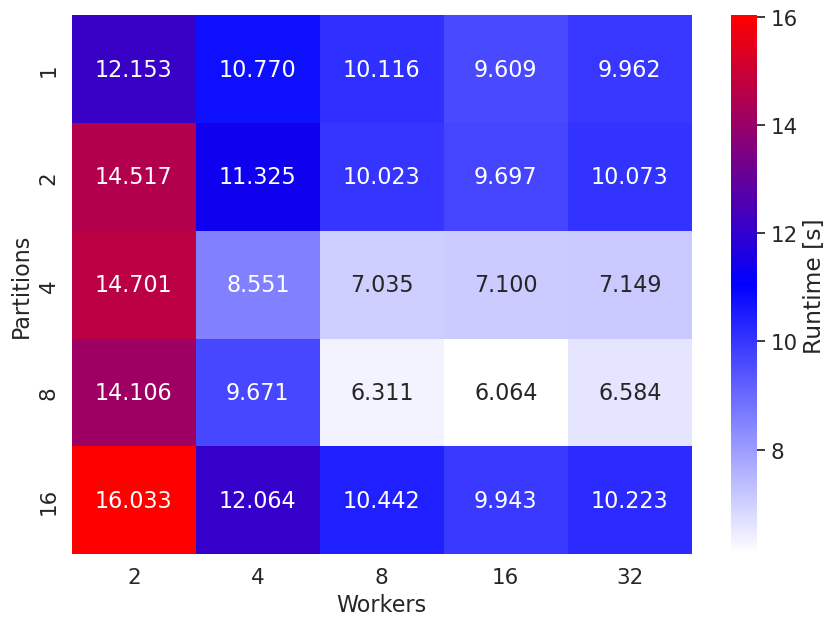

In [13]:
reshaped_durations = np.array(durations).reshape(len(npartitions), len(nworkers))
df_cm = pd.DataFrame(reshaped_durations, index=npartitions, columns=np.array(nworkers)*2)


# Plot the heatmap
plt.figure(figsize=(10,7))
sn.set(font_scale=1.4)  # for label size

# Define the custom color map from white to blue and then red
colors = ["white", "blue", "red"]
cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

sn.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt=".3f",
            cbar_kws={'label': 'Runtime [s]'}, cmap=cmap)
plt.xlabel('Workers', fontsize=16)
plt.ylabel('Partitions', fontsize=16)
plt.show()
plt.style.use('default')

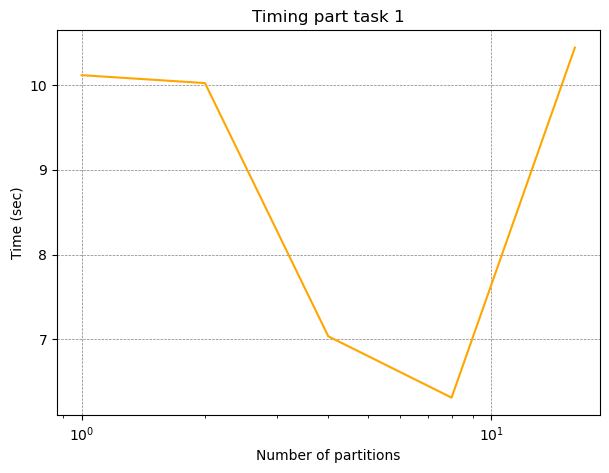

In [14]:
plt.figure(figsize=(7,5))
plt.plot(npartitions,reshaped_durations[:,2],c='orange')
plt.xscale('log')
plt.xlabel('Number of partitions')
plt.ylabel('Time (sec)')
plt.title('Timing part task 1')
plt.grid(color = 'gray', linestyle = '--', linewidth = 0.5)

In [15]:
client.close()
cluster.close()


## Benchmarking of task two

In [7]:
import numpy as np
import json
import os
import string
import pandas as pd
import time
from dask.distributed import Client, LocalCluster
import dask.bag as db
from dask.distributed import SpecCluster
from collections import Counter
from dask import delayed
import dask.dataframe as dd
import nltk
from nltk.corpus import stopwords
import string
import re
import matplotlib.pyplot as plt
import seaborn as sns
import time
from dask.distributed import Client, LocalCluster
import warnings
from mpl_toolkits.mplot3d import Axes3D
import tqdm
# Download stopwords only once
#nltk.download('stopwords')
import pycountry
# Create a list of stopwords in English
stopwords_list = stopwords.words('english')

# Set options for pandas to display all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


In [8]:
folder_path = '/home/wickramasinghemudiyanselage/comm_use_subset/comm_use_subset/'
file_list = os.listdir(folder_path)

In [9]:
translator = str.maketrans('', '', string.punctuation)
def extract_countries_from_paper(paper):
    extracted_countries = []

    if 'authors' in paper.get('metadata', {}):
        authors = paper['metadata']['authors']

        if authors:
            for author_info in authors:
                affiliation = author_info.get('affiliation', {})
                location = affiliation.get('location', {})
                country = location.get('country', '')

                if country:
                    extracted_countries.append(country)
                else:
                    extracted_countries.append('NN')
        else:
            extracted_countries.append('NAuthor')
    else:
        extracted_countries.append('NN')

    return extracted_countries


In [10]:
def replace_elements_in_list(original_list, elements_to_replace, replacement_elements):
    """
    Replace elements in a list based on a mapping.

    Args:
        original_list (list): The list to modify.
        elements_to_replace (list): List of elements to replace.
        replacement_elements (list): List of replacement elements.

    Returns:
        list: Modified list with replaced elements.
    """
    element_mapping = {old_elem: new_elem for old_elem, new_elem in zip(elements_to_replace, replacement_elements)}
    modified_list = [element_mapping.get(elem, elem) for elem in original_list]
    return modified_list


In [11]:
import re
from nltk.corpus import stopwords
#from nltk import download

def preprocess_and_filter_words(input_text):
    """
    Preprocess a text by cleaning and filtering its content.

    Args:
        input_text (str): Input text.

    Returns:
        list: List of filtered words.
    """
    # Remove non-alphabetic characters and clean the text
    cleaned_text = re.sub(r'[^a-zA-Z\s]', '', input_text)

    # Convert to lowercase, strip, and split into words
    words = list(set(cleaned_text.lower().strip().split()))

    # Download stopwords if not already available
    #download('stopwords')

    # Exclude common English stopwords
    stop_words = set(stopwords.words('english'))

    # Filter out stopwords
    filtered_words = [word for word in words if word.lower() not in stop_words]

    return filtered_words


In [12]:
def standardize_country_names(original_country_list, preprocessed_flattened_list):
    """
    Standardize country names based on predefined mapping lists.

    Args:
        original_country_list (list): List of original country names to process.
        preprocessed_flattened_list (list): Flattened list of preprocessed country names.

    Returns:
        list: List of standardized country names.
    """
    words_to_change = ['kingdom', 'america', 'zealand', 'arabia', 'us']
    replacement_words = ['uk', 'usa', 'newzealand', 'saudiarabia', 'usa']

    processed_nested_list = [preprocess_and_filter_words(name) for name in original_country_list]
    processed_flat_list = [item for sublist in processed_nested_list for item in sublist]
    selected_processed_list = [item for item in processed_flat_list if item in preprocessed_flattened_list]
    standardized_country_list = replace_elements_in_list(selected_processed_list, words_to_change, replacement_words)

    return standardized_country_list


In [13]:
def remove_values(original_list, values_to_remove):
    """
    Remove specified values from a list.

    Args:
        original_list (list): List to modify.
        values_to_remove (list): List of values to remove.

    Returns:
        list: Modified list with specified values removed.
    """
    filtered_list = [element for element in original_list if element not in values_to_remove]
    return filtered_list


In [14]:
from dask.distributed import Client, SSHCluster
scheduler = '10.67.22.110'
worker1 = '10.67.22.156'
worker2 = '10.67.22.62'

In [15]:
import string

from iso3166 import countries

translator = str.maketrans('', '', string.punctuation)

def load_json_data(filename):
    """
    Load JSON data from a file.

    Args:
        filename (str): Name of the JSON file.

    Returns:
        dict: Loaded JSON data as a dictionary.

    """
    with open(os.path.join(path, filename), 'r') as file:
        json_data = json.load(file)
    return json_data

In [16]:
countries = list(pycountry.countries)
clist2 = [country.name for country in countries]
nested_list_country2 = [preprocess_and_filter_words(word) for word in clist2]
flattened_list2 = list([item for sublist in nested_list_country2 for item in sublist])
flattened_list2.extend(['usa' , 'uk' , 'nn' , 'nauthor'])
flattened_list2 = remove_values(flattened_list2 , ['united' , 'states' , 'new' , 'peoples' , 'islamic' , 'republic' , 'saudi'])

In [17]:
path = '/home/wickramasinghemudiyanselage/comm_use_subset/comm_use_subset/'
file_list = os.listdir(path)
file_list = file_list[:1000]


In [14]:
# Define the lists of parameters
num_workers_list = [6,8,9,10,11,12]  # Different numbers of workers
threads_per_worker_list = [4]  # Different numbers of threads per worker
npartitions_list = [1,15,30,45,60,75]  # Different npartitions
n_paper = 1000
amount = 10

# Create an empty list to store the results
execution_times = []
i = 0
# Loop over the parameters
while i<5:
    for num_workers in tqdm.tqdm(num_workers_list):
        for threads_per_worker in tqdm.tqdm(threads_per_worker_list):
            for npartitions in tqdm.tqdm(npartitions_list):
                # Create a LocalCluster with the current parameters
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")

                    cluster = SSHCluster([scheduler,worker1, worker2],
                    scheduler_options={"port": 0, "dashboard_address": ":8888"},
                    connect_options={"known_hosts": None},
                    worker_options={"n_workers":num_workers})
                    
                    client = Client(cluster)

                    # Start the timer
                    start_time = time.time()


                    df_country = (
                        db.from_sequence(file_list[0:n_paper], partition_size=npartitions)
                        .map(load_json_data)
                        .map(extract_countries_from_paper)
                        .map(lambda x: standardize_country_names(x, flattened_list2))
                        .flatten()
                        .frequencies()
                        .to_dataframe(columns=['Country', 'Count'])
                        .nlargest(n=amount, columns='Count')
                    )

                    # Compute the result
                    result = df_country.compute()

                    # End the timer
                    end_time = time.time()
                    execution_time = end_time - start_time

                    # Store the execution time in the list
                    execution_times.append((2*num_workers, threads_per_worker, npartitions, execution_time))

                    # Close the Dask client and cluster
                    client.close()
                    cluster.close()
    i = i+1

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/6 [00:00<?, ?it/s]2024-01-28 21:01:58,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:01:58,697 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:01:58,701 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:01:58,701 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:01:58,702 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 41299 instead
2024-01-28 21:01:58,702 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:01:58,726 - distributed.deploy.ssh - INFO - 2024-01-28 21:01:58,725 - distributed.scheduler - INF

2024-01-28 21:02:00,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,032 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-scnqjrx3', purging
2024-01-28 21:02:00,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,032 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-c5gkffct', purging
2024-01-28 21:02:00,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,032 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cmwa6hwa', purging
2024-01-28 21:02:00,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,032 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0iuwlh0u', purging
2024-01-28 21:02:00,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,032 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jsqiq6ob'

2024-01-28 21:02:00,185 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,179 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ywjhjqsf
2024-01-28 21:02:00,185 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,179 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:00,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,186 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36605
2024-01-28 21:02:00,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,186 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36605
2024-01-28 21:02:00,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,186 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35971
2024-01-28 21:02:00,197 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:00,186 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36993
2024-01-28 21:0

2024-01-28 21:02:06,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:06,846 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39821'
2024-01-28 21:02:06,860 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:06,858 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34835'
2024-01-28 21:02:06,866 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:06,857 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41771'
2024-01-28 21:02:06,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:06,865 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44749'
2024-01-28 21:02:06,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:06,865 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38921'
2024-01-28 21:02:06,876 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:06,872 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45731'
2024-01-28 21:02:06,882 - distr

2024-01-28 21:02:07,331 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,322 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38985
2024-01-28 21:02:07,331 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,322 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35167
2024-01-28 21:02:07,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,322 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:07,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,322 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:07,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,322 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:07,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,322 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6bpfuucg
2024-01-28 21:0

2024-01-28 21:02:07,456 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,451 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:07,548 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,539 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41009
2024-01-28 21:02:07,549 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,539 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41009
2024-01-28 21:02:07,549 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,539 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37053
2024-01-28 21:02:07,549 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,539 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35167
2024-01-28 21:02:07,550 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:07,539 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:07,550 - di

2024-01-28 21:02:12,670 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,666 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:12,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,666 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:12,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,666 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:12,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,666 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pc07k9wr
2024-01-28 21:02:12,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,666 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:12,688 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,679 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/w

2024-01-28 21:02:12,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,811 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41235
2024-01-28 21:02:12,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,811 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34405
2024-01-28 21:02:12,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,812 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:12,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,812 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:12,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,812 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:12,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:12,812 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5iw2sovp
2024-01-28 21:0

2024-01-28 21:02:17,573 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,564 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33837'
2024-01-28 21:02:17,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,566 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40243'
2024-01-28 21:02:17,581 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,572 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39889'
2024-01-28 21:02:17,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,580 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43823'
2024-01-28 21:02:17,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,913 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7d9f0cek', purging
2024-01-28 21:02:17,917 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,914 - distributed.diskutils - INFO - Found stale lock file and directory

2024-01-28 21:02:18,000 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,996 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:18,000 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,996 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:18,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,996 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-nzsspcij
2024-01-28 21:02:18,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:17,996 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:18,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:18,065 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34667
2024-01-28 21:02:18,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:18,065 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34667
2024-01-28 21:0

2024-01-28 21:02:18,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:18,208 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34693
2024-01-28 21:02:18,218 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:18,208 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34661
2024-01-28 21:02:18,218 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:18,208 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41295
2024-01-28 21:02:18,219 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:18,208 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:18,219 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:18,208 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:18,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:18,208 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:18,220 - di

2024-01-28 21:02:23,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,330 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:23,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,333 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41171
2024-01-28 21:02:23,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,333 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41171
2024-01-28 21:02:23,345 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,333 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33107
2024-01-28 21:02:23,345 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,333 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41173
2024-01-28 21:02:23,345 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,333 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:23,346 - di

2024-01-28 21:02:23,475 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,468 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:23,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,468 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:23,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,468 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rz5dir_h
2024-01-28 21:02:23,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,468 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:23,560 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,551 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46091
2024-01-28 21:02:23,561 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:23,551 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46091
2024-01-28 21:0

2024-01-28 21:02:28,309 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,301 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42953'
2024-01-28 21:02:28,604 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,601 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-sw2u9z3w', purging
2024-01-28 21:02:28,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,602 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2kbtuuxv', purging
2024-01-28 21:02:28,606 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,602 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-j6t271_z', purging
2024-01-28 21:02:28,606 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,602 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rz5dir_h', purging
2024-01-28 21:02:28,606 - dist

2024-01-28 21:02:28,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,696 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:28,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,777 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36079
2024-01-28 21:02:28,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,777 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36079
2024-01-28 21:02:28,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,777 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36503
2024-01-28 21:02:28,781 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,777 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45907
2024-01-28 21:02:28,781 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,777 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:28,782 - di

2024-01-28 21:02:28,892 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,881 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:28,893 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,881 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:28,893 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,881 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hy48_wbj
2024-01-28 21:02:28,893 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,881 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:28,922 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,919 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45075
2024-01-28 21:02:28,963 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:28,954 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41039


100%|████████

2024-01-28 21:02:34,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,007 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hy48_wbj', purging
2024-01-28 21:02:34,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,007 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6fd20ckw', purging
2024-01-28 21:02:34,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,008 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0bg0p5s3', purging
2024-01-28 21:02:34,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,029 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45675
2024-01-28 21:02:34,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,029 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45675
2024-01-28 21:02:34,040 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:02:34,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,179 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35179
2024-01-28 21:02:34,191 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,179 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39555
2024-01-28 21:02:34,191 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,179 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:34,191 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,179 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:34,192 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,179 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:34,192 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,179 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-wic5yf4u
2024-01-28 21:0

2024-01-28 21:02:34,274 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,261 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:34,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,271 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42133
2024-01-28 21:02:34,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,271 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42133
2024-01-28 21:02:34,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,271 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38125
2024-01-28 21:02:34,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,271 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39555
2024-01-28 21:02:34,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:34,271 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:34,278 - di

2024-01-28 21:02:41,740 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,735 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-t35z9ffe', purging
2024-01-28 21:02:41,740 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,735 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ae0zqkvq', purging
2024-01-28 21:02:41,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,775 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33447
2024-01-28 21:02:41,784 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,781 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33447
2024-01-28 21:02:41,784 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,781 - distributed.worker - INFO -          dashboard at:          10.67.22.62:32819
2024-01-28 21:02:41,786 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,781 - distributed.worker - INFO 

2024-01-28 21:02:41,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,861 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33925
2024-01-28 21:02:41,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,861 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33159
2024-01-28 21:02:41,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,861 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:41,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,861 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:41,872 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,861 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:41,872 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,861 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8aqymuqo
2024-01-28 21:0

2024-01-28 21:02:41,936 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,923 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:41,952 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,942 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46831
2024-01-28 21:02:41,953 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,943 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46831
2024-01-28 21:02:41,953 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,943 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39939
2024-01-28 21:02:41,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,943 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33159
2024-01-28 21:02:41,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:41,945 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:41,956 - di

2024-01-28 21:02:47,118 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,109 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41505'
2024-01-28 21:02:47,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,110 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40209'
2024-01-28 21:02:47,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,121 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39993'
2024-01-28 21:02:47,131 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,129 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38845'
2024-01-28 21:02:47,134 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,126 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37597'
2024-01-28 21:02:47,145 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,143 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36943'
2024-01-28 21:02:47,154 - distr

2024-01-28 21:02:47,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,724 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33817
2024-01-28 21:02:47,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,724 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40981
2024-01-28 21:02:47,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,724 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:47,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,724 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:47,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,724 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:47,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,724 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hy2e7lpy
2024-01-28 21:0

2024-01-28 21:02:47,836 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,829 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:47,838 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,827 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38659
2024-01-28 21:02:47,838 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,827 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38659
2024-01-28 21:02:47,838 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,828 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38517
2024-01-28 21:02:47,839 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,828 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40981
2024-01-28 21:02:47,839 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,828 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:47,839 - di

2024-01-28 21:02:47,941 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,931 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:47,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,931 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:47,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,931 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:47,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,931 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-iawmmd1q
2024-01-28 21:02:47,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,931 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:47,973 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:47,964 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36305


 50%|████████

2024-01-28 21:02:53,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,498 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46231
2024-01-28 21:02:53,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,499 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:53,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,499 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:53,504 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,499 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:53,504 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,499 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vgvmfdh2
2024-01-28 21:02:53,504 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,499 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:02:53,616 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,603 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:53,678 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,669 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39475
2024-01-28 21:02:53,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,670 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39475
2024-01-28 21:02:53,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,670 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37667
2024-01-28 21:02:53,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,670 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46231
2024-01-28 21:02:53,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,670 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:53,681 - di

2024-01-28 21:02:53,721 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,702 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:53,721 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,702 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:53,721 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,702 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-r_h4cpc9
2024-01-28 21:02:53,722 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,702 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:53,747 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,745 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44483
2024-01-28 21:02:53,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:53,770 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35587
2024-01-28 21:0

2024-01-28 21:02:59,743 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,737 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ma38ynen', purging
2024-01-28 21:02:59,744 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,737 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8mfy0v_f', purging
2024-01-28 21:02:59,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,738 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7930d1qv', purging
2024-01-28 21:02:59,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,738 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vgvmfdh2', purging
2024-01-28 21:02:59,747 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,738 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5m06tkfj'

2024-01-28 21:02:59,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,780 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:59,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,819 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46691
2024-01-28 21:02:59,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,819 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46691
2024-01-28 21:02:59,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,819 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39177
2024-01-28 21:02:59,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,819 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44849
2024-01-28 21:02:59,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,819 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:59,824 - di

2024-01-28 21:02:59,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,901 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:02:59,914 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,901 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:02:59,914 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,901 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cykpy624
2024-01-28 21:02:59,914 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,901 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:02:59,915 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,911 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45413
2024-01-28 21:02:59,917 - distributed.deploy.ssh - INFO - 2024-01-28 21:02:59,913 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45413
2024-01-28 21:0

2024-01-28 21:03:05,586 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:05,583 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39597'
2024-01-28 21:03:05,597 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:05,588 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34527'
2024-01-28 21:03:05,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:05,597 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33637'
2024-01-28 21:03:05,603 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:05,594 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43185'
2024-01-28 21:03:05,606 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:05,604 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44261'
2024-01-28 21:03:05,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:05,598 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34809'
2024-01-28 21:03:05,612 - distr

2024-01-28 21:03:06,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,167 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:06,207 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,205 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42357
2024-01-28 21:03:06,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,209 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42357
2024-01-28 21:03:06,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,209 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45377
2024-01-28 21:03:06,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,209 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33971
2024-01-28 21:03:06,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,209 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:06,213 - di

2024-01-28 21:03:06,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,270 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:06,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,270 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:06,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,270 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x7u66hk3
2024-01-28 21:03:06,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,270 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:06,296 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,286 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45049
2024-01-28 21:03:06,296 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,286 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45049
2024-01-28 21:0

2024-01-28 21:03:06,408 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,399 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34899
2024-01-28 21:03:06,409 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,399 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37531
2024-01-28 21:03:06,409 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,399 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33971
2024-01-28 21:03:06,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,399 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:06,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,399 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:06,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:06,399 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:06,411 - di

2024-01-28 21:03:12,456 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,444 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:12,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,448 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:12,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,448 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-95mboed0
2024-01-28 21:03:12,458 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,448 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:12,463 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,460 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rrxsgto9', purging
2024-01-28 21:03:12,465 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,461 - distributed.diskutils - INFO - Found stale lock file 

2024-01-28 21:03:12,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,627 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36879
2024-01-28 21:03:12,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,627 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41483
2024-01-28 21:03:12,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,627 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41631
2024-01-28 21:03:12,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,627 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:12,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,627 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:12,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,627 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:12,632 - di

2024-01-28 21:03:12,758 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,752 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xmo42gb3
2024-01-28 21:03:12,758 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,752 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:12,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,769 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35819
2024-01-28 21:03:12,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,770 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35819
2024-01-28 21:03:12,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,770 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34955
2024-01-28 21:03:12,781 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:12,770 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41631
2024-01-28 21:0

2024-01-28 21:03:19,249 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:03:19,249 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:03:19,250 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 42683 instead
2024-01-28 21:03:19,251 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:03:19,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:19,277 - distributed.scheduler - INFO - State start
2024-01-28 21:03:19,281 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:19,280 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:35747
2024-01-28 21:03:19,960 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:19,958 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37761'
2024-01-28 21:03:19,966 - distributed.deploy.ssh - INFO - 2024-01-2

2024-01-28 21:03:20,561 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,550 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d7v0wjbu', purging
2024-01-28 21:03:20,561 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,550 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_bp9a5ts', purging
2024-01-28 21:03:20,587 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,577 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42185
2024-01-28 21:03:20,587 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,577 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42185
2024-01-28 21:03:20,588 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,577 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43983
2024-01-28 21:03:20,588 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,577 - distributed.worker - INFO 

2024-01-28 21:03:20,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,773 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35747
2024-01-28 21:03:20,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,773 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:20,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,773 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:20,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,773 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:20,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,773 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bad8isse
2024-01-28 21:03:20,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,774 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:03:20,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,881 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41989
2024-01-28 21:03:20,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,881 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41989
2024-01-28 21:03:20,892 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,881 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46433
2024-01-28 21:03:20,892 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,881 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35747
2024-01-28 21:03:20,892 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,881 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:20,893 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:20,881 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:20,893 - di

2024-01-28 21:03:26,050 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,048 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43759'
2024-01-28 21:03:26,051 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,041 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43863'
2024-01-28 21:03:26,057 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,048 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46429'
2024-01-28 21:03:26,065 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,056 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44537'
2024-01-28 21:03:26,076 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,067 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43767'
2024-01-28 21:03:26,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,079 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45051'
2024-01-28 21:03:26,091 - dist

2024-01-28 21:03:26,678 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,672 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:26,707 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,704 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46197
2024-01-28 21:03:26,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,707 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46197
2024-01-28 21:03:26,710 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,707 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38551
2024-01-28 21:03:26,711 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,707 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35653
2024-01-28 21:03:26,711 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,707 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:26,712 - di

2024-01-28 21:03:26,811 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,805 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:26,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,805 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:26,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,805 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-h40zjm_n
2024-01-28 21:03:26,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,805 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:26,830 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,821 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41071
2024-01-28 21:03:26,832 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,821 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41071
2024-01-28 21:0

2024-01-28 21:03:26,979 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,969 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38063
2024-01-28 21:03:26,979 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,969 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40689
2024-01-28 21:03:26,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,969 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35653
2024-01-28 21:03:26,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,969 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:26,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,969 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:26,981 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:26,969 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:26,983 - di

2024-01-28 21:03:32,564 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:32,555 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40157'
2024-01-28 21:03:33,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,037 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-f8vojufu', purging
2024-01-28 21:03:33,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,038 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-j9esavo0', purging
2024-01-28 21:03:33,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,038 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-u9mhe_7h', purging
2024-01-28 21:03:33,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,038 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-j7krkom0', purging
2024-01-28 21:03:33,043 - dist

2024-01-28 21:03:33,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,111 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34603
2024-01-28 21:03:33,124 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,115 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34603
2024-01-28 21:03:33,126 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,116 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46223
2024-01-28 21:03:33,126 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,116 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33829
2024-01-28 21:03:33,127 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,116 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:33,127 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,116 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:33,127 - di

2024-01-28 21:03:33,232 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,219 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:33,232 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,219 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ra8w1cub
2024-01-28 21:03:33,232 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,220 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:33,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,239 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37999
2024-01-28 21:03:33,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,239 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37999
2024-01-28 21:03:33,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,239 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46293
2024-01-28 21:0

2024-01-28 21:03:33,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,355 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33829
2024-01-28 21:03:33,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,355 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:33,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,355 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:33,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,355 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:33,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,355 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-n20w5o6q
2024-01-28 21:03:33,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:33,356 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:03:39,403 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,394 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-r5ohjqrl', purging
2024-01-28 21:03:39,403 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,394 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4_sk0731', purging
2024-01-28 21:03:39,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,433 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40893
2024-01-28 21:03:39,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,433 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40893
2024-01-28 21:03:39,438 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,433 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46275
2024-01-28 21:03:39,438 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,433 - distributed.worker - INFO 

2024-01-28 21:03:39,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,620 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42533
2024-01-28 21:03:39,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,620 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37637
2024-01-28 21:03:39,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,620 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40413
2024-01-28 21:03:39,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,620 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:39,625 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,620 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:39,625 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,620 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:39,626 - di

2024-01-28 21:03:39,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,693 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-qjxgepha
2024-01-28 21:03:39,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,693 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:39,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,725 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43523
2024-01-28 21:03:39,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,733 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43523
2024-01-28 21:03:39,737 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,733 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45389
2024-01-28 21:03:39,737 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,733 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40413
2024-01-28 21:0

2024-01-28 21:03:39,936 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,932 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:39,937 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,932 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:39,937 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,932 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:39,944 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,942 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-npm525ry
2024-01-28 21:03:39,945 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:39,942 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:40,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:40,005 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35739
2024-01-28 21:0

2024-01-28 21:03:45,449 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,444 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:45,471 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,462 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zkbvq7_w', purging
2024-01-28 21:03:45,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,463 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7digfdqv', purging
2024-01-28 21:03:45,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,463 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_llg3bfs', purging
2024-01-28 21:03:45,474 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,463 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-360l54xi', purging
2024-01-28 21:03:45,474 - dist

2024-01-28 21:03:45,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,738 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42435
2024-01-28 21:03:45,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,738 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:45,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,738 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:45,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,738 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:45,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,738 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-z6o1m5sp
2024-01-28 21:03:45,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,738 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:03:45,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,814 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41171
2024-01-28 21:03:45,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,814 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41171
2024-01-28 21:03:45,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,814 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44913
2024-01-28 21:03:45,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,814 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42435
2024-01-28 21:03:45,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,814 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:45,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:45,814 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:45,826 - di

2024-01-28 21:03:50,160 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:03:50,160 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:03:50,161 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 34245 instead
2024-01-28 21:03:50,162 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:03:50,184 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:50,184 - distributed.scheduler - INFO - State start
2024-01-28 21:03:50,187 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:50,186 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:40199
2024-01-28 21:03:50,890 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:50,881 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39749'
2024-01-28 21:03:50,892 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:03:51,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,503 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:51,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,503 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:51,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,503 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_99y_3pl
2024-01-28 21:03:51,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,503 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:51,515 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,500 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-v26yik0u', purging
2024-01-28 21:03:51,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,522 - distributed.worker - INFO -       Start worker at:   

2024-01-28 21:03:51,743 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,740 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43721
2024-01-28 21:03:51,744 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,741 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43721
2024-01-28 21:03:51,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,741 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33241
2024-01-28 21:03:51,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,741 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40199
2024-01-28 21:03:51,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,741 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:51,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,741 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:51,747 - di

2024-01-28 21:03:51,875 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,863 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:51,876 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,863 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sf5petli
2024-01-28 21:03:51,876 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,863 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:51,878 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,871 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38669
2024-01-28 21:03:51,878 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,871 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38669
2024-01-28 21:03:51,878 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:51,871 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43841
2024-01-28 21:0

2024-01-28 21:03:52,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:52,043 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45211
2024-01-28 21:03:52,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:52,044 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40199
2024-01-28 21:03:52,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:52,044 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:52,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:52,044 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:52,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:52,044 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:52,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:52,044 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cc5r9nqo
2024-01-28 21:0

2024-01-28 21:03:59,594 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,590 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vzf7k6c7', purging
2024-01-28 21:03:59,594 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,590 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zym_q7sw', purging
2024-01-28 21:03:59,594 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,590 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-y79wg3r5', purging
2024-01-28 21:03:59,595 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,590 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-s9_2fm1d', purging
2024-01-28 21:03:59,596 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,590 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_99y_3pl'

2024-01-28 21:03:59,752 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,747 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:59,753 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,747 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2nyg3yt_
2024-01-28 21:03:59,753 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,747 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:59,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,789 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37713
2024-01-28 21:03:59,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,789 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37713
2024-01-28 21:03:59,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,789 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45073
2024-01-28 21:0

2024-01-28 21:03:59,895 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,890 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43099
2024-01-28 21:03:59,896 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,890 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:03:59,896 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,893 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:03:59,897 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,894 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:03:59,897 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,894 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-kjg2cmxn
2024-01-28 21:03:59,904 - distributed.deploy.ssh - INFO - 2024-01-28 21:03:59,901 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:04:00,003 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:00,000 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45635
2024-01-28 21:04:00,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:00,044 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33371
2024-01-28 21:04:00,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:00,044 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33371
2024-01-28 21:04:00,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:00,044 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33245
2024-01-28 21:04:00,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:00,044 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43099
2024-01-28 21:04:00,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:00,044 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:00,055 - di

2024-01-28 21:04:06,490 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,485 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o1k6b0ho', purging
2024-01-28 21:04:06,490 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,485 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rk8jprrr', purging
2024-01-28 21:04:06,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,485 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-kjg2cmxn', purging
2024-01-28 21:04:06,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,485 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2nyg3yt_', purging
2024-01-28 21:04:06,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,486 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_sa8zxhj'

2024-01-28 21:04:06,784 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,780 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46533
2024-01-28 21:04:06,785 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,780 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:06,785 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,780 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:06,785 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,780 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:06,786 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,780 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-w5l1fhzz
2024-01-28 21:04:06,786 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,780 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:04:06,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,924 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:06,931 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,924 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38741
2024-01-28 21:04:06,931 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,924 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38741
2024-01-28 21:04:06,931 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,924 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40765
2024-01-28 21:04:06,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,925 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37091
2024-01-28 21:04:06,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:06,925 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34063
2024-01-28 21:04:06,932 - di

2024-01-28 21:04:07,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:07,029 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:07,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:07,029 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:07,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:07,029 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-y_hux7hn
2024-01-28 21:04:07,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:07,030 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:07,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:07,037 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44013
2024-01-28 21:04:07,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:07,037 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44013
2024-01-28 21:0

2024-01-28 21:04:12,920 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:12,918 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33635'
2024-01-28 21:04:12,927 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:12,925 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43167'
2024-01-28 21:04:12,933 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:12,930 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44401'
2024-01-28 21:04:12,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:12,936 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38527'
2024-01-28 21:04:12,986 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:12,983 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45341'
2024-01-28 21:04:13,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,004 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44743'
2024-01-28 21:04:13,034 - distribu

2024-01-28 21:04:13,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,512 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36425
2024-01-28 21:04:13,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,512 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:13,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,513 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:13,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,513 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:13,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,513 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-r70fafef
2024-01-28 21:04:13,526 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,513 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:04:13,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,678 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:13,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,678 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:13,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,678 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9gey93uh
2024-01-28 21:04:13,693 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,678 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:13,693 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,680 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42597
2024-01-28 21:04:13,693 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,680 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42597
2024-01-28 21:0

2024-01-28 21:04:13,811 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,801 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42135
2024-01-28 21:04:13,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,801 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36425
2024-01-28 21:04:13,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,801 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:13,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,801 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:13,814 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,801 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:13,814 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:13,801 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ih2a_p3e
2024-01-28 21:0

2024-01-28 21:04:18,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:18,577 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:45761
2024-01-28 21:04:19,261 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,258 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42151'
2024-01-28 21:04:19,266 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,264 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42177'
2024-01-28 21:04:19,272 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,263 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38005'
2024-01-28 21:04:19,275 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,272 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34937'
2024-01-28 21:04:19,278 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,269 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45955'
2024-01-28 21:04:19,287 - distribute

2024-01-28 21:04:19,896 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,886 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5xr7h50c', purging
2024-01-28 21:04:19,897 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,887 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xuq3euye', purging
2024-01-28 21:04:19,898 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,887 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ed5j6wsn', purging
2024-01-28 21:04:19,898 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,887 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9gey93uh', purging
2024-01-28 21:04:19,899 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:19,887 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-r70fafef'

2024-01-28 21:04:20,106 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,102 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41765
2024-01-28 21:04:20,106 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,102 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45761
2024-01-28 21:04:20,106 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,102 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:20,107 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,102 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:20,107 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,102 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:20,108 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,102 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cxs0ghjp
2024-01-28 21:0

2024-01-28 21:04:20,240 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,233 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:20,278 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,268 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39625
2024-01-28 21:04:20,278 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,268 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39625
2024-01-28 21:04:20,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,268 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34269
2024-01-28 21:04:20,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,268 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45761
2024-01-28 21:04:20,280 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,268 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:20,280 - di

2024-01-28 21:04:20,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,446 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:20,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,446 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:20,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,447 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:20,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,447 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-nqlwk6qt
2024-01-28 21:04:20,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,447 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:20,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:20,474 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37819


 83%|████████

2024-01-28 21:04:25,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:25,763 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tctfsj03', purging
2024-01-28 21:04:25,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:25,763 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jg491cx1', purging
2024-01-28 21:04:25,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:25,763 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-eka7uhko', purging
2024-01-28 21:04:25,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:25,764 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-f40095vh', purging
2024-01-28 21:04:25,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:25,767 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1msdxull'

2024-01-28 21:04:26,097 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,091 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:26,098 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,094 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37291
2024-01-28 21:04:26,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,095 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43941
2024-01-28 21:04:26,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,096 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43941
2024-01-28 21:04:26,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,096 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46695
2024-01-28 21:04:26,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,096 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46267
2024-01-28 21:04:26,101 - di

2024-01-28 21:04:26,178 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,164 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:26,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,164 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:26,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,164 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6hw19l95
2024-01-28 21:04:26,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,164 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:26,228 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,213 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42933
2024-01-28 21:04:26,228 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,219 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42933
2024-01-28 21:0

2024-01-28 21:04:26,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,273 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45345
2024-01-28 21:04:26,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,273 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46267
2024-01-28 21:04:26,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,273 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:26,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,273 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:26,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,273 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:26,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:26,273 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-kti5iv6w
2024-01-28 21:0

2024-01-28 21:04:31,994 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:31,990 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0zzwmbz3', purging
2024-01-28 21:04:31,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:31,990 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qjddh_o2', purging
2024-01-28 21:04:31,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:31,990 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fk9vbmzo', purging
2024-01-28 21:04:31,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:31,990 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hunhl8ya', purging
2024-01-28 21:04:31,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:31,990 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rm6k0g1j'

2024-01-28 21:04:32,352 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,348 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33945
2024-01-28 21:04:32,352 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,348 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46181
2024-01-28 21:04:32,353 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,348 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41781
2024-01-28 21:04:32,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,354 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:32,357 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,354 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:32,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,354 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:32,358 - di

2024-01-28 21:04:32,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,442 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7o47cpgm
2024-01-28 21:04:32,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,442 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:32,507 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,498 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39767
2024-01-28 21:04:32,508 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,498 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39767
2024-01-28 21:04:32,508 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,498 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43747
2024-01-28 21:04:32,508 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,498 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41781
2024-01-28 21:0

2024-01-28 21:04:32,719 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,713 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:32,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,713 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:32,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,713 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:32,721 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,713 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bhu59aw6
2024-01-28 21:04:32,721 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,714 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:32,722 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,713 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33659
2024-01-28 21:0

2024-01-28 21:04:32,838 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,829 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:04:32,840 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,830 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:41781
2024-01-28 21:04:32,840 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,830 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:32,844 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,834 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:04:32,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,835 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:41781
2024-01-28 21:04:32,847 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:32,835 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:32,851 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:04:40,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,488 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46009
2024-01-28 21:04:40,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,488 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42601
2024-01-28 21:04:40,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,489 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:40,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,489 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:40,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,489 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:40,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,489 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cswjw1tx
2024-01-28 21:0

2024-01-28 21:04:40,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,811 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42601
2024-01-28 21:04:40,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,811 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:40,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,811 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:40,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,811 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:40,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,811 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x500j3ju
2024-01-28 21:04:40,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,811 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:04:40,987 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,984 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38249
2024-01-28 21:04:40,987 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,984 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38249
2024-01-28 21:04:40,989 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,984 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35053
2024-01-28 21:04:40,989 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,984 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42601
2024-01-28 21:04:40,989 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,985 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:40,990 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:40,985 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:40,990 - di

2024-01-28 21:04:41,065 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:41,060 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:41,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:41,060 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ulg4jg94
2024-01-28 21:04:41,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:41,060 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:41,075 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:41,072 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42211
2024-01-28 21:04:41,077 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:41,067 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38877
2024-01-28 21:04:41,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:41,067 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38877
2024-01-28 21:0

2024-01-28 21:04:46,086 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:04:46,086 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:04:46,086 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 43495 instead
2024-01-28 21:04:46,087 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:04:46,111 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:46,111 - distributed.scheduler - INFO - State start
2024-01-28 21:04:46,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:46,114 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:46403
2024-01-28 21:04:46,790 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:46,788 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43557'
2024-01-28 21:04:46,799 - distributed.deploy.ssh - INFO - 2024-01-2

2024-01-28 21:04:47,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,463 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0jf7vr8t', purging
2024-01-28 21:04:47,475 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,463 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-k52i6uu8', purging
2024-01-28 21:04:47,475 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,463 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zk5hxwvk', purging
2024-01-28 21:04:47,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,463 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4lri2gtj', purging
2024-01-28 21:04:47,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,463 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jf6m_c3f'

2024-01-28 21:04:47,653 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,642 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40661
2024-01-28 21:04:47,653 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,642 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46403
2024-01-28 21:04:47,653 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,642 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:47,654 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,642 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:47,654 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,642 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:47,655 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,642 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-uzuchpi_
2024-01-28 21:0

2024-01-28 21:04:47,799 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,786 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:47,873 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,870 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41737
2024-01-28 21:04:47,873 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,870 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41737
2024-01-28 21:04:47,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,870 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39585
2024-01-28 21:04:47,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,870 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46403
2024-01-28 21:04:47,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,870 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:47,875 - di

2024-01-28 21:04:47,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,949 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:47,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,949 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:47,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,949 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-a4va686z
2024-01-28 21:04:47,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,949 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:47,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,942 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43281
2024-01-28 21:04:47,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:47,942 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43281
2024-01-28 21:0

2024-01-28 21:04:53,025 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,016 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38621'
2024-01-28 21:04:53,031 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,029 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45653'
2024-01-28 21:04:53,045 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,036 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46747'
2024-01-28 21:04:53,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,047 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43871'
2024-01-28 21:04:53,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,056 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39805'
2024-01-28 21:04:53,072 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,069 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37485'
2024-01-28 21:04:53,082 - distr

2024-01-28 21:04:53,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,615 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:53,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,615 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:53,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,615 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:53,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,616 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sywdwlwv
2024-01-28 21:04:53,621 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,616 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:53,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,710 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44191
2024-01-28 21:0

2024-01-28 21:04:53,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,934 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44895
2024-01-28 21:04:53,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,934 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45819
2024-01-28 21:04:53,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,934 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33543
2024-01-28 21:04:53,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,934 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:53,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,934 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:53,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,934 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:53,939 - di

2024-01-28 21:04:54,005 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:53,999 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-v4409tf_
2024-01-28 21:04:54,005 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,000 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:54,015 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,013 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34329
2024-01-28 21:04:54,017 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,013 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34329
2024-01-28 21:04:54,017 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,013 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33303
2024-01-28 21:04:54,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,013 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33543
2024-01-28 21:0

2024-01-28 21:04:54,131 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,119 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:54,131 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,119 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:04:54,131 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,119 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:04:54,132 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,119 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vn3dyngk
2024-01-28 21:04:54,132 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,120 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:04:54,166 - distributed.deploy.ssh - INFO - 2024-01-28 21:04:54,164 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36749
2024-01-28 21:0

2024-01-28 21:05:00,202 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,198 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-v4409tf_', purging
2024-01-28 21:05:00,203 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,198 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-wzks7_3f', purging
2024-01-28 21:05:00,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,201 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-te0z40t2', purging
2024-01-28 21:05:00,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,202 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1ij3xx5v', purging
2024-01-28 21:05:00,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,202 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-wgr6v3go'

2024-01-28 21:05:00,545 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,534 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38155
2024-01-28 21:05:00,545 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,534 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:00,546 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,534 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:00,546 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,534 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:00,546 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,534 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-u7hg9t6l
2024-01-28 21:05:00,548 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,535 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:05:00,670 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,666 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36491
2024-01-28 21:05:00,670 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,666 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36491
2024-01-28 21:05:00,670 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,666 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39157
2024-01-28 21:05:00,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,666 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38155
2024-01-28 21:05:00,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,666 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:00,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,666 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:00,672 - di

2024-01-28 21:05:00,844 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,832 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:00,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,833 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2thsryaq
2024-01-28 21:05:00,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,833 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:00,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,842 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37847
2024-01-28 21:05:00,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,842 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37847
2024-01-28 21:05:00,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:00,842 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39869
2024-01-28 21:0

 83%|█████████████████████████████████████▌       | 5/6 [00:34<00:06,  6.61s/it]2024-01-28 21:05:05,380 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:05,379 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:05:05,383 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:05:05,384 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:05:05,385 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 38077 instead
2024-01-28 21:05:05,386 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:05:05,406 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:05,405 - distributed.scheduler - INFO - State start
2024-01-28 21:05:05,408 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:05:06,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,828 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-dfjkuky8', purging
2024-01-28 21:05:06,839 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,828 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_9oldhqc', purging
2024-01-28 21:05:06,839 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,828 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9h3v7ge2', purging
2024-01-28 21:05:06,839 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,829 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2thsryaq', purging
2024-01-28 21:05:06,840 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,829 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bpoock1u'

2024-01-28 21:05:07,000 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,997 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37021
2024-01-28 21:05:07,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,997 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34893
2024-01-28 21:05:07,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,997 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38047
2024-01-28 21:05:07,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,997 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:07,002 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,997 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:07,002 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:06,997 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:07,003 - di

2024-01-28 21:05:07,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,102 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hkssjy7e
2024-01-28 21:05:07,115 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,102 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:07,134 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,131 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37191
2024-01-28 21:05:07,134 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,131 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37191
2024-01-28 21:05:07,136 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,131 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36321
2024-01-28 21:05:07,136 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,131 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38047
2024-01-28 21:0

2024-01-28 21:05:07,254 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,248 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:07,255 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,248 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:07,255 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,248 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:07,255 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,248 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5ocwstyx
2024-01-28 21:05:07,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,248 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:07,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:07,249 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36435
2024-01-28 21:0

2024-01-28 21:05:12,530 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:12,528 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39421'
2024-01-28 21:05:12,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:12,526 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44671'
2024-01-28 21:05:12,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:12,562 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41339'
2024-01-28 21:05:12,568 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:12,559 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45423'
2024-01-28 21:05:12,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:12,580 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33797'
2024-01-28 21:05:12,601 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:12,599 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37767'
2024-01-28 21:05:12,607 - distr

2024-01-28 21:05:13,149 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,136 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1tyq1hzx', purging
2024-01-28 21:05:13,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,179 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46157
2024-01-28 21:05:13,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,179 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46157
2024-01-28 21:05:13,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,179 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46705
2024-01-28 21:05:13,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,179 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42839
2024-01-28 21:05:13,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,179 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:05:13,449 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,437 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:13,449 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,437 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:13,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,437 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:13,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,437 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-q8mg1fp7
2024-01-28 21:05:13,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,437 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:13,540 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,537 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36269
2024-01-28 21:0

2024-01-28 21:05:13,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,642 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38189
2024-01-28 21:05:13,646 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,642 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40013
2024-01-28 21:05:13,646 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,642 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42839
2024-01-28 21:05:13,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,643 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:13,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,643 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:13,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,643 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:13,649 - di

2024-01-28 21:05:13,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,731 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45779
2024-01-28 21:05:13,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,731 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43263
2024-01-28 21:05:13,743 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,731 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42839
2024-01-28 21:05:13,743 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,731 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:13,743 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,731 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:13,744 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:13,731 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:13,744 - di

2024-01-28 21:05:21,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,025 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42417'
2024-01-28 21:05:21,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,035 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33757'
2024-01-28 21:05:21,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,033 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42225'
2024-01-28 21:05:21,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,045 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40329'
2024-01-28 21:05:21,050 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,041 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45783'
2024-01-28 21:05:21,059 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,049 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45461'
2024-01-28 21:05:21,090 - dist

2024-01-28 21:05:21,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,600 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-q8mg1fp7', purging
2024-01-28 21:05:21,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,600 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-doqsx_cw', purging
2024-01-28 21:05:21,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,600 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qt0c5mj3', purging
2024-01-28 21:05:21,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,601 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xievgfoc', purging
2024-01-28 21:05:21,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,601 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_n6g46l8'

2024-01-28 21:05:21,968 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,962 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1u90l19w
2024-01-28 21:05:21,974 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,962 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:21,975 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,966 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:32903
2024-01-28 21:05:21,975 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,966 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:32903
2024-01-28 21:05:21,976 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,966 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40747
2024-01-28 21:05:21,977 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:21,966 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41993
2024-01-28 21:0

2024-01-28 21:05:22,173 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,163 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:22,174 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,163 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:22,174 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,163 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:22,175 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,163 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-mecqqv98
2024-01-28 21:05:22,175 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,163 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:22,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,176 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45333
2024-01-28 21:0

2024-01-28 21:05:22,224 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,214 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33915
2024-01-28 21:05:22,225 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,214 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37579
2024-01-28 21:05:22,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,214 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41993
2024-01-28 21:05:22,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,215 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:22,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,215 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:22,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,215 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:22,227 - di

2024-01-28 21:05:22,398 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,387 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41993
2024-01-28 21:05:22,399 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,387 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:22,399 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,387 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:22,400 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,387 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:22,400 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,387 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jfbw18w6
2024-01-28 21:05:22,400 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:22,387 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:05:28,627 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,623 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fo_qlc4_', purging
2024-01-28 21:05:28,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,659 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44807
2024-01-28 21:05:28,663 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,659 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44807
2024-01-28 21:05:28,664 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,659 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46275
2024-01-28 21:05:28,664 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,659 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42323
2024-01-28 21:05:28,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,659 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:05:29,002 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,992 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:29,003 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,994 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35191
2024-01-28 21:05:29,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,998 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35191
2024-01-28 21:05:29,008 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,998 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45917
2024-01-28 21:05:29,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,998 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42323
2024-01-28 21:05:29,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:28,998 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:29,009 - di

2024-01-28 21:05:29,199 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,194 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:29,199 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,194 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:29,200 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,194 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0u7dsoji
2024-01-28 21:05:29,200 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,194 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:29,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,199 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33763
2024-01-28 21:05:29,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,199 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33763
2024-01-28 21:0

2024-01-28 21:05:29,292 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,288 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36985
2024-01-28 21:05:29,292 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,288 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42323
2024-01-28 21:05:29,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,288 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:29,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,288 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:29,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,288 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:29,294 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,288 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_rrmehxb
2024-01-28 21:0

2024-01-28 21:05:29,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,387 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-29psrrj1
2024-01-28 21:05:29,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,387 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:29,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,513 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36467
2024-01-28 21:05:29,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,516 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36467
2024-01-28 21:05:29,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,519 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:05:29,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:29,519 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44859
2024-01-28 21:05:29,530 - distribu

2024-01-28 21:05:35,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,639 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7nhnfnbg', purging
2024-01-28 21:05:35,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,639 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-myy5ys6o', purging
2024-01-28 21:05:35,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,639 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ngpbvrjt', purging
2024-01-28 21:05:35,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,639 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0u7dsoji', purging
2024-01-28 21:05:35,646 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,640 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d94hqa8_'

2024-01-28 21:05:35,813 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,806 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:35,866 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,863 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35991
2024-01-28 21:05:35,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,863 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35991
2024-01-28 21:05:35,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,863 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35771
2024-01-28 21:05:35,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,863 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34001
2024-01-28 21:05:35,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:35,864 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:35,869 - di

2024-01-28 21:05:36,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,049 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:36,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,049 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:36,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,049 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xm6uozry
2024-01-28 21:05:36,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,050 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:36,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,057 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34887
2024-01-28 21:05:36,073 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,063 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34887
2024-01-28 21:0

2024-01-28 21:05:36,193 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,190 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44657
2024-01-28 21:05:36,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,190 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34001
2024-01-28 21:05:36,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,190 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:36,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,190 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:36,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,190 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:36,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,190 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-b2ecnrgn
2024-01-28 21:0

2024-01-28 21:05:36,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,269 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:36,286 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,277 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39087
2024-01-28 21:05:36,287 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,277 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39087
2024-01-28 21:05:36,287 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,277 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33479
2024-01-28 21:05:36,289 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,277 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34001
2024-01-28 21:05:36,289 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:36,277 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:36,289 - di

2024-01-28 21:05:42,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,030 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45269'
2024-01-28 21:05:42,320 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,317 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-wexo5v_k', purging
2024-01-28 21:05:42,321 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,317 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xg5b9xmh', purging
2024-01-28 21:05:42,322 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,320 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p0qwb7pe', purging
2024-01-28 21:05:42,323 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,320 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-992tpgwu', purging
2024-01-28 21:05:42,324 - dist

2024-01-28 21:05:42,627 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,615 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33657
2024-01-28 21:05:42,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,615 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35315
2024-01-28 21:05:42,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,615 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:42,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,616 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:42,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,616 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:42,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,616 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7t3suy9z
2024-01-28 21:0

2024-01-28 21:05:42,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,868 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:42,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,888 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43591
2024-01-28 21:05:42,896 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,894 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43591
2024-01-28 21:05:42,898 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,896 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43397
2024-01-28 21:05:42,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,896 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35315
2024-01-28 21:05:42,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:42,896 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:42,900 - di

2024-01-28 21:05:43,015 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,009 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:43,016 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,009 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:43,016 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,009 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7sz_gh1_
2024-01-28 21:05:43,016 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,010 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:43,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,007 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44367
2024-01-28 21:05:43,019 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,007 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44367
2024-01-28 21:0

2024-01-28 21:05:43,091 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,087 - distributed.worker - INFO -          dashboard at:          10.67.22.62:32949
2024-01-28 21:05:43,092 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,087 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35315
2024-01-28 21:05:43,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,087 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:43,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,087 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:43,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,088 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:43,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:43,088 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3qxsuvz5
2024-01-28 21:0

2024-01-28 21:05:48,858 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:48,849 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39217'
2024-01-28 21:05:48,862 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:48,859 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43509'
2024-01-28 21:05:48,882 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:48,872 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41231'
2024-01-28 21:05:48,883 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:48,881 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39591'
2024-01-28 21:05:48,908 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:48,905 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34003'
2024-01-28 21:05:48,909 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:48,899 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36463'
2024-01-28 21:05:48,929 - distr

2024-01-28 21:05:49,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,433 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36723
2024-01-28 21:05:49,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,433 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:49,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,433 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36723
2024-01-28 21:05:49,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,433 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:49,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,433 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46719
2024-01-28 21:05:49,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,434 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33587
2024-01-28 21:05:49,442 - di

2024-01-28 21:05:49,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,611 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35581
2024-01-28 21:05:49,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,611 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33587
2024-01-28 21:05:49,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,611 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:49,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,611 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:49,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,611 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:49,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,612 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-brqnhiyb
2024-01-28 21:0

2024-01-28 21:05:49,889 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,883 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:49,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,897 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39285
2024-01-28 21:05:49,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,897 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39285
2024-01-28 21:05:49,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,897 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43633
2024-01-28 21:05:49,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,897 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33587
2024-01-28 21:05:49,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,897 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:49,903 - di

2024-01-28 21:05:49,975 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,963 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:49,976 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,963 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:49,977 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,963 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zk37gd23
2024-01-28 21:05:49,977 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,963 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:49,978 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,973 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46083
2024-01-28 21:05:50,000 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:49,990 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35089
2024-01-28 21:0

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/6 [00:00<?, ?it/s]2024-01-28 21:05:54,427 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:54,427 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:05:54,430 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:05:54,430 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:05:54,431 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 41773 instead
2024-01-28 21:05:54,432 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:05:54,454 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:54,453 - distributed.scheduler - INF

2024-01-28 21:05:55,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,519 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45499
2024-01-28 21:05:55,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,519 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40803
2024-01-28 21:05:55,534 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,519 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46393
2024-01-28 21:05:55,535 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,525 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:55,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,525 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:05:55,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,525 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:05:55,536 - di

2024-01-28 21:05:55,635 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,621 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-z4jx5heu
2024-01-28 21:05:55,635 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,622 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:05:55,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,697 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42037
2024-01-28 21:05:55,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,697 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42037
2024-01-28 21:05:55,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,697 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38337
2024-01-28 21:05:55,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:05:55,697 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46393
2024-01-28 21:0

2024-01-28 21:06:02,481 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,472 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40407'
2024-01-28 21:06:02,486 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,483 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36213'
2024-01-28 21:06:02,488 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,479 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37339'
2024-01-28 21:06:02,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,491 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44601'
2024-01-28 21:06:02,499 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,489 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41181'
2024-01-28 21:06:02,506 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,497 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46263'
2024-01-28 21:06:02,521 - dist

2024-01-28 21:06:02,979 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,976 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40965
2024-01-28 21:06:02,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,976 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33065
2024-01-28 21:06:02,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,976 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37253
2024-01-28 21:06:02,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,976 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:02,981 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,976 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:02,981 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:02,976 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:02,981 - di

2024-01-28 21:06:03,097 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:03,092 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5jv7zm77
2024-01-28 21:06:03,098 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:03,092 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:03,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:03,111 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34835
2024-01-28 21:06:03,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:03,111 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34835
2024-01-28 21:06:03,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:03,111 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45713
2024-01-28 21:06:03,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:03,111 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37253
2024-01-28 21:0

2024-01-28 21:06:08,564 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,559 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:08,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,559 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:08,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,559 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:08,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,559 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xxchv1v0
2024-01-28 21:06:08,566 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,559 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:08,580 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,570 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38155
2024-01-28 21:0

2024-01-28 21:06:08,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,670 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41081
2024-01-28 21:06:08,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,670 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43939
2024-01-28 21:06:08,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,670 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33403
2024-01-28 21:06:08,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,670 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:08,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,670 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:08,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:08,670 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:08,683 - di

2024-01-28 21:06:13,694 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:13,684 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33665'
2024-01-28 21:06:13,696 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:13,687 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40771'
2024-01-28 21:06:13,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:13,698 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33137'
2024-01-28 21:06:13,702 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:13,692 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43315'
2024-01-28 21:06:13,712 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:13,703 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39219'
2024-01-28 21:06:14,077 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,074 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-th26nwt7

2024-01-28 21:06:14,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,116 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:14,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,116 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:14,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,116 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:14,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,116 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vx8f4sf5
2024-01-28 21:06:14,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,116 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:14,125 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,118 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40799
2024-01-28 21:0

2024-01-28 21:06:14,384 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,374 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45265
2024-01-28 21:06:14,385 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,374 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45265
2024-01-28 21:06:14,385 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,374 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42779
2024-01-28 21:06:14,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,374 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42533
2024-01-28 21:06:14,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,374 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:14,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:14,374 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:14,386 - di

2024-01-28 21:06:19,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,582 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:19,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,582 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-n37hjvqj
2024-01-28 21:06:19,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,582 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:19,592 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,581 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-krx1fd3w', purging
2024-01-28 21:06:19,592 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,581 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rg3jvdvu', purging
2024-01-28 21:06:19,593 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,582 - distributed.d

2024-01-28 21:06:19,679 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,667 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:19,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,668 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:19,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,668 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:19,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,668 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fy2n54me
2024-01-28 21:06:19,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,668 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:19,712 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:19,709 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46215
2024-01-28 21:0

2024-01-28 21:06:24,989 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:24,980 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42187'
2024-01-28 21:06:25,013 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,011 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34783'
2024-01-28 21:06:25,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,321 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-n37hjvqj', purging
2024-01-28 21:06:25,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,321 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-eqsh88ph', purging
2024-01-28 21:06:25,326 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,321 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4bx0q96p', purging
2024-01-28 21:06:25,326 - distributed.deploy.ssh - INFO - 2024-01-28 21

2024-01-28 21:06:25,425 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,412 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ac8gkerf
2024-01-28 21:06:25,425 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,412 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:25,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,444 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34603
2024-01-28 21:06:25,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,444 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34603
2024-01-28 21:06:25,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,444 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38967
2024-01-28 21:06:25,449 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,445 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41067
2024-01-28 21:0

2024-01-28 21:06:25,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,584 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:25,591 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,584 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:25,591 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,584 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:25,591 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,584 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-b_nk0h7_
2024-01-28 21:06:25,592 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,584 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:25,592 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:25,585 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41667
2024-01-28 21:0

2024-01-28 21:06:30,639 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,635 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:30,640 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,635 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:30,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,635 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:30,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,635 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x5h5ujta
2024-01-28 21:06:30,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,635 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:30,647 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,637 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39717
2024-01-28 21:0

2024-01-28 21:06:30,763 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,754 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44073
2024-01-28 21:06:30,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,754 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38537
2024-01-28 21:06:30,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,754 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37639
2024-01-28 21:06:30,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,754 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:30,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,754 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:30,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,755 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:30,767 - di

2024-01-28 21:06:30,908 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,895 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-31nma17p
2024-01-28 21:06:30,908 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,895 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:30,910 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,901 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40595
2024-01-28 21:06:30,910 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,901 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40595
2024-01-28 21:06:30,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,901 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35413
2024-01-28 21:06:30,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:30,901 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37639
2024-01-28 21:0

2024-01-28 21:06:38,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,129 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qxpthcf9', purging
2024-01-28 21:06:38,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,130 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1m8j50nn', purging
2024-01-28 21:06:38,143 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,130 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ygud27me', purging
2024-01-28 21:06:38,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,160 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34761
2024-01-28 21:06:38,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,160 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34761
2024-01-28 21:06:38,171 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:06:38,315 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,312 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40017
2024-01-28 21:06:38,317 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,312 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35213
2024-01-28 21:06:38,317 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,312 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37361
2024-01-28 21:06:38,317 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,312 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:38,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,312 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:38,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,312 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:38,319 - di

2024-01-28 21:06:38,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,433 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dy5688_3
2024-01-28 21:06:38,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,433 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:38,483 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,473 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40407
2024-01-28 21:06:38,483 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,473 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40407
2024-01-28 21:06:38,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,473 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36523
2024-01-28 21:06:38,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:38,473 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37361
2024-01-28 21:0

2024-01-28 21:06:43,407 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:43,397 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38443'
2024-01-28 21:06:43,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:43,405 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33503'
2024-01-28 21:06:43,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:43,440 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40667'
2024-01-28 21:06:43,469 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:43,459 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:32983'
2024-01-28 21:06:43,588 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:43,586 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33745'
2024-01-28 21:06:43,594 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:43,591 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46597'
2024-01-28 21:06:43,603 - dist

2024-01-28 21:06:44,077 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,066 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40127
2024-01-28 21:06:44,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,066 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40157
2024-01-28 21:06:44,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,066 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:44,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,066 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:44,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,066 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:44,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,066 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pbemrc2m
2024-01-28 21:0

2024-01-28 21:06:44,208 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,203 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-gnv382yc
2024-01-28 21:06:44,208 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,203 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:44,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,205 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41403
2024-01-28 21:06:44,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,205 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41403
2024-01-28 21:06:44,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,205 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39621
2024-01-28 21:06:44,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,205 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40157
2024-01-28 21:0

2024-01-28 21:06:44,377 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,372 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40157
2024-01-28 21:06:44,377 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,372 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:44,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,372 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:44,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,372 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:44,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,372 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-twuxvrws
2024-01-28 21:06:44,379 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:44,372 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:06:50,770 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,759 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-etv__ezd', purging
2024-01-28 21:06:50,771 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,759 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7kxt8bfn', purging
2024-01-28 21:06:50,771 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,759 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fn7ztzwe', purging
2024-01-28 21:06:50,771 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,759 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4amx17kp', purging
2024-01-28 21:06:50,772 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,759 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-j5f4tebz'

2024-01-28 21:06:50,951 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,936 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-y64o3qw2
2024-01-28 21:06:50,951 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,936 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:50,978 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,968 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35369
2024-01-28 21:06:50,979 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,968 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35369
2024-01-28 21:06:50,979 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,968 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39741
2024-01-28 21:06:50,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:50,968 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43157
2024-01-28 21:0

2024-01-28 21:06:51,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:51,083 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:51,096 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:51,083 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:51,096 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:51,083 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:51,096 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:51,083 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jh8eybkt
2024-01-28 21:06:51,097 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:51,084 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:51,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:51,089 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36225
2024-01-28 21:0

2024-01-28 21:06:56,574 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,563 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jh8eybkt', purging
2024-01-28 21:06:56,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,563 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-b8399afm', purging
2024-01-28 21:06:56,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,563 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3hngj4fg', purging
2024-01-28 21:06:56,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,563 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5ipjbxyx', purging
2024-01-28 21:06:56,576 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,563 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-y64o3qw2'

2024-01-28 21:06:56,703 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,700 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:56,753 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,749 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42355
2024-01-28 21:06:56,753 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,749 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42355
2024-01-28 21:06:56,753 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,750 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43877
2024-01-28 21:06:56,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,750 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46743
2024-01-28 21:06:56,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,750 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:56,755 - di

2024-01-28 21:06:56,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,829 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:06:56,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,829 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:06:56,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,829 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cz2vk6og
2024-01-28 21:06:56,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,829 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:06:56,848 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,839 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42513
2024-01-28 21:06:56,849 - distributed.deploy.ssh - INFO - 2024-01-28 21:06:56,839 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42513
2024-01-28 21:0

2024-01-28 21:07:02,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,046 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40523'
2024-01-28 21:07:02,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,056 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33135'
2024-01-28 21:07:02,063 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,054 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36465'
2024-01-28 21:07:02,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,061 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34363'
2024-01-28 21:07:02,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,066 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35611'
2024-01-28 21:07:02,074 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,065 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43295'
2024-01-28 21:07:02,076 - distr

2024-01-28 21:07:02,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,656 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:02,675 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,665 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34841
2024-01-28 21:07:02,676 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,665 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34841
2024-01-28 21:07:02,676 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,665 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35119
2024-01-28 21:07:02,677 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,665 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35963
2024-01-28 21:07:02,678 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,665 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:02,678 - di

2024-01-28 21:07:02,750 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,746 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:02,750 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,746 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:02,751 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,746 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-v8azy70j
2024-01-28 21:07:02,751 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,746 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:02,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,765 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35177
2024-01-28 21:07:02,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,765 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35177
2024-01-28 21:0

2024-01-28 21:07:02,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,854 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35963
2024-01-28 21:07:02,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,854 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:02,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,854 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:02,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,854 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:02,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,854 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-wmec_vo7
2024-01-28 21:07:02,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:02,854 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:07:08,526 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,512 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:08,527 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,512 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:08,527 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,512 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dic7bkhu
2024-01-28 21:07:08,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,513 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:08,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,604 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d0_aoml8', purging
2024-01-28 21:07:08,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,604 - distributed.diskutils - INFO - Found stale lock file 

2024-01-28 21:07:08,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,814 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43189
2024-01-28 21:07:08,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,814 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41621
2024-01-28 21:07:08,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,814 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36657
2024-01-28 21:07:08,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,814 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:08,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,814 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:08,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,814 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:08,826 - di

2024-01-28 21:07:08,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,925 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-j9lbba3y
2024-01-28 21:07:08,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,925 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:08,931 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,920 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46115
2024-01-28 21:07:08,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,920 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46115
2024-01-28 21:07:08,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,920 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37063
2024-01-28 21:07:08,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:08,920 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36657
2024-01-28 21:0

2024-01-28 21:07:15,372 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:07:15,373 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:07:15,373 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 33603 instead
2024-01-28 21:07:15,374 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:07:15,398 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:15,398 - distributed.scheduler - INFO - State start
2024-01-28 21:07:15,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:15,401 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:34699
2024-01-28 21:07:16,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,078 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39513'
2024-01-28 21:07:16,086 - distributed.deploy.ssh - INFO - 2024-01-2

2024-01-28 21:07:16,743 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,736 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:16,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,788 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37719
2024-01-28 21:07:16,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,788 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37719
2024-01-28 21:07:16,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,788 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44811
2024-01-28 21:07:16,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,788 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34699
2024-01-28 21:07:16,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,788 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:16,793 - di

2024-01-28 21:07:16,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,934 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34699
2024-01-28 21:07:16,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,934 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:16,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,934 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:16,940 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,934 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:16,940 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,934 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-34rab6ds
2024-01-28 21:07:16,940 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:16,934 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:07:17,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:17,154 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:17,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:17,155 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38019
2024-01-28 21:07:17,169 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:17,155 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38019
2024-01-28 21:07:17,169 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:17,155 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42431
2024-01-28 21:07:17,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:17,160 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34699
2024-01-28 21:07:17,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:17,160 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:17,171 - di

2024-01-28 21:07:22,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,209 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42219'
2024-01-28 21:07:22,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,204 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43215'
2024-01-28 21:07:22,221 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,212 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33195'
2024-01-28 21:07:22,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,225 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42137'
2024-01-28 21:07:22,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,229 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45111'
2024-01-28 21:07:22,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,239 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34709'
2024-01-28 21:07:22,253 - dis

2024-01-28 21:07:22,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,886 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:22,905 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,902 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33851
2024-01-28 21:07:22,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,902 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33851
2024-01-28 21:07:22,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,902 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38163
2024-01-28 21:07:22,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,902 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36803
2024-01-28 21:07:22,907 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,902 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:22,907 - di

2024-01-28 21:07:22,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,953 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:22,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,953 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:22,967 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,953 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2o1o1s3l
2024-01-28 21:07:22,967 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,953 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:22,969 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,964 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39611
2024-01-28 21:07:22,969 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:22,964 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39611
2024-01-28 21:0

2024-01-28 21:07:23,067 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:23,057 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37793
2024-01-28 21:07:23,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:23,057 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36803
2024-01-28 21:07:23,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:23,057 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:23,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:23,057 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:23,070 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:23,057 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:23,070 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:23,057 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-nd_7zfzd
2024-01-28 21:0

2024-01-28 21:07:28,383 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,373 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33027'
2024-01-28 21:07:28,744 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,741 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3_b2fba8', purging
2024-01-28 21:07:28,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,742 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-11qrsm29', purging
2024-01-28 21:07:28,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,742 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cu3xoffr', purging
2024-01-28 21:07:28,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,742 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tstypnhj', purging
2024-01-28 21:07:28,747 - dist

2024-01-28 21:07:28,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,927 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:32905
2024-01-28 21:07:28,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,927 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:32905
2024-01-28 21:07:28,931 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,927 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40005
2024-01-28 21:07:28,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,927 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42947
2024-01-28 21:07:28,933 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,927 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:28,933 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:28,927 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:28,933 - di

2024-01-28 21:07:29,073 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,058 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:29,073 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,058 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-__kaz5dw
2024-01-28 21:07:29,074 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,058 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:29,085 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,082 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35111
2024-01-28 21:07:29,086 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,082 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35111
2024-01-28 21:07:29,087 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,082 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34189
2024-01-28 21:0

2024-01-28 21:07:29,137 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,124 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42947
2024-01-28 21:07:29,137 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,124 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:29,138 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,124 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:29,138 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,124 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:29,138 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,124 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ff4u467i
2024-01-28 21:07:29,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:29,124 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:07:35,197 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,191 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-97gopa1t', purging
2024-01-28 21:07:35,198 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,191 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-e5ufcyu1', purging
2024-01-28 21:07:35,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,234 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43505
2024-01-28 21:07:35,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,234 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43505
2024-01-28 21:07:35,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,235 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42605
2024-01-28 21:07:35,240 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,235 - distributed.worker - INFO 

2024-01-28 21:07:35,372 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,368 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42801
2024-01-28 21:07:35,372 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,368 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45733
2024-01-28 21:07:35,373 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,368 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36329
2024-01-28 21:07:35,374 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,368 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:35,374 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,368 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:35,375 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,368 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:35,375 - di

2024-01-28 21:07:35,482 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,467 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-f0xw6uy9
2024-01-28 21:07:35,482 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,467 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:35,485 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,482 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44235
2024-01-28 21:07:35,485 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,482 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44235
2024-01-28 21:07:35,487 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,482 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35711
2024-01-28 21:07:35,487 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,482 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36329
2024-01-28 21:0

2024-01-28 21:07:35,635 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,622 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:35,636 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,622 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:35,636 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,622 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:35,636 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,622 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-abmvpakp
2024-01-28 21:07:35,637 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,622 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:35,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:35,638 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44251
2024-01-28 21:0

2024-01-28 21:07:41,333 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,321 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-iy4qa5gi', purging
2024-01-28 21:07:41,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,321 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-b47kc__j', purging
2024-01-28 21:07:41,351 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,348 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36867
2024-01-28 21:07:41,352 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,348 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36867
2024-01-28 21:07:41,352 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,348 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44931
2024-01-28 21:07:41,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,348 - distributed.worker - INFO 

2024-01-28 21:07:41,554 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,543 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41061
2024-01-28 21:07:41,554 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,543 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40099
2024-01-28 21:07:41,554 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,543 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:41,555 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,543 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:41,555 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,543 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:41,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,543 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-psb411p_
2024-01-28 21:0

2024-01-28 21:07:41,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,677 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45629
2024-01-28 21:07:41,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,677 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45629
2024-01-28 21:07:41,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,677 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43831
2024-01-28 21:07:41,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,677 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40099
2024-01-28 21:07:41,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,677 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:41,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:41,677 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:41,683 - di

2024-01-28 21:07:45,530 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:07:45,531 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 33447 instead
2024-01-28 21:07:45,531 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:07:45,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:45,553 - distributed.scheduler - INFO - State start
2024-01-28 21:07:45,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:45,556 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:46841
2024-01-28 21:07:46,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:46,243 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41407'
2024-01-28 21:07:46,264 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:46,254 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44143'
2024-01-28 21:07:46,271 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:46,261 - distributed.nanny - INFO -   

2024-01-28 21:07:47,022 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,010 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-72w0ukln
2024-01-28 21:07:47,022 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,011 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:47,024 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,013 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46237
2024-01-28 21:07:47,024 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,013 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46237
2024-01-28 21:07:47,024 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,013 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42167
2024-01-28 21:07:47,024 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,013 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46841
2024-01-28 21:0

2024-01-28 21:07:47,177 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,168 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43821
2024-01-28 21:07:47,178 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,168 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43159
2024-01-28 21:07:47,178 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,168 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46841
2024-01-28 21:07:47,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,168 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:47,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,172 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:47,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,172 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:47,182 - di

2024-01-28 21:07:47,345 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,339 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-q89a1842
2024-01-28 21:07:47,346 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,340 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:47,349 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,346 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33085
2024-01-28 21:07:47,349 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,346 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33085
2024-01-28 21:07:47,350 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,346 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33753
2024-01-28 21:07:47,351 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,346 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46841
2024-01-28 21:0

2024-01-28 21:07:47,469 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,459 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46841
2024-01-28 21:07:47,470 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,459 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:47,470 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,459 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:47,470 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,459 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:47,471 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,459 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-v9w0la26
2024-01-28 21:07:47,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:47,459 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:07:54,979 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:54,974 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jq3pxiaz', purging
2024-01-28 21:07:54,979 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:54,974 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tvgb50el', purging
2024-01-28 21:07:54,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:54,974 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-yjlhesfk', purging
2024-01-28 21:07:54,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:54,974 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-q89a1842', purging
2024-01-28 21:07:54,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:54,974 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-srvejrcb'

2024-01-28 21:07:55,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,213 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:55,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,213 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:55,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,213 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:55,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,213 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3z89o1r2
2024-01-28 21:07:55,228 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,213 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:55,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,249 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41717
2024-01-28 21:0

2024-01-28 21:07:55,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,396 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36613
2024-01-28 21:07:55,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,396 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34537
2024-01-28 21:07:55,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,396 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34831
2024-01-28 21:07:55,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,396 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:55,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,396 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:07:55,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,396 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:07:55,415 - di

2024-01-28 21:07:55,591 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,585 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pfnnanuz
2024-01-28 21:07:55,592 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,585 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:07:55,601 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,597 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36015
2024-01-28 21:07:55,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,632 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43349
2024-01-28 21:07:55,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,632 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43349
2024-01-28 21:07:55,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:07:55,633 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43833
2024-01-28 21:0

2024-01-28 21:08:00,781 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:00,778 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35947'
2024-01-28 21:08:00,805 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:00,802 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34503'
2024-01-28 21:08:00,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:00,799 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35923'
2024-01-28 21:08:00,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:00,823 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37579'
2024-01-28 21:08:00,833 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:00,823 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44625'
2024-01-28 21:08:00,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:00,860 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38959'
2024-01-28 21:08:00,899 - distr

2024-01-28 21:08:01,363 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,359 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35421
2024-01-28 21:08:01,364 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,359 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33869
2024-01-28 21:08:01,364 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,359 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41465
2024-01-28 21:08:01,364 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,359 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:01,365 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,359 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:01,365 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,359 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:01,365 - di

2024-01-28 21:08:01,564 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,551 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-om44oj2m
2024-01-28 21:08:01,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,552 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:01,569 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,559 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45095
2024-01-28 21:08:01,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,559 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45095
2024-01-28 21:08:01,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,559 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43055
2024-01-28 21:08:01,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,559 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41465
2024-01-28 21:0

2024-01-28 21:08:01,685 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,673 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:01,685 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,673 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:01,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,673 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:01,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,674 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hv_p1oov
2024-01-28 21:08:01,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,674 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:01,721 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,711 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44167
2024-01-28 21:0

2024-01-28 21:08:01,880 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,871 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:41465
2024-01-28 21:08:01,883 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,873 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:41465
2024-01-28 21:08:01,885 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,876 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:41465
2024-01-28 21:08:01,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:01,897 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43777


 50%|██████████████████████▌                      | 3/6 [00:20<00:20,  6.67s/it]2024-01-28 21:08:06,203 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:06,202 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01

2024-01-28 21:08:07,522 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,512 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8gt5j9y5', purging
2024-01-28 21:08:07,522 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,512 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qiryejpb', purging
2024-01-28 21:08:07,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,512 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hv_p1oov', purging
2024-01-28 21:08:07,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,512 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gl79h_zg', purging
2024-01-28 21:08:07,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,520 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38899
2024-01-28 21:08:07,525 - dist

2024-01-28 21:08:07,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,647 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46293
2024-01-28 21:08:07,658 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,647 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39609
2024-01-28 21:08:07,659 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,647 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35699
2024-01-28 21:08:07,659 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,647 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:07,660 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,647 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:07,660 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,647 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:07,661 - di

2024-01-28 21:08:07,830 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,817 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_dbzo_nb
2024-01-28 21:08:07,831 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,817 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:07,858 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,855 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40659
2024-01-28 21:08:07,859 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,855 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40659
2024-01-28 21:08:07,860 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,855 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44959
2024-01-28 21:08:07,860 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:07,855 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35699
2024-01-28 21:0

2024-01-28 21:08:08,071 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:08,060 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35699
2024-01-28 21:08:08,071 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:08,060 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:08,072 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:08,060 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:08,072 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:08,060 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:08,072 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:08,060 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0fujcmsh
2024-01-28 21:08:08,073 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:08,060 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:08:13,027 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,018 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35455'
2024-01-28 21:08:13,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,040 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42239'
2024-01-28 21:08:13,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,060 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40339'
2024-01-28 21:08:13,102 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,092 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46847'
2024-01-28 21:08:13,429 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,426 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-a0xr9v5p', purging
2024-01-28 21:08:13,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,426 - distributed.diskutils - INFO - Found stale lock file and directory

2024-01-28 21:08:13,667 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,661 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:13,667 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,661 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:13,667 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,661 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:13,667 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,661 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-j767lfr8
2024-01-28 21:08:13,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,662 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:13,696 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,692 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35893
2024-01-28 21:0

2024-01-28 21:08:13,773 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,762 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37865
2024-01-28 21:08:13,774 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,762 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39265
2024-01-28 21:08:13,774 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,762 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39633
2024-01-28 21:08:13,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,763 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:13,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,763 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:13,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,763 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:13,776 - di

2024-01-28 21:08:13,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,812 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-gg4j1e9q
2024-01-28 21:08:13,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,813 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:13,951 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,947 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33479
2024-01-28 21:08:13,953 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,950 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33479
2024-01-28 21:08:13,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,950 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34469
2024-01-28 21:08:13,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:13,950 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39633
2024-01-28 21:0

2024-01-28 21:08:19,202 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,199 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35537'
2024-01-28 21:08:19,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,207 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38987'
2024-01-28 21:08:19,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,247 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45907'
2024-01-28 21:08:19,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,273 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38979'
2024-01-28 21:08:19,300 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,297 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46347'
2024-01-28 21:08:19,329 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,326 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41903'
2024-01-28 21:08:19,414 - distribu

2024-01-28 21:08:19,963 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,958 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:19,963 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,958 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:19,964 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,958 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:19,964 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,958 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-mfy9ax1r
2024-01-28 21:08:19,964 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,958 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:19,996 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:19,986 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/w

2024-01-28 21:08:20,089 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,081 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:20,089 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,081 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zvfc1jvz
2024-01-28 21:08:20,090 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,081 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:20,133 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,130 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43649
2024-01-28 21:08:20,133 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,130 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43649
2024-01-28 21:08:20,134 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,130 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42893
2024-01-28 21:0

2024-01-28 21:08:20,234 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,220 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33117
2024-01-28 21:08:20,234 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,220 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:20,234 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,220 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:20,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,220 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:20,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,220 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rp3qimcg
2024-01-28 21:08:20,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,221 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:08:20,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,515 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46631
2024-01-28 21:08:20,526 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,515 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46631
2024-01-28 21:08:20,526 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,515 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35907
2024-01-28 21:08:20,527 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,515 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33117
2024-01-28 21:08:20,527 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,515 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:20,527 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:20,515 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:20,528 - di

2024-01-28 21:08:26,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,058 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hmq0kgvg', purging
2024-01-28 21:08:26,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,058 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zvfc1jvz', purging
2024-01-28 21:08:26,092 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,089 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45909
2024-01-28 21:08:26,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,085 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3g2xr5k_', purging
2024-01-28 21:08:26,096 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,085 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vhxu2z52', purging
2024-01-28 21:08:26,096 - dist

2024-01-28 21:08:26,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,265 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33611
2024-01-28 21:08:26,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,265 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33611
2024-01-28 21:08:26,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,265 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41633
2024-01-28 21:08:26,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,265 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44875
2024-01-28 21:08:26,278 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,265 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:26,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,265 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:26,279 - di

2024-01-28 21:08:26,397 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,383 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:26,397 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,384 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cu1y1gbw
2024-01-28 21:08:26,397 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,384 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:26,418 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,414 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33327
2024-01-28 21:08:26,418 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,414 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33327
2024-01-28 21:08:26,419 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,414 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44139
2024-01-28 21:0

2024-01-28 21:08:26,579 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,564 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x2a4ii9n
2024-01-28 21:08:26,579 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,564 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:26,583 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,580 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:26,583 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,580 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:26,584 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,580 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-83j7_9mu
2024-01-28 21:08:26,585 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:26,580 - distributed.worker - INFO - -------------------------------------------------
20

2024-01-28 21:08:33,877 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:33,874 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33897'
2024-01-28 21:08:33,878 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:33,868 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42361'
2024-01-28 21:08:33,886 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:33,883 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46309'
2024-01-28 21:08:33,890 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:33,880 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44559'
2024-01-28 21:08:33,892 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:33,889 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42721'
2024-01-28 21:08:33,892 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:33,883 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38511'
2024-01-28 21:08:33,900 - distr

2024-01-28 21:08:34,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,429 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ri5r6lx4', purging
2024-01-28 21:08:34,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,429 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qpg10v0c', purging
2024-01-28 21:08:34,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,429 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-x2a4ii9n', purging
2024-01-28 21:08:34,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,429 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cospd8du', purging
2024-01-28 21:08:34,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,429 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bddi1y03'

2024-01-28 21:08:34,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,751 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x1e2hhl_
2024-01-28 21:08:34,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,751 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:34,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,792 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38033
2024-01-28 21:08:34,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,792 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38033
2024-01-28 21:08:34,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,792 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37877
2024-01-28 21:08:34,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,793 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43535
2024-01-28 21:0

2024-01-28 21:08:34,928 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,915 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:34,928 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,915 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:34,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,915 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:34,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,915 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3w7f1ygn
2024-01-28 21:08:34,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,916 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:34,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:34,941 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44231
2024-01-28 21:0

2024-01-28 21:08:35,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:35,090 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37315
2024-01-28 21:08:35,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:35,090 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38177
2024-01-28 21:08:35,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:35,090 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43535
2024-01-28 21:08:35,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:35,090 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:35,096 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:35,090 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:35,096 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:35,090 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:35,096 - di

2024-01-28 21:08:40,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,376 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39765'
2024-01-28 21:08:40,398 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,395 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38361'
2024-01-28 21:08:40,403 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,393 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45179'
2024-01-28 21:08:40,419 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,416 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39529'
2024-01-28 21:08:40,423 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,413 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36935'
2024-01-28 21:08:40,449 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,446 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45651'
2024-01-28 21:08:40,595 - distr

2024-01-28 21:08:40,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,933 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:40,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,953 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45091
2024-01-28 21:08:40,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,953 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45091
2024-01-28 21:08:40,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,953 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37693
2024-01-28 21:08:40,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,953 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38901
2024-01-28 21:08:40,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:40,953 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:40,959 - di

2024-01-28 21:08:41,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,191 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:41,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,191 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:41,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,191 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hoedqe5_
2024-01-28 21:08:41,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,191 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:41,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,243 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36147
2024-01-28 21:08:41,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,243 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36147
2024-01-28 21:0

2024-01-28 21:08:41,340 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,336 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44571
2024-01-28 21:08:41,341 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,336 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38901
2024-01-28 21:08:41,342 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,336 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:41,342 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,336 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:41,342 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,336 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:41,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,336 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hd9udztw
2024-01-28 21:0

2024-01-28 21:08:41,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,412 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:08:41,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,412 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:38901
2024-01-28 21:08:41,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,412 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:41,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,427 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:38901
2024-01-28 21:08:41,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,437 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39565
2024-01-28 21:08:41,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:41,437 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39565
2024-01-28 21:08:41,442 - distributed.d

2024-01-28 21:08:47,265 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,262 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41925'
2024-01-28 21:08:47,290 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,286 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40803'
2024-01-28 21:08:47,587 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,583 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3jdu6t9k', purging
2024-01-28 21:08:47,587 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,584 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vtxmlwp1', purging
2024-01-28 21:08:47,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,584 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zfykxpxm', purging
2024-01-28 21:08:47,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:

2024-01-28 21:08:47,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,663 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45877
2024-01-28 21:08:47,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,663 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:47,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,663 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:47,669 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,663 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:47,669 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,663 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sk6nd589
2024-01-28 21:08:47,669 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,663 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:08:47,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,859 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34769
2024-01-28 21:08:47,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,859 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34769
2024-01-28 21:08:47,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,859 - distributed.worker - INFO -          dashboard at:         10.67.22.156:32951
2024-01-28 21:08:47,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,859 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45877
2024-01-28 21:08:47,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,859 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:47,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:47,859 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:47,872 - di

2024-01-28 21:08:48,105 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,101 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:48,106 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,101 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sb1uyetj
2024-01-28 21:08:48,107 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,101 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:48,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,104 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42941
2024-01-28 21:08:48,115 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,105 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42941
2024-01-28 21:08:48,115 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,105 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39821
2024-01-28 21:0

2024-01-28 21:08:48,258 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,253 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39713
2024-01-28 21:08:48,259 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,253 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45877
2024-01-28 21:08:48,259 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,253 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:48,259 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,253 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:48,259 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,253 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:48,260 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:48,253 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-r3tg69vw
2024-01-28 21:0

2024-01-28 21:08:53,983 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:53,974 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tljpyepk', purging
2024-01-28 21:08:53,983 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:53,974 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ha36ep27', purging
2024-01-28 21:08:53,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:53,974 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-sb1uyetj', purging
2024-01-28 21:08:53,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:53,975 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-x_77oxpc', purging
2024-01-28 21:08:53,985 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:53,975 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-sk6nd589'

2024-01-28 21:08:54,215 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,210 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42329
2024-01-28 21:08:54,215 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,210 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41789
2024-01-28 21:08:54,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,210 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:54,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,210 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:54,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,211 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:54,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,211 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-lp6dmybv
2024-01-28 21:0

2024-01-28 21:08:54,338 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,329 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:54,364 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,354 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39113
2024-01-28 21:08:54,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,357 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40025
2024-01-28 21:08:54,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,357 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40025
2024-01-28 21:08:54,369 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,357 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45101
2024-01-28 21:08:54,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,358 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41789
2024-01-28 21:08:54,371 - di

2024-01-28 21:08:54,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,496 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:08:54,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,496 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:08:54,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,498 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1inkj3n_
2024-01-28 21:08:54,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,498 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:08:54,516 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,506 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41451
2024-01-28 21:08:54,517 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:54,506 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41451
2024-01-28 21:0

2024-01-28 21:08:59,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:59,813 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39889'
2024-01-28 21:08:59,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:59,819 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43713'
2024-01-28 21:08:59,829 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:59,826 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46695'
2024-01-28 21:08:59,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:59,841 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35389'
2024-01-28 21:08:59,858 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:59,848 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37709'
2024-01-28 21:08:59,866 - distributed.deploy.ssh - INFO - 2024-01-28 21:08:59,856 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41461'
2024-01-28 21:08:59,873 - distr

2024-01-28 21:09:00,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,508 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:00,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,508 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:00,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,508 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:00,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,508 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-03yjbzv_
2024-01-28 21:09:00,515 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,508 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:00,544 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,541 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42663
2024-01-28 21:0

2024-01-28 21:09:00,691 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,680 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39037
2024-01-28 21:09:00,691 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,680 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39999
2024-01-28 21:09:00,691 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,680 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43155
2024-01-28 21:09:00,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,680 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:00,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,680 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:00,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,680 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:00,693 - di

2024-01-28 21:09:00,847 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,840 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m0iflik8
2024-01-28 21:09:00,848 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,840 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:00,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,908 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44607
2024-01-28 21:09:00,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,908 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44607
2024-01-28 21:09:00,914 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,910 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33733
2024-01-28 21:09:00,914 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:00,910 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43155
2024-01-28 21:0

2024-01-28 21:09:01,011 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:01,007 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:01,011 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:01,007 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:01,012 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:01,007 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:01,013 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:01,008 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-igru20_s
2024-01-28 21:09:01,013 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:01,008 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:01,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:01,031 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45481
2024-01-28 21:0

2024-01-28 21:09:06,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:06,617 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42085'
2024-01-28 21:09:06,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:06,619 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34347'
2024-01-28 21:09:06,651 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:06,641 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43371'
2024-01-28 21:09:06,658 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:06,655 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39127'
2024-01-28 21:09:06,666 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:06,656 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41711'
2024-01-28 21:09:06,690 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:06,687 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36787'
2024-01-28 21:09:06,720 - distr

2024-01-28 21:09:07,071 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,064 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:07,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,165 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39891
2024-01-28 21:09:07,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,165 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39891
2024-01-28 21:09:07,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,165 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37957
2024-01-28 21:09:07,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,165 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39155
2024-01-28 21:09:07,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,165 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:07,171 - di

2024-01-28 21:09:07,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,488 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:07,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,488 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:07,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,488 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-q7nnmlu6
2024-01-28 21:09:07,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,489 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:07,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,496 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34751
2024-01-28 21:09:07,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,497 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34751
2024-01-28 21:0

2024-01-28 21:09:07,615 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,595 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:07,617 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,605 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:39155
2024-01-28 21:09:07,618 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,614 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:09:07,618 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,614 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:39155
2024-01-28 21:09:07,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,615 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:07,634 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,625 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36517
2024-01-28 21:09:07,636 - distributed.d

2024-01-28 21:09:07,702 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,695 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36355
2024-01-28 21:09:07,702 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,695 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36355
2024-01-28 21:09:07,703 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,695 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42783
2024-01-28 21:09:07,703 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,695 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39155
2024-01-28 21:09:07,703 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,695 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:07,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:07,695 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:07,704 - di

 17%|███████▌                                     | 1/6 [00:08<00:42,  8.56s/it]2024-01-28 21:09:14,307 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:14,307 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:09:14,309 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:09:14,310 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:09:14,311 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 38789 instead
2024-01-28 21:09:14,312 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:09:14,333 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:14,332 - distributed.scheduler - INFO - State start
2024-01-28 21:09:14,335 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:09:15,474 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,468 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:15,475 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,469 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:15,475 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,469 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-20rb9t1s
2024-01-28 21:09:15,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,469 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:15,847 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,837 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tcxbz4no', purging
2024-01-28 21:09:15,848 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,837 - distributed.diskutils - INFO - Found stale lock file 

2024-01-28 21:09:15,917 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,904 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:15,917 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,905 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:15,918 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,905 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-eulryu60
2024-01-28 21:09:15,918 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,905 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:15,970 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,967 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33767
2024-01-28 21:09:15,971 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:15,967 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33767
2024-01-28 21:0

2024-01-28 21:09:16,155 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,143 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43651
2024-01-28 21:09:16,155 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,143 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46379
2024-01-28 21:09:16,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,143 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:16,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,143 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:16,157 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,143 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:16,157 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,143 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5xm9rzlm
2024-01-28 21:0

2024-01-28 21:09:16,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,201 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:16,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,198 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44447
2024-01-28 21:09:16,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,198 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44447
2024-01-28 21:09:16,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,198 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41373
2024-01-28 21:09:16,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,198 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46379
2024-01-28 21:09:16,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,198 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:16,217 - di

2024-01-28 21:09:16,303 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,295 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:16,303 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,295 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:16,303 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,295 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8en0merw
2024-01-28 21:09:16,304 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,295 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:16,310 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,307 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44003
2024-01-28 21:09:16,394 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:16,384 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:09:16,396 - distribu

2024-01-28 21:09:22,859 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:22,848 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5xm9rzlm', purging
2024-01-28 21:09:22,860 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:22,848 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-emtfsjqk', purging
2024-01-28 21:09:22,873 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:22,863 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pev8o7__', purging
2024-01-28 21:09:22,875 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:22,863 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2p6n08dr', purging
2024-01-28 21:09:22,875 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:22,863 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-eulryu60'

2024-01-28 21:09:23,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,029 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:23,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,029 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:23,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,029 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cxjjw6zf
2024-01-28 21:09:23,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,029 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:23,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,034 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33801
2024-01-28 21:09:23,045 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,034 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33801
2024-01-28 21:0

2024-01-28 21:09:23,265 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,254 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42693
2024-01-28 21:09:23,265 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,254 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33303
2024-01-28 21:09:23,265 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,254 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:23,266 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,254 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:23,267 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,254 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:23,267 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,254 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-iuo1ebsw
2024-01-28 21:0

2024-01-28 21:09:23,391 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,384 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:23,405 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,402 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38769
2024-01-28 21:09:23,407 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,402 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38769
2024-01-28 21:09:23,407 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,403 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45187
2024-01-28 21:09:23,408 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,403 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33303
2024-01-28 21:09:23,408 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,403 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:23,408 - di

2024-01-28 21:09:23,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,442 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:23,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,442 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:23,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,442 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-b556qsee
2024-01-28 21:09:23,449 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,442 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:23,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,435 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46509
2024-01-28 21:09:23,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:23,435 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46509
2024-01-28 21:0

2024-01-28 21:09:29,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,139 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41219'
2024-01-28 21:09:29,143 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,134 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39759'
2024-01-28 21:09:29,172 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,169 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44203'
2024-01-28 21:09:29,176 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,166 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44383'
2024-01-28 21:09:29,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,505 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o988kbjr', purging
2024-01-28 21:09:29,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,505 - distributed.diskutils - INFO - Found stale lock file and directory '

2024-01-28 21:09:29,732 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,719 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0zgb2529', purging
2024-01-28 21:09:29,772 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,762 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43079
2024-01-28 21:09:29,773 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,762 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43079
2024-01-28 21:09:29,774 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,762 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46567
2024-01-28 21:09:29,774 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,762 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36445
2024-01-28 21:09:29,774 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,762 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:09:29,992 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,978 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39855
2024-01-28 21:09:29,993 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,978 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34427
2024-01-28 21:09:29,993 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,978 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36445
2024-01-28 21:09:29,994 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,978 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36445
2024-01-28 21:09:29,994 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,978 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:29,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:29,978 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:29,995 - di

2024-01-28 21:09:30,090 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,086 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36809
2024-01-28 21:09:30,091 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,086 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34591
2024-01-28 21:09:30,091 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,086 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36445
2024-01-28 21:09:30,091 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,086 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:30,092 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,086 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:30,092 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,086 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:30,092 - di

2024-01-28 21:09:30,202 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,196 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-j6fiw9wt
2024-01-28 21:09:30,202 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,196 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:30,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,195 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41007
2024-01-28 21:09:30,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,195 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41007
2024-01-28 21:09:30,207 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,195 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40039
2024-01-28 21:09:30,207 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:30,195 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36445
2024-01-28 21:0

2024-01-28 21:09:35,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:35,644 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46263'
2024-01-28 21:09:35,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:35,647 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36317'
2024-01-28 21:09:35,675 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:35,671 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40247'
2024-01-28 21:09:35,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:35,670 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40207'
2024-01-28 21:09:35,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:35,682 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36441'
2024-01-28 21:09:35,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:35,695 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33807'
2024-01-28 21:09:35,710 - distr

2024-01-28 21:09:36,321 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,310 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46293
2024-01-28 21:09:36,323 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,311 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33941
2024-01-28 21:09:36,323 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,311 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42047
2024-01-28 21:09:36,323 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,311 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:36,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,311 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:36,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,311 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:36,324 - di

2024-01-28 21:09:36,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,521 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2zhavmeo
2024-01-28 21:09:36,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,521 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:36,537 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,533 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44631
2024-01-28 21:09:36,538 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,534 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44631
2024-01-28 21:09:36,539 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,534 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41691
2024-01-28 21:09:36,540 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,534 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42047
2024-01-28 21:0

2024-01-28 21:09:36,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,720 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:36,726 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,720 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:36,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,720 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:36,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,720 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-a3b9ibjj
2024-01-28 21:09:36,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,720 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:36,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,726 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34513
2024-01-28 21:0

2024-01-28 21:09:36,791 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,787 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41655
2024-01-28 21:09:36,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,787 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43965
2024-01-28 21:09:36,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,787 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42047
2024-01-28 21:09:36,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,787 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:36,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,787 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:36,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:36,787 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:36,796 - di

2024-01-28 21:09:41,893 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:41,883 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41631'
2024-01-28 21:09:41,895 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:41,892 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41647'
2024-01-28 21:09:41,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:41,897 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45903'
2024-01-28 21:09:41,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:41,902 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:32979'
2024-01-28 21:09:41,928 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:41,925 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45193'
2024-01-28 21:09:41,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:41,918 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44331'
2024-01-28 21:09:41,946 - distr

2024-01-28 21:09:42,649 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,644 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43515
2024-01-28 21:09:42,649 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,644 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:42,650 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,644 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:42,650 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,644 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:42,650 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,644 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ez4zwgdg
2024-01-28 21:09:42,651 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,644 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38119
2024-01-28 21:0

2024-01-28 21:09:42,807 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,804 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45769
2024-01-28 21:09:42,808 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,804 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37921
2024-01-28 21:09:42,808 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,804 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43515
2024-01-28 21:09:42,808 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,804 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:42,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,804 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:42,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,804 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:42,810 - di

2024-01-28 21:09:42,941 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,936 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:42,941 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,936 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-arh_zg_e
2024-01-28 21:09:42,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,936 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:42,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,931 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33523
2024-01-28 21:09:42,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,931 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33403
2024-01-28 21:09:42,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:42,931 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43515
2024-01-28 21:0

2024-01-28 21:09:43,072 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:43,060 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:43,072 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:43,060 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:43,073 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:43,060 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:43,073 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:43,060 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-aenydy96
2024-01-28 21:09:43,073 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:43,060 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:43,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:43,068 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45997
2024-01-28 21:0

2024-01-28 21:09:47,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:47,812 - distributed.scheduler - INFO - State start
2024-01-28 21:09:47,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:47,815 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:39539
2024-01-28 21:09:48,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,482 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38675'
2024-01-28 21:09:48,497 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,487 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39953'
2024-01-28 21:09:48,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,493 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39793'
2024-01-28 21:09:48,508 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,498 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44337'
2024-01-28 21:09:48,511 - distributed.deploy.ssh - INFO - 2024-01-28

2024-01-28 21:09:48,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,910 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-avxt5zzz
2024-01-28 21:09:48,917 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,910 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:48,918 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,911 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45793
2024-01-28 21:09:48,919 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,912 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45793
2024-01-28 21:09:48,919 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,912 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33889
2024-01-28 21:09:48,919 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,912 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39539
2024-01-28 21:0

2024-01-28 21:09:49,006 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,993 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:49,006 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,994 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:49,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,994 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:49,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,994 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-olq3ywt_
2024-01-28 21:09:49,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:48,994 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:49,144 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:49,140 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33749
2024-01-28 21:0

2024-01-28 21:09:55,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:55,835 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38719'
2024-01-28 21:09:55,877 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:55,867 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35039'
2024-01-28 21:09:56,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:55,998 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bg675c4w', purging
2024-01-28 21:09:56,002 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:55,998 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-i_4m60zd', purging
2024-01-28 21:09:56,002 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:55,998 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ai0ox501', purging
2024-01-28 21:09:56,003 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:09:56,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,181 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9bwn9867
2024-01-28 21:09:56,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,181 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:56,246 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,236 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39533
2024-01-28 21:09:56,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,236 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39533
2024-01-28 21:09:56,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,236 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33011
2024-01-28 21:09:56,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,236 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39253
2024-01-28 21:0

2024-01-28 21:09:56,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,402 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39253
2024-01-28 21:09:56,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,402 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:09:56,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,402 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:09:56,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,402 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:09:56,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,402 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-350fvgga
2024-01-28 21:09:56,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:09:56,402 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:0

2024-01-28 21:10:01,384 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,373 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46507
2024-01-28 21:10:01,384 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,373 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33447
2024-01-28 21:10:01,385 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,373 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37539
2024-01-28 21:10:01,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,373 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:01,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,373 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:01,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,373 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:01,387 - di

2024-01-28 21:10:01,520 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,507 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-af18knfv
2024-01-28 21:10:01,520 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,507 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:01,606 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,596 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45115
2024-01-28 21:10:01,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,596 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45115
2024-01-28 21:10:01,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,596 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35041
2024-01-28 21:10:01,608 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:01,596 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37539
2024-01-28 21:1

2024-01-28 21:10:06,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,474 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-56q5ga62', purging
2024-01-28 21:10:06,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,474 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tp05wume', purging
2024-01-28 21:10:06,479 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,474 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bpjrn646', purging
2024-01-28 21:10:06,480 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,474 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tab6sqvq', purging
2024-01-28 21:10:06,481 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,474 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jmxo2a_3'

2024-01-28 21:10:06,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,605 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43615
2024-01-28 21:10:06,610 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,605 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38861
2024-01-28 21:10:06,610 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,605 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41993
2024-01-28 21:10:06,610 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,605 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:06,611 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,605 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:06,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,606 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:06,612 - di

2024-01-28 21:10:06,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,718 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7pnw7vje
2024-01-28 21:10:06,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,719 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:06,752 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,742 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41365
2024-01-28 21:10:06,802 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:06,798 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33933


 67%|██████████████████████████████               | 4/6 [00:22<00:10,  5.47s/it]2024-01-28 21:10:10,610 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:10,610 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:10:1

2024-01-28 21:10:11,711 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,707 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p4uy9mv0', purging
2024-01-28 21:10:11,711 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,707 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2twp8fel', purging
2024-01-28 21:10:11,712 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,707 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-newik1ue', purging
2024-01-28 21:10:11,712 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,707 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-w6j5uu50', purging
2024-01-28 21:10:11,723 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,720 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33213
2024-01-28 21:10:11,723 - dist

2024-01-28 21:10:11,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,924 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44121
2024-01-28 21:10:11,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,924 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44717
2024-01-28 21:10:11,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,925 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35855
2024-01-28 21:10:11,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,925 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:11,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,925 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:11,931 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:11,925 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:11,931 - di

2024-01-28 21:10:16,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,862 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pelxdedj', purging
2024-01-28 21:10:16,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,862 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3kezm8ux', purging
2024-01-28 21:10:16,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,862 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-a_4pyldg', purging
2024-01-28 21:10:16,879 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,876 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36735
2024-01-28 21:10:16,881 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,876 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36735
2024-01-28 21:10:16,881 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:10:16,976 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,965 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:16,976 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,965 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:16,977 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,965 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:16,978 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,965 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bhq_zs32
2024-01-28 21:10:16,978 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:16,965 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:17,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:17,091 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40487
2024-01-28 21:1

2024-01-28 21:10:17,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:17,167 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40907


100%|█████████████████████████████████████████████| 6/6 [00:33<00:00,  5.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/6 [00:00<?, ?it/s]2024-01-28 21:10:20,992 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:20,991 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:10:20,994 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:10:20,994 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:10:20,994 - distributed.depl

2024-01-28 21:10:22,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,310 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36615
2024-01-28 21:10:22,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,310 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35843
2024-01-28 21:10:22,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,310 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35955
2024-01-28 21:10:22,329 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,310 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:22,329 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,310 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:22,330 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,310 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:22,330 - di

2024-01-28 21:10:22,376 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,363 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-q438qp7y
2024-01-28 21:10:22,377 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,363 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:22,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,391 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46769
2024-01-28 21:10:22,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,391 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46769
2024-01-28 21:10:22,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,391 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33699
2024-01-28 21:10:22,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,391 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35955
2024-01-28 21:1

2024-01-28 21:10:22,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,495 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35955
2024-01-28 21:10:22,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,495 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:22,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,495 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:22,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,495 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:22,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,495 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9t0i78ri
2024-01-28 21:10:22,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:22,495 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:10:30,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,032 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37841
2024-01-28 21:10:30,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,032 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42937
2024-01-28 21:10:30,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,032 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:30,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,032 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:30,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,032 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:30,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,032 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2k1c49lf
2024-01-28 21:1

2024-01-28 21:10:30,147 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,140 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-eefoyvdz
2024-01-28 21:10:30,147 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,140 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:30,167 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,157 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36191
2024-01-28 21:10:30,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,157 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36191
2024-01-28 21:10:30,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,157 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34283
2024-01-28 21:10:30,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,157 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42937
2024-01-28 21:1

2024-01-28 21:10:30,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,244 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:30,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,244 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:30,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,244 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:30,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,244 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-022gkps1
2024-01-28 21:10:30,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,244 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:30,288 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:30,277 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38497
2024-01-28 21:1

2024-01-28 21:10:35,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,139 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36063'
2024-01-28 21:10:35,151 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,148 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37605'
2024-01-28 21:10:35,163 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,153 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34757'
2024-01-28 21:10:35,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,169 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39051'
2024-01-28 21:10:35,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,203 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42597'
2024-01-28 21:10:35,228 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,224 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33397'
2024-01-28 21:10:35,643 - distri

2024-01-28 21:10:35,710 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,697 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-b2fvg82i
2024-01-28 21:10:35,711 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,698 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:35,718 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,707 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36273
2024-01-28 21:10:35,719 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,707 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36273
2024-01-28 21:10:35,719 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,707 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40459
2024-01-28 21:10:35,719 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,707 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42747
2024-01-28 21:1

2024-01-28 21:10:35,849 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,835 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:35,849 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,835 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:35,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,835 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:35,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,835 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ramrq49u
2024-01-28 21:10:35,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,835 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:35,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,835 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45253
2024-01-28 21:1

2024-01-28 21:10:35,910 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:35,900 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45481


 50%|██████████████████████▌                      | 3/6 [00:19<00:19,  6.47s/it]2024-01-28 21:10:40,763 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:40,763 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:10:40,766 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:10:40,766 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:10:40,766 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 38501 instead
2024-01-28 21:10:40,768 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:10:40,789 - dis

2024-01-28 21:10:42,030 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,026 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-j55djtjv', purging
2024-01-28 21:10:42,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,060 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33345
2024-01-28 21:10:42,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,060 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33345
2024-01-28 21:10:42,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,060 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34997
2024-01-28 21:10:42,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,060 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43001
2024-01-28 21:10:42,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,060 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:10:42,155 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,149 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:42,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,150 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:42,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,150 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:42,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,150 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6w0qap5v
2024-01-28 21:10:42,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,150 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:42,188 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,184 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44469
2024-01-28 21:1

2024-01-28 21:10:42,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,213 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44373
2024-01-28 21:10:42,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,213 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36041
2024-01-28 21:10:42,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,213 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43001
2024-01-28 21:10:42,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,213 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:42,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,214 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:42,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:42,214 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:42,228 - di

2024-01-28 21:10:47,827 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,814 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0uhr0316', purging
2024-01-28 21:10:47,847 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,837 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44777
2024-01-28 21:10:47,849 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,837 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44777
2024-01-28 21:10:47,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,837 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36521
2024-01-28 21:10:47,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,837 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44351
2024-01-28 21:10:47,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,837 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:10:47,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,950 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:47,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,950 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:47,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,950 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:47,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,950 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4obayfb3
2024-01-28 21:10:47,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,950 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:47,985 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:47,974 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42595
2024-01-28 21:1

2024-01-28 21:10:48,065 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:48,062 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35139
2024-01-28 21:10:48,087 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:48,076 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43195
2024-01-28 21:10:48,087 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:48,076 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43195
2024-01-28 21:10:48,088 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:48,076 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44449
2024-01-28 21:10:48,089 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:48,076 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44351
2024-01-28 21:10:48,090 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:48,076 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:48,092 - di

2024-01-28 21:10:53,147 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,144 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33547'
2024-01-28 21:10:53,419 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,415 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-c3rkfai6', purging
2024-01-28 21:10:53,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,416 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-u32prx1y', purging
2024-01-28 21:10:53,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,416 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ak96q4yo', purging
2024-01-28 21:10:53,421 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,410 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cfnb4lik', purging
2024-01-28 21:10:53,422 - distr

2024-01-28 21:10:53,670 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,658 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43125
2024-01-28 21:10:53,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,658 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:53,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,658 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:53,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,658 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:53,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,658 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-irotrmyb
2024-01-28 21:10:53,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,658 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:10:53,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,812 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35831
2024-01-28 21:10:53,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,812 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35831
2024-01-28 21:10:53,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,812 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38853
2024-01-28 21:10:53,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,812 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43125
2024-01-28 21:10:53,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,812 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:53,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,812 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:53,825 - di

2024-01-28 21:10:53,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,953 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:43125
2024-01-28 21:10:53,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,954 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:53,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:53,954 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39045


100%|█████████████████████████████████████████████| 6/6 [00:36<00:00,  6.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/6 [00:00<?, ?it/s]2024-01-28 21:10:57,801 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:57,800 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:10:57,802 - dis

2024-01-28 21:10:59,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,198 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33947
2024-01-28 21:10:59,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,198 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40819
2024-01-28 21:10:59,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,198 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:59,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,198 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:59,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,198 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:59,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,198 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-t6lrdadk
2024-01-28 21:1

2024-01-28 21:10:59,337 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,327 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ha2o47ro
2024-01-28 21:10:59,337 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,328 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:59,338 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,334 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37345
2024-01-28 21:10:59,340 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,337 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37345
2024-01-28 21:10:59,342 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,337 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33269
2024-01-28 21:10:59,342 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,337 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40819
2024-01-28 21:1

2024-01-28 21:10:59,483 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,471 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40819
2024-01-28 21:10:59,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,471 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:10:59,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,471 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:10:59,485 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,471 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:10:59,486 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,471 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9ezutbb5
2024-01-28 21:10:59,486 - distributed.deploy.ssh - INFO - 2024-01-28 21:10:59,472 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:11:06,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:06,430 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42213'
2024-01-28 21:11:06,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:06,437 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40013'
2024-01-28 21:11:06,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:06,442 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40163'
2024-01-28 21:11:06,456 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:06,453 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:32949'
2024-01-28 21:11:06,458 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:06,447 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44987'
2024-01-28 21:11:06,462 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:06,459 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44965'
2024-01-28 21:11:06,469 - dist

2024-01-28 21:11:07,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,042 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33745
2024-01-28 21:11:07,050 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,042 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:07,051 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,042 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:07,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,042 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:07,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,042 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_djkrrbw
2024-01-28 21:11:07,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,042 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:11:07,176 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,172 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35167
2024-01-28 21:11:07,177 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,172 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35167
2024-01-28 21:11:07,177 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,172 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38853
2024-01-28 21:11:07,177 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,172 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33745
2024-01-28 21:11:07,178 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,172 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:07,178 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,172 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:07,178 - di

2024-01-28 21:11:07,367 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,352 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:07,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,352 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-62m6bwfc
2024-01-28 21:11:07,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,352 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:07,374 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,371 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46825
2024-01-28 21:11:07,376 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,371 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46825
2024-01-28 21:11:07,376 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:07,371 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38175
2024-01-28 21:1

2024-01-28 21:11:12,601 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:12,591 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46591'
2024-01-28 21:11:12,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:12,611 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42067'
2024-01-28 21:11:12,640 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:12,637 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38593'
2024-01-28 21:11:12,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:12,631 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39507'
2024-01-28 21:11:12,670 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:12,667 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34263'
2024-01-28 21:11:12,691 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:12,688 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34737'
2024-01-28 21:11:13,044 - distr

2024-01-28 21:11:13,187 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,174 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:13,187 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,174 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:13,188 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,174 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:13,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,174 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fnul12f6
2024-01-28 21:11:13,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,175 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:13,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,182 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42013
2024-01-28 21:1

2024-01-28 21:11:13,337 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,327 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42541
2024-01-28 21:11:13,338 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,327 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37985
2024-01-28 21:11:13,338 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,327 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37331
2024-01-28 21:11:13,339 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,327 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:13,339 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,327 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:13,340 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,327 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:13,340 - di

2024-01-28 21:11:13,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,421 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-qhsaehpd
2024-01-28 21:11:13,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,422 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:13,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,445 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45679
2024-01-28 21:11:13,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,445 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45679
2024-01-28 21:11:13,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,445 - distributed.worker - INFO -          dashboard at:          10.67.22.62:32817
2024-01-28 21:11:13,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:13,445 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37331
2024-01-28 21:1

2024-01-28 21:11:18,635 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,630 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gu1s3ush', purging
2024-01-28 21:11:18,635 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,630 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2p69ydv6', purging
2024-01-28 21:11:18,636 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,630 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8uabpvbc', purging
2024-01-28 21:11:18,637 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,631 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vtpiz3ri', purging
2024-01-28 21:11:18,637 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,631 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o56cxnr0'

2024-01-28 21:11:18,753 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,740 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:18,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,740 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:18,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,740 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-o724mdo8
2024-01-28 21:11:18,755 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,740 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:18,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,766 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39503
2024-01-28 21:11:18,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,766 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39503
2024-01-28 21:1

2024-01-28 21:11:18,842 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,827 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36737
2024-01-28 21:11:18,842 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,827 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37001
2024-01-28 21:11:18,843 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,827 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:18,843 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,827 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:18,843 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,827 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:18,843 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,827 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m9vym0bg
2024-01-28 21:1

2024-01-28 21:11:18,923 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,913 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-f1_c4g5g
2024-01-28 21:11:18,923 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,913 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:18,928 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,924 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41619
2024-01-28 21:11:18,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,924 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41619
2024-01-28 21:11:18,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,924 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40101
2024-01-28 21:11:18,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:18,924 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37001
2024-01-28 21:1

2024-01-28 21:11:24,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:24,824 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39977
2024-01-28 21:11:24,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:24,825 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:24,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:24,825 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:24,838 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:24,825 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:24,838 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:24,825 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vyoj_b9a
2024-01-28 21:11:24,839 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:24,825 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:11:25,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,027 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42105
2024-01-28 21:11:25,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,027 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42105
2024-01-28 21:11:25,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,027 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44617
2024-01-28 21:11:25,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,027 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39977
2024-01-28 21:11:25,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,027 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:25,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,027 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:25,043 - di

2024-01-28 21:11:25,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,175 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:25,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,175 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:25,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,175 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:25,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,175 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-kko1b1x4
2024-01-28 21:11:25,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,175 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:25,208 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,198 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39263
2024-01-28 21:1

2024-01-28 21:11:25,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:25,417 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36373


 83%|█████████████████████████████████████▌       | 5/6 [00:31<00:06,  6.17s/it]2024-01-28 21:11:29,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:29,798 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:11:29,800 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:11:29,800 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:11:29,800 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 46113 instead
2024-01-28 21:11:29,801 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:11:29,824 - dis

2024-01-28 21:11:31,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,106 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-navng08x', purging
2024-01-28 21:11:31,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,106 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vyoj_b9a', purging
2024-01-28 21:11:31,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,106 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qsu_e2cx', purging
2024-01-28 21:11:31,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,106 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bj495ufs', purging
2024-01-28 21:11:31,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,106 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nauo9vn6'

2024-01-28 21:11:31,243 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,236 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:31,257 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,253 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44077
2024-01-28 21:11:31,257 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,253 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44077
2024-01-28 21:11:31,258 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,253 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44141
2024-01-28 21:11:31,260 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,253 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:32833
2024-01-28 21:11:31,260 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,253 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:31,260 - di

2024-01-28 21:11:31,335 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,329 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:31,335 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,329 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:31,335 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,329 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7ipttfxb
2024-01-28 21:11:31,336 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,330 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:31,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,355 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38011
2024-01-28 21:11:31,359 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:31,355 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38011
2024-01-28 21:1

2024-01-28 21:11:36,177 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,174 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45069'
2024-01-28 21:11:36,184 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,174 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43777'
2024-01-28 21:11:36,187 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,184 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46063'
2024-01-28 21:11:36,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,179 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44587'
2024-01-28 21:11:36,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,187 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41409'
2024-01-28 21:11:36,194 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,184 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41377'
2024-01-28 21:11:36,196 - distr

2024-01-28 21:11:36,806 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,802 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41129
2024-01-28 21:11:36,807 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,803 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41129
2024-01-28 21:11:36,807 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,803 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34369
2024-01-28 21:11:36,807 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,803 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39151
2024-01-28 21:11:36,807 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,803 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:36,808 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:36,803 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:36,809 - di

2024-01-28 21:11:37,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,035 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:37,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,035 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-e8wci16b
2024-01-28 21:11:37,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,036 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:37,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,034 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44815
2024-01-28 21:11:37,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,034 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44815
2024-01-28 21:11:37,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,034 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44741
2024-01-28 21:1

2024-01-28 21:11:37,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,061 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39151
2024-01-28 21:11:37,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,061 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:37,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,061 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:37,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,061 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:37,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,061 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-shb5eol7
2024-01-28 21:11:37,070 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,061 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:11:37,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,274 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38385
2024-01-28 21:11:37,337 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:37,333 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40897


 17%|███████▌                                     | 1/6 [00:08<00:40,  8.12s/it]2024-01-28 21:11:43,591 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:43,590 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:11:43,593 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:11:43,593 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:11:43,595 - distributed.deploy

2024-01-28 21:11:44,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:44,949 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-h2ioodyi', purging
2024-01-28 21:11:44,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:44,949 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-iekhlejh', purging
2024-01-28 21:11:44,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:44,950 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xu95vxqb', purging
2024-01-28 21:11:44,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:44,950 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qd043zmq', purging
2024-01-28 21:11:44,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:44,950 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-e8wci16b'

2024-01-28 21:11:45,110 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,104 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:45,110 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,104 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:45,111 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,104 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:45,111 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,104 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5fd1wib4
2024-01-28 21:11:45,111 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,105 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:45,144 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,134 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39299
2024-01-28 21:1

2024-01-28 21:11:45,202 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,196 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:45,202 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,196 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35335
2024-01-28 21:11:45,203 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,196 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41867
2024-01-28 21:11:45,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,196 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:45,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,196 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:45,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,196 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:45,205 - di

2024-01-28 21:11:45,357 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,352 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:45,357 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,352 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_nyp16h_
2024-01-28 21:11:45,357 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,352 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:45,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,355 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40125
2024-01-28 21:11:45,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,355 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40125
2024-01-28 21:11:45,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:45,355 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36663
2024-01-28 21:1

2024-01-28 21:11:51,076 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,069 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xpt2rdco', purging
2024-01-28 21:11:51,110 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,105 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45635
2024-01-28 21:11:51,110 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,105 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45635
2024-01-28 21:11:51,110 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,105 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34585
2024-01-28 21:11:51,112 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,105 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39611
2024-01-28 21:11:51,112 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,105 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:11:51,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,274 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33461
2024-01-28 21:11:51,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,274 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35487
2024-01-28 21:11:51,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,274 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39611
2024-01-28 21:11:51,286 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,274 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:51,287 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,274 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:51,287 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,274 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:51,287 - di

2024-01-28 21:11:51,431 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,425 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-eax_0pjm
2024-01-28 21:11:51,432 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,425 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:51,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,430 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33039
2024-01-28 21:11:51,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,431 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33039
2024-01-28 21:11:51,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,431 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33159
2024-01-28 21:11:51,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,431 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39611
2024-01-28 21:1

2024-01-28 21:11:51,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,518 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:51,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,518 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:51,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,518 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:51,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,518 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fv9ryj_l
2024-01-28 21:11:51,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,518 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:51,583 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:51,573 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46077
2024-01-28 21:1

2024-01-28 21:11:56,818 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:56,815 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43779'
2024-01-28 21:11:57,173 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,169 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-f98mycva', purging
2024-01-28 21:11:57,175 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,170 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-f6a52p0n', purging
2024-01-28 21:11:57,176 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,170 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ouxorhs0', purging
2024-01-28 21:11:57,176 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,170 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5sj6nosj', purging
2024-01-28 21:11:57,176 - distr

2024-01-28 21:11:57,317 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,303 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-j5414mjm
2024-01-28 21:11:57,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,304 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:57,322 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,311 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38857
2024-01-28 21:11:57,322 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,312 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38857
2024-01-28 21:11:57,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,312 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43511
2024-01-28 21:11:57,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,312 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40235
2024-01-28 21:1

2024-01-28 21:11:57,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,479 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:57,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,479 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:57,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,479 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:57,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,479 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-h7v1mg5i
2024-01-28 21:11:57,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,479 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:57,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,519 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35397
2024-01-28 21:1

2024-01-28 21:11:57,646 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,641 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44129
2024-01-28 21:11:57,646 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,641 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34745
2024-01-28 21:11:57,647 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,641 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40235
2024-01-28 21:11:57,647 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,641 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:11:57,647 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,641 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:11:57,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:11:57,642 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:11:57,649 - di

2024-01-28 21:12:02,673 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:02,662 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37405'
2024-01-28 21:12:02,678 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:02,675 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42499'
2024-01-28 21:12:02,679 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:02,669 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44279'
2024-01-28 21:12:02,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:02,679 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45281'
2024-01-28 21:12:02,688 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:02,685 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33505'
2024-01-28 21:12:02,716 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:02,705 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46235'
2024-01-28 21:12:02,733 - distr

2024-01-28 21:12:03,288 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,281 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:03,288 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,281 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:03,289 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,281 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:03,289 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,281 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2wpz0a0o
2024-01-28 21:12:03,289 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,281 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:03,303 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,299 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41709
2024-01-28 21:1

2024-01-28 21:12:03,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,496 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45249
2024-01-28 21:12:03,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,496 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35761
2024-01-28 21:12:03,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,496 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33817
2024-01-28 21:12:03,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,496 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:03,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,496 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:03,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,496 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:03,504 - di

2024-01-28 21:12:03,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,585 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fxixxth6
2024-01-28 21:12:03,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,585 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:03,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,608 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38367
2024-01-28 21:12:03,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,608 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38367
2024-01-28 21:12:03,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,608 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40769
2024-01-28 21:12:03,615 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:03,609 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33817
2024-01-28 21:1

2024-01-28 21:12:08,519 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:08,516 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40407'
2024-01-28 21:12:08,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:08,521 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38905'
2024-01-28 21:12:08,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:08,515 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39251'
2024-01-28 21:12:08,530 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:08,520 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41667'
2024-01-28 21:12:08,533 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:08,530 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40827'
2024-01-28 21:12:08,537 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:08,526 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43903'
2024-01-28 21:12:08,546 - distr

2024-01-28 21:12:09,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,149 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45305
2024-01-28 21:12:09,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,149 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45305
2024-01-28 21:12:09,161 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,149 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33367
2024-01-28 21:12:09,162 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,149 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37123
2024-01-28 21:12:09,162 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,149 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:09,162 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,149 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:09,163 - di

2024-01-28 21:12:09,383 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,375 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:09,383 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,375 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-i6j9juh9
2024-01-28 21:12:09,384 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,375 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:09,384 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,377 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36719
2024-01-28 21:12:09,384 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,377 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36719
2024-01-28 21:12:09,385 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,377 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41491
2024-01-28 21:1

2024-01-28 21:12:09,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,511 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37123
2024-01-28 21:12:09,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,511 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:09,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,511 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:09,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,511 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:09,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,511 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xuoqx6og
2024-01-28 21:12:09,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,512 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:12:09,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,592 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:09,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:09,601 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33849


100%|█████████████████████████████████████████████| 6/6 [00:38<00:00,  6.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/6 [00:00<?, ?it/s]2024-01-28 21:12:14,014 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:14,014 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:12:14,016 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 i

2024-01-28 21:12:15,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,388 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:15,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,388 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-p1k8jqyr
2024-01-28 21:12:15,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,388 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:15,424 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,421 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36909
2024-01-28 21:12:15,425 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,421 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36909
2024-01-28 21:12:15,425 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,421 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33897
2024-01-28 21:1

2024-01-28 21:12:15,541 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,522 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0ja6u77y
2024-01-28 21:12:15,541 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,522 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:15,543 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,531 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37269
2024-01-28 21:12:15,543 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,531 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39013
2024-01-28 21:12:15,543 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,531 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37533
2024-01-28 21:12:15,544 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,531 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:12:15,650 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,637 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:15,651 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,637 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:15,651 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,637 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-czxkbyjb
2024-01-28 21:12:15,651 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,638 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:15,675 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,664 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33087
2024-01-28 21:12:15,675 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,664 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33087
2024-01-28 21:1

2024-01-28 21:12:15,836 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,831 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38529
2024-01-28 21:12:15,836 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,831 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37533
2024-01-28 21:12:15,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,831 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:15,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,831 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:15,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,831 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:15,838 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:15,831 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-gyvu0rv0
2024-01-28 21:1

2024-01-28 21:12:23,147 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,137 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34471'
2024-01-28 21:12:23,154 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,150 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39855'
2024-01-28 21:12:23,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,146 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33073'
2024-01-28 21:12:23,175 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,165 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42127'
2024-01-28 21:12:23,192 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,188 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45407'
2024-01-28 21:12:23,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,206 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43575'
2024-01-28 21:12:23,218 - dist

2024-01-28 21:12:23,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,793 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42591
2024-01-28 21:12:23,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,793 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34835
2024-01-28 21:12:23,799 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,794 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38713
2024-01-28 21:12:23,799 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,794 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:23,800 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,794 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:23,800 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,794 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:23,801 - di

2024-01-28 21:12:23,991 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,977 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-z__2tgm8
2024-01-28 21:12:23,991 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:23,977 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:24,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,007 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40671
2024-01-28 21:12:24,019 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,007 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40671
2024-01-28 21:12:24,019 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,007 - distributed.worker - INFO -          dashboard at:         10.67.22.156:32825
2024-01-28 21:12:24,019 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,007 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38713
2024-01-28 21:1

2024-01-28 21:12:24,115 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,109 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:24,115 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,109 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:24,116 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,109 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:24,116 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,109 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6vgb3wyn
2024-01-28 21:12:24,116 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,109 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:24,162 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,152 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39987
2024-01-28 21:1

2024-01-28 21:12:24,304 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,293 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36683
2024-01-28 21:12:24,304 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,293 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39027
2024-01-28 21:12:24,305 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,293 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38713
2024-01-28 21:12:24,305 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,293 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:24,306 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,293 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:24,307 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:24,293 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:24,307 - di

2024-01-28 21:12:30,437 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,424 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-v6lxiunr', purging
2024-01-28 21:12:30,437 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,425 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d1gipnlh', purging
2024-01-28 21:12:30,438 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,425 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-a7po0i28', purging
2024-01-28 21:12:30,438 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,425 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hgfk88xt', purging
2024-01-28 21:12:30,439 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,425 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0abicfmt'

2024-01-28 21:12:30,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,718 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40817
2024-01-28 21:12:30,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,719 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40817
2024-01-28 21:12:30,731 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,719 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46269
2024-01-28 21:12:30,731 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,719 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:32887
2024-01-28 21:12:30,732 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,719 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:30,732 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,719 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:30,732 - di

2024-01-28 21:12:30,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,844 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:30,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,844 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3oxefotq
2024-01-28 21:12:30,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,844 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:30,880 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,869 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41805
2024-01-28 21:12:30,880 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,869 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41805
2024-01-28 21:12:30,882 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,869 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42961
2024-01-28 21:1

2024-01-28 21:12:30,962 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,954 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:30,962 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,954 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:30,963 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,954 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:30,963 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,954 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sxvrmak8
2024-01-28 21:12:30,965 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,954 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:30,965 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:30,958 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:12:31,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:31,026 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:31,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:31,044 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36329


 50%|██████████████████████▌                      | 3/6 [00:21<00:20,  6.90s/it]2024-01-28 21:12:35,670 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:35,669 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:12:35,673 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:12:35,674 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:12:35,674 - distributed.deploy

2024-01-28 21:12:36,971 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:36,964 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-h9z7snj0
2024-01-28 21:12:36,972 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:36,965 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:37,116 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,112 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37037
2024-01-28 21:12:37,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,116 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37037
2024-01-28 21:12:37,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,116 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46305
2024-01-28 21:12:37,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,116 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40613
2024-01-28 21:1

2024-01-28 21:12:37,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,199 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:37,215 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,205 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41791
2024-01-28 21:12:37,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,205 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41791
2024-01-28 21:12:37,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,205 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38039
2024-01-28 21:12:37,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,205 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40613
2024-01-28 21:12:37,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,205 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:37,218 - di

2024-01-28 21:12:37,383 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,370 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:37,383 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,370 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:37,383 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,370 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-o5r7ml75
2024-01-28 21:12:37,384 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,370 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:37,405 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,394 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40029
2024-01-28 21:12:37,405 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,394 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40029
2024-01-28 21:1

2024-01-28 21:12:37,504 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,490 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46807
2024-01-28 21:12:37,504 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,490 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40613
2024-01-28 21:12:37,504 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,490 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:37,505 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,490 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:37,505 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,490 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:37,505 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:37,490 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-lkf8x5ly
2024-01-28 21:1

2024-01-28 21:12:43,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:43,632 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42617'
2024-01-28 21:12:43,650 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:43,646 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36667'
2024-01-28 21:12:43,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:43,647 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46019'
2024-01-28 21:12:43,676 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:43,672 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33345'
2024-01-28 21:12:43,694 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:43,683 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33051'
2024-01-28 21:12:43,719 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:43,708 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43783'
2024-01-28 21:12:44,121 - dist

2024-01-28 21:12:44,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,238 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45721
2024-01-28 21:12:44,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,238 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45721
2024-01-28 21:12:44,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,238 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42381
2024-01-28 21:12:44,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,238 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34701
2024-01-28 21:12:44,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,238 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:44,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,238 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:44,252 - di

2024-01-28 21:12:44,461 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,454 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:44,461 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,454 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-n0yhcm7o
2024-01-28 21:12:44,462 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,454 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:44,490 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,486 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33485
2024-01-28 21:12:44,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,488 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33485
2024-01-28 21:12:44,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,488 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33763
2024-01-28 21:1

2024-01-28 21:12:44,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,578 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34701
2024-01-28 21:12:44,583 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,578 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:44,584 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,578 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:44,584 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,578 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:44,585 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,578 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5qtbw41i
2024-01-28 21:12:44,585 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,578 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:12:44,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,717 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34755
2024-01-28 21:12:44,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,717 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34755
2024-01-28 21:12:44,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,717 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39973
2024-01-28 21:12:44,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,717 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34701
2024-01-28 21:12:44,731 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,717 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:44,731 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:44,717 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:44,731 - di

2024-01-28 21:12:50,229 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,223 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-subk09a7', purging
2024-01-28 21:12:50,230 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,223 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-lxn3v8xk', purging
2024-01-28 21:12:50,275 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,272 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36323
2024-01-28 21:12:50,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,272 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36323
2024-01-28 21:12:50,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,272 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35121
2024-01-28 21:12:50,278 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,272 - distributed.worker - INFO 

2024-01-28 21:12:50,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,621 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:50,640 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,637 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39539
2024-01-28 21:12:50,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,637 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39539
2024-01-28 21:12:50,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,637 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40671
2024-01-28 21:12:50,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,637 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40007
2024-01-28 21:12:50,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,637 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:50,643 - di

2024-01-28 21:12:50,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,843 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:50,856 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,843 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:50,856 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,843 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5a4ppxrz
2024-01-28 21:12:50,856 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,843 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:50,895 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,891 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34565
2024-01-28 21:12:50,896 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,891 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34565
2024-01-28 21:1

2024-01-28 21:12:51,002 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,991 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38287
2024-01-28 21:12:51,003 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,991 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40007
2024-01-28 21:12:51,004 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,991 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:51,004 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,991 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:51,004 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,991 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:51,004 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:50,991 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-387dyopf
2024-01-28 21:1

2024-01-28 21:12:55,091 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:12:55,092 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 37155 instead
2024-01-28 21:12:55,093 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:12:55,117 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:55,117 - distributed.scheduler - INFO - State start
2024-01-28 21:12:55,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:55,120 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:44825
2024-01-28 21:12:55,801 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:55,797 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36395'
2024-01-28 21:12:55,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:55,808 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36151'
2024-01-28 21:12:55,814 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:55,810 - distributed.nanny - INFO -     

2024-01-28 21:12:56,512 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,500 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5a4ppxrz', purging
2024-01-28 21:12:56,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,500 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ces_rfwk', purging
2024-01-28 21:12:56,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,500 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tt8ll6kr', purging
2024-01-28 21:12:56,535 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,530 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39395
2024-01-28 21:12:56,535 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,531 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39395
2024-01-28 21:12:56,536 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:12:56,762 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,750 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44205
2024-01-28 21:12:56,763 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,750 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44825
2024-01-28 21:12:56,763 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,750 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:56,763 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,750 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:56,764 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,750 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:56,764 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,750 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-b20agcpc
2024-01-28 21:1

2024-01-28 21:12:56,904 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,891 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:56,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,900 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41695
2024-01-28 21:12:56,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,900 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41695
2024-01-28 21:12:56,907 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,900 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44195
2024-01-28 21:12:56,907 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,900 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44825
2024-01-28 21:12:56,907 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,900 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:56,908 - di

2024-01-28 21:12:56,987 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,981 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:12:56,987 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,981 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:12:56,988 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,981 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xu7ljusp
2024-01-28 21:12:56,988 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:56,981 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:12:57,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:57,031 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46201
2024-01-28 21:12:57,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:12:57,032 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46201
2024-01-28 21:1



 17%|███████▌                                     | 1/6 [00:08<00:43,  8.79s/it]2024-01-28 21:13:03,878 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:03,877 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:13:03,881 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:13:03,882 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:13:03,883 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 34265 instead
2024-01-28 21:13:03,884 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:13:03,910 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:03,909 - distributed.scheduler - INFO - State start
2024-01-28 21:13:03,913 - distributed.deploy.ssh - INFO - 2024-0

2024-01-28 21:13:05,393 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,381 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1waejc0n', purging
2024-01-28 21:13:05,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,382 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pt23rj88', purging
2024-01-28 21:13:05,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,382 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-b20agcpc', purging
2024-01-28 21:13:05,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,382 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3j63z99z', purging
2024-01-28 21:13:05,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,382 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-agz19iuj'

2024-01-28 21:13:05,546 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,541 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:05,546 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,542 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:05,547 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,542 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pg6uyo0u
2024-01-28 21:13:05,547 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,542 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:05,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,542 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39257
2024-01-28 21:13:05,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,542 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39257
2024-01-28 21:1

2024-01-28 21:13:05,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,741 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44255
2024-01-28 21:13:05,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,741 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38083
2024-01-28 21:13:05,747 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,741 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:05,747 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,741 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:05,747 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,741 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:05,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,741 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-430nneq1
2024-01-28 21:1

2024-01-28 21:13:05,841 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,834 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:05,861 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,858 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37705
2024-01-28 21:13:05,863 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,858 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37705
2024-01-28 21:13:05,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,858 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46395
2024-01-28 21:13:05,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,858 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38083
2024-01-28 21:13:05,865 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,858 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:05,865 - di

2024-01-28 21:13:05,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,953 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:05,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,953 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:05,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,953 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:05,967 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,953 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4u9kypm5
2024-01-28 21:13:05,967 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:05,953 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:06,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:06,022 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34425


 33%|████████

2024-01-28 21:13:13,151 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,140 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bovr69rj', purging
2024-01-28 21:13:13,152 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,140 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ypdyf7q7', purging
2024-01-28 21:13:13,153 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,140 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nzdzp_7c', purging
2024-01-28 21:13:13,153 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,140 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bk4jpnn5', purging
2024-01-28 21:13:13,153 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,141 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-t968n6n8'

2024-01-28 21:13:13,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,285 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45083
2024-01-28 21:13:13,299 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,288 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45083
2024-01-28 21:13:13,300 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,289 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40991
2024-01-28 21:13:13,300 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,289 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35667
2024-01-28 21:13:13,301 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,289 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:13,301 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,289 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:13,301 - di

2024-01-28 21:13:13,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,428 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:13,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,428 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jz0cxums
2024-01-28 21:13:13,434 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,428 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:13,435 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,432 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41269
2024-01-28 21:13:13,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,432 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41269
2024-01-28 21:13:13,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,436 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42501
2024-01-28 21:1

2024-01-28 21:13:13,581 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,576 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35667
2024-01-28 21:13:13,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,576 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:13,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,576 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:13,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,576 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:13,583 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,576 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-tgma9xx2
2024-01-28 21:13:13,583 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,576 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:13:13,773 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,758 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:13,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,784 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44137
2024-01-28 21:13:13,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,785 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44137
2024-01-28 21:13:13,797 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,785 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40079
2024-01-28 21:13:13,797 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,785 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35667
2024-01-28 21:13:13,797 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:13,785 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:13,798 - di

2024-01-28 21:13:19,744 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:19,740 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-m8j0aiio', purging
2024-01-28 21:13:19,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:19,740 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-kpw9_p76', purging
2024-01-28 21:13:19,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:19,740 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pstyi3hx', purging
2024-01-28 21:13:19,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:19,740 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2r27xbwb', purging
2024-01-28 21:13:19,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:19,766 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-igp0gpbp'

2024-01-28 21:13:20,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,108 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:20,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,108 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:20,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,108 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:20,124 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,108 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-e4capnft
2024-01-28 21:13:20,124 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,109 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:20,124 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,111 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45389
2024-01-28 21:1

2024-01-28 21:13:20,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,348 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43023
2024-01-28 21:13:20,355 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,348 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40687
2024-01-28 21:13:20,355 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,348 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42199
2024-01-28 21:13:20,355 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,348 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:20,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,348 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:20,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,348 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:20,356 - di

2024-01-28 21:13:20,429 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,416 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9fhj6rc9
2024-01-28 21:13:20,429 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,416 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:20,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,422 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35379
2024-01-28 21:13:20,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,422 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35379
2024-01-28 21:13:20,434 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,422 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46805
2024-01-28 21:13:20,435 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,422 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42199
2024-01-28 21:1

2024-01-28 21:13:20,626 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,613 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42199
2024-01-28 21:13:20,627 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,613 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:20,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,613 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:20,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,613 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:20,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,613 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-078rwkuk
2024-01-28 21:13:20,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:20,613 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:13:26,569 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,557 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zsn1oq81', purging
2024-01-28 21:13:26,569 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,558 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6e5udqlb', purging
2024-01-28 21:13:26,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,558 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-078rwkuk', purging
2024-01-28 21:13:26,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,558 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1g7dz43i', purging
2024-01-28 21:13:26,572 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,558 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-me1we0e4'

2024-01-28 21:13:26,862 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,858 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34851
2024-01-28 21:13:26,863 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,858 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:26,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,858 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:26,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,858 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:26,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,858 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-mji_rjzt
2024-01-28 21:13:26,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:26,858 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:13:27,117 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,113 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44065
2024-01-28 21:13:27,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,116 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35105
2024-01-28 21:13:27,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,116 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35105
2024-01-28 21:13:27,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,116 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34593
2024-01-28 21:13:27,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,116 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34851
2024-01-28 21:13:27,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,116 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:27,123 - di

2024-01-28 21:13:27,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,165 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:27,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,165 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ve6ljhkm
2024-01-28 21:13:27,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,165 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:27,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,214 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:32835
2024-01-28 21:13:27,218 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,214 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:32835
2024-01-28 21:13:27,219 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,214 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42355
2024-01-28 21:1

2024-01-28 21:13:27,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,272 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34851
2024-01-28 21:13:27,278 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,272 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:27,278 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,272 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:27,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,272 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:27,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,272 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-p6u6b4gt
2024-01-28 21:13:27,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:27,273 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:13:32,883 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:32,872 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34917'
2024-01-28 21:13:32,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:32,887 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45329'
2024-01-28 21:13:32,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:32,890 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40009'
2024-01-28 21:13:32,918 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:32,915 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38869'
2024-01-28 21:13:32,924 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:32,913 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43613'
2024-01-28 21:13:32,945 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:32,941 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33657'
2024-01-28 21:13:33,428 - distr

2024-01-28 21:13:33,511 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,498 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:33,511 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,498 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-p4ynmun2
2024-01-28 21:13:33,512 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,498 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:33,520 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,509 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40689
2024-01-28 21:13:33,522 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,509 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40689
2024-01-28 21:13:33,522 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,509 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41071
2024-01-28 21:1

2024-01-28 21:13:33,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,788 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37303
2024-01-28 21:13:33,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,788 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:33,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,788 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:33,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,788 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:33,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,788 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rxfosckq
2024-01-28 21:13:33,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,788 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:13:33,905 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,900 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43003
2024-01-28 21:13:33,905 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,900 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43003
2024-01-28 21:13:33,905 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,900 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34085
2024-01-28 21:13:33,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,900 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37303
2024-01-28 21:13:33,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,900 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:33,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:33,900 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:33,907 - di

2024-01-28 21:13:34,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:34,030 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:34,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:34,031 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-01d2cqty
2024-01-28 21:13:34,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:34,031 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:34,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:34,041 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34293
2024-01-28 21:13:34,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:34,041 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34293
2024-01-28 21:13:34,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:34,041 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37555
2024-01-28 21:1

2024-01-28 21:13:39,886 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:39,882 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45063'
2024-01-28 21:13:39,894 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:39,890 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44847'
2024-01-28 21:13:39,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:39,899 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42599'
2024-01-28 21:13:40,225 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,214 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p4ynmun2', purging
2024-01-28 21:13:40,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,214 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3xjiucaj', purging
2024-01-28 21:13:40,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,215 - distributed.diskutils - INFO 

2024-01-28 21:13:40,352 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,348 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41505
2024-01-28 21:13:40,353 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,348 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41505
2024-01-28 21:13:40,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,348 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34733
2024-01-28 21:13:40,355 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,348 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39285
2024-01-28 21:13:40,355 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,349 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:40,355 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,349 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:40,356 - di

2024-01-28 21:13:40,455 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,446 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:40,455 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,446 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jigoa3on
2024-01-28 21:13:40,456 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,446 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:40,458 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,454 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40247
2024-01-28 21:13:40,458 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,454 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40247
2024-01-28 21:13:40,458 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:40,454 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35119
2024-01-28 21:1

2024-01-28 21:13:47,539 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,528 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-loxi4q6k', purging
2024-01-28 21:13:47,540 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,528 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2kz3_occ', purging
2024-01-28 21:13:47,541 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,528 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-yhxsvcvw', purging
2024-01-28 21:13:47,541 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,528 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tn5squ2w', purging
2024-01-28 21:13:47,541 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,529 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-wnqb4s7l'

2024-01-28 21:13:47,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,597 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:47,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,619 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39549
2024-01-28 21:13:47,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,619 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39549
2024-01-28 21:13:47,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,619 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40305
2024-01-28 21:13:47,625 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,619 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43451
2024-01-28 21:13:47,625 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:47,619 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:47,625 - di

2024-01-28 21:13:51,855 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:13:51,856 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 44779 instead
2024-01-28 21:13:51,856 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:13:51,881 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:51,880 - distributed.scheduler - INFO - State start
2024-01-28 21:13:51,884 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:51,883 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:38505
2024-01-28 21:13:52,573 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:52,562 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37371'
2024-01-28 21:13:52,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:52,574 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39405'
2024-01-28 21:13:52,579 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:52,568 - distributed.nanny - INFO -    

2024-01-28 21:13:53,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,033 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38505
2024-01-28 21:13:53,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,033 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:53,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,033 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:53,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,033 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:53,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,033 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0jtdsg3i
2024-01-28 21:13:53,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,033 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:13:53,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,154 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37787
2024-01-28 21:13:53,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,154 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37787
2024-01-28 21:13:53,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,155 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37143
2024-01-28 21:13:53,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,155 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38505
2024-01-28 21:13:53,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,155 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:53,161 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:53,155 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:53,161 - di

2024-01-28 21:13:58,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,658 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:58,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,658 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:58,666 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,658 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vyq211n7
2024-01-28 21:13:58,666 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,658 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:58,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,687 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xbrcg1x5', purging
2024-01-28 21:13:58,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,687 - distributed.diskutils - INFO - Found stale lock file 

2024-01-28 21:13:58,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,810 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39673
2024-01-28 21:13:58,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,810 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:13:58,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,810 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:13:58,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,810 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:13:58,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,810 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8a_6f7xu
2024-01-28 21:13:58,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:13:58,811 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:14:03,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:03,646 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45415'
2024-01-28 21:14:03,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:03,654 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34689'
2024-01-28 21:14:03,673 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:03,663 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33271'
2024-01-28 21:14:03,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:03,670 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36621'
2024-01-28 21:14:03,689 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:03,678 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36569'
2024-01-28 21:14:03,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:03,687 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33993'
2024-01-28 21:14:03,840 - di

2024-01-28 21:14:04,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,193 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:04,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,193 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:04,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,193 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:04,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,193 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jbap699d
2024-01-28 21:14:04,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,194 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:04,234 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,230 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/w

2024-01-28 21:14:04,400 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,389 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40749
2024-01-28 21:14:04,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,389 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40907
2024-01-28 21:14:04,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,389 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:04,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,389 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:04,402 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,389 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:04,402 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:04,389 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-u5swf591
2024-01-28 21:1

2024-01-28 21:14:09,832 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,819 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-oz71v_o8', purging
2024-01-28 21:14:09,842 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,839 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43397
2024-01-28 21:14:09,844 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,839 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43397
2024-01-28 21:14:09,844 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,839 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36213
2024-01-28 21:14:09,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,839 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33663
2024-01-28 21:14:09,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,839 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:14:09,968 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,956 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:09,968 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,956 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:09,969 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,956 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:09,970 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,956 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bix9ndl0
2024-01-28 21:14:09,970 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:09,956 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:10,028 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:10,024 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36165
2024-01-28 21:1

2024-01-28 21:14:14,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:14,035 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:34843
2024-01-28 21:14:14,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:14,704 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45953'
2024-01-28 21:14:14,714 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:14,710 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43007'
2024-01-28 21:14:14,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:14,717 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45197'
2024-01-28 21:14:14,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:14,725 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45655'
2024-01-28 21:14:14,731 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:14,728 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40269'
2024-01-28 21:14:14,756 - distributed.

2024-01-28 21:14:15,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,330 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43905
2024-01-28 21:14:15,336 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,330 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36111
2024-01-28 21:14:15,336 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,331 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34843
2024-01-28 21:14:15,336 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,331 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:15,337 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,331 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:15,337 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,331 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:15,337 - di

2024-01-28 21:14:15,456 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,444 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-t664sp__
2024-01-28 21:14:15,459 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,448 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:15,469 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,465 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36877
2024-01-28 21:14:15,469 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,465 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36877
2024-01-28 21:14:15,470 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,465 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42133
2024-01-28 21:14:15,471 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,465 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34843
2024-01-28 21:1

2024-01-28 21:14:15,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,586 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34843
2024-01-28 21:14:15,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,586 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:15,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,587 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:15,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,587 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:15,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,587 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-518sn_s_
2024-01-28 21:14:15,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:15,587 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:14:22,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:22,949 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1pwzccdo', purging
2024-01-28 21:14:22,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:22,949 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-dtmf48yw', purging
2024-01-28 21:14:22,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:22,949 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-e0edybo_', purging
2024-01-28 21:14:22,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:22,949 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-dm0of3fo', purging
2024-01-28 21:14:22,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:22,949 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_i6vzqb0'

2024-01-28 21:14:23,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,100 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ttg4wlji
2024-01-28 21:14:23,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,100 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:23,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,128 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42495
2024-01-28 21:14:23,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,128 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42495
2024-01-28 21:14:23,140 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,128 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39245
2024-01-28 21:14:23,141 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,128 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34277
2024-01-28 21:1

2024-01-28 21:14:23,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,200 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:23,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,200 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:23,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,200 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:23,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,200 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zop2mvi5
2024-01-28 21:14:23,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,200 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:23,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:23,231 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42181
2024-01-28 21:1

2024-01-28 21:14:28,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-74oms3z1', purging
2024-01-28 21:14:28,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3gimk_lm', purging
2024-01-28 21:14:28,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pc3wkkma', purging
2024-01-28 21:14:28,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-x43r0yex', purging
2024-01-28 21:14:28,615 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d5ry2s9d'

2024-01-28 21:14:28,881 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,875 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:28,928 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,917 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46629
2024-01-28 21:14:28,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,917 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46629
2024-01-28 21:14:28,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,917 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38785
2024-01-28 21:14:28,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,917 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42485
2024-01-28 21:14:28,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:28,917 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:28,930 - di

2024-01-28 21:14:29,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:29,050 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:29,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:29,050 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:29,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:29,050 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-u5mhxmfr
2024-01-28 21:14:29,057 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:29,050 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:29,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:29,060 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46809
2024-01-28 21:14:29,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:29,060 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46809
2024-01-28 21:1

2024-01-28 21:14:34,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:34,447 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42631'
2024-01-28 21:14:34,453 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:34,449 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43225'
2024-01-28 21:14:34,458 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:34,455 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45837'
2024-01-28 21:14:34,465 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:34,455 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45289'
2024-01-28 21:14:34,470 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:34,467 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33185'
2024-01-28 21:14:34,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:34,462 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34847'
2024-01-28 21:14:34,482 - distri

2024-01-28 21:14:35,025 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,018 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:35,057 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,053 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45851
2024-01-28 21:14:35,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,053 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45851
2024-01-28 21:14:35,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,053 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35491
2024-01-28 21:14:35,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,053 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42711
2024-01-28 21:14:35,060 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,053 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:35,060 - di

2024-01-28 21:14:35,174 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,161 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:35,175 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,161 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:35,175 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,161 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-w5rg7caj
2024-01-28 21:14:35,175 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,161 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:35,186 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,175 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:32851
2024-01-28 21:14:35,186 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,175 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:32851
2024-01-28 21:1

2024-01-28 21:14:35,323 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,312 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42919
2024-01-28 21:14:35,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,312 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37999
2024-01-28 21:14:35,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,312 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42711
2024-01-28 21:14:35,326 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,312 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:35,326 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,313 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:35,327 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:35,313 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:35,327 - di

2024-01-28 21:14:41,611 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,600 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35303
2024-01-28 21:14:41,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,602 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35303
2024-01-28 21:14:41,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,602 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45733
2024-01-28 21:14:41,615 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,602 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42217
2024-01-28 21:14:41,615 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,602 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:41,615 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,602 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:41,616 - di

2024-01-28 21:14:41,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,699 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:41,705 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,699 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xs3t_9zj
2024-01-28 21:14:41,705 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,699 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:41,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,723 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41687
2024-01-28 21:14:41,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,723 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41687
2024-01-28 21:14:41,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,723 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39259
2024-01-28 21:1

2024-01-28 21:14:41,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,821 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37285
2024-01-28 21:14:41,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,821 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42217
2024-01-28 21:14:41,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,821 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:41,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,821 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:41,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,821 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:41,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:41,821 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-y5fm5v38
2024-01-28 21:1

2024-01-28 21:14:47,994 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:47,989 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tunfdc3_', purging
2024-01-28 21:14:47,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:47,989 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xs3t_9zj', purging
2024-01-28 21:14:47,996 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:47,989 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-b3dm5kra', purging
2024-01-28 21:14:47,997 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:47,990 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-egqoaf0p', purging
2024-01-28 21:14:47,998 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:47,990 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-obevb7p6'

2024-01-28 21:14:48,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,066 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:48,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,066 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rqfj8zx8
2024-01-28 21:14:48,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,066 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:48,097 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,093 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38807
2024-01-28 21:14:48,097 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,093 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38807
2024-01-28 21:14:48,098 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,093 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33097
2024-01-28 21:1

2024-01-28 21:14:48,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,169 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39231
2024-01-28 21:14:48,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,169 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:48,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,169 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:48,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,169 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:48,183 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,169 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-p7duduba
2024-01-28 21:14:48,183 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:48,170 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:14:52,796 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:14:52,818 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:52,817 - distributed.scheduler - INFO - State start
2024-01-28 21:14:52,820 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:52,820 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:43051
2024-01-28 21:14:53,495 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:53,492 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44583'
2024-01-28 21:14:53,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:53,497 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43741'
2024-01-28 21:14:53,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:53,492 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46297'
2024-01-28 21:14:53,508 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:53,497 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:4164

2024-01-28 21:14:54,098 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,092 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38453
2024-01-28 21:14:54,098 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,092 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43051
2024-01-28 21:14:54,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,092 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:54,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,092 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:54,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,093 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:54,100 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,093 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ie_i88jk
2024-01-28 21:1

2024-01-28 21:14:54,275 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,263 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:54,294 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,283 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40899
2024-01-28 21:14:54,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,283 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40899
2024-01-28 21:14:54,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,283 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43935
2024-01-28 21:14:54,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,283 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43051
2024-01-28 21:14:54,297 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,283 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:54,297 - di

2024-01-28 21:14:54,471 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,464 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:14:54,471 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,464 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:14:54,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,464 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-j5843qo4
2024-01-28 21:14:54,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,464 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:14:54,474 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,462 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42515
2024-01-28 21:14:54,474 - distributed.deploy.ssh - INFO - 2024-01-28 21:14:54,462 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42515
2024-01-28 21:1

2024-01-28 21:15:01,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:01,787 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34043'
2024-01-28 21:15:01,806 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:01,795 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42673'
2024-01-28 21:15:01,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:01,805 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44731'
2024-01-28 21:15:01,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:01,814 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41619'
2024-01-28 21:15:01,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:01,858 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37301'
2024-01-28 21:15:01,889 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:01,878 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36747'
2024-01-28 21:15:01,903 - di

2024-01-28 21:15:02,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,255 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:02,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,255 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6n3ar4_1
2024-01-28 21:15:02,264 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,256 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:02,290 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,286 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39471
2024-01-28 21:15:02,291 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,287 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39471
2024-01-28 21:15:02,292 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,287 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42403
2024-01-28 21:1

2024-01-28 21:15:02,426 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,413 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35409
2024-01-28 21:15:02,426 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,413 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35409
2024-01-28 21:15:02,427 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,413 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45897
2024-01-28 21:15:02,427 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,414 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41857
2024-01-28 21:15:02,427 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,414 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:02,428 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,414 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:02,428 - di

2024-01-28 21:15:02,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,587 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:02,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,587 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:02,601 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,587 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-t2hsn3_t
2024-01-28 21:15:02,601 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,587 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:02,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,618 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33069
2024-01-28 21:15:02,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:02,619 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33069
2024-01-28 21:1

2024-01-28 21:15:08,652 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,639 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hpa_rrky', purging
2024-01-28 21:15:08,654 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,640 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-yd5enq3u', purging
2024-01-28 21:15:08,655 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,640 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_rlto5bp', purging
2024-01-28 21:15:08,656 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,640 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-oet9l5d2', purging
2024-01-28 21:15:08,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,640 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-42ebay6t'

2024-01-28 21:15:08,764 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,757 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:08,764 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,757 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:08,764 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,757 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-p6sqmsfx
2024-01-28 21:15:08,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,757 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:08,787 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,783 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37993
2024-01-28 21:15:08,787 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,783 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37993
2024-01-28 21:1

2024-01-28 21:15:08,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,863 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36859
2024-01-28 21:15:08,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,863 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35431
2024-01-28 21:15:08,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,863 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:08,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,863 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:08,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,863 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:08,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:08,863 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-h50l1931
2024-01-28 21:1

2024-01-28 21:15:09,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:09,031 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:09,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:09,065 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36299
2024-01-28 21:15:09,126 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:09,115 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43275
2024-01-28 21:15:09,127 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:09,115 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43275
2024-01-28 21:15:09,127 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:09,115 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42639
2024-01-28 21:15:09,128 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:09,115 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35431
2024-01-28 21:15:09,128 - di

2024-01-28 21:15:14,660 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,648 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42019
2024-01-28 21:15:14,661 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,648 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:14,661 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,650 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:14,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,650 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:14,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,650 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cltd8izj
2024-01-28 21:15:14,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,650 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:15:14,790 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,784 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-35cfe1xv
2024-01-28 21:15:14,791 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,784 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:14,802 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,791 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41525
2024-01-28 21:15:14,803 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,791 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41525
2024-01-28 21:15:14,803 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,791 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37265
2024-01-28 21:15:14,803 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:14,791 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42019
2024-01-28 21:1

2024-01-28 21:15:15,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:15,027 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:15,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:15,027 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:15,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:15,027 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:15,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:15,027 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jrt4vbgj
2024-01-28 21:15:15,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:15,027 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:15,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:15,038 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42629
2024-01-28 21:1

2024-01-28 21:15:15,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:15,266 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33515


 67%|██████████████████████████████               | 4/6 [00:26<00:12,  6.50s/it]2024-01-28 21:15:19,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:19,640 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:15:19,643 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:15:19,644 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:15:19,644 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 36975 instead
2024-01-28 21:15:19,646 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:15:19,667 - dis

2024-01-28 21:15:20,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:20,944 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o5n2cgoi', purging
2024-01-28 21:15:20,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:20,944 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jrt4vbgj', purging
2024-01-28 21:15:20,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:20,944 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cltd8izj', purging
2024-01-28 21:15:20,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:20,944 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jaqp5kbf', purging
2024-01-28 21:15:20,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:20,945 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ascr2l4y'

2024-01-28 21:15:21,100 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,086 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:21,101 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,088 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43939
2024-01-28 21:15:21,101 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,088 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43939
2024-01-28 21:15:21,103 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,088 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36059
2024-01-28 21:15:21,103 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,088 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45825
2024-01-28 21:15:21,103 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,088 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:21,103 - di

2024-01-28 21:15:21,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,190 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:21,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,190 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:21,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,190 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xauqe1jw
2024-01-28 21:15:21,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,190 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:21,246 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,242 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37969
2024-01-28 21:15:21,246 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:21,242 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37969
2024-01-28 21:1

2024-01-28 21:15:25,961 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:25,957 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41609'
2024-01-28 21:15:25,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:25,962 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38291'
2024-01-28 21:15:25,972 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:25,968 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35481'
2024-01-28 21:15:25,973 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:25,962 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44425'
2024-01-28 21:15:25,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:25,969 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41251'
2024-01-28 21:15:25,981 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:25,977 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39609'
2024-01-28 21:15:25,987 - distri

2024-01-28 21:15:26,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,600 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tt6oiyrw', purging
2024-01-28 21:15:26,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,600 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p5zam6xo', purging
2024-01-28 21:15:26,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,600 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xauqe1jw', purging
2024-01-28 21:15:26,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,600 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1751lra0', purging
2024-01-28 21:15:26,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,633 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39461
2024-01-28 21:15:26,645 - dist

2024-01-28 21:15:26,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,700 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33093
2024-01-28 21:15:26,706 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,700 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45369
2024-01-28 21:15:26,706 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,701 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38411
2024-01-28 21:15:26,706 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,701 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:26,707 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,701 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:26,707 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,701 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:26,707 - di

2024-01-28 21:15:26,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,819 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-wduixj5h
2024-01-28 21:15:26,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,819 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:26,922 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,911 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42681
2024-01-28 21:15:26,922 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,911 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42681
2024-01-28 21:15:26,924 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,911 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42463
2024-01-28 21:15:26,924 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:26,912 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38411
2024-01-28 21:1

2024-01-28 21:15:31,781 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:31,770 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38409'
2024-01-28 21:15:31,802 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:31,798 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33661'
2024-01-28 21:15:31,819 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:31,808 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36659'
2024-01-28 21:15:31,821 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:31,817 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43619'
2024-01-28 21:15:31,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:31,824 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37827'
2024-01-28 21:15:31,847 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:31,843 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34657'
2024-01-28 21:15:31,855 - distr

2024-01-28 21:15:32,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,432 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-38m81f5q', purging
2024-01-28 21:15:32,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,432 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-y1qz6uqh', purging
2024-01-28 21:15:32,444 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,432 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9p58qz4g', purging
2024-01-28 21:15:32,444 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,432 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hf0pyfeq', purging
2024-01-28 21:15:32,445 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,432 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-i_6buhuk'

2024-01-28 21:15:32,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,546 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0mal8een
2024-01-28 21:15:32,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,546 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:32,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,576 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41129
2024-01-28 21:15:32,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,577 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41129
2024-01-28 21:15:32,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,577 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39083
2024-01-28 21:15:32,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,577 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40895
2024-01-28 21:1

2024-01-28 21:15:32,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,659 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:32,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,659 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:32,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,659 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:32,673 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,659 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-g98okjl0
2024-01-28 21:15:32,673 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,659 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:32,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:32,782 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43313
2024-01-28 21:1

2024-01-28 21:15:39,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:39,790 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36933'
2024-01-28 21:15:39,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:39,783 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35361'
2024-01-28 21:15:39,800 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:39,790 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36687'
2024-01-28 21:15:39,802 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:39,798 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34373'
2024-01-28 21:15:39,808 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:39,797 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33925'
2024-01-28 21:15:39,810 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:39,806 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38801'
2024-01-28 21:15:39,814 - distr

2024-01-28 21:15:40,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,463 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5fzpmtbh
2024-01-28 21:15:40,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,463 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:40,531 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,526 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41317
2024-01-28 21:15:40,531 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,526 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41317
2024-01-28 21:15:40,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,526 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38501
2024-01-28 21:15:40,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,526 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39021
2024-01-28 21:1

2024-01-28 21:15:40,638 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,625 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:40,638 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,625 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:40,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,625 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:40,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,633 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hu0_wvlv
2024-01-28 21:15:40,646 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,634 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:40,684 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,679 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39151
2024-01-28 21:1

2024-01-28 21:15:40,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,788 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42457
2024-01-28 21:15:40,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,788 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45467
2024-01-28 21:15:40,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,788 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39021
2024-01-28 21:15:40,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,788 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:40,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,788 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:40,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,788 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:40,795 - di

2024-01-28 21:15:40,944 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,938 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:40,944 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,939 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-qhx7xkay
2024-01-28 21:15:40,945 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,939 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:40,969 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:40,965 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42203


 33%|███████████████                              | 2/6 [00:14<00:29,  7.31s/it]2024-01-28 21:15:46,057 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:46,056 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:15:4

2024-01-28 21:15:47,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,313 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:47,427 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,415 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rrh2a78c', purging
2024-01-28 21:15:47,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,422 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xgomyk48', purging
2024-01-28 21:15:47,434 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,422 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gzg3nxh7', purging
2024-01-28 21:15:47,434 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,422 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5fzpmtbh', purging
2024-01-28 21:15:47,435 - dist

2024-01-28 21:15:47,551 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,546 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41321
2024-01-28 21:15:47,551 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,546 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34717
2024-01-28 21:15:47,552 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,546 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42935
2024-01-28 21:15:47,552 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,546 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:47,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,548 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:47,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,548 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:47,554 - di

2024-01-28 21:15:47,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,679 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-nyrq2h94
2024-01-28 21:15:47,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,679 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:47,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,674 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33801
2024-01-28 21:15:47,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,674 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33801
2024-01-28 21:15:47,688 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,674 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34845
2024-01-28 21:15:47,688 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,674 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42935
2024-01-28 21:1

2024-01-28 21:15:47,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,887 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42935
2024-01-28 21:15:47,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,887 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:47,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,887 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:47,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,888 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:47,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,888 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hhsop4qp
2024-01-28 21:15:47,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:47,888 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:15:53,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,583 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qddjou55', purging
2024-01-28 21:15:53,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,583 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-uiu8lo6k', purging
2024-01-28 21:15:53,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,584 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rr5k80uz', purging
2024-01-28 21:15:53,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,584 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-aj6hkt5u', purging
2024-01-28 21:15:53,592 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,584 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-iuisxo7r'

2024-01-28 21:15:53,734 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,720 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:53,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,720 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:53,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,720 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:53,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,720 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-qxetbfbx
2024-01-28 21:15:53,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,720 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:53,737 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,732 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45459
2024-01-28 21:1

2024-01-28 21:15:53,820 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,816 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44637
2024-01-28 21:15:53,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,821 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40817
2024-01-28 21:15:53,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,821 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41271
2024-01-28 21:15:53,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,821 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:53,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,821 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:53,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:53,821 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:53,827 - di

2024-01-28 21:15:54,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:54,041 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-nplh9_i6
2024-01-28 21:15:54,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:54,042 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:54,059 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:54,055 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41741
2024-01-28 21:15:54,065 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:54,061 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41741
2024-01-28 21:15:54,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:54,061 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44557
2024-01-28 21:15:54,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:54,061 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41271
2024-01-28 21:1

2024-01-28 21:15:59,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,391 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36299'
2024-01-28 21:15:59,418 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,414 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46595'
2024-01-28 21:15:59,437 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,426 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41243'
2024-01-28 21:15:59,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,446 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33137'
2024-01-28 21:15:59,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,439 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36877'
2024-01-28 21:15:59,470 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,459 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38067'
2024-01-28 21:15:59,495 - distr

2024-01-28 21:15:59,996 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,984 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34673
2024-01-28 21:15:59,996 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,984 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46537
2024-01-28 21:15:59,998 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,984 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36995
2024-01-28 21:15:59,998 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,984 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:15:59,998 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,984 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:15:59,999 - distributed.deploy.ssh - INFO - 2024-01-28 21:15:59,984 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:15:59,999 - di

2024-01-28 21:16:00,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,164 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-d8xna8wc
2024-01-28 21:16:00,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,164 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:00,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,178 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41017
2024-01-28 21:16:00,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,178 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41017
2024-01-28 21:16:00,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,178 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46077
2024-01-28 21:16:00,191 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,178 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36995
2024-01-28 21:1

2024-01-28 21:16:00,268 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,261 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:00,268 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,261 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:00,268 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,261 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:00,269 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,261 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-e03nrfni
2024-01-28 21:16:00,269 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,261 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:00,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:00,356 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42243
2024-01-28 21:1

2024-01-28 21:16:05,483 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:05,479 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33297'
2024-01-28 21:16:05,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:05,481 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44827'
2024-01-28 21:16:05,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:05,489 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34599'
2024-01-28 21:16:05,495 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:05,492 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40467'
2024-01-28 21:16:05,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:05,489 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36715'
2024-01-28 21:16:05,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:05,497 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45945'
2024-01-28 21:16:05,512 - distrib

2024-01-28 21:16:06,163 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,152 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4ifw1iim', purging
2024-01-28 21:16:06,165 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,152 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tgnhmb03', purging
2024-01-28 21:16:06,165 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,152 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d8xna8wc', purging
2024-01-28 21:16:06,165 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,152 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8zhsax1h', purging
2024-01-28 21:16:06,166 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,152 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-exzzd2c9'

2024-01-28 21:16:06,331 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,318 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:06,332 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,318 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:06,332 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,318 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:06,332 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,318 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_ieea99y
2024-01-28 21:16:06,333 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,318 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:06,333 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,319 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44965
2024-01-28 21:1

2024-01-28 21:16:06,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,397 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35173
2024-01-28 21:16:06,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,398 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41181
2024-01-28 21:16:06,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,398 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39127
2024-01-28 21:16:06,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,398 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:06,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,398 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:06,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,398 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:06,412 - di

2024-01-28 21:16:06,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,714 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:06,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,714 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-c9hew3et
2024-01-28 21:16:06,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,714 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:06,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:06,714 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36147


100%|█████████████████████████████████████████████| 6/6 [00:39<00:00,  6.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/6 [00:00<?, ?it/s]2024-01-28 21:16:10,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:10,890 - distribut

2024-01-28 21:16:12,255 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,250 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:12,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,250 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:12,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,250 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:12,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,250 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-v1b26l4v
2024-01-28 21:16:12,257 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,250 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:12,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,274 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/w

2024-01-28 21:16:12,366 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,353 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:12,366 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,353 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-60l8bur5
2024-01-28 21:16:12,367 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,353 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:12,377 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,373 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45867
2024-01-28 21:16:12,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,373 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45867
2024-01-28 21:16:12,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,373 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42759
2024-01-28 21:1

2024-01-28 21:16:12,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,625 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34343
2024-01-28 21:16:12,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,625 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:12,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,625 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:12,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,625 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:12,633 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,625 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jl8_8r9n
2024-01-28 21:16:12,633 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,625 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:16:12,772 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,755 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:12,772 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,755 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35823
2024-01-28 21:16:12,772 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,755 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-q3q0jbw0
2024-01-28 21:16:12,773 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,755 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34343
2024-01-28 21:16:12,773 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,755 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:12,773 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:12,755 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:16:19,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:19,848 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39109'
2024-01-28 21:16:19,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:19,850 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44991'
2024-01-28 21:16:19,857 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:19,846 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45581'
2024-01-28 21:16:19,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:19,853 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43241'
2024-01-28 21:16:19,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:19,859 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39031'
2024-01-28 21:16:19,896 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:19,893 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46263'
2024-01-28 21:16:19,905 - distr

2024-01-28 21:16:20,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,555 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-k1sc2ij5', purging
2024-01-28 21:16:20,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,616 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33183
2024-01-28 21:16:20,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,616 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33183
2024-01-28 21:16:20,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,616 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42595
2024-01-28 21:16:20,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,616 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40439
2024-01-28 21:16:20,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,616 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:16:20,694 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,688 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:20,694 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,688 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:20,695 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,688 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:20,695 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,688 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zt5j31wn
2024-01-28 21:16:20,696 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,688 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:20,705 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,694 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45545
2024-01-28 21:1

2024-01-28 21:16:20,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,859 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34557
2024-01-28 21:16:20,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,859 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33171
2024-01-28 21:16:20,872 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,859 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40439
2024-01-28 21:16:20,872 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,859 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:20,872 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,859 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:20,872 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,859 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:20,874 - di

2024-01-28 21:16:20,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,944 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:20,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,944 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-80waqp9i
2024-01-28 21:16:20,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:20,944 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:21,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:21,036 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:16:21,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:21,036 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:40439
2024-01-28 21:16:21,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:21,037 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:21,053 - distribu

2024-01-28 21:16:26,405 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,401 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39329'
2024-01-28 21:16:26,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,403 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34399'
2024-01-28 21:16:26,426 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,422 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37809'
2024-01-28 21:16:26,434 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,423 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46773'
2024-01-28 21:16:26,677 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,665 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-723lbf1q', purging
2024-01-28 21:16:26,679 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,666 - distributed.diskutils - INFO - Found stale lock file and directory '

2024-01-28 21:16:26,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,849 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42265
2024-01-28 21:16:26,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,849 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37877
2024-01-28 21:16:26,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,849 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33645
2024-01-28 21:16:26,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,849 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:26,856 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,849 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:26,857 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:26,849 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:26,857 - di

2024-01-28 21:16:27,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,195 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-eg_mk15t
2024-01-28 21:16:27,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,195 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:27,264 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,252 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39443
2024-01-28 21:16:27,265 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,253 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39443
2024-01-28 21:16:27,266 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,253 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42855
2024-01-28 21:16:27,266 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,253 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33645
2024-01-28 21:1

2024-01-28 21:16:27,338 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,332 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:27,338 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,332 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:27,339 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,332 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:27,339 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,332 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-l9pd_qle
2024-01-28 21:16:27,339 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,332 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:27,353 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,341 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38409
2024-01-28 21:1

2024-01-28 21:16:27,438 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,427 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35935
2024-01-28 21:16:27,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,427 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35935
2024-01-28 21:16:27,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,428 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41307
2024-01-28 21:16:27,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,428 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33645
2024-01-28 21:16:27,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,428 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:27,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:27,428 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:27,442 - di

2024-01-28 21:16:33,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,259 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pcbjr9ob', purging
2024-01-28 21:16:33,298 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,294 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35647
2024-01-28 21:16:33,299 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,294 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35647
2024-01-28 21:16:33,299 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,294 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36433
2024-01-28 21:16:33,300 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,294 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35341
2024-01-28 21:16:33,301 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,294 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:16:33,591 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,587 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33517
2024-01-28 21:16:33,597 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,592 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33517
2024-01-28 21:16:33,598 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,593 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46553
2024-01-28 21:16:33,598 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,593 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35341
2024-01-28 21:16:33,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,593 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:33,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,593 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:33,600 - di

2024-01-28 21:16:33,695 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,680 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:33,697 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,682 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45721
2024-01-28 21:16:33,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,682 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45721
2024-01-28 21:16:33,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,682 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m3__akt6
2024-01-28 21:16:33,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,682 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38579
2024-01-28 21:16:33,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,682 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35341
2024-01-28 21:1

2024-01-28 21:16:33,863 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,850 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35341
2024-01-28 21:16:33,863 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,850 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:33,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,850 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:33,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,850 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:33,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,850 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-idspxm1s
2024-01-28 21:16:33,865 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:33,850 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:16:39,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,044 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40531'
2024-01-28 21:16:39,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,049 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39201'
2024-01-28 21:16:39,061 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,056 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35629'
2024-01-28 21:16:39,061 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,050 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38125'
2024-01-28 21:16:39,063 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,059 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38213'
2024-01-28 21:16:39,067 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,056 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46295'
2024-01-28 21:16:39,070 - distri

2024-01-28 21:16:39,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,664 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-c17p71vq', purging
2024-01-28 21:16:39,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,664 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1rgkpkvo', purging
2024-01-28 21:16:39,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,665 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xfa20b0d', purging
2024-01-28 21:16:39,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,665 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-at12c3e0', purging
2024-01-28 21:16:39,673 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,665 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0oo93zwl'

2024-01-28 21:16:39,861 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,853 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rxbd3qa_
2024-01-28 21:16:39,861 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,854 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:39,920 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,917 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41737
2024-01-28 21:16:39,927 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,923 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41737
2024-01-28 21:16:39,928 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,923 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44829
2024-01-28 21:16:39,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:39,923 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45659
2024-01-28 21:1

2024-01-28 21:16:40,026 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,019 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:40,026 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,019 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:40,027 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,019 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:40,027 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,019 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7yws39d6
2024-01-28 21:16:40,027 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,019 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:40,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,036 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42085
2024-01-28 21:1

2024-01-28 21:16:40,127 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,115 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39979
2024-01-28 21:16:40,127 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,115 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42909
2024-01-28 21:16:40,128 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,115 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45659
2024-01-28 21:16:40,129 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,115 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:40,129 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,115 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:40,130 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:40,115 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:40,130 - di

2024-01-28 21:16:45,057 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,046 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43467'
2024-01-28 21:16:45,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,054 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46173'
2024-01-28 21:16:45,063 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,052 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46397'
2024-01-28 21:16:45,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,058 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38793'
2024-01-28 21:16:45,076 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,065 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35279'
2024-01-28 21:16:45,082 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,071 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36531'
2024-01-28 21:16:45,098 - dis

2024-01-28 21:16:45,772 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,761 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-17_r2ov7', purging
2024-01-28 21:16:45,785 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,774 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-54dkkn8d', purging
2024-01-28 21:16:45,797 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,786 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-sm7avq4s', purging
2024-01-28 21:16:45,804 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,799 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36973
2024-01-28 21:16:45,804 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,799 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36973
2024-01-28 21:16:45,804 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:16:45,919 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,914 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44393
2024-01-28 21:16:45,919 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,914 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37997
2024-01-28 21:16:45,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,914 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:45,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,915 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:45,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,915 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:45,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:45,915 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pz21mw9k
2024-01-28 21:1

2024-01-28 21:16:46,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,021 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:46,098 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,093 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37547
2024-01-28 21:16:46,098 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,093 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37547
2024-01-28 21:16:46,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,093 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41719
2024-01-28 21:16:46,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,093 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37997
2024-01-28 21:16:46,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,093 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:46,099 - di

2024-01-28 21:16:46,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,176 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:46,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,176 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:46,191 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,178 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7qa5o9x2
2024-01-28 21:16:46,191 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,178 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:46,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,225 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40951
2024-01-28 21:16:46,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:46,225 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40951
2024-01-28 21:1

2024-01-28 21:16:52,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,054 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34951'
2024-01-28 21:16:52,063 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,052 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43989'
2024-01-28 21:16:52,077 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,073 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45263'
2024-01-28 21:16:52,089 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,078 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40547'
2024-01-28 21:16:52,116 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,105 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35989'
2024-01-28 21:16:52,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,145 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40159'
2024-01-28 21:16:52,620 - dist

2024-01-28 21:16:52,716 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,700 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:52,734 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,730 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37641
2024-01-28 21:16:52,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,730 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37641
2024-01-28 21:16:52,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,730 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45545
2024-01-28 21:16:52,736 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,730 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43725
2024-01-28 21:16:52,736 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,730 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:52,736 - di

2024-01-28 21:16:52,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,851 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:52,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,851 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:52,865 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,851 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rf_s7goz
2024-01-28 21:16:52,865 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,851 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:52,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,935 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45187
2024-01-28 21:16:52,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:52,935 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45187
2024-01-28 21:1

2024-01-28 21:16:53,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,026 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40969
2024-01-28 21:16:53,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,026 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43725
2024-01-28 21:16:53,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,026 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:53,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,026 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:16:53,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,026 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:16:53,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,026 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ghl2t2u8
2024-01-28 21:1

2024-01-28 21:16:53,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,191 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hm1p98m9
2024-01-28 21:16:53,207 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,191 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:16:53,208 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,196 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46031
2024-01-28 21:16:53,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,196 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46031
2024-01-28 21:16:53,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,196 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39361
2024-01-28 21:16:53,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:16:53,196 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43725
2024-01-28 21:1

2024-01-28 21:17:00,675 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:00,671 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43267'
2024-01-28 21:17:00,677 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:00,666 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41009'
2024-01-28 21:17:00,696 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:00,692 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34697'
2024-01-28 21:17:00,707 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:00,696 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35257'
2024-01-28 21:17:00,719 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:00,715 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35517'
2024-01-28 21:17:00,731 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:00,720 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37087'
2024-01-28 21:17:00,750 - distr

2024-01-28 21:17:01,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,304 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43185
2024-01-28 21:17:01,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,304 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36421
2024-01-28 21:17:01,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,305 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:01,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,305 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:01,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,305 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:01,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,305 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-le1d5oau
2024-01-28 21:1

2024-01-28 21:17:01,499 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,484 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:01,508 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,504 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40911
2024-01-28 21:17:01,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,504 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40911
2024-01-28 21:17:01,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,504 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40353
2024-01-28 21:17:01,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,504 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36421
2024-01-28 21:17:01,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,504 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:01,510 - di

2024-01-28 21:17:01,714 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,708 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:01,714 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,708 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:01,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,708 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0natzcxj
2024-01-28 21:17:01,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,708 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:01,721 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,710 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40687
2024-01-28 21:17:01,721 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,710 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40687
2024-01-28 21:1

2024-01-28 21:17:01,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,772 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39507
2024-01-28 21:17:01,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,772 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36421
2024-01-28 21:17:01,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,772 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:01,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,773 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:01,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,773 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:01,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:01,773 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zhvzo1_v
2024-01-28 21:1

2024-01-28 21:17:07,711 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:07,700 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42603'
2024-01-28 21:17:07,717 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:07,706 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34055'
2024-01-28 21:17:07,724 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:07,713 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43783'
2024-01-28 21:17:07,732 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:07,721 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35561'
2024-01-28 21:17:07,742 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:07,731 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37283'
2024-01-28 21:17:07,747 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:07,743 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43005'
2024-01-28 21:17:07,765 - dis

2024-01-28 21:17:08,498 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,485 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1u32avas', purging
2024-01-28 21:17:08,499 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,485 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-etws65_6', purging
2024-01-28 21:17:08,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,485 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3bfnx11p', purging
2024-01-28 21:17:08,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,485 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-le1d5oau', purging
2024-01-28 21:17:08,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,485 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ohp6qfgs'

2024-01-28 21:17:08,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,592 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:08,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,616 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37585
2024-01-28 21:17:08,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,616 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37585
2024-01-28 21:17:08,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,616 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36365
2024-01-28 21:17:08,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,616 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44193
2024-01-28 21:17:08,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,616 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:08,630 - di

2024-01-28 21:17:08,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,756 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:08,769 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,756 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:08,769 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,756 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-t6ldwetl
2024-01-28 21:17:08,771 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,756 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:08,771 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,764 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39061
2024-01-28 21:17:08,772 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,764 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39061
2024-01-28 21:1

2024-01-28 21:17:08,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,831 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35079
2024-01-28 21:17:08,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,831 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44193
2024-01-28 21:17:08,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,831 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:08,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,831 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:08,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,831 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:08,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:08,831 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-17aheqrg
2024-01-28 21:1

2024-01-28 21:17:13,780 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:17:13,780 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:17:13,780 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 41415 instead
2024-01-28 21:17:13,781 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:17:13,806 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:13,806 - distributed.scheduler - INFO - State start
2024-01-28 21:17:13,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:13,809 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:38407
2024-01-28 21:17:14,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:14,468 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36427'
2024-01-28 21:17:14,479 - distributed.deploy.ssh - INFO - 2024-01-2

2024-01-28 21:17:15,130 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,117 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vq8_awk1', purging
2024-01-28 21:17:15,131 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,117 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-v4q4gkqn', purging
2024-01-28 21:17:15,131 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,117 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-t6ldwetl', purging
2024-01-28 21:17:15,131 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,117 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1f1r356q', purging
2024-01-28 21:17:15,131 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,117 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_e4c_vqw'

2024-01-28 21:17:15,322 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,315 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ncxgxf83
2024-01-28 21:17:15,322 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,315 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:15,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,310 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41885
2024-01-28 21:17:15,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,311 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41885
2024-01-28 21:17:15,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,311 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44355
2024-01-28 21:17:15,326 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,311 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38407
2024-01-28 21:1

2024-01-28 21:17:15,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,521 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:15,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,521 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:15,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,522 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:15,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,522 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-do5f4uao
2024-01-28 21:17:15,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,522 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:15,530 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,526 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38659
2024-01-28 21:1

2024-01-28 21:17:15,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,668 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40945
2024-01-28 21:17:15,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,668 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37621
2024-01-28 21:17:15,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,668 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38407
2024-01-28 21:17:15,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,668 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:15,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,668 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:15,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,668 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:15,683 - di

2024-01-28 21:17:15,857 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,843 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35179
2024-01-28 21:17:15,858 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,843 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35179
2024-01-28 21:17:15,858 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,843 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34693
2024-01-28 21:17:15,858 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,843 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38407
2024-01-28 21:17:15,859 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,844 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:15,859 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:15,844 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:15,860 - di

2024-01-28 21:17:21,997 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:21,991 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hvd1glbm', purging
2024-01-28 21:17:21,997 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:21,991 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ld8d1r4w', purging
2024-01-28 21:17:21,998 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:21,993 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o2iwau92', purging
2024-01-28 21:17:21,999 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:21,993 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-kndag7f3', purging
2024-01-28 21:17:21,999 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:21,993 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rtcvq6sw'

2024-01-28 21:17:22,063 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,045 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:22,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,094 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44461
2024-01-28 21:17:22,100 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,094 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44461
2024-01-28 21:17:22,100 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,094 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33983
2024-01-28 21:17:22,102 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,094 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39209
2024-01-28 21:17:22,103 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,094 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:22,103 - di

2024-01-28 21:17:22,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,355 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:22,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,355 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:22,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,355 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:22,363 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,355 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-kueoxc5o
2024-01-28 21:17:22,363 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,355 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40861
2024-01-28 21:17:22,365 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,355 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:17:22,487 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,474 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46025
2024-01-28 21:17:22,487 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,474 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39209
2024-01-28 21:17:22,487 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,474 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:22,488 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,474 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:22,488 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,474 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:22,490 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,481 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38589
2024-01-28 21:17:22,491 - di

2024-01-28 21:17:22,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,648 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-81fu8v1v
2024-01-28 21:17:22,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,649 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:22,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,686 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41805
2024-01-28 21:17:22,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,687 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41805
2024-01-28 21:17:22,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,687 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44797
2024-01-28 21:17:22,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:22,687 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39209
2024-01-28 21:1

2024-01-28 21:17:27,712 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:27,700 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34057'
2024-01-28 21:17:27,873 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:27,869 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-il618spm', purging
2024-01-28 21:17:27,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:27,869 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-po1vll8o', purging
2024-01-28 21:17:27,875 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:27,869 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-wpzbrzs3', purging
2024-01-28 21:17:27,875 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:27,869 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ql3r6uu0', purging
2024-01-28 21:17:27,875 - dist

2024-01-28 21:17:28,247 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,242 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33947
2024-01-28 21:17:28,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,242 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41009
2024-01-28 21:17:28,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,242 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:28,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,242 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:28,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,242 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:28,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,242 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-yvf3dce7
2024-01-28 21:1

2024-01-28 21:17:28,458 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,450 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:28,474 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,470 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40089
2024-01-28 21:17:28,474 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,470 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40089
2024-01-28 21:17:28,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,470 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35617
2024-01-28 21:17:28,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,470 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41009
2024-01-28 21:17:28,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,470 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:28,477 - di

2024-01-28 21:17:28,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,568 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:28,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,568 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:28,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,568 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-gmm341er
2024-01-28 21:17:28,576 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,568 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:28,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,585 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34341
2024-01-28 21:17:28,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,585 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34341
2024-01-28 21:1

2024-01-28 21:17:28,714 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,703 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40601
2024-01-28 21:17:28,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,703 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37825
2024-01-28 21:17:28,716 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,703 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41009
2024-01-28 21:17:28,717 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,703 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:28,717 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,703 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:28,717 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:28,703 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:28,718 - di

2024-01-28 21:17:34,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,206 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41391'
2024-01-28 21:17:34,215 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,211 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43617'
2024-01-28 21:17:34,225 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,221 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42373'
2024-01-28 21:17:34,242 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,231 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42435'
2024-01-28 21:17:34,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,242 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40567'
2024-01-28 21:17:34,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,245 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38983'
2024-01-28 21:17:34,264 - distr

2024-01-28 21:17:34,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,609 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nwtca8nz', purging
2024-01-28 21:17:34,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,609 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-064igfxc', purging
2024-01-28 21:17:34,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,610 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4gjjwjf8', purging
2024-01-28 21:17:34,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,610 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-aomz6fud', purging
2024-01-28 21:17:34,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,610 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-67m6envw'

2024-01-28 21:17:34,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,732 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:34,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,739 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39367
2024-01-28 21:17:34,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,739 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39367
2024-01-28 21:17:34,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,739 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34353
2024-01-28 21:17:34,749 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,740 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46463
2024-01-28 21:17:34,749 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:34,740 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:34,749 - di

2024-01-28 21:17:41,583 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,578 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-iypfi37x', purging
2024-01-28 21:17:41,584 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,578 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ubfx216p', purging
2024-01-28 21:17:41,584 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,578 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-lk9ur55t', purging
2024-01-28 21:17:41,585 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,578 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9md0bgcl', purging
2024-01-28 21:17:41,595 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,591 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46015
2024-01-28 21:17:41,596 - dist

2024-01-28 21:17:41,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,784 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39817
2024-01-28 21:17:41,797 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,784 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44701
2024-01-28 21:17:41,797 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,784 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:41,797 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,784 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:41,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,784 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:41,799 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,784 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-czdfta0w
2024-01-28 21:1

2024-01-28 21:17:41,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,966 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-im552csf
2024-01-28 21:17:41,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:41,966 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:42,014 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:42,003 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39133


 33%|███████████████                              | 2/6 [00:12<00:23,  6.00s/it]2024-01-28 21:17:45,832 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:45,831 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:17:45,834 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: 

2024-01-28 21:17:46,923 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:46,911 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7c1ne6eo', purging
2024-01-28 21:17:46,924 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:46,911 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-h1ysz8vo', purging
2024-01-28 21:17:46,924 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:46,911 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-amg1gv_h', purging
2024-01-28 21:17:46,937 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:46,926 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39809
2024-01-28 21:17:46,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:46,926 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39809
2024-01-28 21:17:46,939 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:17:47,101 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:47,095 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35693
2024-01-28 21:17:47,101 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:47,095 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37417
2024-01-28 21:17:47,102 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:47,095 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:47,102 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:47,095 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:47,102 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:47,095 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:47,103 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:47,095 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-s7up8epm
2024-01-28 21:1

2024-01-28 21:17:52,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,032 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-s7up8epm', purging
2024-01-28 21:17:52,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,034 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-n73rno2a', purging
2024-01-28 21:17:52,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,048 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39715
2024-01-28 21:17:52,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,048 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39715
2024-01-28 21:17:52,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,048 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35079
2024-01-28 21:17:52,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,048 - distributed.worker - INFO 

2024-01-28 21:17:52,187 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,181 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:52,187 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,181 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:52,188 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,181 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:52,188 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,181 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m4ivg_1h
2024-01-28 21:17:52,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,181 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:52,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:52,177 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42255
2024-01-28 21:1



 67%|██████████████████████████████               | 4/6 [00:22<00:11,  5.53s/it]2024-01-28 21:17:56,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:56,588 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:17:56,591 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:17:56,591 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:17:56,591 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 44449 instead
2024-01-28 21:17:56,592 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:17:56,616 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:56,616 - distributed.scheduler - INFO - State start
2024-01-28 21:17:56,620 - distributed.deploy.ssh - INFO - 2024-0

2024-01-28 21:17:57,781 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:57,775 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-nmlt_712
2024-01-28 21:17:57,782 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:57,775 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:57,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:57,820 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41781
2024-01-28 21:17:57,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:57,820 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41781
2024-01-28 21:17:57,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:57,820 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43955
2024-01-28 21:17:57,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:57,820 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38465
2024-01-28 21:1

2024-01-28 21:17:58,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:58,033 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:58,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:58,033 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:17:58,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:58,033 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:17:58,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:58,033 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dh9d3fqa
2024-01-28 21:17:58,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:58,034 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:17:58,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:17:58,200 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:17:58,212 - distribu

2024-01-28 21:18:03,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,138 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-yn50997x', purging
2024-01-28 21:18:03,143 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,138 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nmlt_712', purging
2024-01-28 21:18:03,144 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,138 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p2isgog0', purging
2024-01-28 21:18:03,144 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,139 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-oeqo_f_d', purging
2024-01-28 21:18:03,145 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,139 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-an5pu_2v'

2024-01-28 21:18:03,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,273 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45565
2024-01-28 21:18:03,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,273 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45565
2024-01-28 21:18:03,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,273 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34223
2024-01-28 21:18:03,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,273 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37501
2024-01-28 21:18:03,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,273 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:03,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,273 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:03,284 - di

2024-01-28 21:18:03,547 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,533 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:03,548 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,533 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:03,548 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,533 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-d8g6op8u
2024-01-28 21:18:03,549 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,533 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:03,564 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,553 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:18:03,567 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:03,553 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:18:03,567 - distributed.deploy.ssh - IN

2024-01-28 21:18:08,155 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,147 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:08,155 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,147 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-frxwl3lh
2024-01-28 21:18:08,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,147 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:08,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,364 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33193
2024-01-28 21:18:08,370 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,366 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33193
2024-01-28 21:18:08,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,366 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44685
2024-01-28 21:1

2024-01-28 21:18:08,475 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,469 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:08,475 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,469 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:08,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,469 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:08,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,469 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ht5tn4_s
2024-01-28 21:18:08,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,469 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:08,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,467 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34341
2024-01-28 21:1

2024-01-28 21:18:08,554 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,541 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:08,555 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,541 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-v22jp51v
2024-01-28 21:18:08,555 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,541 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:08,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,551 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34247
2024-01-28 21:18:08,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,551 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34247
2024-01-28 21:18:08,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:08,551 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37509
2024-01-28 21:1

2024-01-28 21:18:15,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,677 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-oa3e16bd', purging
2024-01-28 21:18:15,684 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,677 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_ks4b2t7', purging
2024-01-28 21:18:15,684 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,677 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-frxwl3lh', purging
2024-01-28 21:18:15,684 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,678 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ht5tn4_s', purging
2024-01-28 21:18:15,685 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,678 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-co3y9thq'

2024-01-28 21:18:15,757 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,745 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ncns6xj5', purging
2024-01-28 21:18:15,758 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,745 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-513d947n', purging
2024-01-28 21:18:15,789 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,775 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41637
2024-01-28 21:18:15,789 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,777 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41637
2024-01-28 21:18:15,790 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,777 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44249
2024-01-28 21:18:15,791 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,777 - distributed.worker - INFO 

2024-01-28 21:18:15,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,838 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46217
2024-01-28 21:18:15,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,838 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:15,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,838 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:15,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,838 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:15,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,838 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-22zms7nn
2024-01-28 21:18:15,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:15,839 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:18:20,488 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:20,484 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37465'
2024-01-28 21:18:20,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:20,488 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44309'
2024-01-28 21:18:20,497 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:20,493 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34231'
2024-01-28 21:18:20,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:20,497 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41517'
2024-01-28 21:18:20,506 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:20,502 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43741'
2024-01-28 21:18:20,511 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:20,507 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37351'
2024-01-28 21:18:20,517 - distribu

2024-01-28 21:18:21,105 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,095 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-22kjxn03
2024-01-28 21:18:21,106 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,095 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:21,118 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,107 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-22zms7nn', purging
2024-01-28 21:18:21,118 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,107 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-809lrsz0', purging
2024-01-28 21:18:21,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,107 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ux91stfz', purging
2024-01-28 21:18:21,121 - distributed.deploy.ssh - INFO -

2024-01-28 21:18:21,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,162 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:21,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,162 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8zjmlb86
2024-01-28 21:18:21,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,162 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:21,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,161 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:21,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,163 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1n06r43a
2024-01-28 21:18:21,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,163 - distributed.worker - INFO - -------------------------------------------------
20

2024-01-28 21:18:21,265 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,250 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:21,274 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,263 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37679
2024-01-28 21:18:21,275 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,263 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37679
2024-01-28 21:18:21,275 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,263 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40399
2024-01-28 21:18:21,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,263 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38159
2024-01-28 21:18:21,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:21,263 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:21,277 - di

2024-01-28 21:18:26,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:26,978 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-x33m35lf', purging
2024-01-28 21:18:26,985 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:26,978 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-eq5lv8xn', purging
2024-01-28 21:18:27,006 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:26,994 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43395
2024-01-28 21:18:27,006 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:26,994 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43395
2024-01-28 21:18:27,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:26,994 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42325
2024-01-28 21:18:27,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:26,994 - distributed.worker - INFO 

2024-01-28 21:18:27,106 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,100 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42845
2024-01-28 21:18:27,106 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,100 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:27,106 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,100 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:27,107 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,100 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:27,108 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,100 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x1199i1b
2024-01-28 21:18:27,108 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,100 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:18:27,208 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,203 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35437
2024-01-28 21:18:27,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,203 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35437
2024-01-28 21:18:27,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,203 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39805
2024-01-28 21:18:27,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,203 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42845
2024-01-28 21:18:27,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,203 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:27,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:27,203 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:27,211 - di

2024-01-28 21:18:32,129 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,118 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44643'
2024-01-28 21:18:32,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,574 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-x78_tlo1', purging
2024-01-28 21:18:32,579 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,574 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-40nfqxuh', purging
2024-01-28 21:18:32,580 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,574 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-x1199i1b', purging
2024-01-28 21:18:32,580 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,574 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gbhb8oqt', purging
2024-01-28 21:18:32,580 - dist

2024-01-28 21:18:32,667 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,661 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36269
2024-01-28 21:18:32,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,661 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:32,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,661 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:32,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,661 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:32,669 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,661 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jc3pjcsj
2024-01-28 21:18:32,669 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,662 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:18:32,737 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,733 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44435
2024-01-28 21:18:32,738 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,735 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44435
2024-01-28 21:18:32,740 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,736 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38919
2024-01-28 21:18:32,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,736 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36269
2024-01-28 21:18:32,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,736 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:32,742 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:32,736 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:32,742 - di

2024-01-28 21:18:37,394 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:18:37,395 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 41323 instead
2024-01-28 21:18:37,395 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:18:37,418 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:37,418 - distributed.scheduler - INFO - State start
2024-01-28 21:18:37,421 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:37,420 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:46377
2024-01-28 21:18:38,092 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,088 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33271'
2024-01-28 21:18:38,099 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,095 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40383'
2024-01-28 21:18:38,107 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,103 - distributed.nanny - INFO -     

2024-01-28 21:18:38,731 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,718 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6vncy385', purging
2024-01-28 21:18:38,731 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,718 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mbijhha6', purging
2024-01-28 21:18:38,732 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,718 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1wz7a8py', purging
2024-01-28 21:18:38,732 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,718 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ujq9c1aj', purging
2024-01-28 21:18:38,732 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,718 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2mlwixqq'

2024-01-28 21:18:38,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,845 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:38,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,839 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39119
2024-01-28 21:18:38,856 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,839 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39303
2024-01-28 21:18:38,856 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,839 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46377
2024-01-28 21:18:38,856 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,839 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:38,857 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,839 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:38,857 - di

2024-01-28 21:18:38,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,888 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:38,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,888 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cawcxze2
2024-01-28 21:18:38,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,888 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:38,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,901 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43189
2024-01-28 21:18:38,917 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,905 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43189
2024-01-28 21:18:38,918 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:38,906 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38141
2024-01-28 21:1

2024-01-28 21:18:44,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,398 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1h0sck02', purging
2024-01-28 21:18:44,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,399 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o162sn8h', purging
2024-01-28 21:18:44,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,399 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9l5701l5', purging
2024-01-28 21:18:44,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,399 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-te2uqyf8', purging
2024-01-28 21:18:44,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,399 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cawcxze2'

2024-01-28 21:18:44,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,517 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:44,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,517 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:44,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,517 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x8nonyol
2024-01-28 21:18:44,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,517 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:44,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,608 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41529
2024-01-28 21:18:44,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,608 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41529
2024-01-28 21:1

2024-01-28 21:18:44,675 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,670 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39171
2024-01-28 21:18:44,676 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,670 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35439
2024-01-28 21:18:44,677 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,672 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:44,677 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,672 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:44,677 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,672 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:44,678 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,672 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sqmh0zvb
2024-01-28 21:1

2024-01-28 21:18:44,791 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,783 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:44,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,822 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41109
2024-01-28 21:18:44,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:44,830 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46433


 17%|███████▌                                     | 1/6 [00:07<00:39,  7.96s/it]2024-01-28 21:18:51,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:51,067 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:18:51,071 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is 

2024-01-28 21:18:52,454 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,440 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mzsbhzxm', purging
2024-01-28 21:18:52,454 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,440 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-giqruz5a', purging
2024-01-28 21:18:52,454 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,440 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6n9su0qf', purging
2024-01-28 21:18:52,455 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,440 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-w88a3zyh', purging
2024-01-28 21:18:52,455 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,440 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5xx5flv7'

2024-01-28 21:18:52,517 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,502 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sq_wgd_k
2024-01-28 21:18:52,518 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,502 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:52,520 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,509 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37399
2024-01-28 21:18:52,521 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,509 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37399
2024-01-28 21:18:52,522 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,509 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46063
2024-01-28 21:18:52,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,509 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46051
2024-01-28 21:1

2024-01-28 21:18:52,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,641 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:52,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,641 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:52,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,641 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:52,649 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,641 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-q21cj6wq
2024-01-28 21:18:52,650 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,641 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:52,675 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:52,663 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39827
2024-01-28 21:1

2024-01-28 21:18:58,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,043 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39285'
2024-01-28 21:18:58,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,050 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34283'
2024-01-28 21:18:58,060 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,056 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36159'
2024-01-28 21:18:58,065 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,061 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34551'
2024-01-28 21:18:58,071 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,067 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44849'
2024-01-28 21:18:58,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,119 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46297'
2024-01-28 21:18:58,151 - distribu

2024-01-28 21:18:58,770 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,763 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:58,771 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,764 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:58,771 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,764 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-asy8n53n
2024-01-28 21:18:58,771 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,764 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:58,774 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,771 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44621
2024-01-28 21:18:58,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,771 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44621
2024-01-28 21:1

2024-01-28 21:18:58,953 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,946 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:58,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,947 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36261
2024-01-28 21:18:58,960 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,947 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36261
2024-01-28 21:18:58,960 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,947 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46061
2024-01-28 21:18:58,961 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,947 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35437
2024-01-28 21:18:58,961 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:58,947 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:58,962 - di

2024-01-28 21:18:59,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:59,158 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:59,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:59,160 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:18:59,173 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:59,160 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:18:59,173 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:59,161 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-tjoygr5g
2024-01-28 21:18:59,173 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:59,161 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:18:59,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:18:59,199 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40123
2024-01-28 21:1

2024-01-28 21:19:04,808 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:04,797 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42003'
2024-01-28 21:19:04,808 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:04,804 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43557'
2024-01-28 21:19:04,813 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:04,809 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42873'
2024-01-28 21:19:04,814 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:04,803 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42983'
2024-01-28 21:19:04,819 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:04,814 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38643'
2024-01-28 21:19:04,821 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:04,809 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45335'
2024-01-28 21:19:04,826 - distr

2024-01-28 21:19:05,456 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,442 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cammr64b', purging
2024-01-28 21:19:05,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,443 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ve4tlps7', purging
2024-01-28 21:19:05,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,443 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2e5rx3vd', purging
2024-01-28 21:19:05,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,443 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9a660x0c', purging
2024-01-28 21:19:05,488 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,476 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34073
2024-01-28 21:19:05,488 - dist

2024-01-28 21:19:05,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,576 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41557
2024-01-28 21:19:05,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,576 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41135
2024-01-28 21:19:05,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,576 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33327
2024-01-28 21:19:05,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,576 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:05,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,576 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:05,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,576 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:05,591 - di

2024-01-28 21:19:05,685 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,673 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fjolmsto
2024-01-28 21:19:05,685 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,673 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:05,703 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,698 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:32783
2024-01-28 21:19:05,703 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,698 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:32783
2024-01-28 21:19:05,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,698 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36023
2024-01-28 21:19:05,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:05,698 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33327
2024-01-28 21:1

2024-01-28 21:19:11,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:11,594 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36121'
2024-01-28 21:19:11,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:11,600 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43167'
2024-01-28 21:19:11,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:11,638 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44465'
2024-01-28 21:19:11,667 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:11,663 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44203'
2024-01-28 21:19:11,693 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:11,689 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43767'
2024-01-28 21:19:12,059 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,048 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-s0p7sp94', p

2024-01-28 21:19:12,133 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,118 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:12,165 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,154 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36275
2024-01-28 21:19:12,166 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,154 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36275
2024-01-28 21:19:12,166 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,154 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46155
2024-01-28 21:19:12,167 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,154 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45179
2024-01-28 21:19:12,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,154 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:12,168 - di

2024-01-28 21:19:12,237 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,225 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45179
2024-01-28 21:19:12,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,225 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:12,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,225 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:12,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,225 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:12,312 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,225 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-39x2gbcb
2024-01-28 21:19:12,312 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,225 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:19:12,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,410 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41553
2024-01-28 21:19:12,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,410 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41553
2024-01-28 21:19:12,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,410 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36071
2024-01-28 21:19:12,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,410 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45179
2024-01-28 21:19:12,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,410 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:12,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:12,410 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:12,418 - di

2024-01-28 21:19:18,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,242 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jo2a_x_a', purging
2024-01-28 21:19:18,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,242 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-79uioovk', purging
2024-01-28 21:19:18,257 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,243 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-e_4f9ak0', purging
2024-01-28 21:19:18,257 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,243 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xx88sidw', purging
2024-01-28 21:19:18,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,270 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42811
2024-01-28 21:19:18,283 - dist

2024-01-28 21:19:18,339 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,324 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:18,408 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,396 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33065
2024-01-28 21:19:18,409 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,396 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33065
2024-01-28 21:19:18,409 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,396 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37683
2024-01-28 21:19:18,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,396 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33887
2024-01-28 21:19:18,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,396 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:18,410 - di

2024-01-28 21:19:18,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,521 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:18,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,521 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:18,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,521 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0jjt6mmg
2024-01-28 21:19:18,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,521 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:18,548 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,537 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33737
2024-01-28 21:19:18,549 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,537 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33737
2024-01-28 21:1

2024-01-28 21:19:18,724 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,712 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43997
2024-01-28 21:19:18,724 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,712 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36497
2024-01-28 21:19:18,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,712 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33887
2024-01-28 21:19:18,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,712 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:18,726 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,712 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:18,726 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:18,712 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:18,728 - di

2024-01-28 21:19:24,215 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,209 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0jjt6mmg', purging
2024-01-28 21:19:24,215 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,210 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8hy4kwu8', purging
2024-01-28 21:19:24,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,210 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-034lgaxx', purging
2024-01-28 21:19:24,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,210 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4lkh57gh', purging
2024-01-28 21:19:24,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,210 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-82jp6vpg'

2024-01-28 21:19:24,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,449 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:24,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,449 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-nb0y1qwd
2024-01-28 21:19:24,458 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,449 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:24,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,487 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43669
2024-01-28 21:19:24,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,487 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43669
2024-01-28 21:19:24,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,487 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34657
2024-01-28 21:1

2024-01-28 21:19:24,655 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,647 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45067
2024-01-28 21:19:24,655 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,647 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:24,656 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,647 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:24,656 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,647 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:24,656 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,647 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-a2dl04hx
2024-01-28 21:19:24,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,648 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:19:24,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,715 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45011
2024-01-28 21:19:24,733 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,722 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45011
2024-01-28 21:19:24,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,722 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39359
2024-01-28 21:19:24,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,722 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45067
2024-01-28 21:19:24,736 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,722 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:24,736 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:24,722 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:24,736 - di

2024-01-28 21:19:32,332 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,319 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-anp63sq3', purging
2024-01-28 21:19:32,332 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,319 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-q1siw0wi', purging
2024-01-28 21:19:32,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,320 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0jcd1zlg', purging
2024-01-28 21:19:32,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,320 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-evqho78c', purging
2024-01-28 21:19:32,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,320 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-302uouhe'

2024-01-28 21:19:32,543 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,538 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37061
2024-01-28 21:19:32,545 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,538 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:32,545 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,538 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:32,545 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,538 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:32,546 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,538 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7d7dq3yt
2024-01-28 21:19:32,546 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,538 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:19:32,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,670 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33553
2024-01-28 21:19:32,684 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,673 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33553
2024-01-28 21:19:32,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,673 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39471
2024-01-28 21:19:32,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,673 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37061
2024-01-28 21:19:32,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,673 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:32,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,673 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:32,688 - di

2024-01-28 21:19:32,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,831 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:32,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,831 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-t8jmbgz1
2024-01-28 21:19:32,837 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,831 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:32,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,856 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34969
2024-01-28 21:19:32,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,856 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34969
2024-01-28 21:19:32,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:32,859 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40277
2024-01-28 21:1

2024-01-28 21:19:37,982 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:37,978 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42797'
2024-01-28 21:19:37,989 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:37,985 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40197'
2024-01-28 21:19:37,996 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:37,992 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44031'
2024-01-28 21:19:38,003 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:37,998 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37513'
2024-01-28 21:19:38,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,005 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35147'
2024-01-28 21:19:38,016 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,012 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36147'
2024-01-28 21:19:38,026 - distribu

2024-01-28 21:19:38,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,696 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:38,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,696 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xvx0ad9i
2024-01-28 21:19:38,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,697 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:38,705 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,694 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43583
2024-01-28 21:19:38,707 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,695 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43583
2024-01-28 21:19:38,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,695 - distributed.worker - INFO -          dashboard at:         10.67.22.156:32781
2024-01-28 21:1

2024-01-28 21:19:38,886 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,872 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:32887
2024-01-28 21:19:38,886 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,872 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:38,888 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,872 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:38,888 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,873 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:38,889 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,873 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-35_iri2t
2024-01-28 21:19:38,889 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,873 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:19:39,000 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,995 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38383
2024-01-28 21:19:39,000 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,995 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38383
2024-01-28 21:19:39,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,995 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35473
2024-01-28 21:19:39,002 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,995 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:32887
2024-01-28 21:19:39,002 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,995 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:39,003 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:38,995 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:39,003 - di

2024-01-28 21:19:39,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:39,199 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:39,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:39,199 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:39,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:39,199 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ey2_0o64
2024-01-28 21:19:39,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:39,199 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:39,222 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:39,210 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37149


 50%|██████████████████████▌                      | 3/6 [00:20<00:19,  6.63s/it]2024-01-28 21:19:43,432 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:43,432 - distributed

2024-01-28 21:19:44,737 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,722 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2oj59dd_
2024-01-28 21:19:44,737 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,722 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:44,813 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,808 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-azmk5fk0', purging
2024-01-28 21:19:44,813 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,808 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xvx0ad9i', purging
2024-01-28 21:19:44,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,808 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mqsi2ko3', purging
2024-01-28 21:19:44,816 - distributed.deploy.ssh - INFO -

2024-01-28 21:19:44,972 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,961 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36901
2024-01-28 21:19:44,972 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,961 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36901
2024-01-28 21:19:44,973 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,961 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33391
2024-01-28 21:19:44,973 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,961 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35291
2024-01-28 21:19:44,973 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,961 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:44,974 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:44,961 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:44,975 - di

2024-01-28 21:19:45,045 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,037 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:45,045 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,037 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4nihy34r
2024-01-28 21:19:45,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,037 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:45,051 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,047 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35743
2024-01-28 21:19:45,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,047 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35743
2024-01-28 21:19:45,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,047 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45387
2024-01-28 21:1

2024-01-28 21:19:45,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,167 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45077
2024-01-28 21:19:45,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,167 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35291
2024-01-28 21:19:45,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,167 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:45,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,167 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:45,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,167 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:45,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:45,167 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-771vo6dj
2024-01-28 21:1

2024-01-28 21:19:50,625 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,611 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-t892t5b0', purging
2024-01-28 21:19:50,626 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,611 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ibeeb4rg', purging
2024-01-28 21:19:50,626 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,612 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2oj59dd_', purging
2024-01-28 21:19:50,627 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,612 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5x_vys95', purging
2024-01-28 21:19:50,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,644 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39549
2024-01-28 21:19:50,657 - dist

2024-01-28 21:19:50,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,768 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:50,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,768 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m18f8mj3
2024-01-28 21:19:50,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,768 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:50,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,767 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34013
2024-01-28 21:19:50,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,768 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34013
2024-01-28 21:19:50,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,768 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33907
2024-01-28 21:1

2024-01-28 21:19:50,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,926 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39803
2024-01-28 21:19:50,940 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,926 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:50,940 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,926 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:50,940 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,926 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:50,941 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,926 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-tucrs_s8
2024-01-28 21:19:50,941 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:50,926 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:19:51,164 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:51,152 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41817
2024-01-28 21:19:51,164 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:51,152 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41817
2024-01-28 21:19:51,165 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:51,152 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35453
2024-01-28 21:19:51,166 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:51,152 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39803
2024-01-28 21:19:51,166 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:51,152 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:51,166 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:51,152 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:51,167 - di

2024-01-28 21:19:56,339 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,335 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39041'
2024-01-28 21:19:56,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,343 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40913'
2024-01-28 21:19:56,367 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,363 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44713'
2024-01-28 21:19:56,375 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,363 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45559'
2024-01-28 21:19:56,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,384 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39523'
2024-01-28 21:19:56,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,709 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-l9fh8m9g'

2024-01-28 21:19:56,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,952 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40811
2024-01-28 21:19:56,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,952 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:56,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,952 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:56,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,952 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:56,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,952 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fp1isqwl
2024-01-28 21:19:56,961 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:56,952 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:1

2024-01-28 21:19:57,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,163 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36873
2024-01-28 21:19:57,169 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,163 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36873
2024-01-28 21:19:57,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,164 - distributed.worker - INFO -          dashboard at:          10.67.22.62:32789
2024-01-28 21:19:57,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,164 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40811
2024-01-28 21:19:57,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,164 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:57,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,164 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:19:57,171 - di

2024-01-28 21:19:57,264 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,250 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:19:57,265 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,250 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0qmv9jh3
2024-01-28 21:19:57,265 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,250 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:19:57,275 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,270 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36095
2024-01-28 21:19:57,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,273 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36095
2024-01-28 21:19:57,278 - distributed.deploy.ssh - INFO - 2024-01-28 21:19:57,273 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41855
2024-01-28 21:1

2024-01-28 21:20:02,486 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:02,482 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39013'
2024-01-28 21:20:02,496 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:02,492 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43423'
2024-01-28 21:20:02,510 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:02,506 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36801'
2024-01-28 21:20:02,518 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:02,513 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38701'
2024-01-28 21:20:02,555 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:02,551 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33801'
2024-01-28 21:20:02,579 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:02,575 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35979'
2024-01-28 21:20:02,605 - distribu

2024-01-28 21:20:03,292 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,277 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cxqqnvio', purging
2024-01-28 21:20:03,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,279 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-iyd2w9aw', purging
2024-01-28 21:20:03,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,280 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41421
2024-01-28 21:20:03,294 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,284 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41225
2024-01-28 21:20:03,294 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,284 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41045
2024-01-28 21:20:03,294 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,284 - distributed.worker - INFO 

2024-01-28 21:20:03,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,439 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35313
2024-01-28 21:20:03,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,439 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41045
2024-01-28 21:20:03,449 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,439 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:03,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,439 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:03,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,439 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:03,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,439 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-k88tw43o
2024-01-28 21:2

2024-01-28 21:20:03,603 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,599 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45785
2024-01-28 21:20:03,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,599 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45785
2024-01-28 21:20:03,606 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,599 - distributed.worker - INFO -          dashboard at:          10.67.22.62:32803
2024-01-28 21:20:03,606 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,600 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41045
2024-01-28 21:20:03,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,600 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:03,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,600 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:03,607 - di

2024-01-28 21:20:03,807 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,795 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43327
2024-01-28 21:20:03,807 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,795 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37305
2024-01-28 21:20:03,807 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,795 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41045
2024-01-28 21:20:03,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,795 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:03,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,795 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:03,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:03,795 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:03,810 - di

2024-01-28 21:20:11,087 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,076 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35857'
2024-01-28 21:20:11,089 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,085 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:32971'
2024-01-28 21:20:11,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,090 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33179'
2024-01-28 21:20:11,097 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,086 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43555'
2024-01-28 21:20:11,100 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,089 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35577'
2024-01-28 21:20:11,111 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,099 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34233'
2024-01-28 21:20:11,120 - dist

2024-01-28 21:20:11,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,767 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jrt4r_h7', purging
2024-01-28 21:20:11,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,767 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-b_j6rmyk', purging
2024-01-28 21:20:11,781 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,768 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-a_glnqgr', purging
2024-01-28 21:20:11,782 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,768 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pbjgbkqp', purging
2024-01-28 21:20:11,782 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,768 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4cz47yne'

2024-01-28 21:20:12,008 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,995 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35323
2024-01-28 21:20:12,008 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,995 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37011
2024-01-28 21:20:12,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,995 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:12,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,995 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:12,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,995 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:12,010 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:11,995 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rmqeb0ca
2024-01-28 21:2

2024-01-28 21:20:12,110 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,095 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:12,112 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,097 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45013
2024-01-28 21:20:12,112 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,098 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45013
2024-01-28 21:20:12,113 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,098 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35017
2024-01-28 21:20:12,113 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,098 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37011
2024-01-28 21:20:12,113 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,098 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:12,114 - di

2024-01-28 21:20:12,224 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,217 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:12,224 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,217 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:12,225 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,217 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-tvgss3p1
2024-01-28 21:20:12,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,218 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:12,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,213 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34361
2024-01-28 21:20:12,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:12,213 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34361
2024-01-28 21:2

2024-01-28 21:20:18,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,406 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34865'
2024-01-28 21:20:18,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,447 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43715'
2024-01-28 21:20:18,639 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,628 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-c8vmlknw', purging
2024-01-28 21:20:18,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,628 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rmqeb0ca', purging
2024-01-28 21:20:18,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,628 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1ebfnxwf', purging
2024-01-28 21:20:18,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:

2024-01-28 21:20:18,887 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,882 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46069
2024-01-28 21:20:18,888 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,882 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:18,888 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,882 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:18,888 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,882 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:18,889 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,882 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8j046a09
2024-01-28 21:20:18,889 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:18,882 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:2

2024-01-28 21:20:19,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,116 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43213
2024-01-28 21:20:19,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,116 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43213
2024-01-28 21:20:19,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,116 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45443
2024-01-28 21:20:19,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,116 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46069
2024-01-28 21:20:19,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,116 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:19,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,116 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:19,124 - di

2024-01-28 21:20:19,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,200 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:19,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,200 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jxkudurx
2024-01-28 21:20:19,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,200 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:19,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,198 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44707
2024-01-28 21:20:19,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,198 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44707
2024-01-28 21:20:19,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,198 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45395
2024-01-28 21:2

2024-01-28 21:20:19,364 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,359 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43385
2024-01-28 21:20:19,366 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,359 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46069
2024-01-28 21:20:19,366 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,359 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:19,366 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,359 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:19,367 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,359 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:19,367 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:19,359 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-be_f6f8f
2024-01-28 21:2

2024-01-28 21:20:25,340 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,335 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mwg4a070', purging
2024-01-28 21:20:25,341 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,335 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7frjg7n7', purging
2024-01-28 21:20:25,341 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,335 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gf7tvkf7', purging
2024-01-28 21:20:25,341 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,336 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ejjkuo1a', purging
2024-01-28 21:20:25,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,336 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-e6vfq_hr'

2024-01-28 21:20:25,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,637 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34423
2024-01-28 21:20:25,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,637 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39207
2024-01-28 21:20:25,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,637 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:25,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,637 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:25,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,637 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:25,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,637 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hmzy4guj
2024-01-28 21:2

2024-01-28 21:20:25,731 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,715 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:25,739 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,727 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33719
2024-01-28 21:20:25,739 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,727 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33719
2024-01-28 21:20:25,740 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,727 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37287
2024-01-28 21:20:25,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,727 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39207
2024-01-28 21:20:25,742 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,727 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:25,742 - di

2024-01-28 21:20:25,877 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,870 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:25,877 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,870 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:25,878 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,870 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dfdyidhd
2024-01-28 21:20:25,878 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,870 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:25,879 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,868 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43017
2024-01-28 21:20:25,881 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:25,870 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43017
2024-01-28 21:2

2024-01-28 21:20:31,421 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:31,416 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43531'
2024-01-28 21:20:31,428 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:31,423 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43937'
2024-01-28 21:20:31,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:31,426 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37407'
2024-01-28 21:20:31,437 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:31,426 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39009'
2024-01-28 21:20:31,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:31,432 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46789'
2024-01-28 21:20:31,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:31,440 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37449'
2024-01-28 21:20:31,457 - distr

2024-01-28 21:20:32,109 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,100 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:32,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,166 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35693
2024-01-28 21:20:32,172 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,166 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35693
2024-01-28 21:20:32,172 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,166 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37417
2024-01-28 21:20:32,173 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,166 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46127
2024-01-28 21:20:32,173 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,166 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:32,173 - di

2024-01-28 21:20:32,280 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,269 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45887
2024-01-28 21:20:32,281 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,269 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45887
2024-01-28 21:20:32,281 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,269 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35181
2024-01-28 21:20:32,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,269 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46127
2024-01-28 21:20:32,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,269 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:32,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,269 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:32,283 - di

2024-01-28 21:20:32,417 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,410 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:32,417 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,410 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-yahe8et4
2024-01-28 21:20:32,418 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,410 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:32,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,472 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44923
2024-01-28 21:20:32,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,472 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44923
2024-01-28 21:20:32,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,472 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37289
2024-01-28 21:2

2024-01-28 21:20:32,584 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,571 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33899
2024-01-28 21:20:32,585 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,571 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46127
2024-01-28 21:20:32,586 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,571 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:32,586 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,572 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:32,587 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,572 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:32,587 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:32,572 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ri8nk5gk
2024-01-28 21:2

2024-01-28 21:20:37,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:37,641 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38831'
2024-01-28 21:20:37,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:37,654 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42241'
2024-01-28 21:20:37,679 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:37,675 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40665'
2024-01-28 21:20:37,684 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:37,672 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41685'
2024-01-28 21:20:38,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,029 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cwwtnhj9', purging
2024-01-28 21:20:38,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,029 - distributed.diskutils - INFO - Found stale lock file and directory '

2024-01-28 21:20:38,254 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,245 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42463
2024-01-28 21:20:38,254 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,245 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39527
2024-01-28 21:20:38,255 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,245 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41709
2024-01-28 21:20:38,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,245 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:38,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,245 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:38,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,245 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:38,257 - di

2024-01-28 21:20:38,428 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,422 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9g9cdx5i
2024-01-28 21:20:38,428 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,422 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:38,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,418 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34403
2024-01-28 21:20:38,435 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,424 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34403
2024-01-28 21:20:38,437 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,424 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45251
2024-01-28 21:20:38,437 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,424 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41709
2024-01-28 21:2

2024-01-28 21:20:38,552 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,538 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:38,552 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,538 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:38,552 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,538 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:38,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,538 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-753a95dl
2024-01-28 21:20:38,554 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,542 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:38,554 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,550 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36161
2024-01-28 21:2

2024-01-28 21:20:38,774 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,763 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44139
2024-01-28 21:20:38,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,763 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44139
2024-01-28 21:20:38,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,763 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39153
2024-01-28 21:20:38,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,763 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41709
2024-01-28 21:20:38,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,763 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:38,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:38,763 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:38,778 - di

2024-01-28 21:20:44,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,100 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tvxwo0ue', purging
2024-01-28 21:20:44,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,100 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cn1xvdfg', purging
2024-01-28 21:20:44,115 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,100 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-os4f5rtc', purging
2024-01-28 21:20:44,115 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,100 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tfp1x38k', purging
2024-01-28 21:20:44,155 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,143 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40797
2024-01-28 21:20:44,155 - dist

2024-01-28 21:20:44,342 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,328 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:44,342 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,328 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:44,342 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,328 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-t7xjkrd8
2024-01-28 21:20:44,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,328 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:44,435 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,430 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44315
2024-01-28 21:20:44,438 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,434 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44315
2024-01-28 21:2

2024-01-28 21:20:44,636 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,623 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35547
2024-01-28 21:20:44,636 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,623 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43691
2024-01-28 21:20:44,637 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,623 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:44,639 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,623 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:44,640 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,623 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:44,640 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,623 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-f9qrkxs9
2024-01-28 21:2

2024-01-28 21:20:44,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,699 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:44,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,711 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41077
2024-01-28 21:20:44,760 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,749 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36389
2024-01-28 21:20:44,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,755 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36389
2024-01-28 21:20:44,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,755 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43057
2024-01-28 21:20:44,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,755 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43691
2024-01-28 21:20:44,768 - di

2024-01-28 21:20:44,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,856 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:44,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,856 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:44,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,856 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ym4s4egv
2024-01-28 21:20:44,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,857 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:44,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,888 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:20:44,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:44,888 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:43691
2024-01-28 21:20:44,901 - distribu

2024-01-28 21:20:52,215 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,204 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39209'
2024-01-28 21:20:52,221 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,217 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44041'
2024-01-28 21:20:52,242 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,238 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39409'
2024-01-28 21:20:52,245 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,233 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37819'
2024-01-28 21:20:52,259 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,255 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37251'
2024-01-28 21:20:52,261 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,250 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36259'
2024-01-28 21:20:52,281 - distr

2024-01-28 21:20:52,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,833 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43545
2024-01-28 21:20:52,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,833 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38095
2024-01-28 21:20:52,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,833 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36639
2024-01-28 21:20:52,848 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,833 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:52,848 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,833 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:52,849 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,833 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:52,849 - di

2024-01-28 21:20:53,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,987 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dv2x95j8
2024-01-28 21:20:53,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:52,987 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:53,138 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,132 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35947
2024-01-28 21:20:53,138 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,132 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35947
2024-01-28 21:20:53,138 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,132 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35125
2024-01-28 21:20:53,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,132 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36639
2024-01-28 21:2

2024-01-28 21:20:53,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,199 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:53,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,199 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:53,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,199 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:53,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,199 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xtc38lai
2024-01-28 21:20:53,218 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,199 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:53,229 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,225 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41011
2024-01-28 21:2

2024-01-28 21:20:53,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,346 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42981
2024-01-28 21:20:53,359 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,347 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42981
2024-01-28 21:20:53,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,348 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40385
2024-01-28 21:20:53,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,348 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36639
2024-01-28 21:20:53,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,348 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:53,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:53,348 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:53,361 - di

2024-01-28 21:20:58,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:58,835 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35287'
2024-01-28 21:20:58,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:58,842 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35239'
2024-01-28 21:20:58,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:58,851 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41105'
2024-01-28 21:20:58,866 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:58,854 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35043'
2024-01-28 21:20:58,875 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:58,871 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39845'
2024-01-28 21:20:58,898 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:58,886 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34287'
2024-01-28 21:20:58,905 - dist

2024-01-28 21:20:59,602 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,596 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34905
2024-01-28 21:20:59,602 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,596 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45429
2024-01-28 21:20:59,602 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,596 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42035
2024-01-28 21:20:59,602 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,596 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:59,603 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,596 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:59,604 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,596 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:59,604 - di

2024-01-28 21:20:59,712 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,699 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44405
2024-01-28 21:20:59,712 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,699 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35555
2024-01-28 21:20:59,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,699 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42035
2024-01-28 21:20:59,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,699 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:59,716 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,699 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:20:59,717 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,699 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:20:59,718 - di

2024-01-28 21:20:59,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,886 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-wwo3f5jy
2024-01-28 21:20:59,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,886 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:20:59,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,896 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40377
2024-01-28 21:20:59,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,896 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40377
2024-01-28 21:20:59,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,896 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39453
2024-01-28 21:20:59,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:20:59,896 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42035
2024-01-28 21:2

2024-01-28 21:21:00,027 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:00,013 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42035
2024-01-28 21:21:00,027 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:00,014 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:00,028 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:00,014 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:21:00,028 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:00,014 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:21:00,028 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:00,014 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-t05w0cjl
2024-01-28 21:21:00,029 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:00,014 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:2

2024-01-28 21:21:05,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:05,653 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39407'
2024-01-28 21:21:05,663 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:05,658 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40115'
2024-01-28 21:21:05,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:05,661 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40121'
2024-01-28 21:21:05,679 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:05,667 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46221'
2024-01-28 21:21:05,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:05,677 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42053'
2024-01-28 21:21:05,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:05,679 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33211'
2024-01-28 21:21:05,685 - distri

2024-01-28 21:21:06,347 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,334 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_v9rw6wl', purging
2024-01-28 21:21:06,347 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,334 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-yvlc42lf', purging
2024-01-28 21:21:06,348 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,334 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vwh_s4aj', purging
2024-01-28 21:21:06,349 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,335 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-wwo3f5jy', purging
2024-01-28 21:21:06,349 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,335 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6wbfgwro'

2024-01-28 21:21:06,512 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,500 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:06,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,500 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:21:06,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,500 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:21:06,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,500 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m9bi0_ad
2024-01-28 21:21:06,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,500 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:06,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,566 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45153
2024-01-28 21:2

2024-01-28 21:21:06,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,743 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41945
2024-01-28 21:21:06,749 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,743 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45769
2024-01-28 21:21:06,750 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,743 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46711
2024-01-28 21:21:06,750 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,743 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:06,750 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,743 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:21:06,751 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,743 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:21:06,751 - di

2024-01-28 21:21:06,785 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,768 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:06,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,830 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:32811
2024-01-28 21:21:06,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,830 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:32811
2024-01-28 21:21:06,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,830 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35447
2024-01-28 21:21:06,836 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,830 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46711
2024-01-28 21:21:06,836 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:06,830 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:06,837 - di

2024-01-28 21:21:07,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:07,065 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:21:07,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:07,065 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:21:07,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:07,065 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-mgsi91q5
2024-01-28 21:21:07,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:07,066 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:07,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:07,083 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:21:07,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:07,083 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:46711
2024-01-28 21:21:07,095 - distribu

2024-01-28 21:21:12,312 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,307 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45863'
2024-01-28 21:21:12,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,316 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38211'
2024-01-28 21:21:12,617 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,613 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3ie0cz0v', purging
2024-01-28 21:21:12,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,613 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mmu2z0ct', purging
2024-01-28 21:21:12,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,613 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-b_hi42_4', purging
2024-01-28 21:21:12,620 - distributed.deploy.ssh - INFO - 2024-01-28 21

2024-01-28 21:21:12,898 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,885 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38197
2024-01-28 21:21:12,899 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,885 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45965
2024-01-28 21:21:12,899 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,885 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36093
2024-01-28 21:21:12,899 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,885 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:12,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,885 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:21:12,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:12,885 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:21:12,901 - di

2024-01-28 21:21:13,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,077 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-k7yeyn9d
2024-01-28 21:21:13,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,077 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:13,108 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,104 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41897
2024-01-28 21:21:13,111 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,107 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39557
2024-01-28 21:21:13,112 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,107 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39557
2024-01-28 21:21:13,112 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,107 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43273
2024-01-28 21:2

2024-01-28 21:21:13,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,206 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:13,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,206 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:21:13,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,206 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:21:13,221 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,206 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-gszsf77n
2024-01-28 21:21:13,221 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,207 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:13,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,246 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43401
2024-01-28 21:2

2024-01-28 21:21:13,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,439 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37921
2024-01-28 21:21:13,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,439 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37921
2024-01-28 21:21:13,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,439 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44751
2024-01-28 21:21:13,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,439 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36093
2024-01-28 21:21:13,453 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,439 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:13,453 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:13,439 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:21:13,453 - di

2024-01-28 21:21:18,471 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:18,460 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36335'
2024-01-28 21:21:18,475 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:18,471 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33915'
2024-01-28 21:21:18,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:18,466 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45849'
2024-01-28 21:21:18,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:18,472 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37669'
2024-01-28 21:21:18,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:18,479 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33081'
2024-01-28 21:21:18,497 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:18,486 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33407'
2024-01-28 21:21:18,498 - dis

2024-01-28 21:21:19,147 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,133 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-kwop66mw', purging
2024-01-28 21:21:19,147 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,133 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ore5tzgx', purging
2024-01-28 21:21:19,147 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,133 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fiv3rjzx', purging
2024-01-28 21:21:19,148 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,133 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-khcswnjv', purging
2024-01-28 21:21:19,148 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,133 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qzubal9y'

2024-01-28 21:21:19,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,356 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_z_lcgwj
2024-01-28 21:21:19,372 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,356 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:19,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,389 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40753
2024-01-28 21:21:19,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,389 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40753
2024-01-28 21:21:19,402 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,389 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45549
2024-01-28 21:21:19,402 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,389 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38251
2024-01-28 21:2

2024-01-28 21:21:19,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,550 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:19,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,550 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:21:19,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,550 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:21:19,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,550 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-aw_bcyt2
2024-01-28 21:21:19,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,551 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:19,585 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,579 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34303
2024-01-28 21:2

2024-01-28 21:21:19,650 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,638 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37525
2024-01-28 21:21:19,651 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,638 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37349
2024-01-28 21:21:19,651 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,638 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38251
2024-01-28 21:21:19,651 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,638 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:21:19,652 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,638 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:21:19,652 - distributed.deploy.ssh - INFO - 2024-01-28 21:21:19,638 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:21:19,654 - di

In [15]:
time_df = pd.DataFrame(execution_times , columns=['Worker', 'Thread', 'Partition', 'Time'])
# Group by the first three columns and calculate the mean of the fourth column
df = time_df.groupby(['Worker', 'Thread', 'Partition'])['Time'].mean().reset_index()

In [16]:
min_row = df[df['Time'] == df['Time'].min()]
min_row

,Worker,Thread,Partition,Time
5,12,4,75,2.706296


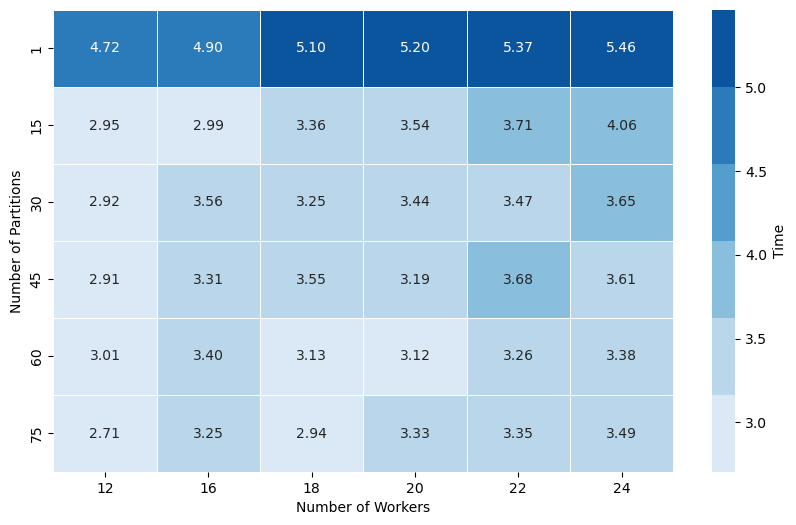

In [17]:
# Pivot the DataFrame to create a multi-layer heatmap
heatmap_data = df.pivot_table(index='Partition', columns='Worker', values='Time', aggfunc=np.mean)

# Create a color map for the heatmaps
cmap = sns.color_palette("Blues")

# Plot the multi-layer heatmaps
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap=cmap, linewidths=0.5, ax=ax, cbar_kws={'label': 'Time'})

# Set the plot title and labels
ax.set_xlabel('Number of Workers')
ax.set_ylabel('Number of Partitions')

# Add bar labels along the X and Y axes
ax.set_xticklabels(heatmap_data.columns)
ax.set_yticklabels(heatmap_data.index)

# Show the plot
plt.show()


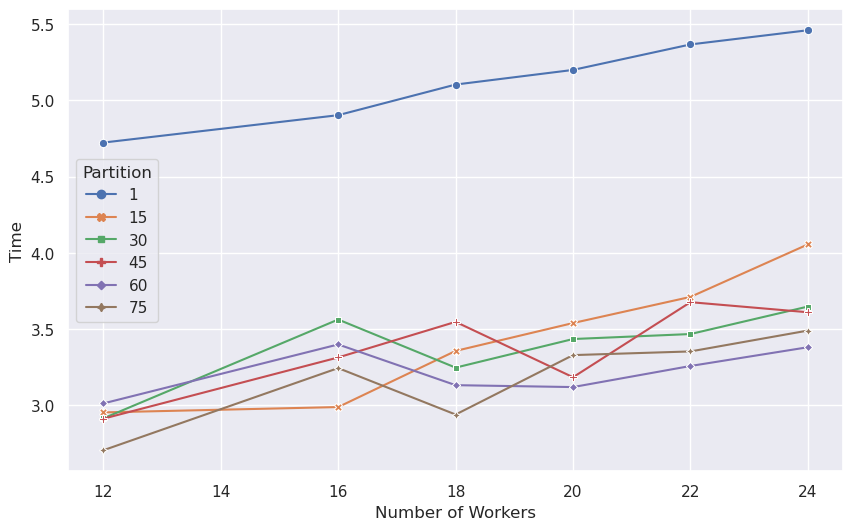

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot the DataFrame to create a multi-layer heatmap
heatmap_data = df.pivot_table(index='Worker', columns='Partition', values='Time', aggfunc=np.mean)

# Set the style for the plot
sns.set(style="darkgrid")

# Create the line plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.lineplot(data=heatmap_data, dashes=False, markers=True)

# Set the plot title and labels
ax.set_xlabel('Number of Workers')
ax.set_ylabel('Time')

# Add a legend
ax.legend(title='Partition')

# Show the plot
plt.show()


In [19]:
client.close()
cluster.close()

## Universities- task 2

In [18]:
def extract_universities_from_paper(paper):
    """
    Extract universities mentioned in a paper's metadata.

    Args:
        paper (dict): Paper content as a dictionary.

    Returns:
        list: List of extracted universities.
    """
    universities = []

    if 'authors' in paper.get('metadata', {}):
        authors = paper['metadata']['authors']

        if authors:
            for author_info in authors:
                affiliation = author_info.get('affiliation', {})
                institution = affiliation.get('institution', '')

                if institution:
                    universities.append(institution)
                else:
                    universities.append('NN')
        else:
            universities.append('NA')

    return universities


In [19]:
# Define the lists of parameters
num_workers_list = [6,8,9,10,11,12]  # Different numbers of workers
threads_per_worker_list = [4]  # Different numbers of threads per worker
npartitions_list = [1,15,30,45,60,75]  # Different npartitions
n_paper = 1000
amount = 10

In [20]:
df_uni = (
    db.from_sequence(file_list[0:n_paper], partition_size = 75)
    .map(load_json_data)
    .map(extract_universities_from_paper)
    .flatten()
    .frequencies()
    .to_dataframe(columns=['University', 'Count'])
    .nlargest(n=amount, columns='Count')
)

head = df_uni.compute()

In [21]:
# Define the lists of parameters
num_workers_list = [6,8,9,10,11,12]  # Different numbers of workers
threads_per_worker_list = [4]  # Different numbers of threads per worker
npartitions_list = [1,15,30,45,60,75]  # Different npartitions
n_paper = 1000
amount = 10

# Create an empty list to store the results
execution_times = []
i = 0
# Loop over the parameters
while i<5:
    for num_workers in tqdm.tqdm(num_workers_list):
        for threads_per_worker in tqdm.tqdm(threads_per_worker_list):
            for npartitions in tqdm.tqdm(npartitions_list):
                # Create a LocalCluster with the current parameters
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")

                    cluster = SSHCluster([scheduler,worker1, worker2],
                    scheduler_options={"port": 0, "dashboard_address": ":8888"},
                    connect_options={"known_hosts": None}, 
                    worker_options={"n_workers":num_workers})
                    
                    client = Client(cluster)

                    # Start the timer
                    start_time = time.time()


                    df_country = (
                        db.from_sequence(file_list[0:n_paper] , partition_size = npartitions)
                        .map(load_json_data)
                        .map(extract_universities_from_paper)
                        .flatten()
                        .frequencies()
                        .to_dataframe(columns=['University', 'Count'])
                        .nlargest(n=amount, columns='Count')
                    )

                    # Compute the result
                    result = df_country.compute()

                    # End the timer
                    end_time = time.time()
                    execution_time = end_time - start_time

                    # Store the execution time in the list
                    execution_times.append((2*num_workers, threads_per_worker, npartitions, execution_time))

                    # Close the Dask client and cluster
                    client.close()
                    cluster.close()
    i = i+1


  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/6 [00:00<?, ?it/s]2024-01-28 21:48:24,087 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:24,086 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:48:24,090 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:48:24,090 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:48:24,091 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 35499 instead
2024-01-28 21:48:24,091 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:48:24,116 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:24,116 - distributed.scheduler - INF

2024-01-28 21:48:25,424 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,421 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2gcjforw', purging
2024-01-28 21:48:25,435 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,433 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39125
2024-01-28 21:48:25,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,433 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39125
2024-01-28 21:48:25,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,433 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37981
2024-01-28 21:48:25,437 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,433 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34047
2024-01-28 21:48:25,438 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,433 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:48:25,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,661 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:25,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,661 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:25,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,661 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:25,666 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,661 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-h2iprvv4
2024-01-28 21:48:25,667 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,661 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:25,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:25,692 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38725
2024-01-28 21:4

2024-01-28 21:48:31,089 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,079 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d1tz2v8a', purging
2024-01-28 21:48:31,090 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,079 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-kr3ndye3', purging
2024-01-28 21:48:31,090 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,079 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-c6cilgib', purging
2024-01-28 21:48:31,091 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,080 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-70gllu98', purging
2024-01-28 21:48:31,091 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,080 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zulmuias'

2024-01-28 21:48:31,197 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,187 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5ypzcig0
2024-01-28 21:48:31,197 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,188 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:31,266 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,264 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41995
2024-01-28 21:48:31,267 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,265 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41995
2024-01-28 21:48:31,267 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,265 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37245
2024-01-28 21:48:31,268 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:31,265 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37925
2024-01-28 21:4

2024-01-28 21:48:33,538 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:48:33,538 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:48:33,540 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 45955 instead
2024-01-28 21:48:33,540 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:48:33,564 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:33,563 - distributed.scheduler - INFO - State start
2024-01-28 21:48:33,567 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:33,566 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:44691
2024-01-28 21:48:34,257 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,255 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33547'
2024-01-28 21:48:34,258 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:48:34,679 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,672 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42401
2024-01-28 21:48:34,679 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,672 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35147
2024-01-28 21:48:34,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,672 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44691
2024-01-28 21:48:34,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,672 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:34,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,672 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:34,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,672 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:34,681 - di

2024-01-28 21:48:34,882 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,873 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-qvgk53w2
2024-01-28 21:48:34,883 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,873 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:34,899 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,897 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41541
2024-01-28 21:48:34,899 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,897 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41541
2024-01-28 21:48:34,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,897 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34253
2024-01-28 21:48:34,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:34,897 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44691
2024-01-28 21:4

2024-01-28 21:48:38,157 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,154 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-kkcf_ij5', purging
2024-01-28 21:48:38,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,154 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ycedyw2s', purging
2024-01-28 21:48:38,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,154 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-iegufkoq', purging
2024-01-28 21:48:38,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,154 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6768oh16', purging
2024-01-28 21:48:38,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,152 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43333
2024-01-28 21:48:38,160 - dist

2024-01-28 21:48:38,273 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,271 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33335
2024-01-28 21:48:38,275 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,271 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43193
2024-01-28 21:48:38,275 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,271 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45507
2024-01-28 21:48:38,275 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,271 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:38,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,271 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:38,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:38,271 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:38,277 - di

2024-01-28 21:48:40,528 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:48:40,551 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:40,551 - distributed.scheduler - INFO - State start
2024-01-28 21:48:40,554 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:40,553 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:38415
2024-01-28 21:48:41,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,245 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42357'
2024-01-28 21:48:41,259 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,253 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46867'
2024-01-28 21:48:41,262 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,260 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37809'
2024-01-28 21:48:41,266 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,260 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41909

2024-01-28 21:48:41,656 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,652 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:41,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,652 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:41,658 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,652 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:41,658 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,652 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-l1s9oihk
2024-01-28 21:48:41,659 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,652 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:41,695 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,688 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37897
2024-01-28 21:4

2024-01-28 21:48:41,936 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,929 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41643
2024-01-28 21:48:41,936 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,929 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38741
2024-01-28 21:48:41,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,929 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38415
2024-01-28 21:48:41,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,929 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:41,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,929 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:41,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:41,929 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:41,939 - di

2024-01-28 21:48:45,085 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,076 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:45,085 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,076 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rttjs8nn
2024-01-28 21:48:45,086 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,076 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:45,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,132 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40765
2024-01-28 21:48:45,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,132 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40765
2024-01-28 21:48:45,140 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,133 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41635
2024-01-28 21:4

2024-01-28 21:48:45,310 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,303 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:45,311 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,303 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:45,312 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,303 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:45,313 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,304 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8tct5tvs
2024-01-28 21:48:45,313 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,304 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:45,342 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:45,340 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35403
2024-01-28 21:4

2024-01-28 21:48:47,535 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:47,534 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:39171
2024-01-28 21:48:48,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,208 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44825'
2024-01-28 21:48:48,219 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,217 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42301'
2024-01-28 21:48:48,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,214 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37877'
2024-01-28 21:48:48,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,224 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35551'
2024-01-28 21:48:48,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,221 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44703'
2024-01-28 21:48:48,232 - distribute

2024-01-28 21:48:48,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,814 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35839
2024-01-28 21:48:48,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,814 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37719
2024-01-28 21:48:48,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,814 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39171
2024-01-28 21:48:48,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,814 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:48,819 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,814 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:48,820 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,817 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:48,820 - di

2024-01-28 21:48:48,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,956 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-r4crntcq
2024-01-28 21:48:48,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,956 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:48,968 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,962 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37045
2024-01-28 21:48:48,968 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,962 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37045
2024-01-28 21:48:48,969 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,962 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42997
2024-01-28 21:48:48,969 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:48,962 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39171
2024-01-28 21:4

2024-01-28 21:48:49,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:49,073 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39171
2024-01-28 21:48:49,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:49,073 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:49,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:49,073 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:49,082 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:49,073 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:49,082 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:49,073 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-peuozn0a
2024-01-28 21:48:49,082 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:49,073 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:4

2024-01-28 21:48:54,611 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,607 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-92ze10qo', purging
2024-01-28 21:48:54,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,607 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-eluwq1n9', purging
2024-01-28 21:48:54,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-r4crntcq', purging
2024-01-28 21:48:54,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-h1d70ec7', purging
2024-01-28 21:48:54,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jrsol1z6'

2024-01-28 21:48:54,678 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,674 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8bvt_ddk
2024-01-28 21:48:54,679 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,674 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:54,697 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,695 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40603
2024-01-28 21:48:54,697 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,695 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40603
2024-01-28 21:48:54,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,695 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33139
2024-01-28 21:48:54,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,695 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43337
2024-01-28 21:4

2024-01-28 21:48:54,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,768 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:54,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,768 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:54,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,768 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:54,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,768 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-gsvyiiwb
2024-01-28 21:48:54,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,768 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:54,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:54,778 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44407
2024-01-28 21:4

2024-01-28 21:48:58,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,285 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-z440i1uv', purging
2024-01-28 21:48:58,294 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,285 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bg8avs9t', purging
2024-01-28 21:48:58,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,285 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-aybxz67t', purging
2024-01-28 21:48:58,296 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,285 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gsvyiiwb', purging
2024-01-28 21:48:58,297 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,285 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-illx15e9'

2024-01-28 21:48:58,405 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,393 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:58,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,412 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36409
2024-01-28 21:48:58,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,412 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36409
2024-01-28 21:48:58,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,412 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46163
2024-01-28 21:48:58,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,412 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42375
2024-01-28 21:48:58,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,412 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:58,416 - di

2024-01-28 21:48:58,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,446 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:48:58,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,446 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:48:58,453 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,446 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1d91gc95
2024-01-28 21:48:58,453 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,446 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:48:58,463 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,461 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38361
2024-01-28 21:48:58,465 - distributed.deploy.ssh - INFO - 2024-01-28 21:48:58,462 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38361
2024-01-28 21:4

2024-01-28 21:49:01,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:01,478 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46239'
2024-01-28 21:49:01,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:01,486 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33407'
2024-01-28 21:49:01,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:01,497 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33931'
2024-01-28 21:49:01,515 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:01,513 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33349'
2024-01-28 21:49:01,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:01,526 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33089'
2024-01-28 21:49:01,530 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:01,524 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40191'
2024-01-28 21:49:01,530 - distri

2024-01-28 21:49:02,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,087 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:02,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,088 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43725
2024-01-28 21:49:02,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,088 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43725
2024-01-28 21:49:02,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,088 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41177
2024-01-28 21:49:02,096 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,088 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39173
2024-01-28 21:49:02,096 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,088 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:02,096 - di

2024-01-28 21:49:02,193 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,189 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:02,193 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,189 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:02,193 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,189 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1g1j0n6s
2024-01-28 21:49:02,194 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,189 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:02,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,187 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33027
2024-01-28 21:49:02,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,187 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33027
2024-01-28 21:4

2024-01-28 21:49:02,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,357 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42591
2024-01-28 21:49:02,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,357 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39173
2024-01-28 21:49:02,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,358 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:02,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,358 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:02,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,358 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:02,363 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:02,358 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4kifgnau
2024-01-28 21:4

2024-01-28 21:49:05,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,623 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-frd383t4', purging
2024-01-28 21:49:05,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,623 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fvpj_n7e', purging
2024-01-28 21:49:05,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,623 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-i1znplv6', purging
2024-01-28 21:49:05,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,623 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-kyy1v9vo', purging
2024-01-28 21:49:05,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,623 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ataos3jh'

2024-01-28 21:49:05,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,790 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:05,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,791 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:05,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,791 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-g8e2n5gs
2024-01-28 21:49:05,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,791 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:05,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,803 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43961
2024-01-28 21:49:05,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,806 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43961
2024-01-28 21:4

2024-01-28 21:49:05,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,917 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37769
2024-01-28 21:49:05,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,918 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37107
2024-01-28 21:49:05,922 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,918 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:05,922 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,918 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:05,922 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,918 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:05,923 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:05,918 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x19_4z6c
2024-01-28 21:4

2024-01-28 21:49:09,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,248 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-g8e2n5gs', purging
2024-01-28 21:49:09,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,249 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5eqg6yog', purging
2024-01-28 21:49:09,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,249 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-x19_4z6c', purging
2024-01-28 21:49:09,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,249 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4361gsau', purging
2024-01-28 21:49:09,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,249 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-h0rizdgh'

2024-01-28 21:49:09,370 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,361 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:09,370 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,362 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:09,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,362 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2a87x9du
2024-01-28 21:49:09,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,362 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:09,375 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,373 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45101
2024-01-28 21:49:09,376 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,373 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45101
2024-01-28 21:4

2024-01-28 21:49:09,488 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,482 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37981
2024-01-28 21:49:09,490 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,482 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38731
2024-01-28 21:49:09,490 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,482 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:09,490 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,482 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:09,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,482 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:09,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:09,482 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5q5kaifz
2024-01-28 21:4

2024-01-28 21:49:11,806 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:49:11,807 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 45609 instead
2024-01-28 21:49:11,807 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:49:11,830 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:11,830 - distributed.scheduler - INFO - State start
2024-01-28 21:49:11,833 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:11,833 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:34111
2024-01-28 21:49:12,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:12,522 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38881'
2024-01-28 21:49:12,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:12,530 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35573'
2024-01-28 21:49:12,542 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:12,536 - distributed.nanny - INFO -     

2024-01-28 21:49:13,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,161 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43971
2024-01-28 21:49:13,169 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,161 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46435
2024-01-28 21:49:13,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,161 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34111
2024-01-28 21:49:13,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,161 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:13,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,161 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:13,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,161 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:13,171 - di

2024-01-28 21:49:13,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,338 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-e38s48ev
2024-01-28 21:49:13,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,338 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:13,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,354 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35111
2024-01-28 21:49:13,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,354 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35111
2024-01-28 21:49:13,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,354 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36831
2024-01-28 21:49:13,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,354 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34111
2024-01-28 21:4

2024-01-28 21:49:13,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,411 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:13,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,411 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:13,421 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,411 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:13,421 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,412 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ow6d8xy7
2024-01-28 21:49:13,421 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,412 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:13,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:13,429 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41051
2024-01-28 21:4

2024-01-28 21:49:18,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:18,521 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39291'
2024-01-28 21:49:18,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:18,519 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41813'
2024-01-28 21:49:18,538 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:18,536 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46641'
2024-01-28 21:49:18,545 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:18,539 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40153'
2024-01-28 21:49:18,561 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:18,555 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44653'
2024-01-28 21:49:18,566 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:18,564 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45797'
2024-01-28 21:49:18,585 - distr

2024-01-28 21:49:19,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,024 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46511
2024-01-28 21:49:19,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,024 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36319
2024-01-28 21:49:19,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,024 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:19,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,024 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:19,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,024 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:19,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,024 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1oaik726
2024-01-28 21:4

2024-01-28 21:49:19,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,273 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:19,323 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,321 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34809
2024-01-28 21:49:19,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,321 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34809
2024-01-28 21:49:19,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,321 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36923
2024-01-28 21:49:19,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,321 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36319
2024-01-28 21:49:19,326 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,321 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:19,326 - di

2024-01-28 21:49:19,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,431 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:19,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,431 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:19,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,431 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-inywfzt9
2024-01-28 21:49:19,437 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,431 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:19,438 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,428 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41293
2024-01-28 21:49:19,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:19,434 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41293
2024-01-28 21:4

2024-01-28 21:49:22,865 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:22,857 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-whdtfkce', purging
2024-01-28 21:49:22,865 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:22,857 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ldzew3mn', purging
2024-01-28 21:49:22,866 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:22,857 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6je9h65s', purging
2024-01-28 21:49:22,866 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:22,857 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1oaik726', purging
2024-01-28 21:49:22,866 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:22,857 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hl0iep_v'

2024-01-28 21:49:23,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,038 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:23,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,038 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:23,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,038 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:23,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,038 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1v5if5z5
2024-01-28 21:49:23,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,038 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:23,167 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,160 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45133
2024-01-28 21:4

2024-01-28 21:49:23,246 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,243 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40211
2024-01-28 21:49:23,247 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,243 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46739
2024-01-28 21:49:23,247 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,243 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46697
2024-01-28 21:49:23,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,243 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:23,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,243 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:23,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,244 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:23,249 - di

2024-01-28 21:49:23,286 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,281 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ak7x_03j
2024-01-28 21:49:23,286 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,281 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:23,288 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,279 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40537
2024-01-28 21:49:23,288 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,279 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40537
2024-01-28 21:49:23,288 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,279 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42031
2024-01-28 21:49:23,289 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:23,279 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46697
2024-01-28 21:4

2024-01-28 21:49:27,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,137 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ak7x_03j', purging
2024-01-28 21:49:27,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,137 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-yljzki1j', purging
2024-01-28 21:49:27,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,137 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ejx869jc', purging
2024-01-28 21:49:27,143 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,138 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p1twu2zg', purging
2024-01-28 21:49:27,175 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,173 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40893
2024-01-28 21:49:27,176 - dist

2024-01-28 21:49:27,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,273 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:27,281 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,272 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34027
2024-01-28 21:49:27,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,273 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34027
2024-01-28 21:49:27,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,273 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33265
2024-01-28 21:49:27,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,273 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39329
2024-01-28 21:49:27,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,273 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:27,283 - di

2024-01-28 21:49:27,393 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,382 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:27,393 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,382 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:27,394 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,383 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-b0jafpqm
2024-01-28 21:49:27,394 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,383 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:27,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,418 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33457
2024-01-28 21:49:27,421 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,419 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33457
2024-01-28 21:4

2024-01-28 21:49:27,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,555 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44305
2024-01-28 21:49:27,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,555 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39329
2024-01-28 21:49:27,559 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,555 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:27,560 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,555 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:27,560 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,555 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:27,560 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:27,555 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-oqheuchu
2024-01-28 21:4

2024-01-28 21:49:30,953 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:30,942 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-e9gjbjda', purging
2024-01-28 21:49:30,953 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:30,942 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jhtsaon2', purging
2024-01-28 21:49:30,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:30,942 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-q9bw1biq', purging
2024-01-28 21:49:30,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:30,943 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6uqad8k_', purging
2024-01-28 21:49:30,976 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:30,970 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33309
2024-01-28 21:49:30,984 - dist

2024-01-28 21:49:31,116 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,110 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45957
2024-01-28 21:49:31,117 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,110 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33429
2024-01-28 21:49:31,117 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,110 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44165
2024-01-28 21:49:31,117 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,110 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:31,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,110 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:31,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,110 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:31,119 - di

2024-01-28 21:49:31,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,227 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-k8hacngq
2024-01-28 21:49:31,237 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,227 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:31,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,234 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43521
2024-01-28 21:49:31,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,234 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43521
2024-01-28 21:49:31,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,234 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36661
2024-01-28 21:49:31,240 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:31,234 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44165
2024-01-28 21:4

2024-01-28 21:49:33,367 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:49:33,368 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:49:33,368 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 45765 instead
2024-01-28 21:49:33,369 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:49:33,393 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:33,393 - distributed.scheduler - INFO - State start
2024-01-28 21:49:33,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:33,396 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:43309
2024-01-28 21:49:34,076 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,070 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41843'
2024-01-28 21:49:34,081 - distributed.deploy.ssh - INFO - 2024-01-2

2024-01-28 21:49:34,654 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,647 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ldipm5hn', purging
2024-01-28 21:49:34,654 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,647 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-dwhs_5xb', purging
2024-01-28 21:49:34,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,676 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38623
2024-01-28 21:49:34,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,676 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38623
2024-01-28 21:49:34,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,676 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44567
2024-01-28 21:49:34,685 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,676 - distributed.worker - INFO 

2024-01-28 21:49:34,872 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,864 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43309
2024-01-28 21:49:34,873 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,864 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:34,873 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,864 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:34,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,864 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:34,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,865 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_2fhaz3e
2024-01-28 21:49:34,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,865 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:4

2024-01-28 21:49:34,951 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,950 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41297
2024-01-28 21:49:34,952 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,950 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41297
2024-01-28 21:49:34,953 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,950 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34509
2024-01-28 21:49:34,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,950 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43309
2024-01-28 21:49:34,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,950 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:34,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:34,950 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:34,955 - di

2024-01-28 21:49:37,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:37,811 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43157'
2024-01-28 21:49:37,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:37,810 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43069'
2024-01-28 21:49:37,820 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:37,818 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46071'
2024-01-28 21:49:37,827 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:37,820 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37811'
2024-01-28 21:49:37,830 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:37,829 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38195'
2024-01-28 21:49:37,833 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:37,827 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39283'
2024-01-28 21:49:37,839 - distr

2024-01-28 21:49:38,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,354 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:38,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,354 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:38,359 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,354 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:38,359 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,354 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6173mlri
2024-01-28 21:49:38,359 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,354 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:38,426 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,423 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46211
2024-01-28 21:4

2024-01-28 21:49:38,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,661 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38355
2024-01-28 21:49:38,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,661 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35515
2024-01-28 21:49:38,666 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,661 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40113
2024-01-28 21:49:38,666 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,661 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:38,667 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,661 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:38,667 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,661 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:38,668 - di

2024-01-28 21:49:38,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,716 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ppbr13gk
2024-01-28 21:49:38,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,716 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:38,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,766 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46015
2024-01-28 21:49:38,769 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,766 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46015
2024-01-28 21:49:38,769 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,766 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37771
2024-01-28 21:49:38,769 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:38,766 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40113
2024-01-28 21:4

2024-01-28 21:49:43,018 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:49:43,020 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:49:43,020 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 36279 instead
2024-01-28 21:49:43,020 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:49:43,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:43,041 - distributed.scheduler - INFO - State start
2024-01-28 21:49:43,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:43,044 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:32813
2024-01-28 21:49:43,722 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:43,716 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36217'
2024-01-28 21:49:43,729 - distributed.deploy.ssh - INFO - 2024-01-2

2024-01-28 21:49:44,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,410 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mbwn549c', purging
2024-01-28 21:49:44,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,411 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8nqpg5yl', purging
2024-01-28 21:49:44,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,411 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-it_xzt36', purging
2024-01-28 21:49:44,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,411 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-us3wb08_', purging
2024-01-28 21:49:44,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,411 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6173mlri'

2024-01-28 21:49:44,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,549 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_2utagoy
2024-01-28 21:49:44,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,549 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:44,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,565 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46565
2024-01-28 21:49:44,572 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,565 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46565
2024-01-28 21:49:44,572 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,565 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43083
2024-01-28 21:49:44,573 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,565 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:32813
2024-01-28 21:4

2024-01-28 21:49:44,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,635 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:44,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,635 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:44,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,635 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:44,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,635 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-eycfh2l2
2024-01-28 21:49:44,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,635 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:44,646 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,640 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37061
2024-01-28 21:4

2024-01-28 21:49:44,805 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,803 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:49:44,805 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,804 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:32813
2024-01-28 21:49:44,806 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,804 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:44,806 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,804 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:32813
2024-01-28 21:49:44,829 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,827 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37937
2024-01-28 21:49:44,829 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:44,827 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37937
2024-01-28 21:49:44,829 - distributed.d

2024-01-28 21:49:48,330 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,321 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vj1abvn3', purging
2024-01-28 21:49:48,331 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,322 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nx758irv', purging
2024-01-28 21:49:48,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,356 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33249
2024-01-28 21:49:48,366 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,360 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33249
2024-01-28 21:49:48,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,360 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39059
2024-01-28 21:49:48,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,360 - distributed.worker - INFO 

2024-01-28 21:49:48,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,592 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44425
2024-01-28 21:49:48,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,592 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44425
2024-01-28 21:49:48,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,592 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41413
2024-01-28 21:49:48,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,592 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35359
2024-01-28 21:49:48,601 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,592 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:48,601 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,592 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:48,602 - di

2024-01-28 21:49:48,695 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,691 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:48,696 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,691 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4p6rc342
2024-01-28 21:49:48,696 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,691 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:48,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,693 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37485
2024-01-28 21:49:48,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,694 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37485
2024-01-28 21:49:48,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,698 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39209
2024-01-28 21:4

2024-01-28 21:49:48,818 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,810 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35359
2024-01-28 21:49:48,818 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,810 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:48,819 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,810 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:48,819 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,810 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:48,819 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,810 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bodeqwhk
2024-01-28 21:49:48,820 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:48,810 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:4

2024-01-28 21:49:51,937 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:51,931 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33645'
2024-01-28 21:49:51,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:51,973 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43261'
2024-01-28 21:49:52,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,349 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-12ej2z3o', purging
2024-01-28 21:49:52,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,349 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-61mirjfa', purging
2024-01-28 21:49:52,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,350 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-otqc7cge', purging
2024-01-28 21:49:52,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:

2024-01-28 21:49:52,487 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,480 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:52,488 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,480 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7nye_l8i
2024-01-28 21:49:52,488 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,480 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:52,506 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,500 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36409
2024-01-28 21:49:52,506 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,500 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36409
2024-01-28 21:49:52,507 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,500 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39011
2024-01-28 21:4

2024-01-28 21:49:52,707 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,700 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43035
2024-01-28 21:49:52,707 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,700 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:52,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,700 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46015
2024-01-28 21:49:52,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,701 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:52,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,701 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:52,710 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,701 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xzx05h0e
2024-01-28 21:4

2024-01-28 21:49:52,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,744 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40973
2024-01-28 21:49:52,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,744 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40973
2024-01-28 21:49:52,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,744 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34783
2024-01-28 21:49:52,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,744 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43035
2024-01-28 21:49:52,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,744 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:52,749 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:52,744 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:52,749 - di

2024-01-28 21:49:55,773 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:55,772 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38217'
2024-01-28 21:49:55,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:55,774 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40325'
2024-01-28 21:49:55,783 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:55,781 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33673'
2024-01-28 21:49:55,787 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:55,782 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34641'
2024-01-28 21:49:55,791 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:55,790 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43405'
2024-01-28 21:49:55,800 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:55,798 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39415'
2024-01-28 21:49:55,837 - dis

2024-01-28 21:49:56,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,393 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37765
2024-01-28 21:49:56,401 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,393 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:56,403 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,393 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:56,403 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,393 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:56,403 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,393 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-d13k6ab0
2024-01-28 21:49:56,404 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,393 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:4

2024-01-28 21:49:56,603 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,601 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40835
2024-01-28 21:49:56,604 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,601 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40835
2024-01-28 21:49:56,604 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,601 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44471
2024-01-28 21:49:56,604 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,601 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37765
2024-01-28 21:49:56,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,601 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:56,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,601 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:49:56,605 - di

2024-01-28 21:49:56,751 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,748 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:49:56,752 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,748 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-b8082vr3
2024-01-28 21:49:56,752 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,749 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:49:56,783 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,777 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42727
2024-01-28 21:49:56,787 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,781 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43935
2024-01-28 21:49:56,789 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:56,783 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42727
2024-01-28 21:4

 83%|█████████████████████████████████████▌       | 5/6 [00:21<00:04,  4.10s/it]2024-01-28 21:49:58,849 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:58,848 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:49:58,850 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:49:58,851 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:49:58,852 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 37639 instead
2024-01-28 21:49:58,852 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:49:58,875 - distributed.deploy.ssh - INFO - 2024-01-28 21:49:58,875 - distributed.scheduler - INFO - State start
2024-01-28 21:49:58,878 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:50:00,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,182 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-we98f88u', purging
2024-01-28 21:50:00,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,182 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-x3lbtbqy', purging
2024-01-28 21:50:00,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,183 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-uzedh0s9', purging
2024-01-28 21:50:00,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,183 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3nht0g0i', purging
2024-01-28 21:50:00,191 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,183 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-r93qem71'

2024-01-28 21:50:00,345 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,336 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:00,346 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,336 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:00,346 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,336 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-62k7b55f
2024-01-28 21:50:00,346 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,336 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:00,405 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,402 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46441
2024-01-28 21:50:00,405 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,402 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46441
2024-01-28 21:5

2024-01-28 21:50:00,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,507 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34417
2024-01-28 21:50:00,510 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,508 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37597
2024-01-28 21:50:00,511 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,509 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:00,511 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,509 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:00,511 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,509 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:00,512 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,509 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-f1eu7pea
2024-01-28 21:5

2024-01-28 21:50:00,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,599 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ig39989x
2024-01-28 21:50:00,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,599 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:00,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,596 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43981
2024-01-28 21:50:00,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,596 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37543
2024-01-28 21:50:00,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,596 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37597
2024-01-28 21:50:00,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:00,596 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:50:04,105 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,100 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vjt_td4_', purging
2024-01-28 21:50:04,105 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,100 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-f1eu7pea', purging
2024-01-28 21:50:04,105 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,100 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-n5ei8tzc', purging
2024-01-28 21:50:04,111 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,105 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xjlgvpi7', purging
2024-01-28 21:50:04,113 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,105 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-62k7b55f'

2024-01-28 21:50:04,241 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,237 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:04,329 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,321 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43103
2024-01-28 21:50:04,329 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,322 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43103
2024-01-28 21:50:04,330 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,322 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33681
2024-01-28 21:50:04,330 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,322 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45263
2024-01-28 21:50:04,331 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,322 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:04,331 - di

2024-01-28 21:50:04,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,497 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:04,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,497 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:04,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,497 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6uq1kf9_
2024-01-28 21:50:04,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,498 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:04,530 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,529 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46017
2024-01-28 21:50:04,531 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,529 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46017
2024-01-28 21:5

2024-01-28 21:50:04,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,628 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44893
2024-01-28 21:50:04,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,628 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33931
2024-01-28 21:50:04,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,629 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45263
2024-01-28 21:50:04,633 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,629 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:04,634 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,629 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:04,635 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:04,629 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:04,636 - di

2024-01-28 21:50:08,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:08,915 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:39309
2024-01-28 21:50:09,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:09,614 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34359'
2024-01-28 21:50:09,627 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:09,621 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46327'
2024-01-28 21:50:09,635 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:09,629 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36853'
2024-01-28 21:50:09,635 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:09,633 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33903'
2024-01-28 21:50:09,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:09,635 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33921'
2024-01-28 21:50:09,642 - distributed

2024-01-28 21:50:10,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,280 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ffixs_9y', purging
2024-01-28 21:50:10,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,280 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-z3tqv9bb', purging
2024-01-28 21:50:10,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,280 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4xycpi8a', purging
2024-01-28 21:50:10,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,280 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-sppkrjyj', purging
2024-01-28 21:50:10,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,280 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-i3cgoe2n'

2024-01-28 21:50:10,516 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,507 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:10,516 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,507 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5cvl5y_0
2024-01-28 21:50:10,517 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,507 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:10,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,522 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40967
2024-01-28 21:50:10,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,522 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40967
2024-01-28 21:50:10,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,522 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38091
2024-01-28 21:5

2024-01-28 21:50:10,707 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,704 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39309
2024-01-28 21:50:10,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,704 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:10,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,704 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:10,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,704 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:10,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,704 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6kzvvmu8
2024-01-28 21:50:10,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,704 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:50:10,804 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,793 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40509
2024-01-28 21:50:10,805 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,793 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40509
2024-01-28 21:50:10,805 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,793 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37735
2024-01-28 21:50:10,805 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,794 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39309
2024-01-28 21:50:10,805 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,794 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:10,806 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:10,794 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:10,807 - di

2024-01-28 21:50:13,885 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:13,884 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37809'
2024-01-28 21:50:13,890 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:13,884 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38811'
2024-01-28 21:50:13,905 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:13,903 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46023'
2024-01-28 21:50:13,920 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:13,914 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41521'
2024-01-28 21:50:13,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:13,928 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41285'
2024-01-28 21:50:13,934 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:13,927 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33821'
2024-01-28 21:50:13,970 - distr

2024-01-28 21:50:14,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,430 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:14,475 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,469 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34929
2024-01-28 21:50:14,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,469 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34929
2024-01-28 21:50:14,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,469 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45697
2024-01-28 21:50:14,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,469 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43489
2024-01-28 21:50:14,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,469 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:14,479 - di

2024-01-28 21:50:14,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,705 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:14,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,705 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:14,710 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,705 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6yeu9x25
2024-01-28 21:50:14,710 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,705 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:14,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,722 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44647
2024-01-28 21:50:14,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,722 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44647
2024-01-28 21:5

2024-01-28 21:50:14,889 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,886 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46287
2024-01-28 21:50:14,889 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,886 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43489
2024-01-28 21:50:14,889 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,886 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:14,890 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,886 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:14,890 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,886 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:14,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,886 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-y6d9c2n8
2024-01-28 21:5

2024-01-28 21:50:14,967 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,957 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:14,978 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,977 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46781
2024-01-28 21:50:14,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:14,979 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39785
2024-01-28 21:50:15,014 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:15,007 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44129


 50%|██████████████████████▌                      | 3/6 [00:14<00:13,  4.55s/it]2024-01-28 21:50:17,089 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:17,088 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:50:17,091 - distr

2024-01-28 21:50:18,516 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,507 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:18,517 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,508 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:18,517 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,508 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8rpwssy0
2024-01-28 21:50:18,517 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,508 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:18,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,535 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-471kbwkp', purging
2024-01-28 21:50:18,537 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,535 - distributed.diskutils - INFO - Found stale lock file 

2024-01-28 21:50:18,647 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,640 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:18,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,640 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x3lxk7ni
2024-01-28 21:50:18,648 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,640 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:18,654 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,653 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33911
2024-01-28 21:50:18,655 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,653 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33911
2024-01-28 21:50:18,656 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,653 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35105
2024-01-28 21:5

2024-01-28 21:50:18,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,842 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34775
2024-01-28 21:50:18,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,842 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:18,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,842 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:18,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,842 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:18,847 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,842 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9b1rjspp
2024-01-28 21:50:18,847 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,842 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:50:18,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,911 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44277
2024-01-28 21:50:18,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,911 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44277
2024-01-28 21:50:18,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,911 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36751
2024-01-28 21:50:18,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,911 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34775
2024-01-28 21:50:18,922 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,911 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:18,922 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:18,911 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:18,922 - di

2024-01-28 21:50:21,969 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:21,962 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42287'
2024-01-28 21:50:21,973 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:21,972 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33695'
2024-01-28 21:50:21,974 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:21,968 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36605'
2024-01-28 21:50:21,983 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:21,981 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37979'
2024-01-28 21:50:22,005 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:21,999 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33571'
2024-01-28 21:50:22,017 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,016 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39285'
2024-01-28 21:50:22,029 - distr

2024-01-28 21:50:22,635 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,631 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-slnqklwm', purging
2024-01-28 21:50:22,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,670 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39897
2024-01-28 21:50:22,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,670 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39897
2024-01-28 21:50:22,673 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,670 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42927
2024-01-28 21:50:22,674 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,670 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41879
2024-01-28 21:50:22,674 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,670 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:50:22,883 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,880 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:22,883 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,880 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:22,883 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,880 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:22,884 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,880 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-tq9ynoj5
2024-01-28 21:50:22,884 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,880 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:22,920 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:22,914 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35039
2024-01-28 21:5

2024-01-28 21:50:23,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,038 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37361
2024-01-28 21:50:23,045 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,038 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39795
2024-01-28 21:50:23,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,038 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41879
2024-01-28 21:50:23,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,038 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:23,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,038 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:23,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,038 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:23,050 - di

2024-01-28 21:50:23,136 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,133 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-34sg8x7c
2024-01-28 21:50:23,137 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,133 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:23,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,133 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39315
2024-01-28 21:50:23,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,134 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39315
2024-01-28 21:50:23,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,134 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44945
2024-01-28 21:50:23,140 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:23,134 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41879
2024-01-28 21:5

2024-01-28 21:50:26,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,438 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o0d4pqpo', purging
2024-01-28 21:50:26,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,438 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xfcxu5h0', purging
2024-01-28 21:50:26,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,438 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-wd5n7c72', purging
2024-01-28 21:50:26,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,438 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jtq9xuir', purging
2024-01-28 21:50:26,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,438 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-azyi94qt'

2024-01-28 21:50:26,588 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,587 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42749
2024-01-28 21:50:26,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,587 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42749
2024-01-28 21:50:26,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,587 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40217
2024-01-28 21:50:26,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,587 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46077
2024-01-28 21:50:26,591 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,587 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:26,592 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,588 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:26,592 - di

2024-01-28 21:50:26,897 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,893 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:26,897 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,893 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-lpqu7z5o
2024-01-28 21:50:26,905 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,903 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37619
2024-01-28 21:50:26,905 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,903 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37619
2024-01-28 21:50:26,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,903 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38893
2024-01-28 21:50:26,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,903 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46077
2024-01-28 21:5

2024-01-28 21:50:26,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,994 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46077
2024-01-28 21:50:26,997 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,994 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:26,997 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,994 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:26,998 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,994 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:26,998 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,994 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6a8im983
2024-01-28 21:50:26,998 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:26,994 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:50:27,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:27,114 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39727
2024-01-28 21:50:27,136 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:27,135 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45143


100%|█████████████████████████████████████████████| 6/6 [00:26<00:00,  4.39s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/6 [00:00<?, ?it/s]2024-01-28 21:50:29,299 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:29,298 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:50:29,302 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 i

2024-01-28 21:50:30,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:30,614 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41829
2024-01-28 21:50:30,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:30,614 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:30,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:30,614 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:30,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:30,614 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:30,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:30,614 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fs6ztr1g
2024-01-28 21:50:30,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:30,614 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:50:31,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,000 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41829
2024-01-28 21:50:31,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,000 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:31,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,000 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:31,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,000 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:31,010 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,000 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ux5t5aur
2024-01-28 21:50:31,010 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,000 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:50:31,150 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,143 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36361
2024-01-28 21:50:31,151 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,143 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38297
2024-01-28 21:50:31,152 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,146 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41829
2024-01-28 21:50:31,153 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,146 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:31,153 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,146 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:31,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,150 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:31,156 - di

2024-01-28 21:50:31,200 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,190 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-k83pyv3w
2024-01-28 21:50:31,200 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,190 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:32793
2024-01-28 21:50:31,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,191 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:31,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,191 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:32793
2024-01-28 21:50:31,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,191 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43135
2024-01-28 21:50:31,202 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,191 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41829
2024-01-28 21:5

2024-01-28 21:50:31,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,359 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:31,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,359 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:31,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,359 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:31,364 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,359 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ipp6shpu
2024-01-28 21:50:31,364 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,359 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:31,424 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:31,423 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43473
2024-01-28 21:5

2024-01-28 21:50:37,003 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:36,993 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jtxtzban', purging
2024-01-28 21:50:37,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,036 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35427
2024-01-28 21:50:37,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,036 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35427
2024-01-28 21:50:37,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,036 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36543
2024-01-28 21:50:37,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,036 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38981
2024-01-28 21:50:37,045 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,036 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:50:37,270 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,262 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:37,341 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,339 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36015
2024-01-28 21:50:37,341 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,339 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36015
2024-01-28 21:50:37,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,341 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40115
2024-01-28 21:50:37,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,342 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38981
2024-01-28 21:50:37,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,342 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:37,345 - di

2024-01-28 21:50:37,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,422 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:37,431 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,422 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:37,431 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,422 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-wtdbxm7q
2024-01-28 21:50:37,431 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,422 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:37,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,447 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35397
2024-01-28 21:50:37,449 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,447 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35397
2024-01-28 21:5

2024-01-28 21:50:37,540 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,526 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42283
2024-01-28 21:50:37,541 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,526 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38981
2024-01-28 21:50:37,541 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,526 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:37,541 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,526 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:37,542 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,526 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:37,542 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,526 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_edcwvvo
2024-01-28 21:5

2024-01-28 21:50:37,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,658 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4siq5eko
2024-01-28 21:50:37,663 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,658 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:37,713 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,711 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45897
2024-01-28 21:50:37,714 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,711 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45897
2024-01-28 21:50:37,714 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,711 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35925
2024-01-28 21:50:37,714 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:37,711 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38981
2024-01-28 21:5

2024-01-28 21:50:41,269 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,265 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jrji3vrh', purging
2024-01-28 21:50:41,270 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,265 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-j4mynudv', purging
2024-01-28 21:50:41,270 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,265 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4siq5eko', purging
2024-01-28 21:50:41,270 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,265 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0ixoay6u', purging
2024-01-28 21:50:41,271 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,265 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-20q7g4uw'

2024-01-28 21:50:41,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,413 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35247
2024-01-28 21:50:41,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,413 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:41,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,413 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:41,417 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,413 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:41,417 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,413 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-azxgp43q
2024-01-28 21:50:41,417 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,413 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:50:41,653 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,652 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37177
2024-01-28 21:50:41,654 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,652 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37177
2024-01-28 21:50:41,654 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,652 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45847
2024-01-28 21:50:41,655 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,652 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35247
2024-01-28 21:50:41,655 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,652 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:41,655 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,652 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:41,656 - di

2024-01-28 21:50:41,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,866 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:41,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,866 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dnalok_u
2024-01-28 21:50:41,871 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,866 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:41,873 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,868 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39085
2024-01-28 21:50:41,873 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,868 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39085
2024-01-28 21:50:41,873 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,868 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46819
2024-01-28 21:5

2024-01-28 21:50:41,949 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,943 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45019
2024-01-28 21:50:41,950 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,943 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35247
2024-01-28 21:50:41,951 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,943 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:41,951 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,943 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:41,951 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,943 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:41,952 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:41,943 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6dmo8y10
2024-01-28 21:5

2024-01-28 21:50:45,271 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,267 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-azxgp43q', purging
2024-01-28 21:50:45,272 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,268 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3fkcqrgt', purging
2024-01-28 21:50:45,272 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,268 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-m1u58uom', purging
2024-01-28 21:50:45,273 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,268 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9oupylo0', purging
2024-01-28 21:50:45,273 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,268 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-npbloce8'

2024-01-28 21:50:45,573 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,569 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-at_r1o15
2024-01-28 21:50:45,573 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,569 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:45,596 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,589 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44865
2024-01-28 21:50:45,597 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,589 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44865
2024-01-28 21:50:45,597 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,589 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38713
2024-01-28 21:50:45,597 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,589 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40183
2024-01-28 21:5

2024-01-28 21:50:45,827 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,819 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:45,828 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,819 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:45,828 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,819 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:45,828 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,819 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5yjbuv9v
2024-01-28 21:50:45,829 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,819 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:45,838 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,837 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45353
2024-01-28 21:5

2024-01-28 21:50:45,931 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,924 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43783
2024-01-28 21:50:45,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,924 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38071
2024-01-28 21:50:45,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,924 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40183
2024-01-28 21:50:45,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,924 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:45,933 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,924 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:45,933 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,925 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:45,933 - di

2024-01-28 21:50:46,004 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,997 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:46,004 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,997 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fa9deljs
2024-01-28 21:50:46,005 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:45,997 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:46,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:46,006 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42937
2024-01-28 21:50:46,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:46,006 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42937
2024-01-28 21:50:46,009 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:46,006 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37265
2024-01-28 21:5

2024-01-28 21:50:49,082 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,081 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39425'
2024-01-28 21:50:49,090 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,084 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43759'
2024-01-28 21:50:49,105 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,099 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36517'
2024-01-28 21:50:49,106 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,105 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46113'
2024-01-28 21:50:49,126 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,125 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39917'
2024-01-28 21:50:49,137 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,131 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33787'
2024-01-28 21:50:49,148 - distr

2024-01-28 21:50:49,670 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,668 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41729
2024-01-28 21:50:49,670 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,668 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37857
2024-01-28 21:50:49,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,668 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:49,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,668 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:49,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,668 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:49,672 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,668 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6dstd786
2024-01-28 21:5

2024-01-28 21:50:49,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,842 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:49,960 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,958 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35083
2024-01-28 21:50:49,961 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,958 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35083
2024-01-28 21:50:49,961 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,958 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37859
2024-01-28 21:50:49,962 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,959 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37857
2024-01-28 21:50:49,962 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:49,959 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:49,962 - di

2024-01-28 21:50:50,135 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,126 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:50,135 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,126 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:50,135 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,126 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ra3v9f70
2024-01-28 21:50:50,136 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,126 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:50,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,133 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41469
2024-01-28 21:50:50,140 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,133 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41469
2024-01-28 21:5

2024-01-28 21:50:50,316 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,315 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36155
2024-01-28 21:50:50,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,316 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38897
2024-01-28 21:50:50,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,316 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37857
2024-01-28 21:50:50,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,316 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:50,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,316 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:50,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:50,316 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:50,319 - di

2024-01-28 21:50:52,360 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 39253 instead
2024-01-28 21:50:52,361 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:50:52,384 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:52,383 - distributed.scheduler - INFO - State start
2024-01-28 21:50:52,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:52,386 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:40077
2024-01-28 21:50:53,076 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:53,070 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43069'
2024-01-28 21:50:53,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:53,075 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45809'
2024-01-28 21:50:53,091 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:53,085 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44639'
2024-01-28 21:50:53,103 - distributed.deploy.ssh - INFO 

2024-01-28 21:50:53,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:53,814 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qjej4fhv', purging
2024-01-28 21:50:53,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:53,814 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mwmnf7bk', purging
2024-01-28 21:50:53,818 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:53,815 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6dstd786', purging
2024-01-28 21:50:53,819 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:53,815 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-190tt8xd', purging
2024-01-28 21:50:53,819 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:53,815 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-w1l30inl'

2024-01-28 21:50:54,113 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,106 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41637
2024-01-28 21:50:54,113 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,106 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41637
2024-01-28 21:50:54,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,106 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37203
2024-01-28 21:50:54,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,106 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40077
2024-01-28 21:50:54,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,106 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:54,115 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,106 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:54,115 - di

2024-01-28 21:50:54,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,158 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:54,169 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,158 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ye1qztzz
2024-01-28 21:50:54,169 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,159 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:54,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,178 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44839
2024-01-28 21:50:54,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,178 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44839
2024-01-28 21:50:54,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,178 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37869
2024-01-28 21:5

2024-01-28 21:50:54,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,291 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40077
2024-01-28 21:50:54,294 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,291 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:54,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,291 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:54,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,291 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:54,296 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,291 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-lfbsusq9
2024-01-28 21:50:54,296 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,291 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:50:54,373 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,367 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:54,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,490 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:50:54,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,491 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:40077
2024-01-28 21:50:54,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,491 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:54,497 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,496 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:50:54,498 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:54,497 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:40077
2024-01-28 21:50:54,498 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:50:57,595 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,585 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:57,595 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,585 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:57,595 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,585 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-lqa9a4l2
2024-01-28 21:50:57,595 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,586 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:57,598 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,591 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7ge83620', purging
2024-01-28 21:50:57,598 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,591 - distributed.diskutils - INFO - Found stale lock file 

2024-01-28 21:50:57,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,658 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:50:57,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,658 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:50:57,663 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,658 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jnu9is_4
2024-01-28 21:50:57,663 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,658 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:50:57,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,664 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44985
2024-01-28 21:50:57,671 - distributed.deploy.ssh - INFO - 2024-01-28 21:50:57,664 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44985
2024-01-28 21:5



 17%|███████▌                                     | 1/6 [00:05<00:27,  5.58s/it]2024-01-28 21:51:02,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:02,036 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:51:02,041 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:51:02,041 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:51:02,042 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 36613 instead
2024-01-28 21:51:02,043 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:51:02,065 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:02,065 - distributed.scheduler - INFO - State start
2024-01-28 21:51:02,068 - distributed.deploy.ssh - INFO - 2024-0

2024-01-28 21:51:03,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,173 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:03,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,168 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37125
2024-01-28 21:51:03,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,168 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37125
2024-01-28 21:51:03,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,168 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37435
2024-01-28 21:51:03,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,168 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33155
2024-01-28 21:51:03,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,169 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:03,182 - di

2024-01-28 21:51:03,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,387 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:03,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,387 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:03,397 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,387 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4mn0hxg8
2024-01-28 21:51:03,397 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,387 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:03,399 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,394 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43821
2024-01-28 21:51:03,399 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:03,394 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43821
2024-01-28 21:5

2024-01-28 21:51:06,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,758 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34043
2024-01-28 21:51:06,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,758 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33071
2024-01-28 21:51:06,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,758 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42461
2024-01-28 21:51:06,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,758 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:06,767 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,758 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:06,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,758 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:06,768 - di

2024-01-28 21:51:06,976 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,971 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:06,977 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,976 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35667
2024-01-28 21:51:06,978 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,976 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35667
2024-01-28 21:51:06,979 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,976 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40071
2024-01-28 21:51:06,979 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,976 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42461
2024-01-28 21:51:06,980 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:06,976 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:06,980 - di

2024-01-28 21:51:09,211 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:51:09,212 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 36803 instead
2024-01-28 21:51:09,212 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:51:09,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:09,237 - distributed.scheduler - INFO - State start
2024-01-28 21:51:09,241 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:09,240 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:35913
2024-01-28 21:51:09,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:09,911 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37809'
2024-01-28 21:51:09,918 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:09,917 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34385'
2024-01-28 21:51:09,919 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:09,912 - distributed.nanny - INFO -   

2024-01-28 21:51:10,370 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,362 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37025
2024-01-28 21:51:10,370 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,362 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35913
2024-01-28 21:51:10,370 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,362 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:10,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,362 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:10,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,362 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:10,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,362 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-eq0gpylo
2024-01-28 21:5

2024-01-28 21:51:10,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,569 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42579
2024-01-28 21:51:10,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,569 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42579
2024-01-28 21:51:10,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,569 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33151
2024-01-28 21:51:10,572 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,569 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35913
2024-01-28 21:51:10,572 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,569 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:10,572 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:10,569 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:10,575 - di

2024-01-28 21:51:13,660 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,657 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-u919qkdf', purging
2024-01-28 21:51:13,660 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,657 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-j4hun1be', purging
2024-01-28 21:51:13,663 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,657 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36071
2024-01-28 21:51:13,663 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,657 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36071
2024-01-28 21:51:13,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,657 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38829
2024-01-28 21:51:13,666 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,657 - distributed.worker - INFO 

2024-01-28 21:51:13,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,775 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40823
2024-01-28 21:51:13,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,775 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:13,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,775 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:13,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,775 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:13,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,775 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2rqxarli
2024-01-28 21:51:13,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:13,776 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:51:16,601 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:16,595 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37147'
2024-01-28 21:51:16,607 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:16,601 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:32953'
2024-01-28 21:51:16,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:16,612 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41995'
2024-01-28 21:51:16,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:16,607 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46877'
2024-01-28 21:51:16,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:16,618 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45417'
2024-01-28 21:51:16,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:16,613 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33989'
2024-01-28 21:51:16,628 - distri

2024-01-28 21:51:17,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,027 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:17,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,027 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vp9fx156
2024-01-28 21:51:17,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,027 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:17,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,028 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43845
2024-01-28 21:51:17,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,028 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43845
2024-01-28 21:51:17,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,028 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44191
2024-01-28 21:5

2024-01-28 21:51:17,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,245 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42983
2024-01-28 21:51:17,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,245 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:17,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,245 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:17,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,245 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:17,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,245 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zumn30kr
2024-01-28 21:51:17,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:17,245 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:51:20,496 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,494 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37757
2024-01-28 21:51:20,497 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,494 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42805
2024-01-28 21:51:20,497 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,494 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:20,498 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,494 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:20,498 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,495 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:20,498 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,495 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pntk38oj
2024-01-28 21:5

2024-01-28 21:51:20,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,678 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42537
2024-01-28 21:51:20,680 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,678 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42537
2024-01-28 21:51:20,681 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,678 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33291
2024-01-28 21:51:20,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,678 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42805
2024-01-28 21:51:20,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,678 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:20,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,678 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:20,683 - di

2024-01-28 21:51:20,769 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,765 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:20,770 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,765 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-d_bpnvbm
2024-01-28 21:51:20,770 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,765 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:20,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,786 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41821
2024-01-28 21:51:20,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,786 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41821
2024-01-28 21:51:20,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:20,786 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39027
2024-01-28 21:5

2024-01-28 21:51:26,027 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,021 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38893'
2024-01-28 21:51:26,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,026 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35751'
2024-01-28 21:51:26,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,071 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37111'
2024-01-28 21:51:26,097 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,091 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46703'
2024-01-28 21:51:26,345 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,343 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d_5r70n7', purging
2024-01-28 21:51:26,345 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,343 - distributed.diskutils - INFO - Found stale lock file and directory '/t

2024-01-28 21:51:26,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,495 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36367
2024-01-28 21:51:26,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,495 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36367
2024-01-28 21:51:26,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,495 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39251
2024-01-28 21:51:26,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,495 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34247
2024-01-28 21:51:26,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,495 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:26,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,495 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:26,510 - di

2024-01-28 21:51:26,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,624 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:26,633 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,624 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3wa3a9xa
2024-01-28 21:51:26,633 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,624 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:26,660 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,654 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42799
2024-01-28 21:51:26,660 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,654 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42799
2024-01-28 21:51:26,661 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:26,654 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45509
2024-01-28 21:5

 33%|███████████████                              | 2/6 [00:09<00:18,  4.63s/it]2024-01-28 21:51:28,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:28,906 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:51:28,908 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:51:28,908 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:51:28,909 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 33533 instead
2024-01-28 21:51:28,909 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:51:28,932 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:28,932 - distributed.scheduler - INFO - State start
2024-01-28 21:51:28,935 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:51:30,219 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,212 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41027
2024-01-28 21:51:30,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,213 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41027
2024-01-28 21:51:30,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,213 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34941
2024-01-28 21:51:30,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,213 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35485
2024-01-28 21:51:30,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,213 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:30,221 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,213 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:30,222 - di

2024-01-28 21:51:30,330 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,319 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:30,331 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,319 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bd3w0u9p
2024-01-28 21:51:30,331 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,319 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:30,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,338 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46651
2024-01-28 21:51:30,345 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,338 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46651
2024-01-28 21:51:30,346 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,338 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40449
2024-01-28 21:5

2024-01-28 21:51:30,462 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,460 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34453
2024-01-28 21:51:30,463 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,460 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35485
2024-01-28 21:51:30,463 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,460 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:30,464 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,460 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:30,464 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,460 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:30,464 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:30,460 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-plpvb5wa
2024-01-28 21:5

2024-01-28 21:51:34,108 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,100 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43319
2024-01-28 21:51:34,109 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,100 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40571
2024-01-28 21:51:34,110 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,101 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44521
2024-01-28 21:51:34,110 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,101 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:34,110 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,101 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:34,111 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,101 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:34,111 - di

2024-01-28 21:51:34,231 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,219 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:34,231 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,219 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ywgk5wih
2024-01-28 21:51:34,231 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,219 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:34,248 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,247 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46469
2024-01-28 21:51:34,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,247 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46469
2024-01-28 21:51:34,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,249 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39365
2024-01-28 21:5

2024-01-28 21:51:34,302 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,295 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44521
2024-01-28 21:51:34,304 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,295 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:34,304 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,295 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:34,304 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,295 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:34,305 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,295 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0onwq9dq
2024-01-28 21:51:34,305 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:34,295 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:51:37,337 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,336 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34389'
2024-01-28 21:51:37,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,342 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46863'
2024-01-28 21:51:37,350 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,349 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46109'
2024-01-28 21:51:37,357 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,351 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41067'
2024-01-28 21:51:37,389 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,383 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:32835'
2024-01-28 21:51:37,392 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,391 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34987'
2024-01-28 21:51:37,410 - dist

2024-01-28 21:51:37,909 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,900 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:37,910 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,900 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-440jmah8
2024-01-28 21:51:37,911 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,900 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:37,935 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,928 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42323
2024-01-28 21:51:37,935 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,928 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42323
2024-01-28 21:51:37,936 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:37,929 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38853
2024-01-28 21:5

2024-01-28 21:51:38,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:38,032 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46647
2024-01-28 21:51:38,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:38,032 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:38,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:38,032 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:38,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:38,032 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:38,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:38,032 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5uudk8g6
2024-01-28 21:51:38,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:38,032 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:51:38,174 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:38,169 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:38,247 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:38,246 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42567


 83%|█████████████████████████████████████▌       | 5/6 [00:20<00:03,  3.96s/it]2024-01-28 21:51:40,271 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:40,270 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:51:40,274 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:51:40,275 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:51:40,275 - distributed.deploy

2024-01-28 21:51:41,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,568 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-y6f9bc93
2024-01-28 21:51:41,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,568 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:41,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,605 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33553
2024-01-28 21:51:41,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,605 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33553
2024-01-28 21:51:41,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,605 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36563
2024-01-28 21:51:41,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,606 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38503
2024-01-28 21:5

2024-01-28 21:51:41,732 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,724 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38503
2024-01-28 21:51:41,732 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,724 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:41,733 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,724 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:41,733 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,724 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:41,733 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,724 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0qn9drlc
2024-01-28 21:51:41,733 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,724 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:51:41,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,791 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:41,821 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,820 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42045
2024-01-28 21:51:41,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,821 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42045
2024-01-28 21:51:41,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,821 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35447
2024-01-28 21:51:41,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,821 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38503
2024-01-28 21:51:41,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:41,821 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:41,824 - di

2024-01-28 21:51:45,186 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,177 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ull5dlxr', purging
2024-01-28 21:51:45,186 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,177 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xkdi8bll', purging
2024-01-28 21:51:45,187 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,177 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-y6f9bc93', purging
2024-01-28 21:51:45,187 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,178 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0qn9drlc', purging
2024-01-28 21:51:45,188 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,178 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fi69lmor'

2024-01-28 21:51:45,383 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,379 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:45,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,389 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44049
2024-01-28 21:51:45,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,389 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44049
2024-01-28 21:51:45,397 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,389 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45335
2024-01-28 21:51:45,398 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,389 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37991
2024-01-28 21:51:45,398 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,389 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:45,399 - di

2024-01-28 21:51:45,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,464 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:45,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,464 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:45,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,464 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-mmbplfva
2024-01-28 21:51:45,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,464 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:45,479 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,477 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42127
2024-01-28 21:51:45,479 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,477 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42127
2024-01-28 21:5

2024-01-28 21:51:45,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,604 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45221
2024-01-28 21:51:45,606 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,604 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37991
2024-01-28 21:51:45,606 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,604 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:45,606 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,604 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:45,608 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,604 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:45,608 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:45,604 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5k04dx4h
2024-01-28 21:5

2024-01-28 21:51:51,141 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,131 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:51,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,131 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zi_7_m7u
2024-01-28 21:51:51,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,131 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:51,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,158 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hvyv8q0e', purging
2024-01-28 21:51:51,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,159 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cp8btmoe', purging
2024-01-28 21:51:51,161 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,159 - distributed.d

2024-01-28 21:51:51,230 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,230 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42947
2024-01-28 21:51:51,231 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,230 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42947
2024-01-28 21:51:51,231 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,230 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37779
2024-01-28 21:51:51,232 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,230 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41269
2024-01-28 21:51:51,233 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,230 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:51,233 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,230 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:51,233 - di

2024-01-28 21:51:51,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,348 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:51,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,348 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4lxzsobc
2024-01-28 21:51:51,355 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,348 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:51,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,346 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37985
2024-01-28 21:51:51,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,346 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37985
2024-01-28 21:51:51,357 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:51,346 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44885
2024-01-28 21:5

 33%|███████████████                              | 2/6 [00:09<00:18,  4.72s/it]2024-01-28 21:51:53,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:53,691 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:51:53,694 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:51:53,694 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:51:53,694 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 41225 instead
2024-01-28 21:51:53,695 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:51:53,718 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:53,718 - distributed.scheduler - INFO - State start
2024-01-28 21:51:53,721 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:51:55,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,024 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:55,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,024 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:55,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,024 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:55,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,024 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-med5nksr
2024-01-28 21:51:55,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,024 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:55,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,032 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35767
2024-01-28 21:5

2024-01-28 21:51:55,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,207 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40307
2024-01-28 21:51:55,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,207 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44571
2024-01-28 21:51:55,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,207 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36161
2024-01-28 21:51:55,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,207 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:55,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,207 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:55,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,207 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:55,212 - di

2024-01-28 21:51:55,302 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,291 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:55,303 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,291 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:55,305 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,298 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35031
2024-01-28 21:51:55,305 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,298 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35031
2024-01-28 21:51:55,306 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,298 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40487
2024-01-28 21:51:55,306 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:55,298 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36161
2024-01-28 21:51:55,307 - di

2024-01-28 21:51:58,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,219 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46007'
2024-01-28 21:51:58,233 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,233 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41129'
2024-01-28 21:51:58,240 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,239 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43525'
2024-01-28 21:51:58,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,248 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40227'
2024-01-28 21:51:58,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,250 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39715'
2024-01-28 21:51:58,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,262 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43753'
2024-01-28 21:51:58,267 - dist

2024-01-28 21:51:58,803 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,800 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:58,804 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,800 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bkgh6tq2
2024-01-28 21:51:58,804 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,800 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:58,832 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,824 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33295
2024-01-28 21:51:58,832 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,824 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33295
2024-01-28 21:51:58,832 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,824 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33251
2024-01-28 21:5

2024-01-28 21:51:58,990 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,973 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42075
2024-01-28 21:51:58,990 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,973 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:58,990 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,974 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:58,990 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,974 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:51:58,991 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,974 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dit1bc5d
2024-01-28 21:51:58,991 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:58,974 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:51:59,118 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:59,109 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42197
2024-01-28 21:51:59,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:59,109 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42197
2024-01-28 21:51:59,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:59,109 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45245
2024-01-28 21:51:59,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:59,109 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42075
2024-01-28 21:51:59,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:59,109 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:51:59,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:51:59,109 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:51:59,120 - di

2024-01-28 21:52:02,188 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,187 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46593'
2024-01-28 21:52:02,207 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,206 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39791'
2024-01-28 21:52:02,225 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,224 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44915'
2024-01-28 21:52:02,639 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,638 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-s0qkr3nw', purging
2024-01-28 21:52:02,640 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,638 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cspxqdn3', purging
2024-01-28 21:52:02,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,638 - distributed.diskutils - IN

2024-01-28 21:52:02,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,687 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-psilgmto
2024-01-28 21:52:02,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,688 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:02,716 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,715 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45113
2024-01-28 21:52:02,718 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,717 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45113
2024-01-28 21:52:02,718 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,717 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45737
2024-01-28 21:52:02,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,720 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35439
2024-01-28 21:5

2024-01-28 21:52:02,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,845 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:02,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,845 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:02,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,845 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:02,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,845 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xxt81wh6
2024-01-28 21:52:02,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,845 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:02,859 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:02,852 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38075
2024-01-28 21:5

2024-01-28 21:52:03,030 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:03,029 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44527
2024-01-28 21:52:03,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:03,030 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44527
2024-01-28 21:52:03,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:03,030 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41683
2024-01-28 21:52:03,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:03,030 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35439
2024-01-28 21:52:03,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:03,030 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:03,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:03,030 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:03,034 - di

2024-01-28 21:52:06,359 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,346 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-r4knrn0j', purging
2024-01-28 21:52:06,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,347 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6y4of74i', purging
2024-01-28 21:52:06,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,347 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-psilgmto', purging
2024-01-28 21:52:06,381 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,374 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36745
2024-01-28 21:52:06,382 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,374 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36745
2024-01-28 21:52:06,383 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:52:06,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,490 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43995
2024-01-28 21:52:06,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,490 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43995
2024-01-28 21:52:06,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,490 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44097
2024-01-28 21:52:06,494 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,490 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36031
2024-01-28 21:52:06,494 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,491 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:06,494 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,491 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:06,495 - di

2024-01-28 21:52:06,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,603 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:06,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,603 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-80v0m68r
2024-01-28 21:52:06,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,603 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:06,616 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,610 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42907
2024-01-28 21:52:06,618 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,610 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42907
2024-01-28 21:52:06,618 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,610 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41717
2024-01-28 21:5

2024-01-28 21:52:06,840 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,838 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40791
2024-01-28 21:52:06,841 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,838 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36031
2024-01-28 21:52:06,841 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,838 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:06,842 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,838 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:06,843 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,838 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:06,843 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:06,838 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8yzbr71d
2024-01-28 21:5

2024-01-28 21:52:10,051 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,042 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39351
2024-01-28 21:52:10,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,042 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:10,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,042 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:10,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,043 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:10,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,043 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zvt2voqb
2024-01-28 21:52:10,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,043 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:52:10,200 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,196 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-76rhywrr
2024-01-28 21:52:10,200 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,196 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:10,258 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,257 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38573
2024-01-28 21:52:10,259 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,257 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38573
2024-01-28 21:52:10,259 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,257 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41045
2024-01-28 21:52:10,260 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,257 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39351
2024-01-28 21:5

2024-01-28 21:52:10,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,437 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:10,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,437 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:10,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,437 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:10,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,437 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bux9phob
2024-01-28 21:52:10,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,437 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:10,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,471 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39521
2024-01-28 21:5

2024-01-28 21:52:10,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,515 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36309
2024-01-28 21:52:10,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,515 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41203
2024-01-28 21:52:10,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,515 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39351
2024-01-28 21:52:10,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,515 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:10,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,515 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:10,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:10,516 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:10,525 - di

2024-01-28 21:52:15,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:15,552 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44227'
2024-01-28 21:52:15,561 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:15,555 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43903'
2024-01-28 21:52:15,594 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:15,593 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35989'
2024-01-28 21:52:15,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:15,593 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33607'
2024-01-28 21:52:15,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:15,613 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34079'
2024-01-28 21:52:15,621 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:15,620 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39449'
2024-01-28 21:52:15,641 - distr

2024-01-28 21:52:16,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,155 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-uvmcm2e7
2024-01-28 21:52:16,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,156 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:16,183 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,176 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34153
2024-01-28 21:52:16,183 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,176 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34153
2024-01-28 21:52:16,184 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,176 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38753
2024-01-28 21:52:16,193 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,186 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36449
2024-01-28 21:5

2024-01-28 21:52:16,377 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,373 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:16,377 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,373 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:16,377 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,373 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:16,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,373 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jv948dtu
2024-01-28 21:52:16,379 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,378 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:16,380 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,374 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46455
2024-01-28 21:5

2024-01-28 21:52:16,516 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,509 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34867
2024-01-28 21:52:16,517 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,509 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38383
2024-01-28 21:52:16,517 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,509 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36449
2024-01-28 21:52:16,517 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,509 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:16,519 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,509 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:16,519 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:16,509 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:16,519 - di

2024-01-28 21:52:18,777 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:52:18,802 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:18,801 - distributed.scheduler - INFO - State start
2024-01-28 21:52:18,805 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:18,804 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:38609
2024-01-28 21:52:19,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:19,470 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34935'
2024-01-28 21:52:19,482 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:19,476 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39327'
2024-01-28 21:52:19,490 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:19,484 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38993'
2024-01-28 21:52:19,495 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:19,489 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39939'

2024-01-28 21:52:20,130 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,121 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-u12ges3a
2024-01-28 21:52:20,130 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,121 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:20,154 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,146 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40635
2024-01-28 21:52:20,154 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,147 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40635
2024-01-28 21:52:20,154 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,147 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36073
2024-01-28 21:52:20,155 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,147 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38609
2024-01-28 21:5

2024-01-28 21:52:20,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,336 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38523
2024-01-28 21:52:20,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,336 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38523
2024-01-28 21:52:20,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,336 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37057
2024-01-28 21:52:20,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,336 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38609
2024-01-28 21:52:20,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,336 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:20,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,336 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:20,345 - di

2024-01-28 21:52:20,468 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,465 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:20,468 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,465 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-33qxpu_o
2024-01-28 21:52:20,469 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,465 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:20,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,475 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46221
2024-01-28 21:52:20,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,475 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46221
2024-01-28 21:52:20,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,475 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45977
2024-01-28 21:5

2024-01-28 21:52:20,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,606 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38609
2024-01-28 21:52:20,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,606 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:20,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,606 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:20,610 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,606 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:20,610 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,606 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zz9_u7n6
2024-01-28 21:52:20,610 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:20,606 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:52:24,157 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,148 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:24,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,148 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:24,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,150 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:24,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,150 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7cf_xaam
2024-01-28 21:52:24,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,150 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:24,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,165 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46169
2024-01-28 21:5

2024-01-28 21:52:24,317 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,314 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:24,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,314 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bkl7jmy8
2024-01-28 21:52:24,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,314 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:24,346 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,339 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40691
2024-01-28 21:52:24,346 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,339 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40691
2024-01-28 21:52:24,347 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,339 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45577
2024-01-28 21:5

2024-01-28 21:52:24,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,437 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41687
2024-01-28 21:52:24,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,437 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:24,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,437 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:24,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,437 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:24,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,437 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x4_j83a4
2024-01-28 21:52:24,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,437 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:52:24,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,577 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33573
2024-01-28 21:52:24,580 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,578 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33573
2024-01-28 21:52:24,580 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,578 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37863
2024-01-28 21:52:24,580 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,578 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41687
2024-01-28 21:52:24,581 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,578 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:24,581 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:24,578 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:24,582 - di

2024-01-28 21:52:27,559 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:27,558 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36965'
2024-01-28 21:52:27,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:27,577 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37977'
2024-01-28 21:52:27,615 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:27,608 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41009'
2024-01-28 21:52:27,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:27,614 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37939'
2024-01-28 21:52:27,638 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:27,632 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:32901'
2024-01-28 21:52:27,646 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:27,640 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35603'
2024-01-28 21:52:27,655 - distri

2024-01-28 21:52:28,162 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,155 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-001nujdw', purging
2024-01-28 21:52:28,162 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,155 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d4bb_8tg', purging
2024-01-28 21:52:28,163 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,155 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-k5c_8enf', purging
2024-01-28 21:52:28,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,194 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43253
2024-01-28 21:52:28,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,194 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43253
2024-01-28 21:52:28,203 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:52:28,431 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,429 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45129
2024-01-28 21:52:28,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,429 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41547
2024-01-28 21:52:28,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,430 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:28,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,430 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:28,434 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,430 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:28,434 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,430 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-kkyur9ho
2024-01-28 21:5

2024-01-28 21:52:28,490 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,482 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:28,491 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,491 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42243
2024-01-28 21:52:28,542 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,535 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36639
2024-01-28 21:52:28,543 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,535 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36639
2024-01-28 21:52:28,543 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,536 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43177
2024-01-28 21:52:28,543 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:28,536 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41547
2024-01-28 21:52:28,544 - di

2024-01-28 21:52:30,685 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:52:30,686 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 45863 instead
2024-01-28 21:52:30,686 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:52:30,711 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:30,711 - distributed.scheduler - INFO - State start
2024-01-28 21:52:30,714 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:30,714 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:43561
2024-01-28 21:52:31,388 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:31,381 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41791'
2024-01-28 21:52:31,393 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:31,387 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41113'
2024-01-28 21:52:31,402 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:31,396 - distributed.nanny - INFO -     

2024-01-28 21:52:31,941 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:31,933 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43561
2024-01-28 21:52:31,941 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:31,933 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:31,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:31,933 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:31,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:31,935 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:31,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:31,935 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-i5gqbvhv
2024-01-28 21:52:31,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:31,935 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:52:32,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,228 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35337
2024-01-28 21:52:32,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,228 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35337
2024-01-28 21:52:32,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,228 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41483
2024-01-28 21:52:32,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,228 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43561
2024-01-28 21:52:32,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,228 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:32,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,228 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:32,237 - di

2024-01-28 21:52:32,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,351 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:32,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,351 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-o6eqxien
2024-01-28 21:52:32,355 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,351 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:32,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,447 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35103
2024-01-28 21:52:32,449 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,447 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35103
2024-01-28 21:52:32,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,447 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42693
2024-01-28 21:5

2024-01-28 21:52:32,540 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,537 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42275
2024-01-28 21:52:32,541 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,537 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43561
2024-01-28 21:52:32,542 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,537 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:32,542 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,538 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:32,542 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,538 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:32,543 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:32,538 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1ce9107o
2024-01-28 21:5

2024-01-28 21:52:36,076 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,070 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38929
2024-01-28 21:52:36,077 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,070 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38929
2024-01-28 21:52:36,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,070 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33067
2024-01-28 21:52:36,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,070 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43437
2024-01-28 21:52:36,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,070 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:36,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,070 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:36,080 - di

2024-01-28 21:52:36,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,243 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34043
2024-01-28 21:52:36,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,243 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43437
2024-01-28 21:52:36,249 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,243 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:36,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,243 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:36,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,243 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:36,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,243 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hfn3wao0
2024-01-28 21:5

2024-01-28 21:52:36,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,425 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:36,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,435 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35563
2024-01-28 21:52:36,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,435 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35563
2024-01-28 21:52:36,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,435 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41589
2024-01-28 21:52:36,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,435 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43437
2024-01-28 21:52:36,444 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,435 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:36,444 - di

2024-01-28 21:52:36,534 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,530 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:36,534 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,530 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:36,535 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,530 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-a37ax5xq
2024-01-28 21:52:36,535 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,530 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:36,594 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,593 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37817
2024-01-28 21:52:36,594 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:36,593 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37817
2024-01-28 21:5

2024-01-28 21:52:41,545 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:41,539 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36587'
2024-01-28 21:52:41,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:41,555 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34803'
2024-01-28 21:52:41,560 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:41,554 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40769'
2024-01-28 21:52:41,563 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:41,562 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45685'
2024-01-28 21:52:41,566 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:41,560 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42117'
2024-01-28 21:52:41,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:41,569 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40761'
2024-01-28 21:52:41,577 - distr

2024-01-28 21:52:42,186 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,178 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-309hbb6g', purging
2024-01-28 21:52:42,186 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,179 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-yb7ug4lj', purging
2024-01-28 21:52:42,186 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,179 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ue_2eksf', purging
2024-01-28 21:52:42,187 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,179 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-y2mgrn4f', purging
2024-01-28 21:52:42,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,209 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42241
2024-01-28 21:52:42,216 - dist

2024-01-28 21:52:42,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,469 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40197
2024-01-28 21:52:42,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,469 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35425
2024-01-28 21:52:42,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,469 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34733
2024-01-28 21:52:42,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,469 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:42,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,469 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:42,479 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,469 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:42,480 - di

2024-01-28 21:52:42,580 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,570 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6u_3zrbg
2024-01-28 21:52:42,581 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,570 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:42,625 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,624 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40393
2024-01-28 21:52:42,625 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,624 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40393
2024-01-28 21:52:42,625 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,624 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38511
2024-01-28 21:52:42,627 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,624 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34733
2024-01-28 21:5

2024-01-28 21:52:42,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,719 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:42,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,719 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:42,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,719 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:42,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,719 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_narquzc
2024-01-28 21:52:42,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,720 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:42,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:42,779 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44873
2024-01-28 21:5

2024-01-28 21:52:45,992 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:45,991 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40577'
2024-01-28 21:52:45,992 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:45,986 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34927'
2024-01-28 21:52:46,021 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,014 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40605'
2024-01-28 21:52:46,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,271 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-puagmpmz', purging
2024-01-28 21:52:46,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,271 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_narquzc', purging
2024-01-28 21:52:46,280 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,272 - distributed.diskutils - INFO

2024-01-28 21:52:46,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,633 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43053
2024-01-28 21:52:46,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,633 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34797
2024-01-28 21:52:46,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,633 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:46,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,633 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:46,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,633 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:46,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,633 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pu0zo4mb
2024-01-28 21:5

2024-01-28 21:52:46,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,758 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:46,773 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,772 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36221
2024-01-28 21:52:46,773 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,772 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36221
2024-01-28 21:52:46,774 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,772 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33857
2024-01-28 21:52:46,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,772 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34797
2024-01-28 21:52:46,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,772 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:46,776 - di

2024-01-28 21:52:46,964 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,955 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:46,964 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,955 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:46,964 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,955 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-v1pr3bjj
2024-01-28 21:52:46,965 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,956 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:46,976 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,969 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44105
2024-01-28 21:52:46,976 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:46,969 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44105
2024-01-28 21:5

2024-01-28 21:52:47,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:47,053 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46843
2024-01-28 21:52:47,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:47,053 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34467
2024-01-28 21:52:47,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:47,053 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34797
2024-01-28 21:52:47,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:47,053 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:47,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:47,053 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:47,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:47,053 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:47,056 - di

2024-01-28 21:52:50,470 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,468 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-k4bkw_na', purging
2024-01-28 21:52:50,470 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,468 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3cldo20o', purging
2024-01-28 21:52:50,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,469 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ia9sqvgr', purging
2024-01-28 21:52:50,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,469 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-81b1v_89', purging
2024-01-28 21:52:50,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,469 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6hfow1lo'

2024-01-28 21:52:50,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,621 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40819
2024-01-28 21:52:50,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,621 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43151
2024-01-28 21:52:50,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,621 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40319
2024-01-28 21:52:50,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,622 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:50,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,622 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:50,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,622 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:50,632 - di

2024-01-28 21:52:50,774 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,764 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-z6x0ajdc
2024-01-28 21:52:50,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,764 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:50,785 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,783 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33299
2024-01-28 21:52:50,785 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,783 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33299
2024-01-28 21:52:50,785 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,783 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35367
2024-01-28 21:52:50,787 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,783 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40319
2024-01-28 21:5

2024-01-28 21:52:50,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,958 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:50,967 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,958 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:50,967 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,958 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:50,967 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,958 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ilvfc2p7
2024-01-28 21:52:50,968 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,958 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:50,968 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:50,959 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34739
2024-01-28 21:5

2024-01-28 21:52:51,241 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:51,241 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38839


 67%|██████████████████████████████               | 4/6 [00:18<00:08,  4.39s/it]2024-01-28 21:52:53,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:53,180 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:52:53,183 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:52:53,183 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:52:53,183 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 39061 instead
2024-01-28 21:52:53,184 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:52:53,206 - dis

2024-01-28 21:52:54,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,473 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9elgrady', purging
2024-01-28 21:52:54,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,473 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ollrqx_i', purging
2024-01-28 21:52:54,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,473 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d5tpn8op', purging
2024-01-28 21:52:54,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,473 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-wo9hkofh', purging
2024-01-28 21:52:54,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,474 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0v11m7ft'

2024-01-28 21:52:54,688 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,683 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:54,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,808 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39507
2024-01-28 21:52:54,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,808 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39507
2024-01-28 21:52:54,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,808 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40963
2024-01-28 21:52:54,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,808 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41411
2024-01-28 21:52:54,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,808 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:54,817 - di

2024-01-28 21:52:54,911 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,906 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41411
2024-01-28 21:52:54,911 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,906 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:54,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,906 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:54,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,906 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:54,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,906 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7wvvh10z
2024-01-28 21:52:54,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:54,906 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:52:55,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:55,039 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39373
2024-01-28 21:52:55,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:55,039 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41411
2024-01-28 21:52:55,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:55,039 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:55,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:55,039 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:55,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:55,039 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:55,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:55,039 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dnzgs0rn
2024-01-28 21:5

2024-01-28 21:52:58,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,036 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37771'
2024-01-28 21:52:58,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,046 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46151'
2024-01-28 21:52:58,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,056 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45123'
2024-01-28 21:52:58,073 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,066 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33199'
2024-01-28 21:52:58,097 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,096 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40941'
2024-01-28 21:52:58,101 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,095 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34047'
2024-01-28 21:52:58,121 - distr

2024-01-28 21:52:58,618 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,615 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-kvp0ya0w', purging
2024-01-28 21:52:58,618 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,616 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nebgwat0', purging
2024-01-28 21:52:58,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,616 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-81e_8c5q', purging
2024-01-28 21:52:58,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,616 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7wvvh10z', purging
2024-01-28 21:52:58,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,616 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ppljvz__'

2024-01-28 21:52:58,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,954 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:58,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,954 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7o114yl9
2024-01-28 21:52:58,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,954 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:58,961 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,960 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35601
2024-01-28 21:52:58,962 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,961 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35601
2024-01-28 21:52:58,963 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:58,961 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33357
2024-01-28 21:5

2024-01-28 21:52:59,100 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,092 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38197
2024-01-28 21:52:59,100 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,092 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:59,101 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,092 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:52:59,102 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,092 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:52:59,102 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,092 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-wbsbd9sq
2024-01-28 21:52:59,103 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,092 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:52:59,250 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,241 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45855
2024-01-28 21:52:59,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,281 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34033
2024-01-28 21:52:59,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,281 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34033
2024-01-28 21:52:59,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,281 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40983
2024-01-28 21:52:59,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,281 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38197
2024-01-28 21:52:59,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:52:59,281 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:52:59,285 - di

2024-01-28 21:53:02,124 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,124 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38793'
2024-01-28 21:53:02,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,170 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36601'
2024-01-28 21:53:02,521 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,514 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2_jasmal', purging
2024-01-28 21:53:02,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,514 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3o9hr80q', purging
2024-01-28 21:53:02,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,515 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9hou0tgr', purging
2024-01-28 21:53:02,524 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:53:02,740 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,738 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46827
2024-01-28 21:53:02,740 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,738 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:02,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,738 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:02,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,738 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:02,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,738 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ya_7mpck
2024-01-28 21:53:02,742 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,738 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:53:02,910 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,904 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45437
2024-01-28 21:53:02,911 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,904 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45437
2024-01-28 21:53:02,911 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,904 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37835
2024-01-28 21:53:02,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,904 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46827
2024-01-28 21:53:02,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,904 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:02,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:02,904 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:02,913 - di

2024-01-28 21:53:03,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,045 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:03,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,045 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-b3oa8kzj
2024-01-28 21:53:03,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,045 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:03,067 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,061 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35099
2024-01-28 21:53:03,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,063 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37171
2024-01-28 21:53:03,070 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,063 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37171
2024-01-28 21:5

2024-01-28 21:53:03,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,208 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46827
2024-01-28 21:53:03,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,208 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:03,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,208 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:03,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,209 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:03,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,209 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zeyjyo5k
2024-01-28 21:53:03,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:03,209 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:53:08,481 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:08,474 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44017'
2024-01-28 21:53:08,482 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:08,481 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33193'
2024-01-28 21:53:08,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:08,501 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46811'
2024-01-28 21:53:08,515 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:08,508 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37703'
2024-01-28 21:53:08,535 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:08,529 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38735'
2024-01-28 21:53:08,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:08,551 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42771'
2024-01-28 21:53:08,875 - distri

2024-01-28 21:53:09,091 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,089 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:09,092 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,089 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-chtgbgxy
2024-01-28 21:53:09,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,089 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:09,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,114 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44507
2024-01-28 21:53:09,121 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,114 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44507
2024-01-28 21:53:09,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,114 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35133
2024-01-28 21:5

2024-01-28 21:53:09,374 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,372 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42689
2024-01-28 21:53:09,375 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,372 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:09,375 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,372 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:09,376 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,373 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:09,376 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,373 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-nd4mzjw3
2024-01-28 21:53:09,376 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,373 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:53:09,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,452 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42473
2024-01-28 21:53:09,455 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,455 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42473
2024-01-28 21:53:09,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,455 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41521
2024-01-28 21:53:09,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,455 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42689
2024-01-28 21:53:09,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,455 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:09,458 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,455 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:09,458 - di

2024-01-28 21:53:09,611 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,602 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:09,611 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,602 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-67c58wno
2024-01-28 21:53:09,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,603 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:09,616 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,615 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36005
2024-01-28 21:53:09,616 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,615 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36005
2024-01-28 21:53:09,617 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:09,615 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41033
2024-01-28 21:5

2024-01-28 21:53:12,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:12,728 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36733'
2024-01-28 21:53:12,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:12,739 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37295'
2024-01-28 21:53:12,748 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:12,748 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39151'
2024-01-28 21:53:12,762 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:12,761 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42009'
2024-01-28 21:53:12,767 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:12,761 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37353'
2024-01-28 21:53:12,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:12,778 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39899'
2024-01-28 21:53:12,790 - dist

2024-01-28 21:53:13,350 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,349 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35083
2024-01-28 21:53:13,351 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,349 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35083
2024-01-28 21:53:13,351 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,349 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46801
2024-01-28 21:53:13,351 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,349 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41805
2024-01-28 21:53:13,353 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,349 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:13,353 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,349 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:13,353 - di

2024-01-28 21:53:13,564 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,561 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:13,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,561 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2g9833dd
2024-01-28 21:53:13,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,562 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:13,583 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,582 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40459
2024-01-28 21:53:13,584 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,582 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40459
2024-01-28 21:53:13,584 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,582 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40865
2024-01-28 21:5

2024-01-28 21:53:13,755 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,747 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41805
2024-01-28 21:53:13,756 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,747 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:13,756 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,747 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:13,756 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,747 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:13,757 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,747 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_l7vz0n_
2024-01-28 21:53:13,757 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,747 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:53:13,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,899 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44453
2024-01-28 21:53:13,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,900 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44453
2024-01-28 21:53:13,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,901 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44777
2024-01-28 21:53:13,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,901 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41805
2024-01-28 21:53:13,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,901 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:13,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:13,901 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:13,903 - di

2024-01-28 21:53:16,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:16,845 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40939'
2024-01-28 21:53:16,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:16,838 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37941'
2024-01-28 21:53:16,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:16,853 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39707'
2024-01-28 21:53:16,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:16,848 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38353'
2024-01-28 21:53:16,883 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:16,876 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42577'
2024-01-28 21:53:16,892 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:16,892 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33619'
2024-01-28 21:53:16,913 - distr

2024-01-28 21:53:17,530 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,530 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-m1gl4k7q', purging
2024-01-28 21:53:17,531 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,530 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-y7ns9wzd', purging
2024-01-28 21:53:17,531 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,530 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-wfq4kdvj', purging
2024-01-28 21:53:17,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,530 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ge7t6anw', purging
2024-01-28 21:53:17,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,536 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3b_lxkkv'

2024-01-28 21:53:17,772 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,762 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:17,775 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,774 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40469
2024-01-28 21:53:17,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,774 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40469
2024-01-28 21:53:17,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,775 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45641
2024-01-28 21:53:17,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,775 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40379
2024-01-28 21:53:17,776 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,775 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:17,778 - di

2024-01-28 21:53:17,965 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,957 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:17,965 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,957 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:17,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,957 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bcu5vbd0
2024-01-28 21:53:17,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,957 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:17,983 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,977 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43469
2024-01-28 21:53:17,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:17,977 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43469
2024-01-28 21:5

2024-01-28 21:53:18,065 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:18,058 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44909
2024-01-28 21:53:18,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:18,058 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40379
2024-01-28 21:53:18,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:18,058 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:18,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:18,058 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:18,067 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:18,059 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:18,067 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:18,059 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-p3wr56lv
2024-01-28 21:5

2024-01-28 21:53:18,233 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:18,233 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37121


 67%|██████████████████████████████               | 4/6 [00:18<00:08,  4.46s/it]2024-01-28 21:53:20,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:20,138 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:53:20,140 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:53:20,141 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:53:20,141 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 38001 instead
2024-01-28 21:53:20,142 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:53:20,164 - dis

2024-01-28 21:53:21,611 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,605 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bcu5vbd0', purging
2024-01-28 21:53:21,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,605 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vnbyhxpw', purging
2024-01-28 21:53:21,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,606 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-v9sscawc', purging
2024-01-28 21:53:21,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,606 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3l8bapk6', purging
2024-01-28 21:53:21,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,606 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-njq9wbal'

2024-01-28 21:53:21,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,790 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:21,799 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,791 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:21,799 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,791 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-lobi57_u
2024-01-28 21:53:21,800 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,791 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:21,801 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,798 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34351
2024-01-28 21:53:21,801 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,798 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34351
2024-01-28 21:5

2024-01-28 21:53:21,899 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,891 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41307
2024-01-28 21:53:21,899 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,891 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38067
2024-01-28 21:53:21,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,891 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:21,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,891 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:21,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,891 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:21,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:21,891 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-l421h2gw
2024-01-28 21:5

2024-01-28 21:53:22,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,028 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:22,074 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,074 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45875
2024-01-28 21:53:22,075 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,074 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45875
2024-01-28 21:53:22,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,079 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33239
2024-01-28 21:53:22,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,080 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38067
2024-01-28 21:53:22,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,080 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:22,082 - di

2024-01-28 21:53:22,198 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,195 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:22,198 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,195 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:22,198 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,195 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:22,199 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,195 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-w9am2005
2024-01-28 21:53:22,199 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,195 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:22,223 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:22,222 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36555


 83%|████████

2024-01-28 21:53:25,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,721 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-lobi57_u', purging
2024-01-28 21:53:25,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,721 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-h177nn25', purging
2024-01-28 21:53:25,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,722 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ppyr7556', purging
2024-01-28 21:53:25,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,722 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p22efz6_', purging
2024-01-28 21:53:25,730 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,722 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nlvc09v6'

2024-01-28 21:53:25,959 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,959 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37509
2024-01-28 21:53:25,960 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,959 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37509
2024-01-28 21:53:25,961 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,959 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36771
2024-01-28 21:53:25,962 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,959 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41237
2024-01-28 21:53:25,962 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,959 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:25,962 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:25,959 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:25,963 - di

2024-01-28 21:53:26,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,116 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:26,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,116 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_4mucs41
2024-01-28 21:53:26,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,116 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:26,136 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,129 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38653
2024-01-28 21:53:26,137 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,129 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38653
2024-01-28 21:53:26,137 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,129 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38049
2024-01-28 21:5

2024-01-28 21:53:26,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,240 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:26,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,240 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:26,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,241 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:26,254 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,241 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5ym2bsxv
2024-01-28 21:53:26,254 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,241 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:26,254 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,241 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:53:26,339 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,338 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36355
2024-01-28 21:53:26,347 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,340 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46589
2024-01-28 21:53:26,347 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,340 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46589
2024-01-28 21:53:26,349 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,340 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37199
2024-01-28 21:53:26,350 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,340 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41237
2024-01-28 21:53:26,350 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:26,340 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:26,351 - di

2024-01-28 21:53:29,724 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,716 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:29,724 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,716 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:29,724 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,716 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:29,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,716 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9qxtr3m4
2024-01-28 21:53:29,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,716 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:29,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,801 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37995
2024-01-28 21:5

2024-01-28 21:53:29,863 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,860 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:29,863 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,860 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:29,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,860 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:29,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,860 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0pu95ee7
2024-01-28 21:53:29,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,860 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:29,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:29,909 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46547
2024-01-28 21:5

2024-01-28 21:53:30,089 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:30,088 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45715


 17%|███████▌                                     | 1/6 [00:05<00:27,  5.47s/it]2024-01-28 21:53:34,128 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:34,128 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:53:34,130 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:53:34,130 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:53:34,131 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 34959 instead
2024-01-28 21:53:34,131 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:53:34,158 - dis

2024-01-28 21:53:35,266 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,256 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-susa78em
2024-01-28 21:53:35,266 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,256 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:35,271 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,270 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43457
2024-01-28 21:53:35,272 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,270 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43457
2024-01-28 21:53:35,272 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,270 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38729
2024-01-28 21:53:35,273 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,270 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36867
2024-01-28 21:5

2024-01-28 21:53:35,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,462 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36867
2024-01-28 21:53:35,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,462 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:35,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,462 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:35,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,462 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:35,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,462 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m53rj7sv
2024-01-28 21:53:35,474 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:35,462 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:53:39,023 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,016 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44157
2024-01-28 21:53:39,023 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,016 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44157
2024-01-28 21:53:39,024 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,016 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37035
2024-01-28 21:53:39,025 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,016 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45267
2024-01-28 21:53:39,025 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,016 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:39,025 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,017 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:39,026 - di

2024-01-28 21:53:39,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,167 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-k6j4_4gd
2024-01-28 21:53:39,172 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,167 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:39,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,212 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38827
2024-01-28 21:53:39,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,212 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38827
2024-01-28 21:53:39,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,212 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45601
2024-01-28 21:53:39,215 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:39,213 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45267
2024-01-28 21:5

2024-01-28 21:53:41,456 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:53:41,456 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:53:41,457 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 38111 instead
2024-01-28 21:53:41,458 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:53:41,480 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:41,479 - distributed.scheduler - INFO - State start
2024-01-28 21:53:41,482 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:41,482 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:38837
2024-01-28 21:53:42,153 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,147 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46723'
2024-01-28 21:53:42,160 - distributed.deploy.ssh - INFO - 2024-01-2

2024-01-28 21:53:42,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,576 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43965
2024-01-28 21:53:42,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,576 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40397
2024-01-28 21:53:42,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,576 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38837
2024-01-28 21:53:42,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,576 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:42,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,576 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:42,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,576 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:42,579 - di

2024-01-28 21:53:42,756 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,752 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-uzefb547
2024-01-28 21:53:42,756 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,752 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:42,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,805 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34579
2024-01-28 21:53:42,812 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,805 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34579
2024-01-28 21:53:42,813 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,805 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36635
2024-01-28 21:53:42,813 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:42,805 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38837
2024-01-28 21:5

2024-01-28 21:53:45,860 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:45,852 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41361
2024-01-28 21:53:45,861 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:45,852 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:45,861 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:45,852 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:45,861 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:45,852 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:45,862 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:45,852 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0bh6b8f7
2024-01-28 21:53:45,863 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:45,852 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:53:46,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:46,033 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40473
2024-01-28 21:53:46,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:46,033 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35275
2024-01-28 21:53:46,042 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:46,033 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41361
2024-01-28 21:53:46,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:46,033 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:46,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:46,033 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:46,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:46,033 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:46,046 - di

2024-01-28 21:53:48,171 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:53:48,193 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:48,193 - distributed.scheduler - INFO - State start
2024-01-28 21:53:48,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:48,196 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:45517
2024-01-28 21:53:48,884 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:48,884 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38169'
2024-01-28 21:53:48,890 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:48,890 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44243'
2024-01-28 21:53:48,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:48,885 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42327'
2024-01-28 21:53:48,897 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:48,891 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:4222

2024-01-28 21:53:49,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,309 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:49,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,309 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:49,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,309 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:49,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,309 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-w1sry8k8
2024-01-28 21:53:49,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,310 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:49,333 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,332 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38405
2024-01-28 21:5

2024-01-28 21:53:49,559 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,559 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38673
2024-01-28 21:53:49,559 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,559 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41255
2024-01-28 21:53:49,560 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,559 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45517
2024-01-28 21:53:49,561 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,559 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:49,561 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,559 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:49,561 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:49,559 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:49,561 - di

2024-01-28 21:53:52,783 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:52,783 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46369
2024-01-28 21:53:52,784 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:52,783 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46369
2024-01-28 21:53:52,785 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:52,783 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45681
2024-01-28 21:53:52,786 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:52,783 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43875
2024-01-28 21:53:52,786 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:52,783 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:52,787 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:52,783 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:52,787 - di

2024-01-28 21:53:53,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,026 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-q8szb5a1
2024-01-28 21:53:53,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,026 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:53,050 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,043 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40399
2024-01-28 21:53:53,051 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,044 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40399
2024-01-28 21:53:53,051 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,044 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44439
2024-01-28 21:53:53,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,044 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43875
2024-01-28 21:5

2024-01-28 21:53:53,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,148 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:53,159 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,148 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:53,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,148 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:53,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,148 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-uq0i25gx
2024-01-28 21:53:53,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,149 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:53,161 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:53,156 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43635
2024-01-28 21:5

2024-01-28 21:53:58,105 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,104 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40467'
2024-01-28 21:53:58,117 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,116 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45349'
2024-01-28 21:53:58,137 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,131 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33349'
2024-01-28 21:53:58,157 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,150 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41021'
2024-01-28 21:53:58,162 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,162 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46379'
2024-01-28 21:53:58,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,182 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35397'
2024-01-28 21:53:58,623 - dist

2024-01-28 21:53:58,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,694 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-22rcd_s_
2024-01-28 21:53:58,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,694 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:58,719 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,712 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41759
2024-01-28 21:53:58,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,712 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41759
2024-01-28 21:53:58,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,712 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34989
2024-01-28 21:53:58,720 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,712 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35753
2024-01-28 21:5

2024-01-28 21:53:58,788 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,786 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:58,788 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,786 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:53:58,789 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,786 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:53:58,790 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,786 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ev2x8rc3
2024-01-28 21:53:58,790 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,786 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:53:58,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,782 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37797
2024-01-28 21:5

2024-01-28 21:53:58,967 - distributed.deploy.ssh - INFO - 2024-01-28 21:53:58,960 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45241


 33%|███████████████                              | 2/6 [00:09<00:18,  4.55s/it]2024-01-28 21:54:01,109 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:01,109 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:54:01,112 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:54:01,112 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:54:01,113 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 44725 instead
2024-01-28 21:54:01,113 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:54:01,137 - dis

2024-01-28 21:54:02,419 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,406 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xy_e_ztu', purging
2024-01-28 21:54:02,445 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,438 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36037
2024-01-28 21:54:02,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,438 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36037
2024-01-28 21:54:02,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,438 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33365
2024-01-28 21:54:02,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,438 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37757
2024-01-28 21:54:02,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,439 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:54:02,507 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,499 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:02,507 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,499 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:02,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,499 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:02,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,499 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rhzn8k76
2024-01-28 21:54:02,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,499 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:02,522 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,522 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42433
2024-01-28 21:5

2024-01-28 21:54:02,602 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,595 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38833
2024-01-28 21:54:02,603 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,595 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35233
2024-01-28 21:54:02,604 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,595 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37757
2024-01-28 21:54:02,604 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,595 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:02,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,595 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:02,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:02,595 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:02,605 - di

2024-01-28 21:54:06,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,280 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nkqc8i5d', purging
2024-01-28 21:54:06,314 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,313 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37669
2024-01-28 21:54:06,315 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,315 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37669
2024-01-28 21:54:06,317 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,315 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33035
2024-01-28 21:54:06,317 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,315 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:32773
2024-01-28 21:54:06,318 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,316 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:54:06,419 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,416 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:06,419 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,416 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:06,419 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,416 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:06,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,416 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-p37l6yow
2024-01-28 21:54:06,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,416 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:06,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,430 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35083
2024-01-28 21:5

2024-01-28 21:54:06,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,563 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41393
2024-01-28 21:54:06,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,563 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41393
2024-01-28 21:54:06,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,563 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44079
2024-01-28 21:54:06,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,563 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:32773
2024-01-28 21:54:06,573 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,563 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:06,573 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:06,563 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:06,573 - di

2024-01-28 21:54:09,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:09,522 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35817'
2024-01-28 21:54:09,534 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:09,528 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41999'
2024-01-28 21:54:09,538 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:09,538 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42511'
2024-01-28 21:54:09,542 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:09,536 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46431'
2024-01-28 21:54:09,544 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:09,544 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41081'
2024-01-28 21:54:09,550 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:09,544 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34007'
2024-01-28 21:54:09,553 - distri

2024-01-28 21:54:10,146 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,144 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:10,146 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,144 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7n2iblec
2024-01-28 21:54:10,147 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,144 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:10,151 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,150 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38403
2024-01-28 21:54:10,151 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,150 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38403
2024-01-28 21:54:10,151 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,150 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34885
2024-01-28 21:5

2024-01-28 21:54:10,234 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,228 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41743
2024-01-28 21:54:10,234 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,228 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40977
2024-01-28 21:54:10,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,228 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:10,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,228 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:10,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,228 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:10,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,228 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-a1di27pl
2024-01-28 21:5

2024-01-28 21:54:10,327 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,319 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44239
2024-01-28 21:54:10,327 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,319 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44239
2024-01-28 21:54:10,327 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,319 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36939
2024-01-28 21:54:10,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,319 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40977
2024-01-28 21:54:10,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,319 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:10,329 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:10,319 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:10,329 - di

2024-01-28 21:54:13,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,715 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0gf12twk
2024-01-28 21:54:13,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,715 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:13,799 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,798 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-74h3car1', purging
2024-01-28 21:54:13,800 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,799 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p5exefds', purging
2024-01-28 21:54:13,801 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,799 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6so1fc3b', purging
2024-01-28 21:54:13,801 - distributed.deploy.ssh - INFO -

2024-01-28 21:54:13,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,899 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39019
2024-01-28 21:54:13,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,899 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:13,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,899 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:13,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,899 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:13,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,899 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vnc81r65
2024-01-28 21:54:13,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,899 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:54:13,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,977 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41873
2024-01-28 21:54:13,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,977 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41873
2024-01-28 21:54:13,985 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,977 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33411
2024-01-28 21:54:13,985 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,977 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39019
2024-01-28 21:54:13,986 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,977 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:13,987 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:13,977 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:13,987 - di

2024-01-28 21:54:16,969 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:16,969 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38989'
2024-01-28 21:54:16,989 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:16,989 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45099'
2024-01-28 21:54:16,990 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:16,983 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39197'
2024-01-28 21:54:17,004 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,004 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41427'
2024-01-28 21:54:17,017 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,011 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42281'
2024-01-28 21:54:17,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,442 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_6371uec'

2024-01-28 21:54:17,559 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,555 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:17,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,563 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42433
2024-01-28 21:54:17,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,564 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42433
2024-01-28 21:54:17,572 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,564 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33251
2024-01-28 21:54:17,572 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,564 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37079
2024-01-28 21:54:17,573 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,564 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:17,573 - di

2024-01-28 21:54:17,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,678 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:17,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,678 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:17,688 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,678 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8t7kggyb
2024-01-28 21:54:17,688 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,678 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:17,690 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,680 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42725
2024-01-28 21:54:17,690 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,680 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42725
2024-01-28 21:5

2024-01-28 21:54:17,899 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,898 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45859
2024-01-28 21:54:17,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,898 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38809
2024-01-28 21:54:17,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,898 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37079
2024-01-28 21:54:17,900 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,898 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:17,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,898 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:17,901 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:17,898 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:17,902 - di

2024-01-28 21:54:23,306 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,300 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hng3j4pb', purging
2024-01-28 21:54:23,307 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,300 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-r7wo6rax', purging
2024-01-28 21:54:23,350 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,344 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41327
2024-01-28 21:54:23,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,348 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41327
2024-01-28 21:54:23,355 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,348 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45199
2024-01-28 21:54:23,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,348 - distributed.worker - INFO 

2024-01-28 21:54:23,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,506 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34067
2024-01-28 21:54:23,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,506 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46035
2024-01-28 21:54:23,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,506 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44133
2024-01-28 21:54:23,515 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,507 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:23,515 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,507 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:23,515 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,507 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:23,516 - di

2024-01-28 21:54:23,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,573 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ey_xj_c5
2024-01-28 21:54:23,591 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,573 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:23,593 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,584 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40483
2024-01-28 21:54:23,593 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,584 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40483
2024-01-28 21:54:23,593 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,584 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43691
2024-01-28 21:54:23,594 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,584 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44133
2024-01-28 21:5

2024-01-28 21:54:23,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,690 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:23,692 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,690 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:23,693 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,690 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:23,693 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,690 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pewkyy_p
2024-01-28 21:54:23,694 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,690 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:23,759 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:23,751 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37651
2024-01-28 21:5

2024-01-28 21:54:27,343 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,333 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:27,346 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,346 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-y7z4vqa9', purging
2024-01-28 21:54:27,347 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,346 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cw6q44uk', purging
2024-01-28 21:54:27,348 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,347 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bfb3k0r5', purging
2024-01-28 21:54:27,349 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,347 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pewkyy_p', purging
2024-01-28 21:54:27,349 - dist

2024-01-28 21:54:27,445 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,442 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37203
2024-01-28 21:54:27,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,442 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:27,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,442 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:27,446 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,442 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:27,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,442 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sc04e1ri
2024-01-28 21:54:27,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,442 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:54:27,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,631 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36411
2024-01-28 21:54:27,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,631 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36411
2024-01-28 21:54:27,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,631 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33355
2024-01-28 21:54:27,633 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,631 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37203
2024-01-28 21:54:27,633 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,631 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:27,633 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:27,631 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:27,634 - di

2024-01-28 21:54:29,826 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:54:29,826 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 41833 instead
2024-01-28 21:54:29,826 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:54:29,848 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:29,848 - distributed.scheduler - INFO - State start
2024-01-28 21:54:29,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:29,850 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:36245
2024-01-28 21:54:30,518 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:30,512 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36389'
2024-01-28 21:54:30,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:30,519 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35051'
2024-01-28 21:54:30,531 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:30,525 - distributed.nanny - INFO -     

2024-01-28 21:54:31,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,179 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-amjm87t8', purging
2024-01-28 21:54:31,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,209 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42429
2024-01-28 21:54:31,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,209 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42429
2024-01-28 21:54:31,210 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,209 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34811
2024-01-28 21:54:31,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,209 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36245
2024-01-28 21:54:31,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,209 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:54:31,290 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,287 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:31,290 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,287 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:31,291 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,287 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:31,291 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,287 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m8kuyj0f
2024-01-28 21:54:31,291 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,288 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:31,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,286 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46639
2024-01-28 21:5

2024-01-28 21:54:31,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,409 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44849
2024-01-28 21:54:31,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,409 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40263
2024-01-28 21:54:31,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,409 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36245
2024-01-28 21:54:31,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,409 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:31,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,409 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:31,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:31,409 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:31,413 - di

2024-01-28 21:54:34,434 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:34,428 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39299'
2024-01-28 21:54:34,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:34,435 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42153'
2024-01-28 21:54:34,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:34,443 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45973'
2024-01-28 21:54:34,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:34,450 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39563'
2024-01-28 21:54:34,459 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:34,459 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37547'
2024-01-28 21:54:34,480 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:34,474 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36781'
2024-01-28 21:54:34,500 - distr

2024-01-28 21:54:35,021 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,011 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:35,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,043 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44305
2024-01-28 21:54:35,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,043 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44305
2024-01-28 21:54:35,044 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,043 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34027
2024-01-28 21:54:35,045 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,043 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45059
2024-01-28 21:54:35,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,043 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:35,046 - di

2024-01-28 21:54:35,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,203 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:35,205 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,203 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:35,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,203 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sz3xt17u
2024-01-28 21:54:35,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,203 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:35,206 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,203 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34563
2024-01-28 21:54:35,207 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,203 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34563
2024-01-28 21:5

2024-01-28 21:54:35,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,312 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38611
2024-01-28 21:54:35,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,312 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45059
2024-01-28 21:54:35,324 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,312 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:35,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,312 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:35,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,312 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:35,325 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:35,312 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vnz48ab7
2024-01-28 21:5

2024-01-28 21:54:38,225 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,218 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45601'
2024-01-28 21:54:38,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,622 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vnz48ab7', purging
2024-01-28 21:54:38,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,623 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hc_aozrm', purging
2024-01-28 21:54:38,630 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,623 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1pf5ef35', purging
2024-01-28 21:54:38,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,623 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-iwqsvvkh', purging
2024-01-28 21:54:38,632 - distr

2024-01-28 21:54:38,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,867 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37979
2024-01-28 21:54:38,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,867 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37979
2024-01-28 21:54:38,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,867 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37609
2024-01-28 21:54:38,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,867 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39583
2024-01-28 21:54:38,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,867 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:38,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,867 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:38,870 - di

2024-01-28 21:54:38,925 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,922 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:38,925 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,922 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-h3ao8vqa
2024-01-28 21:54:38,925 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,922 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:38,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,923 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34111
2024-01-28 21:54:38,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,923 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34111
2024-01-28 21:54:38,930 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:38,923 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41543
2024-01-28 21:5

2024-01-28 21:54:39,031 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:39,023 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39583
2024-01-28 21:54:39,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:39,023 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:39,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:39,023 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:39,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:39,023 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:39,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:39,023 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-t0oy3dd3
2024-01-28 21:54:39,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:39,023 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:54:42,555 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,546 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-t0oy3dd3', purging
2024-01-28 21:54:42,555 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,546 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jdk_v070', purging
2024-01-28 21:54:42,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,546 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fztehclt', purging
2024-01-28 21:54:42,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,547 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vgqqwk09', purging
2024-01-28 21:54:42,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,547 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qgjayunv'

2024-01-28 21:54:42,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,724 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:42,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,725 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-0cfwlzww
2024-01-28 21:54:42,729 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,725 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:42,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,736 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34243
2024-01-28 21:54:42,737 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,736 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34243
2024-01-28 21:54:42,737 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,736 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41451
2024-01-28 21:5

2024-01-28 21:54:42,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,910 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38063
2024-01-28 21:54:42,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,910 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:42,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,910 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:42,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,910 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:42,914 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,910 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rhw4tna4
2024-01-28 21:54:42,914 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:42,910 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:54:43,045 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:43,044 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36163
2024-01-28 21:54:43,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:43,045 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36163
2024-01-28 21:54:43,046 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:43,045 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41455
2024-01-28 21:54:43,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:43,045 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38063
2024-01-28 21:54:43,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:43,045 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:43,048 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:43,045 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:43,048 - di

2024-01-28 21:54:48,077 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,077 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45911'
2024-01-28 21:54:48,086 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,079 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43041'
2024-01-28 21:54:48,097 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,097 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43125'
2024-01-28 21:54:48,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,120 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38781'
2024-01-28 21:54:48,140 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,140 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46077'
2024-01-28 21:54:48,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,565 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-is4gi4vu

2024-01-28 21:54:48,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,692 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34677
2024-01-28 21:54:48,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,692 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:48,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,692 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:48,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,692 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:48,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,692 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-mgkp5t40
2024-01-28 21:54:48,702 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,692 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:54:48,841 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,835 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40919
2024-01-28 21:54:48,841 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,835 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40919
2024-01-28 21:54:48,842 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,835 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44307
2024-01-28 21:54:48,842 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,835 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34677
2024-01-28 21:54:48,843 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,835 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:48,844 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,835 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:48,844 - di

2024-01-28 21:54:48,903 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,895 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:48,904 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,898 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ex80r99_
2024-01-28 21:54:48,904 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,898 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:48,937 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,937 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42525
2024-01-28 21:54:48,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,938 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42525
2024-01-28 21:54:48,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:48,938 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35465
2024-01-28 21:5

2024-01-28 21:54:52,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,047 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46371'
2024-01-28 21:54:52,054 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,048 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44985'
2024-01-28 21:54:52,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,050 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38413'
2024-01-28 21:54:52,063 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,063 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43761'
2024-01-28 21:54:52,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,058 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39877'
2024-01-28 21:54:52,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,068 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46183'
2024-01-28 21:54:52,075 - distr

2024-01-28 21:54:52,663 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,662 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44565
2024-01-28 21:54:52,664 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,662 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44565
2024-01-28 21:54:52,664 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,662 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36013
2024-01-28 21:54:52,664 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,663 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46021
2024-01-28 21:54:52,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,663 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:52,665 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,663 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:52,666 - di

2024-01-28 21:54:52,876 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,866 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:52,876 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,866 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-lfn8h7km
2024-01-28 21:54:52,876 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,866 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:52,888 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,888 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40955
2024-01-28 21:54:52,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,891 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40955
2024-01-28 21:54:52,892 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,891 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34811
2024-01-28 21:5

2024-01-28 21:54:52,990 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,972 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46021
2024-01-28 21:54:52,990 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,972 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:52,991 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,972 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:52,993 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,972 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:52,993 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,972 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rhph3h5x
2024-01-28 21:54:52,994 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:52,972 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:54:53,130 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:53,123 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34661
2024-01-28 21:54:53,136 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:53,130 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35623


 50%|██████████████████████▌                      | 3/6 [00:14<00:13,  4.46s/it]2024-01-28 21:54:55,214 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:55,213 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:54:55,216 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:54:55,216 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:54:55,217 - distributed.deploy

2024-01-28 21:54:56,574 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,564 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-oby_51wb', purging
2024-01-28 21:54:56,574 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,564 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jghcu0gg', purging
2024-01-28 21:54:56,588 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,588 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37931
2024-01-28 21:54:56,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,588 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37931
2024-01-28 21:54:56,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,588 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34331
2024-01-28 21:54:56,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,588 - distributed.worker - INFO 

2024-01-28 21:54:56,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,699 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45557
2024-01-28 21:54:56,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,699 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:56,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,699 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:56,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,699 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:56,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,699 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ku0fim25
2024-01-28 21:54:56,710 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,700 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:54:56,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,936 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45397
2024-01-28 21:54:56,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,936 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45397
2024-01-28 21:54:56,944 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,936 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46291
2024-01-28 21:54:56,944 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,937 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45557
2024-01-28 21:54:56,945 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,937 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:56,945 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:56,937 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:56,946 - di

2024-01-28 21:54:57,033 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:57,031 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:57,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:57,031 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:54:57,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:57,031 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:54:57,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:57,031 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-gq18_0wn
2024-01-28 21:54:57,035 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:57,032 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:54:57,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:54:57,057 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44567


 67%|████████

2024-01-28 21:55:00,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,524 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d5w4e8p8', purging
2024-01-28 21:55:00,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,524 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-acasriw5', purging
2024-01-28 21:55:00,537 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,525 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9wp53y6o', purging
2024-01-28 21:55:00,537 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,525 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-r4sb2yhk', purging
2024-01-28 21:55:00,538 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,525 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ol3uwwby'

2024-01-28 21:55:00,611 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,607 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:00,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,607 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34081
2024-01-28 21:55:00,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,607 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34081
2024-01-28 21:55:00,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,607 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39067
2024-01-28 21:55:00,615 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,607 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36191
2024-01-28 21:55:00,616 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,607 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:00,616 - di

2024-01-28 21:55:00,767 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,765 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36191
2024-01-28 21:55:00,767 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,765 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37653
2024-01-28 21:55:00,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,765 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36191
2024-01-28 21:55:00,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,765 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:00,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,765 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:00,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,765 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:00,769 - di

2024-01-28 21:55:00,926 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,925 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46775
2024-01-28 21:55:00,927 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,925 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36191
2024-01-28 21:55:00,928 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,925 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:00,928 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,925 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:00,928 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,925 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:00,929 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:00,925 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4yiye41a
2024-01-28 21:5

2024-01-28 21:55:04,234 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,231 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1_zhro15', purging
2024-01-28 21:55:04,234 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,231 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-599u0zns', purging
2024-01-28 21:55:04,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,231 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-v442gb9b', purging
2024-01-28 21:55:04,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,235 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hhjoqquw', purging
2024-01-28 21:55:04,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,235 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gey5htug'

2024-01-28 21:55:04,472 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,463 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:04,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,463 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:04,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,463 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-qwqr0uk1
2024-01-28 21:55:04,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,464 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:04,481 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,473 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37807
2024-01-28 21:55:04,481 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,474 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37807
2024-01-28 21:5

2024-01-28 21:55:04,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,618 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39837
2024-01-28 21:55:04,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,619 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34521
2024-01-28 21:55:04,621 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,619 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:04,621 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,619 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:04,621 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,619 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:04,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,619 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-j587x0bv
2024-01-28 21:5

2024-01-28 21:55:04,763 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,753 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:04,814 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,807 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38785
2024-01-28 21:55:04,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,807 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38785
2024-01-28 21:55:04,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,807 - distributed.worker - INFO -          dashboard at:          10.67.22.62:32889
2024-01-28 21:55:04,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,807 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34521
2024-01-28 21:55:04,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:04,807 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:04,816 - di

2024-01-28 21:55:07,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:07,583 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45467'
2024-01-28 21:55:07,608 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:07,608 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35267'
2024-01-28 21:55:07,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:07,622 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38951'
2024-01-28 21:55:07,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:07,628 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41845'
2024-01-28 21:55:07,649 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:07,649 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33811'
2024-01-28 21:55:07,653 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:07,647 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43511'
2024-01-28 21:55:07,674 - distr

2024-01-28 21:55:08,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,150 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6d1xs5r7
2024-01-28 21:55:08,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,150 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:08,290 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,284 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46201
2024-01-28 21:55:08,291 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,284 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46201
2024-01-28 21:55:08,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,284 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36097
2024-01-28 21:55:08,293 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,285 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36097
2024-01-28 21:5

2024-01-28 21:55:08,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,441 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:08,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,441 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:08,444 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,441 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:08,445 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,441 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-mh72erbz
2024-01-28 21:55:08,445 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,441 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:08,473 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,472 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46771
2024-01-28 21:5

2024-01-28 21:55:08,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,569 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35685
2024-01-28 21:55:08,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,569 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44091
2024-01-28 21:55:08,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,569 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45725
2024-01-28 21:55:08,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,569 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:08,579 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,569 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:08,579 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,569 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:08,580 - di

2024-01-28 21:55:08,689 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,674 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-v74tgc2h
2024-01-28 21:55:08,689 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,674 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:08,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,714 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39651
2024-01-28 21:55:08,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,714 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39651
2024-01-28 21:55:08,715 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,714 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34273
2024-01-28 21:55:08,716 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:08,714 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45725
2024-01-28 21:5

2024-01-28 21:55:14,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,320 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p8cyhm2y', purging
2024-01-28 21:55:14,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,320 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-al8kc4gk', purging
2024-01-28 21:55:14,329 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,320 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-krqq6552', purging
2024-01-28 21:55:14,329 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,320 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-eiw0yopn', purging
2024-01-28 21:55:14,350 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,344 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36975
2024-01-28 21:55:14,351 - dist

2024-01-28 21:55:14,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,665 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:14,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,665 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:14,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,665 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-w_3ckoqo
2024-01-28 21:55:14,669 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,665 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:14,682 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,676 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36241
2024-01-28 21:55:14,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,676 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36241
2024-01-28 21:5

2024-01-28 21:55:14,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,820 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43915
2024-01-28 21:55:14,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,820 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45031
2024-01-28 21:55:14,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,820 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:14,824 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,820 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:14,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,820 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:14,825 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,820 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zgb9480u
2024-01-28 21:5

2024-01-28 21:55:14,944 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,936 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:14,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,941 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:55:14,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,941 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:45031
2024-01-28 21:55:14,948 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,942 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:14,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,952 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:45031
2024-01-28 21:55:14,970 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:14,970 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:32867
2024-01-28 21:55:14,970 - distributed.d

2024-01-28 21:55:15,118 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:15,112 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33827


 33%|███████████████                              | 2/6 [00:10<00:20,  5.01s/it]2024-01-28 21:55:17,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:17,216 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:55:17,219 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:55:17,219 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:55:17,220 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 33781 instead
2024-01-28 21:55:17,220 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:55:17,244 - dis

2024-01-28 21:55:18,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,434 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:18,595 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,588 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34027
2024-01-28 21:55:18,595 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,588 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34027
2024-01-28 21:55:18,596 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,588 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42079
2024-01-28 21:55:18,596 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,588 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33607
2024-01-28 21:55:18,596 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,588 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:18,597 - di

2024-01-28 21:55:18,972 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,970 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-r9gt37m_', purging
2024-01-28 21:55:18,972 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,970 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1ymaiuth', purging
2024-01-28 21:55:18,972 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,970 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-asv0ak8g', purging
2024-01-28 21:55:18,973 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,970 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2q3ghcv5', purging
2024-01-28 21:55:18,974 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:18,971 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-49lm1iqb'

2024-01-28 21:55:19,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,060 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:19,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,060 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-owcw5d8j
2024-01-28 21:55:19,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,060 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:19,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,074 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38151
2024-01-28 21:55:19,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,074 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38151
2024-01-28 21:55:19,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,074 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37673
2024-01-28 21:5

2024-01-28 21:55:19,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,209 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41271
2024-01-28 21:55:19,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,209 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33607
2024-01-28 21:55:19,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,209 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:19,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,209 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:19,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,209 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:19,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:19,209 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rtspbt17
2024-01-28 21:5

2024-01-28 21:55:22,111 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,105 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41649'
2024-01-28 21:55:22,124 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,124 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33101'
2024-01-28 21:55:22,144 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,144 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39397'
2024-01-28 21:55:22,155 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,149 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45787'
2024-01-28 21:55:22,173 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,173 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46511'
2024-01-28 21:55:22,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,173 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40813'
2024-01-28 21:55:22,187 - distr

2024-01-28 21:55:22,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,808 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45383
2024-01-28 21:55:22,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,808 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45945
2024-01-28 21:55:22,816 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,808 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38467
2024-01-28 21:55:22,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,808 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:22,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,809 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:22,818 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,809 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:22,818 - di

2024-01-28 21:55:22,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,930 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-q698w4vq
2024-01-28 21:55:22,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,930 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:22,940 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,941 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34727
2024-01-28 21:55:22,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,941 - distributed.worker - INFO -          dashboard at:         10.67.22.156:32927
2024-01-28 21:55:22,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,941 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38467
2024-01-28 21:55:22,942 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:22,941 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:55:23,167 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,158 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:23,167 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,158 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:23,167 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,158 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-56toomna
2024-01-28 21:55:23,168 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,158 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:23,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,175 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45897
2024-01-28 21:55:23,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,175 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45897
2024-01-28 21:5

2024-01-28 21:55:23,274 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,274 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41011
2024-01-28 21:55:23,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,274 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39287
2024-01-28 21:55:23,276 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,274 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38467
2024-01-28 21:55:23,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,274 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:23,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,274 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:23,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:23,274 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:23,277 - di

2024-01-28 21:55:26,724 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,716 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-m3akd48a', purging
2024-01-28 21:55:26,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,716 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-uq25jp10', purging
2024-01-28 21:55:26,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,716 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ycugf0yv', purging
2024-01-28 21:55:26,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,716 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6zcpqurk', purging
2024-01-28 21:55:26,726 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,716 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-g2d_6sff'

2024-01-28 21:55:26,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,845 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35537
2024-01-28 21:55:26,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,845 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35537
2024-01-28 21:55:26,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,845 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46181
2024-01-28 21:55:26,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,845 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40837
2024-01-28 21:55:26,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,845 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:26,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,845 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:26,854 - di

2024-01-28 21:55:27,006 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,997 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:27,006 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,997 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_i_6jm4b
2024-01-28 21:55:27,007 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:26,997 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:27,077 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,070 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35407
2024-01-28 21:55:27,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,070 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35407
2024-01-28 21:55:27,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,071 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36827
2024-01-28 21:5

2024-01-28 21:55:27,176 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,164 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:27,176 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,165 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:27,176 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,165 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:27,177 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,165 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:27,177 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,165 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-75oat4an
2024-01-28 21:55:27,178 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,165 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:55:27,329 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,322 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44563
2024-01-28 21:55:27,365 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:27,365 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35599


 83%|█████████████████████████████████████▌       | 5/6 [00:22<00:04,  4.26s/it]2024-01-28 21:55:29,424 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:29,423 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:55:29,426 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:55:29,426 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:55:29,426 - distributed.deploy

2024-01-28 21:55:30,828 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,826 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3_2jphr0', purging
2024-01-28 21:55:30,829 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,827 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-d_4r3yjm', purging
2024-01-28 21:55:30,830 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,827 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-htpn4v4p', purging
2024-01-28 21:55:30,830 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,827 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-putsayyt', purging
2024-01-28 21:55:30,830 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,827 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nrk9ydg5'

2024-01-28 21:55:30,935 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,932 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4psptatu
2024-01-28 21:55:30,935 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,932 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:30,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,940 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44947
2024-01-28 21:55:30,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,940 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44947
2024-01-28 21:55:30,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,940 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45999
2024-01-28 21:55:30,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:30,940 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42793
2024-01-28 21:5

2024-01-28 21:55:31,074 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,073 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:31,074 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,073 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:31,075 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,073 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:31,075 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,073 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cmc8nhft
2024-01-28 21:55:31,076 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,074 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:31,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,120 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43343
2024-01-28 21:5

2024-01-28 21:55:31,262 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,261 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38041
2024-01-28 21:55:31,262 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,261 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35435
2024-01-28 21:55:31,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,261 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42793
2024-01-28 21:55:31,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,261 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:31,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,261 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:31,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:31,261 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:31,264 - di

2024-01-28 21:55:34,186 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:34,186 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34973'
2024-01-28 21:55:34,194 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:34,194 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38221'
2024-01-28 21:55:34,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:34,190 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41023'
2024-01-28 21:55:34,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:34,201 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38987'
2024-01-28 21:55:34,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:34,209 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45757'
2024-01-28 21:55:34,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:34,207 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39531'
2024-01-28 21:55:34,218 - dist

2024-01-28 21:55:34,973 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:34,965 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vg42k5gj', purging
2024-01-28 21:55:34,973 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:34,965 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-05f8lsom', purging
2024-01-28 21:55:34,974 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:34,965 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-txtr6egw', purging
2024-01-28 21:55:35,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,011 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34575
2024-01-28 21:55:35,019 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,011 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34575
2024-01-28 21:55:35,020 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:55:35,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,088 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39139
2024-01-28 21:55:35,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,088 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45873
2024-01-28 21:55:35,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,088 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:35,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,088 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:35,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,088 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:35,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,088 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-qh2ja570
2024-01-28 21:5

2024-01-28 21:55:35,286 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,276 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:35,321 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,320 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41149
2024-01-28 21:55:35,321 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,320 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41149
2024-01-28 21:55:35,322 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,320 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42343
2024-01-28 21:55:35,323 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,320 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45873
2024-01-28 21:55:35,323 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,320 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:35,323 - di

2024-01-28 21:55:35,409 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,400 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:35,409 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,400 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:35,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,400 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9qtd3rlu
2024-01-28 21:55:35,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,400 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:35,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,405 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34069
2024-01-28 21:55:35,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:35,406 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34069
2024-01-28 21:5

2024-01-28 21:55:40,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:40,509 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34725'
2024-01-28 21:55:40,520 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:40,520 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40433'
2024-01-28 21:55:40,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:40,517 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46301'
2024-01-28 21:55:40,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:40,528 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:32883'
2024-01-28 21:55:40,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:40,526 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35189'
2024-01-28 21:55:40,535 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:40,535 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41217'
2024-01-28 21:55:40,543 - distr

2024-01-28 21:55:41,284 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,276 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:41,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,276 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:41,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,276 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hkq1fojh
2024-01-28 21:55:41,285 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,276 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:41,313 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,312 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qpzxcf4t', purging
2024-01-28 21:55:41,314 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,313 - distributed.diskutils - INFO - Found stale lock file 

2024-01-28 21:55:41,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,403 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:41,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,403 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:41,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,403 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ux8os8kn
2024-01-28 21:55:41,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,403 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:41,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,423 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46703
2024-01-28 21:55:41,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,423 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46703
2024-01-28 21:5

2024-01-28 21:55:41,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,666 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40517
2024-01-28 21:55:41,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,666 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37845
2024-01-28 21:55:41,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,666 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:41,669 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,666 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:41,669 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,666 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:41,669 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,666 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-nlnxleh0
2024-01-28 21:5

2024-01-28 21:55:41,706 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,698 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:41,722 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,722 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45839
2024-01-28 21:55:41,723 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,722 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45839
2024-01-28 21:55:41,723 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,722 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39299
2024-01-28 21:55:41,723 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,722 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37845
2024-01-28 21:55:41,725 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:41,722 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:41,725 - di

2024-01-28 21:55:44,352 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:55:44,353 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 42767 instead
2024-01-28 21:55:44,353 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:55:44,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:44,377 - distributed.scheduler - INFO - State start
2024-01-28 21:55:44,381 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:44,380 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:45053
2024-01-28 21:55:45,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,063 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41169'
2024-01-28 21:55:45,072 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,072 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43685'
2024-01-28 21:55:45,075 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,069 - distributed.nanny - INFO -    

2024-01-28 21:55:45,809 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,809 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-b6fhbevu', purging
2024-01-28 21:55:45,810 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,811 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fq9v4nn1', purging
2024-01-28 21:55:45,811 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,811 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-j13tdpc0', purging
2024-01-28 21:55:45,811 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,811 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7act654p', purging
2024-01-28 21:55:45,814 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,815 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-eoknq6tg'

2024-01-28 21:55:45,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,984 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37247
2024-01-28 21:55:45,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,984 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37247
2024-01-28 21:55:45,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,984 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43291
2024-01-28 21:55:45,985 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,984 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45053
2024-01-28 21:55:45,985 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,984 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:45,985 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:45,984 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:45,986 - di

2024-01-28 21:55:46,145 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,144 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:46,145 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,144 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-beeqy518
2024-01-28 21:55:46,146 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,144 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:46,148 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,144 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34575
2024-01-28 21:55:46,148 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,144 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34575
2024-01-28 21:55:46,148 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,144 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41783
2024-01-28 21:5

2024-01-28 21:55:46,280 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,272 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45053
2024-01-28 21:55:46,280 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,272 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:46,280 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,272 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:46,281 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,272 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:46,281 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,272 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m964c0x8
2024-01-28 21:55:46,281 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,272 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:55:46,436 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,432 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:46,466 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:46,466 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42773


 50%|██████████████████████▌                      | 3/6 [00:15<00:14,  4.84s/it]2024-01-28 21:55:48,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:48,589 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:55:48,593 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:55:48,593 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:55:48,594 - distributed.deploy

2024-01-28 21:55:49,994 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:49,986 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vzrvc6gp', purging
2024-01-28 21:55:49,994 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:49,986 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-oseou0tm', purging
2024-01-28 21:55:49,994 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:49,986 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rq93ywf_', purging
2024-01-28 21:55:49,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:49,986 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ubmo9ckc', purging
2024-01-28 21:55:49,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:49,986 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6apfo6zg'

2024-01-28 21:55:50,155 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,148 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:50,156 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,148 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:50,157 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,148 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:50,157 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,148 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1zf_f1dr
2024-01-28 21:55:50,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,148 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:50,188 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,181 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44109
2024-01-28 21:5

2024-01-28 21:55:50,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,434 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33777
2024-01-28 21:55:50,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,435 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40473
2024-01-28 21:55:50,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,435 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38171
2024-01-28 21:55:50,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,435 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:50,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,435 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:50,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,435 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:50,442 - di

2024-01-28 21:55:50,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,520 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-l03wqq_d
2024-01-28 21:55:50,523 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,520 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:50,525 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,519 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45189
2024-01-28 21:55:50,526 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,519 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45189
2024-01-28 21:55:50,526 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,519 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39813
2024-01-28 21:55:50,527 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,519 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38171
2024-01-28 21:5

2024-01-28 21:55:50,627 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,625 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41309
2024-01-28 21:55:50,628 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:50,619 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44289


 67%|██████████████████████████████               | 4/6 [00:19<00:09,  4.55s/it]2024-01-28 21:55:52,684 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:52,684 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:55:52,687 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:55:52,687 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:55:52,688 - distributed.deploy

2024-01-28 21:55:54,074 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,065 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40865
2024-01-28 21:55:54,074 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,065 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:54,075 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,065 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:54,075 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,065 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:54,075 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,065 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-z2ztwvp_
2024-01-28 21:55:54,076 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,065 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:55:54,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,318 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40865
2024-01-28 21:55:54,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,318 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:54,320 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,318 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:54,320 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,318 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:54,320 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,318 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-81pdg2z9
2024-01-28 21:55:54,321 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,318 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:55:54,460 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,454 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41435
2024-01-28 21:55:54,460 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,459 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41435
2024-01-28 21:55:54,461 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,459 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39487
2024-01-28 21:55:54,461 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,459 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40865
2024-01-28 21:55:54,462 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,459 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:54,462 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,459 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:54,463 - di

2024-01-28 21:55:54,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,565 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:54,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,565 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-e2aehtxm
2024-01-28 21:55:54,576 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,565 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:54,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,570 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36845
2024-01-28 21:55:54,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,570 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36845
2024-01-28 21:55:54,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,570 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33875
2024-01-28 21:5

2024-01-28 21:55:54,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,706 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40865
2024-01-28 21:55:54,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,706 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:54,708 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,706 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:54,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,706 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:54,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,706 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-31ek26s_
2024-01-28 21:55:54,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:54,706 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:55:58,331 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,327 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ylpzpg_t', purging
2024-01-28 21:55:58,331 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,327 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xc0fd7_h', purging
2024-01-28 21:55:58,381 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,380 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33947
2024-01-28 21:55:58,381 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,380 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33947
2024-01-28 21:55:58,382 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,380 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40519
2024-01-28 21:55:58,382 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,380 - distributed.worker - INFO 

2024-01-28 21:55:58,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,485 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:58,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,485 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-n8w3n06s
2024-01-28 21:55:58,493 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,485 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:58,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,528 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38097
2024-01-28 21:55:58,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,528 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38097
2024-01-28 21:55:58,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,528 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39807
2024-01-28 21:5

2024-01-28 21:55:58,788 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,785 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46027
2024-01-28 21:55:58,788 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,786 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:58,789 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,786 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:58,789 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,786 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:58,789 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,786 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-unmye94j
2024-01-28 21:55:58,789 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,786 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:55:58,911 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,910 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42657
2024-01-28 21:55:58,911 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,911 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42657
2024-01-28 21:55:58,912 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,911 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44721
2024-01-28 21:55:58,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,911 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46027
2024-01-28 21:55:58,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,912 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:58,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,912 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:55:58,914 - di

2024-01-28 21:55:58,997 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,995 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:55:58,997 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,995 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pvqctwtm
2024-01-28 21:55:58,998 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,995 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:55:58,999 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,996 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45043
2024-01-28 21:55:58,999 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,997 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45043
2024-01-28 21:55:58,999 - distributed.deploy.ssh - INFO - 2024-01-28 21:55:58,997 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40759
2024-01-28 21:5

2024-01-28 21:56:02,422 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,416 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33905
2024-01-28 21:56:02,423 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,416 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36643
2024-01-28 21:56:02,424 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,416 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35851
2024-01-28 21:56:02,424 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,416 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:02,425 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,416 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:02,425 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,416 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:02,425 - di

2024-01-28 21:56:02,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,556 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34721
2024-01-28 21:56:02,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,556 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38197
2024-01-28 21:56:02,558 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,556 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35851
2024-01-28 21:56:02,559 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,556 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:02,559 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,556 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:02,559 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,556 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:02,560 - di

2024-01-28 21:56:02,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,724 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:02,727 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,724 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1r7xj5wz
2024-01-28 21:56:02,728 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,724 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:02,799 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:02,799 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45373


 17%|███████▌                                     | 1/6 [00:05<00:28,  5.62s/it]2024-01-28 21:56:06,918 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:06,917 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:56:0

2024-01-28 21:56:08,017 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,015 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:08,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,015 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:08,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,015 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:08,018 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,015 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-14g58y4u
2024-01-28 21:56:08,019 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,015 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:08,034 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,028 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38859
2024-01-28 21:5

2024-01-28 21:56:08,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,234 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37827
2024-01-28 21:56:08,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,234 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46419
2024-01-28 21:56:08,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,234 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37831
2024-01-28 21:56:08,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,234 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:08,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,234 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:08,237 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:08,234 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:08,237 - di

2024-01-28 21:56:11,393 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,386 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-z41bfch9', purging
2024-01-28 21:56:11,393 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,386 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gfi8gagm', purging
2024-01-28 21:56:11,394 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,386 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-y562gfl6', purging
2024-01-28 21:56:11,405 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,399 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42067
2024-01-28 21:56:11,406 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,399 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42067
2024-01-28 21:56:11,408 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:56:11,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,499 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:11,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,499 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:11,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,499 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:11,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,499 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vg6kyuhg
2024-01-28 21:56:11,503 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,499 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:11,668 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,662 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33775
2024-01-28 21:5

2024-01-28 21:56:11,753 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:11,753 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46077


 50%|██████████████████████▌                      | 3/6 [00:12<00:11,  3.89s/it]2024-01-28 21:56:13,722 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:13,721 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:56:13,723 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:56:13,724 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:56:13,724 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 40601 instead
2024-01-28 21:56:13,724 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:56:13,748 - dis

2024-01-28 21:56:14,852 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:14,844 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9jl_iwu1', purging
2024-01-28 21:56:14,866 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:14,860 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43599
2024-01-28 21:56:14,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:14,860 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43599
2024-01-28 21:56:14,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:14,860 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38761
2024-01-28 21:56:14,867 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:14,860 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44921
2024-01-28 21:56:14,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:14,860 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:56:15,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:15,047 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:15,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:15,047 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:15,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:15,047 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:15,050 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:15,047 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3679th80
2024-01-28 21:56:15,050 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:15,047 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:15,057 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:15,051 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33945
2024-01-28 21:5

2024-01-28 21:56:18,146 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,140 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-w09bbxwr', purging
2024-01-28 21:56:18,147 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,141 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-g_lb05yy', purging
2024-01-28 21:56:18,148 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,141 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xr4fhlsp', purging
2024-01-28 21:56:18,148 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,141 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rsrtakbn', purging
2024-01-28 21:56:18,148 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,141 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-z1iq1ak0'

2024-01-28 21:56:18,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,267 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rf195bxp
2024-01-28 21:56:18,277 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,268 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:18,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,279 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33365
2024-01-28 21:56:18,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,279 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33365
2024-01-28 21:56:18,280 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,279 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44339
2024-01-28 21:56:18,280 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:18,279 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38855
2024-01-28 21:5

2024-01-28 21:56:20,424 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:56:20,425 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:56:20,425 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 45585 instead
2024-01-28 21:56:20,426 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:56:20,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:20,447 - distributed.scheduler - INFO - State start
2024-01-28 21:56:20,450 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:20,450 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:43475
2024-01-28 21:56:21,127 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,121 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35357'
2024-01-28 21:56:21,134 - distributed.deploy.ssh - INFO - 2024-01-2

2024-01-28 21:56:21,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,700 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o1hfocou', purging
2024-01-28 21:56:21,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,700 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4r8x0hzx', purging
2024-01-28 21:56:21,702 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,701 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-vjgsj_k3', purging
2024-01-28 21:56:21,702 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,701 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-uyq62wyg', purging
2024-01-28 21:56:21,703 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,701 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hhbe7jo0'

2024-01-28 21:56:21,819 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,816 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:21,820 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,816 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3tv__n69
2024-01-28 21:56:21,820 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,817 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:21,848 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,848 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40045
2024-01-28 21:56:21,849 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,848 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40045
2024-01-28 21:56:21,850 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:21,848 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35025
2024-01-28 21:5

2024-01-28 21:56:25,023 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,015 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-yxi7kezy', purging
2024-01-28 21:56:25,023 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,015 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ylu9htry', purging
2024-01-28 21:56:25,023 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,015 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2wenvbkn', purging
2024-01-28 21:56:25,062 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,056 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46839
2024-01-28 21:56:25,063 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,058 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46839
2024-01-28 21:56:25,065 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:56:25,270 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,267 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:25,270 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,267 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:25,270 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,267 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:25,271 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,267 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ssefv2xb
2024-01-28 21:56:25,271 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,267 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:25,272 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,262 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45341
2024-01-28 21:5

2024-01-28 21:56:25,372 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,371 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42967
2024-01-28 21:56:25,372 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,372 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45015
2024-01-28 21:56:25,373 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,372 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37859
2024-01-28 21:56:25,373 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,372 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:25,374 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,372 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:25,374 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:25,372 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:25,374 - di

2024-01-28 21:56:30,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,350 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33463'
2024-01-28 21:56:30,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,358 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45417'
2024-01-28 21:56:30,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,356 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38153'
2024-01-28 21:56:30,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,362 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40829'
2024-01-28 21:56:30,373 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,368 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45151'
2024-01-28 21:56:30,402 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,402 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45461'
2024-01-28 21:56:30,405 - distri

2024-01-28 21:56:30,949 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,947 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:30,950 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,947 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:30,950 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,947 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:30,951 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,947 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-aw2rb881
2024-01-28 21:56:30,951 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,947 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:30,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:30,955 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34303
2024-01-28 21:5

2024-01-28 21:56:31,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,027 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40825
2024-01-28 21:56:31,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,027 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34699
2024-01-28 21:56:31,036 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,027 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42355
2024-01-28 21:56:31,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,027 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:31,037 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,027 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:31,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,027 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:31,038 - di

2024-01-28 21:56:31,144 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,137 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-a2h5691_
2024-01-28 21:56:31,144 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,137 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:31,172 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,166 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43771
2024-01-28 21:56:31,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:31,210 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33893


 33%|███████████████                              | 2/6 [00:09<00:18,  4.53s/it]2024-01-28 21:56:33,333 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:33,332 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:56:3

2024-01-28 21:56:34,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,635 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ey5mjz52', purging
2024-01-28 21:56:34,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,635 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nw9ibcqs', purging
2024-01-28 21:56:34,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,635 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hjt4wmez', purging
2024-01-28 21:56:34,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,635 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4ot8_cct', purging
2024-01-28 21:56:34,676 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,670 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39109
2024-01-28 21:56:34,677 - dist

2024-01-28 21:56:34,791 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,791 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37655
2024-01-28 21:56:34,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,791 - distributed.worker - INFO -          dashboard at:         10.67.22.156:41087
2024-01-28 21:56:34,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,791 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33345
2024-01-28 21:56:34,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,791 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:34,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,791 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:34,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,791 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:34,795 - di

2024-01-28 21:56:34,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,865 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7b7d_lon
2024-01-28 21:56:34,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,865 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:34,876 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,876 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44827
2024-01-28 21:56:34,877 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,876 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44827
2024-01-28 21:56:34,878 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,876 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40625
2024-01-28 21:56:34,878 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:34,876 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33345
2024-01-28 21:5

2024-01-28 21:56:38,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,354 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-awgjp0es', purging
2024-01-28 21:56:38,362 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,354 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bm4w8coi', purging
2024-01-28 21:56:38,363 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,354 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-k5_r242t', purging
2024-01-28 21:56:38,403 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,397 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36017
2024-01-28 21:56:38,404 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,398 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36017
2024-01-28 21:56:38,405 - distributed.deploy.ssh - INFO - 2024-01-28 2

2024-01-28 21:56:38,483 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,477 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40831
2024-01-28 21:56:38,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,477 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41229
2024-01-28 21:56:38,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,477 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39185
2024-01-28 21:56:38,485 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,477 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:38,486 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,477 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:38,486 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,477 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:38,486 - di

2024-01-28 21:56:38,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,539 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:38,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,539 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-wm9ghbfp
2024-01-28 21:56:38,554 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,540 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:38,555 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,548 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:33853
2024-01-28 21:56:38,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,548 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43361
2024-01-28 21:56:38,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:38,549 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39185
2024-01-28 21:5

2024-01-28 21:56:41,429 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:41,429 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39565'
2024-01-28 21:56:41,432 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:41,426 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37263'
2024-01-28 21:56:41,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:41,434 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45313'
2024-01-28 21:56:41,437 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:41,432 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:32811'
2024-01-28 21:56:41,439 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:41,439 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34239'
2024-01-28 21:56:41,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:41,437 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34997'
2024-01-28 21:56:41,449 - distr

2024-01-28 21:56:42,063 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,056 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42871
2024-01-28 21:56:42,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,056 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46389
2024-01-28 21:56:42,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,056 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46429
2024-01-28 21:56:42,064 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,056 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:42,066 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,056 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:42,067 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,056 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:42,067 - di

2024-01-28 21:56:42,127 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,124 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-iliyxtoa
2024-01-28 21:56:42,127 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,124 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:42,132 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,126 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40311
2024-01-28 21:56:42,132 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,126 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40311
2024-01-28 21:56:42,133 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,126 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38649
2024-01-28 21:56:42,133 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,126 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46429
2024-01-28 21:5

2024-01-28 21:56:42,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,187 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:42,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,187 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:42,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,187 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:42,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,187 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5eadiw69
2024-01-28 21:56:42,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,187 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:42,231 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:42,226 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40941
2024-01-28 21:5

2024-01-28 21:56:45,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,568 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mma1m3jj', purging
2024-01-28 21:56:45,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,568 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-5eadiw69', purging
2024-01-28 21:56:45,575 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,568 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-v219dh5a', purging
2024-01-28 21:56:45,576 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,569 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mp1ux4ww', purging
2024-01-28 21:56:45,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,569 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pw6p6euw'

2024-01-28 21:56:45,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,635 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-cu5rfp25
2024-01-28 21:56:45,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,635 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:45,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,681 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38539
2024-01-28 21:56:45,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,681 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38539
2024-01-28 21:56:45,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,681 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34657
2024-01-28 21:56:45,688 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,681 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:34001
2024-01-28 21:5

2024-01-28 21:56:45,750 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,743 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:45,751 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,743 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:45,751 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,743 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:45,751 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,743 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-f5rm5ak7
2024-01-28 21:56:45,751 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,743 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:45,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:45,748 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41635
2024-01-28 21:5

2024-01-28 21:56:48,883 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:48,878 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41885'
2024-01-28 21:56:49,242 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,235 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pcidzvhg', purging
2024-01-28 21:56:49,242 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,236 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hib0fslt', purging
2024-01-28 21:56:49,243 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,236 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-830zg391', purging
2024-01-28 21:56:49,244 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,236 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-tzkzkrsf', purging
2024-01-28 21:56:49,244 - distr

2024-01-28 21:56:49,451 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,450 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:32769
2024-01-28 21:56:49,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,450 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:49,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,450 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:49,452 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,450 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:49,453 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,450 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-36qikasb
2024-01-28 21:56:49,453 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,450 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:56:49,576 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,577 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37863
2024-01-28 21:56:49,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,577 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37863
2024-01-28 21:56:49,577 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,577 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40161
2024-01-28 21:56:49,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,577 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:32769
2024-01-28 21:56:49,578 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,577 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:49,579 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,577 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:49,579 - di

2024-01-28 21:56:49,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,690 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:49,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,690 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vy8z1oo5
2024-01-28 21:56:49,700 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,690 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:49,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,698 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39457
2024-01-28 21:56:49,767 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,761 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40369
2024-01-28 21:56:49,768 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:49,761 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40369
2024-01-28 21:5

2024-01-28 21:56:55,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,073 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46363
2024-01-28 21:56:55,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,073 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45045
2024-01-28 21:56:55,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,073 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38315
2024-01-28 21:56:55,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,073 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:55,082 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,073 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:55,082 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,073 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:55,083 - di

2024-01-28 21:56:55,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,243 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:55,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,243 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:55,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,243 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fcg7hsxo
2024-01-28 21:56:55,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,250 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:55,279 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,279 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37625
2024-01-28 21:56:55,280 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,280 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37625
2024-01-28 21:5

2024-01-28 21:56:55,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,410 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43733
2024-01-28 21:56:55,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,410 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38315
2024-01-28 21:56:55,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,410 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:55,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,410 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:55,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,410 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:55,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:55,410 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7nu_l94i
2024-01-28 21:5

2024-01-28 21:56:57,680 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:56:57,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:57,701 - distributed.scheduler - INFO - State start
2024-01-28 21:56:57,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:57,703 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:45451
2024-01-28 21:56:58,366 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,367 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40357'
2024-01-28 21:56:58,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,371 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45479'
2024-01-28 21:56:58,379 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,379 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44767'
2024-01-28 21:56:58,395 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,395 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33

2024-01-28 21:56:58,953 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,943 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36149
2024-01-28 21:56:58,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,948 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36149
2024-01-28 21:56:58,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,948 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35613
2024-01-28 21:56:58,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,948 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45451
2024-01-28 21:56:58,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,948 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:58,957 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:58,948 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:58,957 - di

2024-01-28 21:56:59,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,150 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:59,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,150 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-d8qnbb19
2024-01-28 21:56:59,158 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,150 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:59,171 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,172 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43547
2024-01-28 21:56:59,172 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,172 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43547
2024-01-28 21:56:59,175 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,175 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36359
2024-01-28 21:5

2024-01-28 21:56:59,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,250 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45451
2024-01-28 21:56:59,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,250 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:56:59,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,250 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:56:59,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,250 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:56:59,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,251 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2xb6kok3
2024-01-28 21:56:59,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:56:59,251 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:57:01,486 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:57:01,509 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:01,509 - distributed.scheduler - INFO - State start
2024-01-28 21:57:01,512 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:01,511 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:33293
2024-01-28 21:57:02,174 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,175 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35041'
2024-01-28 21:57:02,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,179 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42235'
2024-01-28 21:57:02,185 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,185 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43873'
2024-01-28 21:57:02,190 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,190 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40

2024-01-28 21:57:02,827 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,820 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ylr6cpjc', purging
2024-01-28 21:57:02,827 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,820 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-q9lchdfv', purging
2024-01-28 21:57:02,827 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,820 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-29zkmtvy', purging
2024-01-28 21:57:02,828 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,821 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gs_l6j9e', purging
2024-01-28 21:57:02,829 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,821 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-24m0dl2_'

2024-01-28 21:57:02,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,941 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:02,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,941 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:02,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,941 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-x4t3sedz
2024-01-28 21:57:02,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,941 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:02,948 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,935 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33983
2024-01-28 21:57:02,948 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:02,935 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33983
2024-01-28 21:5

2024-01-28 21:57:03,061 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:03,053 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46009
2024-01-28 21:57:03,061 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:03,053 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33293
2024-01-28 21:57:03,062 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:03,054 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:03,062 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:03,054 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:03,062 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:03,054 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:03,063 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:03,054 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-sird0q8r
2024-01-28 21:5

2024-01-28 21:57:05,936 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:05,930 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37897'
2024-01-28 21:57:05,949 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:05,944 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42981'
2024-01-28 21:57:05,954 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:05,955 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37607'
2024-01-28 21:57:05,964 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:05,958 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34591'
2024-01-28 21:57:05,974 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:05,975 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44879'
2024-01-28 21:57:05,984 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:05,979 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44213'
2024-01-28 21:57:05,987 - distri

2024-01-28 21:57:06,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,569 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46719
2024-01-28 21:57:06,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,569 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33883
2024-01-28 21:57:06,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,569 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46761
2024-01-28 21:57:06,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,569 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:06,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,569 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:06,571 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,569 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:06,572 - di

2024-01-28 21:57:06,678 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,674 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hm6ol6js
2024-01-28 21:57:06,678 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,674 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:06,705 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,698 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40903
2024-01-28 21:57:06,705 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,698 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40903
2024-01-28 21:57:06,706 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,699 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42895
2024-01-28 21:57:06,706 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,699 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46761
2024-01-28 21:5

2024-01-28 21:57:06,764 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,758 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:06,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,758 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:06,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,758 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:06,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,758 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bq8tff5i
2024-01-28 21:57:06,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,758 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:06,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:06,752 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44929
2024-01-28 21:5

2024-01-28 21:57:10,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,114 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-uwn6wdly', purging
2024-01-28 21:57:10,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,114 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-nwuou8uv', purging
2024-01-28 21:57:10,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,114 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jdlzbuy6', purging
2024-01-28 21:57:10,122 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,114 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fhp59m1m', purging
2024-01-28 21:57:10,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,115 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-90vxswud'

2024-01-28 21:57:10,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,236 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37359
2024-01-28 21:57:10,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,236 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:10,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,236 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:10,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,236 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:10,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,236 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2i1a6sgp
2024-01-28 21:57:10,240 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,236 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:57:10,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,372 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36639
2024-01-28 21:57:10,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,372 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36639
2024-01-28 21:57:10,378 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,372 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34125
2024-01-28 21:57:10,379 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,372 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37359
2024-01-28 21:57:10,379 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,372 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:10,380 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,372 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:10,380 - di

2024-01-28 21:57:10,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,407 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:10,415 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,407 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9_43bi8g
2024-01-28 21:57:10,416 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,407 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:10,463 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,457 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35573
2024-01-28 21:57:10,464 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,457 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35573
2024-01-28 21:57:10,464 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:10,457 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33079
2024-01-28 21:5

2024-01-28 21:57:13,851 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,851 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o7ejafpi', purging
2024-01-28 21:57:13,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,852 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2i1a6sgp', purging
2024-01-28 21:57:13,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,852 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-l3dk0zjs', purging
2024-01-28 21:57:13,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,852 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ae7ki3ur', purging
2024-01-28 21:57:13,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,852 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-u6vybchq'

2024-01-28 21:57:13,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,947 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40059
2024-01-28 21:57:13,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,947 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43409
2024-01-28 21:57:13,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,947 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40523
2024-01-28 21:57:13,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,947 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:13,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,947 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:13,956 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:13,947 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:13,957 - di

2024-01-28 21:57:14,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,077 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jx4pdab0
2024-01-28 21:57:14,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,077 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:14,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,076 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44977
2024-01-28 21:57:14,082 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,076 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44977
2024-01-28 21:57:14,083 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,076 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40891
2024-01-28 21:57:14,084 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,076 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40523
2024-01-28 21:5

2024-01-28 21:57:14,229 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,212 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:14,229 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,213 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:14,229 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,213 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:14,230 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,213 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7aavaryp
2024-01-28 21:57:14,231 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,213 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:14,251 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:14,252 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36783
2024-01-28 21:5

2024-01-28 21:57:19,338 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:19,332 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39581'
2024-01-28 21:57:19,344 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:19,338 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35911'
2024-01-28 21:57:19,359 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:19,359 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36229'
2024-01-28 21:57:19,374 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:19,375 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43019'
2024-01-28 21:57:19,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:19,391 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34741'
2024-01-28 21:57:19,400 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:19,401 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35385'
2024-01-28 21:57:19,414 - distr

2024-01-28 21:57:20,008 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,003 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-c24m133b', purging
2024-01-28 21:57:20,019 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,019 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35443
2024-01-28 21:57:20,020 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,019 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35443
2024-01-28 21:57:20,020 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,019 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37775
2024-01-28 21:57:20,020 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,019 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39557
2024-01-28 21:57:20,021 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,019 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:57:20,113 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,105 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:20,113 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,105 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:20,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,105 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:20,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,105 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-euz6nxx_
2024-01-28 21:57:20,115 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,105 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:20,118 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,118 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43893
2024-01-28 21:5

2024-01-28 21:57:20,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,204 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46459
2024-01-28 21:57:20,211 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,204 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38239
2024-01-28 21:57:20,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,204 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39557
2024-01-28 21:57:20,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,204 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:20,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,204 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:20,213 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,204 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:20,213 - di

2024-01-28 21:57:20,479 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,472 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:57:20,479 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,473 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:39557
2024-01-28 21:57:20,480 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,473 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:20,480 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,473 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:39557
2024-01-28 21:57:20,481 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,475 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:39557
2024-01-28 21:57:20,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:20,487 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34509


 33%|███████████████         

2024-01-28 21:57:23,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:23,788 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:23,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:23,788 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-kf43q5_9
2024-01-28 21:57:23,792 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:23,788 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:23,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:23,784 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-of4hn7vn', purging
2024-01-28 21:57:23,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:23,785 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1y0m8lr2', purging
2024-01-28 21:57:23,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:23,785 - distributed.d

2024-01-28 21:57:24,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,031 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:24,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,052 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35279
2024-01-28 21:57:24,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,056 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35279
2024-01-28 21:57:24,057 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,056 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37233
2024-01-28 21:57:24,057 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,056 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41857
2024-01-28 21:57:24,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,056 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:24,058 - di

2024-01-28 21:57:24,112 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,109 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:24,112 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,109 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:24,112 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,109 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-iwe91fyi
2024-01-28 21:57:24,113 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,109 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:24,114 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,115 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46805
2024-01-28 21:57:24,116 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,115 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46805
2024-01-28 21:5

2024-01-28 21:57:24,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,379 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36591
2024-01-28 21:57:24,386 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,379 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33283
2024-01-28 21:57:24,387 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,379 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41857
2024-01-28 21:57:24,387 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,379 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:24,388 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,379 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:24,388 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:24,379 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:24,389 - di

2024-01-28 21:57:27,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,074 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44943'
2024-01-28 21:57:27,086 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,086 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37399'
2024-01-28 21:57:27,090 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,084 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46477'
2024-01-28 21:57:27,101 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,101 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38239'
2024-01-28 21:57:27,117 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,117 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44853'
2024-01-28 21:57:27,140 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,140 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36761'
2024-01-28 21:57:27,142 - dist

2024-01-28 21:57:27,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,658 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-040fsp0_
2024-01-28 21:57:27,662 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,658 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:27,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,747 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33581
2024-01-28 21:57:27,755 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,747 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33581
2024-01-28 21:57:27,755 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,747 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44429
2024-01-28 21:57:27,756 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,747 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35457
2024-01-28 21:5

2024-01-28 21:57:27,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,851 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:27,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,851 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:27,853 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,851 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:27,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,851 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-yc9uy0m_
2024-01-28 21:57:27,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,851 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:27,857 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,852 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43487
2024-01-28 21:5

2024-01-28 21:57:27,964 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,960 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41675
2024-01-28 21:57:27,964 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,960 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36117
2024-01-28 21:57:27,965 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,960 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35457
2024-01-28 21:57:27,965 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,960 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:27,965 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,960 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:27,966 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:27,960 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:27,966 - di

2024-01-28 21:57:30,117 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:57:30,140 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:30,139 - distributed.scheduler - INFO - State start
2024-01-28 21:57:30,142 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:30,142 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:33199
2024-01-28 21:57:30,820 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:30,821 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45637'
2024-01-28 21:57:30,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:30,827 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38613'
2024-01-28 21:57:30,827 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:30,821 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37299'
2024-01-28 21:57:30,831 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:30,831 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:351

2024-01-28 21:57:31,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,438 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rf_gx6te
2024-01-28 21:57:31,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,438 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:31,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,471 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-r5hpe8jl', purging
2024-01-28 21:57:31,478 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,472 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-udbygetd', purging
2024-01-28 21:57:31,479 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,472 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-rxeljwde', purging
2024-01-28 21:57:31,479 - distributed.deploy.ssh - INFO -

2024-01-28 21:57:31,610 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,604 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45461
2024-01-28 21:57:31,610 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,604 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45461
2024-01-28 21:57:31,611 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,604 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43397
2024-01-28 21:57:31,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,604 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33199
2024-01-28 21:57:31,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,604 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:31,612 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,604 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:31,613 - di

2024-01-28 21:57:31,760 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,752 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:31,760 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,752 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-yvxbnbek
2024-01-28 21:57:31,761 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,752 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:31,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,777 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34877
2024-01-28 21:57:31,777 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,777 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34877
2024-01-28 21:57:31,778 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,777 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33985
2024-01-28 21:5

2024-01-28 21:57:31,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,943 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:57:31,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,944 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:33199
2024-01-28 21:57:31,944 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,944 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:31,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,942 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40889
2024-01-28 21:57:31,949 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,950 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:33199
2024-01-28 21:57:31,958 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:31,959 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:57:31,959 - distributed.deploy.ssh - INFO - 

2024-01-28 21:57:34,626 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:34,620 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43071'
2024-01-28 21:57:34,627 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:34,628 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35139'
2024-01-28 21:57:34,654 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:34,648 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33775'
2024-01-28 21:57:34,657 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:34,657 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39429'
2024-01-28 21:57:34,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:34,681 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46339'
2024-01-28 21:57:34,718 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:34,713 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38423'
2024-01-28 21:57:35,136 - distri

2024-01-28 21:57:35,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,209 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38131
2024-01-28 21:57:35,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,209 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36487
2024-01-28 21:57:35,216 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,209 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:35,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,209 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:35,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,209 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:35,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,209 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zr6rn3na
2024-01-28 21:5

2024-01-28 21:57:35,335 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,331 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:35,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,371 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44647
2024-01-28 21:57:35,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,371 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44647
2024-01-28 21:57:35,372 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,371 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33401
2024-01-28 21:57:35,373 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,371 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36487
2024-01-28 21:57:35,374 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,371 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:35,374 - di

2024-01-28 21:57:35,545 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,544 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:35,546 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,544 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:35,546 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,544 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7k6ee0ls
2024-01-28 21:57:35,547 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,544 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:35,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,559 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42573
2024-01-28 21:57:35,568 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:35,563 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42573
2024-01-28 21:5

2024-01-28 21:57:38,297 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,297 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42205'
2024-01-28 21:57:38,301 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,302 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39401'
2024-01-28 21:57:38,303 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,298 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39129'
2024-01-28 21:57:38,307 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,307 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45477'
2024-01-28 21:57:38,310 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,305 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45459'
2024-01-28 21:57:38,314 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,314 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39849'
2024-01-28 21:57:38,316 - dist

2024-01-28 21:57:38,915 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,914 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fjb8oiah', purging
2024-01-28 21:57:38,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,914 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-b48xpg_a', purging
2024-01-28 21:57:38,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,914 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7f53gzyz', purging
2024-01-28 21:57:38,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,914 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gpe05ex3', purging
2024-01-28 21:57:38,978 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:38,978 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37161
2024-01-28 21:57:38,978 - dist

2024-01-28 21:57:39,218 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,211 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37067
2024-01-28 21:57:39,218 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,211 - distributed.worker - INFO -          dashboard at:          10.67.22.62:32865
2024-01-28 21:57:39,218 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,211 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39591
2024-01-28 21:57:39,218 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,211 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:39,219 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,211 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:39,219 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,211 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:39,219 - di

2024-01-28 21:57:39,306 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,298 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ncj2tous
2024-01-28 21:57:39,306 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,298 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:39,351 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,346 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41267
2024-01-28 21:57:39,352 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,346 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41267
2024-01-28 21:57:39,353 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,346 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39391
2024-01-28 21:57:39,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,346 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39591
2024-01-28 21:5

2024-01-28 21:57:39,409 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,398 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8davw37n
2024-01-28 21:57:39,409 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,399 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:39,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,410 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34301
2024-01-28 21:57:39,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,410 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34301
2024-01-28 21:57:39,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,410 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33037
2024-01-28 21:57:39,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:39,410 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39591
2024-01-28 21:5

2024-01-28 21:57:44,502 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:44,502 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35847'
2024-01-28 21:57:44,521 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:44,515 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36783'
2024-01-28 21:57:44,544 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:44,539 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40729'
2024-01-28 21:57:44,815 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:44,809 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mi063h_7', purging
2024-01-28 21:57:44,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:44,809 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-s03pk9h5', purging
2024-01-28 21:57:44,817 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:44,810 - distributed.diskutils - INFO

2024-01-28 21:57:45,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,086 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33843
2024-01-28 21:57:45,093 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,086 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39811
2024-01-28 21:57:45,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,086 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:45,094 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,086 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:45,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,086 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:45,095 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,087 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3y2tgzcz
2024-01-28 21:5

2024-01-28 21:57:45,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,172 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:45,223 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,223 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39611
2024-01-28 21:57:45,223 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,223 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39611
2024-01-28 21:57:45,223 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,223 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35747
2024-01-28 21:57:45,224 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,223 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39811
2024-01-28 21:57:45,225 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,223 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:45,225 - di

2024-01-28 21:57:45,419 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,417 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:45,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,417 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:45,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,417 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pkm2kuux
2024-01-28 21:57:45,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,417 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:45,443 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,438 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41655
2024-01-28 21:57:45,444 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,438 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41655
2024-01-28 21:5

2024-01-28 21:57:45,551 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,544 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36879
2024-01-28 21:57:45,551 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,544 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39811
2024-01-28 21:57:45,552 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,544 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:45,552 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,545 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:45,552 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,545 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:45,553 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:45,545 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-gtjyefj1
2024-01-28 21:5

2024-01-28 21:57:48,945 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:48,940 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42723
2024-01-28 21:57:48,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:48,940 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42723
2024-01-28 21:57:48,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:48,940 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41379
2024-01-28 21:57:48,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:48,940 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39113
2024-01-28 21:57:48,948 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:48,940 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:48,948 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:48,940 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:48,948 - di

2024-01-28 21:57:49,199 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,200 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41673
2024-01-28 21:57:49,200 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,200 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35175
2024-01-28 21:57:49,200 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,200 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39113
2024-01-28 21:57:49,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,200 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:49,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,200 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:49,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,200 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:49,202 - di

2024-01-28 21:57:49,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,401 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-07xtepcl
2024-01-28 21:57:49,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,402 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:49,426 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,421 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39515
2024-01-28 21:57:49,428 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,421 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39515
2024-01-28 21:57:49,428 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,421 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35421
2024-01-28 21:57:49,429 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,421 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:39113
2024-01-28 21:5

2024-01-28 21:57:49,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,526 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:49,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,526 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:49,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,528 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:49,530 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,528 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-p3qwc3ba
2024-01-28 21:57:49,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,528 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:49,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:49,530 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44981
2024-01-28 21:5

2024-01-28 21:57:52,609 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:52,610 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46307'
2024-01-28 21:57:52,615 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:52,616 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39777'
2024-01-28 21:57:52,618 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:52,619 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34913'
2024-01-28 21:57:52,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:52,617 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35965'
2024-01-28 21:57:52,624 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:52,625 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40511'
2024-01-28 21:57:52,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:52,624 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42909'
2024-01-28 21:57:52,635 - dist

2024-01-28 21:57:53,261 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,256 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40747
2024-01-28 21:57:53,262 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,256 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:53,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,256 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:53,263 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,256 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:53,264 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,256 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vpb0_mmn
2024-01-28 21:57:53,264 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,256 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:57:53,455 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,453 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44973
2024-01-28 21:57:53,456 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,453 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44973
2024-01-28 21:57:53,456 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,453 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34507
2024-01-28 21:57:53,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,453 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40747
2024-01-28 21:57:53,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,454 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:53,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,454 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:53,458 - di

2024-01-28 21:57:53,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,579 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:53,582 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,579 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ygu3x45t
2024-01-28 21:57:53,583 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,579 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:53,634 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,633 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36601
2024-01-28 21:57:53,634 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,633 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36601
2024-01-28 21:57:53,634 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,633 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43721
2024-01-28 21:5

2024-01-28 21:57:53,743 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,736 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40747
2024-01-28 21:57:53,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,736 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:53,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,736 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:53,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,736 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:53,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,736 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-t8tzkzeg
2024-01-28 21:57:53,747 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:53,736 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:57:56,693 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:56,687 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44553'
2024-01-28 21:57:56,719 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:56,720 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37481'
2024-01-28 21:57:56,724 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:56,719 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38543'
2024-01-28 21:57:56,745 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:56,739 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39623'
2024-01-28 21:57:57,139 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,140 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8gxfsnb9', purging
2024-01-28 21:57:57,140 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,140 - distributed.diskutils - INFO - Found stale lock file and directory '/

2024-01-28 21:57:57,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,288 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42607
2024-01-28 21:57:57,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,288 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43889
2024-01-28 21:57:57,295 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,288 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44681
2024-01-28 21:57:57,297 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,289 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:57,297 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,289 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:57,297 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,289 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:57,297 - di

2024-01-28 21:57:57,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,426 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-qvp5fcxv
2024-01-28 21:57:57,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,426 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:57,440 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,441 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40985
2024-01-28 21:57:57,441 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,441 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40985
2024-01-28 21:57:57,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,441 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37907
2024-01-28 21:57:57,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,441 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44681
2024-01-28 21:5

2024-01-28 21:57:57,563 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,559 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:57,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,552 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:57,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,552 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:57,565 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,552 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5zmdg611
2024-01-28 21:57:57,566 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,552 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:57,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,583 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41179
2024-01-28 21:5

2024-01-28 21:57:57,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,748 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40491
2024-01-28 21:57:57,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,748 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43137
2024-01-28 21:57:57,755 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,748 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44681
2024-01-28 21:57:57,756 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,748 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:57:57,756 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,748 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:57:57,756 - distributed.deploy.ssh - INFO - 2024-01-28 21:57:57,748 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:57:57,757 - di

2024-01-28 21:58:01,043 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,041 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-riropt07', purging
2024-01-28 21:58:01,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,077 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35997
2024-01-28 21:58:01,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,077 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35997
2024-01-28 21:58:01,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,077 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33615
2024-01-28 21:58:01,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,077 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37447
2024-01-28 21:58:01,080 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,077 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:58:01,312 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,306 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45007
2024-01-28 21:58:01,313 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,307 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45007
2024-01-28 21:58:01,313 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,307 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35495
2024-01-28 21:58:01,315 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,310 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37447
2024-01-28 21:58:01,316 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,310 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:01,317 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,310 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:01,317 - di

2024-01-28 21:58:01,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,403 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:01,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,403 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-gsrxik_6
2024-01-28 21:58:01,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,403 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:01,442 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,442 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40123
2024-01-28 21:58:01,447 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,448 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40123
2024-01-28 21:58:01,448 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,448 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36917
2024-01-28 21:5

2024-01-28 21:58:01,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,598 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37447
2024-01-28 21:58:01,599 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,598 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:01,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,598 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:01,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,598 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:01,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,598 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dgenjvyp
2024-01-28 21:58:01,600 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:01,598 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:58:04,336 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:04,337 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41393'
2024-01-28 21:58:04,340 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:04,341 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37309'
2024-01-28 21:58:04,345 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:04,346 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43929'
2024-01-28 21:58:04,350 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:04,350 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43241'
2024-01-28 21:58:04,354 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:04,355 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44539'
2024-01-28 21:58:04,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:04,352 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41243'
2024-01-28 21:58:04,364 - dis

2024-01-28 21:58:05,021 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,015 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37943
2024-01-28 21:58:05,027 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,022 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37943
2024-01-28 21:58:05,028 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,022 - distributed.worker - INFO -          dashboard at:          10.67.22.62:35101
2024-01-28 21:58:05,029 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,022 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38703
2024-01-28 21:58:05,030 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,022 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:05,030 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,022 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:05,031 - di

2024-01-28 21:58:05,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,214 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:05,217 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,214 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-dxvfg00x
2024-01-28 21:58:05,218 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,215 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:05,305 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,306 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35985
2024-01-28 21:58:05,306 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,306 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35985
2024-01-28 21:58:05,306 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,306 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35043
2024-01-28 21:5

2024-01-28 21:58:05,423 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,421 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38703
2024-01-28 21:58:05,424 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,421 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:05,424 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,421 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:05,424 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,421 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:05,425 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,421 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bdgpv2fk
2024-01-28 21:58:05,425 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,422 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:58:05,531 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,526 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43451
2024-01-28 21:58:05,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,526 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43451
2024-01-28 21:58:05,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,526 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46563
2024-01-28 21:58:05,533 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,526 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38703
2024-01-28 21:58:05,534 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,526 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:05,534 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:05,526 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:05,534 - di

2024-01-28 21:58:09,835 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:58:09,835 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 37721 instead
2024-01-28 21:58:09,835 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:58:09,861 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:09,860 - distributed.scheduler - INFO - State start
2024-01-28 21:58:09,864 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:09,863 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:44411
2024-01-28 21:58:10,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:10,528 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41855'
2024-01-28 21:58:10,532 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:10,533 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46215'
2024-01-28 21:58:10,539 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:10,540 - distributed.nanny - INFO -   

2024-01-28 21:58:11,226 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,221 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-igzxt7pb', purging
2024-01-28 21:58:11,236 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,230 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7js_4tgq', purging
2024-01-28 21:58:11,237 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,231 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-am6886qx', purging
2024-01-28 21:58:11,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,231 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-f_bk7an7', purging
2024-01-28 21:58:11,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,231 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-phgizfu_'

2024-01-28 21:58:11,404 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,405 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42293
2024-01-28 21:58:11,407 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,405 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42293
2024-01-28 21:58:11,407 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,405 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43433
2024-01-28 21:58:11,408 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,405 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44411
2024-01-28 21:58:11,408 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,405 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:11,408 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,405 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:11,409 - di

2024-01-28 21:58:11,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,616 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:11,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,616 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vjc5fa4d
2024-01-28 21:58:11,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,616 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:11,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,636 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39705
2024-01-28 21:58:11,642 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,636 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39705
2024-01-28 21:58:11,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,636 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40501
2024-01-28 21:5

2024-01-28 21:58:11,717 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,709 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44411
2024-01-28 21:58:11,717 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,709 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:11,718 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,709 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:11,718 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,709 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:11,718 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,709 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-p29e5000
2024-01-28 21:58:11,719 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,709 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:58:11,806 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,796 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:11,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:11,821 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38035


 33%|███████████████                              | 2/6 [00:10<00:20,  5.00s/it]2024-01-28 21:58:14,012 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:14,011 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:58:14,015 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:58:14,015 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:58:14,016 - distributed.deploy

2024-01-28 21:58:15,412 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,411 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40439
2024-01-28 21:58:15,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,411 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:15,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,411 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:15,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,411 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:15,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,412 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-tvgssni0
2024-01-28 21:58:15,414 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,412 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:58:15,585 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,583 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40439
2024-01-28 21:58:15,585 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,583 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:15,585 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,583 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:15,586 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,583 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:15,586 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,583 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ko0g4lpr
2024-01-28 21:58:15,586 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,583 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:58:15,794 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,788 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43473
2024-01-28 21:58:15,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,788 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43473
2024-01-28 21:58:15,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,788 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33745
2024-01-28 21:58:15,795 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,788 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40439
2024-01-28 21:58:15,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,788 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:15,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,788 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:15,796 - di

2024-01-28 21:58:15,887 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,885 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:15,888 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,885 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ff3nsvtc
2024-01-28 21:58:15,888 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,885 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:15,921 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,916 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33475
2024-01-28 21:58:15,922 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,916 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33475
2024-01-28 21:58:15,923 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:15,916 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40003
2024-01-28 21:5

2024-01-28 21:58:16,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:16,037 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40439
2024-01-28 21:58:16,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:16,037 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:16,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:16,037 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:16,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:16,037 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:16,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:16,037 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pp3kgi0w
2024-01-28 21:58:16,040 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:16,037 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:58:19,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,387 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-b92he956', purging
2024-01-28 21:58:19,396 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,387 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xl43q8di', purging
2024-01-28 21:58:19,429 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,423 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46039
2024-01-28 21:58:19,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,424 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46039
2024-01-28 21:58:19,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,424 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34597
2024-01-28 21:58:19,430 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,424 - distributed.worker - INFO 

2024-01-28 21:58:19,905 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,903 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:19,905 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,903 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-q_92wktw
2024-01-28 21:58:19,906 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,904 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:19,907 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,905 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34573
2024-01-28 21:58:19,908 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,905 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34573
2024-01-28 21:58:19,908 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,905 - distributed.worker - INFO -          dashboard at:         10.67.22.156:32789
2024-01-28 21:5

2024-01-28 21:58:19,994 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,993 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46163
2024-01-28 21:58:19,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,993 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:19,995 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,993 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:19,996 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,993 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:19,996 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,994 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1_aow9vi
2024-01-28 21:58:19,996 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:19,994 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:58:20,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,075 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46709
2024-01-28 21:58:20,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,075 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45339
2024-01-28 21:58:20,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,076 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46163
2024-01-28 21:58:20,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,080 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:20,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,080 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:20,081 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,080 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:20,081 - di

2024-01-28 21:58:20,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,178 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:20,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,179 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ux_5xgfz
2024-01-28 21:58:20,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,179 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:20,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,232 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33645
2024-01-28 21:58:20,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,232 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33645
2024-01-28 21:58:20,239 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:20,232 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36825
2024-01-28 21:5

2024-01-28 21:58:23,608 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,602 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hxkqauje', purging
2024-01-28 21:58:23,608 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,602 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7raf4bnv', purging
2024-01-28 21:58:23,613 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-9sn6o13f', purging
2024-01-28 21:58:23,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-e5m76nm6', purging
2024-01-28 21:58:23,614 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,608 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4v6vegrq'

2024-01-28 21:58:23,935 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,933 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:23,935 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,933 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:23,936 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,933 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4y98ix7k
2024-01-28 21:58:23,937 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,933 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:23,938 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,931 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39141
2024-01-28 21:58:23,939 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:23,931 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39141
2024-01-28 21:5

2024-01-28 21:58:24,179 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,173 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33917
2024-01-28 21:58:24,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,173 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45113
2024-01-28 21:58:24,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,173 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:24,180 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,173 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:24,181 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,173 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:24,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,173 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-s2rijqt1
2024-01-28 21:5

2024-01-28 21:58:24,286 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,284 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:24,291 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,285 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44749
2024-01-28 21:58:24,291 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,285 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44749
2024-01-28 21:58:24,291 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,285 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46661
2024-01-28 21:58:24,292 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,285 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45113
2024-01-28 21:58:24,292 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,285 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:24,292 - di

2024-01-28 21:58:24,519 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,519 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:45113
2024-01-28 21:58:24,520 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,520 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:24,524 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,525 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:45113
2024-01-28 21:58:24,527 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,529 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:45113
2024-01-28 21:58:24,528 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,529 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:58:24,529 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:24,529 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:45113
2024-01-28 21:58:24,529 - distr

2024-01-28 21:58:27,203 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,204 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38675'
2024-01-28 21:58:27,209 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,210 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36165'
2024-01-28 21:58:27,220 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,221 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43567'
2024-01-28 21:58:27,227 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,222 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:32883'
2024-01-28 21:58:27,233 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,234 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37891'
2024-01-28 21:58:27,235 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,236 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46059'
2024-01-28 21:58:27,236 - dis

2024-01-28 21:58:27,890 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,882 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46785
2024-01-28 21:58:27,890 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,882 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:27,890 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,882 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:27,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,882 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:27,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,882 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-grn3lnza
2024-01-28 21:58:27,892 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:27,883 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:58:28,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,067 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46785
2024-01-28 21:58:28,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,067 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:28,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,067 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:28,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,067 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:28,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,067 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-n9r1a21m
2024-01-28 21:58:28,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,067 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:58:28,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,346 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40659
2024-01-28 21:58:28,356 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,353 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40659
2024-01-28 21:58:28,357 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,353 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35703
2024-01-28 21:58:28,357 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,353 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46785
2024-01-28 21:58:28,357 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,353 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:28,358 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,353 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:28,358 - di

2024-01-28 21:58:28,495 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,493 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:28,495 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,494 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-kknhue4_
2024-01-28 21:58:28,496 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,494 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:28,526 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,519 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34435
2024-01-28 21:58:28,527 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,519 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:34435
2024-01-28 21:58:28,527 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,519 - distributed.worker - INFO -          dashboard at:          10.67.22.62:36791
2024-01-28 21:5

2024-01-28 21:58:28,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,617 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45201
2024-01-28 21:58:28,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,617 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46785
2024-01-28 21:58:28,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,617 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:28,621 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,617 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:28,621 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,617 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:28,621 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:28,617 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6gc_mazk
2024-01-28 21:5

2024-01-28 21:58:31,683 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,675 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:31,685 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,675 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:31,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,676 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:31,686 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,676 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-qjgluouq
2024-01-28 21:58:31,687 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,676 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:31,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,705 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/w

2024-01-28 21:58:31,764 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,756 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:31,764 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,756 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:31,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,756 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:31,765 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,756 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-9cx9i004
2024-01-28 21:58:31,766 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,756 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:31,782 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:31,776 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:41785
2024-01-28 21:5

2024-01-28 21:58:36,499 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:36,499 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:36639
2024-01-28 21:58:37,183 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,183 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34759'
2024-01-28 21:58:37,189 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,190 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44083'
2024-01-28 21:58:37,198 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,199 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42561'
2024-01-28 21:58:37,200 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,195 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38331'
2024-01-28 21:58:37,201 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,201 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45919'
2024-01-28 21:58:37,207 - distribu

2024-01-28 21:58:37,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,642 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:37,644 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,642 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:37,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,643 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rqgrz3zd
2024-01-28 21:58:37,645 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,643 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:37,647 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,640 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:43641
2024-01-28 21:58:37,647 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,640 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:43641
2024-01-28 21:5

2024-01-28 21:58:37,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,829 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33535
2024-01-28 21:58:37,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,829 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36639
2024-01-28 21:58:37,834 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,829 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:37,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,829 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:37,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,830 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:37,835 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:37,830 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2_2asofw
2024-01-28 21:5

2024-01-28 21:58:41,075 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,074 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4xs7whib', purging
2024-01-28 21:58:41,077 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,069 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36965
2024-01-28 21:58:41,077 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,069 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36965
2024-01-28 21:58:41,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,069 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38397
2024-01-28 21:58:41,078 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,069 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45839
2024-01-28 21:58:41,079 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,069 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:58:41,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,250 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:41,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,250 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:41,252 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,250 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:41,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,250 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pqg4f9ve
2024-01-28 21:58:41,253 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,250 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:41,255 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:41,253 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44479
2024-01-28 21:5

2024-01-28 21:58:44,184 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,185 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38487'
2024-01-28 21:58:44,186 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,181 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41665'
2024-01-28 21:58:44,194 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,195 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45505'
2024-01-28 21:58:44,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,197 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33093'
2024-01-28 21:58:44,197 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,191 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40189'
2024-01-28 21:58:44,204 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,199 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42811'
2024-01-28 21:58:44,207 - distr

2024-01-28 21:58:44,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,619 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_1h57yzg
2024-01-28 21:58:44,622 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,621 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:44,658 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,658 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45823
2024-01-28 21:58:44,659 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,658 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45823
2024-01-28 21:58:44,659 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,658 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46447
2024-01-28 21:58:44,660 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,658 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42421
2024-01-28 21:5

2024-01-28 21:58:44,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,821 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:44,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,821 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:44,822 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,821 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:44,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,821 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m4q5qnae
2024-01-28 21:58:44,823 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,821 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:44,855 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:44,855 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43509
2024-01-28 21:5

2024-01-28 21:58:48,029 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,023 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45807
2024-01-28 21:58:48,031 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,023 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46693
2024-01-28 21:58:48,031 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,023 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41027
2024-01-28 21:58:48,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,024 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:48,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,024 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:48,032 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,024 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:48,032 - di

2024-01-28 21:58:48,194 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,191 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8hz0_cpv
2024-01-28 21:58:48,194 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,191 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35721
2024-01-28 21:58:48,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,191 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35721
2024-01-28 21:58:48,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,191 - distributed.worker - INFO -          dashboard at:         10.67.22.156:33611
2024-01-28 21:58:48,195 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,191 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:48,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:48,191 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41027
2024-01-28 21:5

2024-01-28 21:58:51,031 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,032 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40513'
2024-01-28 21:58:51,038 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,032 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38283'
2024-01-28 21:58:51,039 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,040 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35535'
2024-01-28 21:58:51,045 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,046 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38759'
2024-01-28 21:58:51,047 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,042 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45179'
2024-01-28 21:58:51,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,053 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40787'
2024-01-28 21:58:51,060 - dist

2024-01-28 21:58:51,454 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,454 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40313
2024-01-28 21:58:51,454 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,454 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39759
2024-01-28 21:58:51,455 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,454 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44781
2024-01-28 21:58:51,455 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,454 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:51,455 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,454 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:51,457 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,454 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:51,457 - di

2024-01-28 21:58:51,693 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,684 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2lqksn50
2024-01-28 21:58:51,693 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,684 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:51,696 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,697 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45007
2024-01-28 21:58:51,697 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,697 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45007
2024-01-28 21:58:51,697 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,697 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36909
2024-01-28 21:58:51,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:51,697 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44781
2024-01-28 21:5

2024-01-28 21:58:55,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,235 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:55,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,235 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-c2a05f5d
2024-01-28 21:58:55,238 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,236 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:55,256 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,251 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zdrfuoa8', purging
2024-01-28 21:58:55,257 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,251 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2lqksn50', purging
2024-01-28 21:58:55,258 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,251 - distributed.d

2024-01-28 21:58:55,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,307 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-05w_4_4j
2024-01-28 21:58:55,319 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,307 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:55,321 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,315 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:55,321 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,315 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-c1ddw1me
2024-01-28 21:58:55,321 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,316 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:55,330 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,325 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40163
20

2024-01-28 21:58:55,422 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,421 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35527
2024-01-28 21:58:55,422 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,421 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40717
2024-01-28 21:58:55,422 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,421 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41375
2024-01-28 21:58:55,423 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,421 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:58:55,423 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,421 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:58:55,423 - distributed.deploy.ssh - INFO - 2024-01-28 21:58:55,421 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:58:55,424 - di

2024-01-28 21:59:00,914 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:00,908 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hnhdb2nv', purging
2024-01-28 21:59:00,914 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:00,908 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-00b7tugs', purging
2024-01-28 21:59:00,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:00,908 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p4zfechs', purging
2024-01-28 21:59:00,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:00,910 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-05w_4_4j', purging
2024-01-28 21:59:00,916 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:00,910 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ee45v3ue'

2024-01-28 21:59:01,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,044 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:01,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,044 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:01,052 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,044 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:01,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,044 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2wa5wo6x
2024-01-28 21:59:01,053 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,044 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:01,055 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,051 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43293
2024-01-28 21:5

2024-01-28 21:59:01,191 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,181 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35203
2024-01-28 21:59:01,192 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,181 - distributed.worker - INFO -          dashboard at:          10.67.22.62:46587
2024-01-28 21:59:01,192 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,181 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44303
2024-01-28 21:59:01,192 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,181 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:01,192 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,181 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:01,193 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:01,181 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:01,194 - di

2024-01-28 21:59:03,518 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:59:03,540 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:03,539 - distributed.scheduler - INFO - State start
2024-01-28 21:59:03,542 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:03,542 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:36321
2024-01-28 21:59:04,228 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,229 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33877'
2024-01-28 21:59:04,233 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,228 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39911'
2024-01-28 21:59:04,234 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,235 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44603'
2024-01-28 21:59:04,240 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,235 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:3371

2024-01-28 21:59:04,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,818 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:04,826 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,818 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:04,827 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,818 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:04,827 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,818 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-k20b4acm
2024-01-28 21:59:04,828 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,818 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:04,829 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,825 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:36011
2024-01-28 21:5

2024-01-28 21:59:04,944 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,938 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46879
2024-01-28 21:59:04,944 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,938 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34343
2024-01-28 21:59:04,945 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,938 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36321
2024-01-28 21:59:04,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,938 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:04,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,938 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:04,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:04,938 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:04,947 - di

2024-01-28 21:59:05,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:05,032 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-8o2ub_ck
2024-01-28 21:59:05,041 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:05,032 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:05,049 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:05,044 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35303
2024-01-28 21:59:05,056 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:05,057 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40641
2024-01-28 21:59:05,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:05,058 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40641
2024-01-28 21:59:05,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:05,058 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39063
2024-01-28 21:5

2024-01-28 21:59:08,360 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,358 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:08,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,358 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:08,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,358 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vqilxvcp
2024-01-28 21:59:08,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,358 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:08,370 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,365 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-i6gv6npc', purging
2024-01-28 21:59:08,371 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,365 - distributed.diskutils - INFO - Found stale lock file 

2024-01-28 21:59:08,554 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,555 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43549
2024-01-28 21:59:08,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,555 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35063
2024-01-28 21:59:08,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,555 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33799
2024-01-28 21:59:08,556 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,555 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:08,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,555 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:08,557 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,555 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:08,557 - di

2024-01-28 21:59:08,707 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,706 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2cjqf7ry
2024-01-28 21:59:08,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,700 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37575
2024-01-28 21:59:08,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,700 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37575
2024-01-28 21:59:08,709 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,700 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34939
2024-01-28 21:59:08,710 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,701 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33799
2024-01-28 21:59:08,710 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:08,701 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:59:11,751 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:11,745 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:40801'
2024-01-28 21:59:11,779 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:11,774 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:35371'
2024-01-28 21:59:11,781 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:11,781 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41007'
2024-01-28 21:59:12,196 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,190 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-yjeggc3r', purging
2024-01-28 21:59:12,197 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,191 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-m3poerh_', purging
2024-01-28 21:59:12,198 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,191 - distributed.diskutils - INFO

2024-01-28 21:59:12,327 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,327 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46867
2024-01-28 21:59:12,327 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,327 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45491
2024-01-28 21:59:12,327 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,327 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44395
2024-01-28 21:59:12,327 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,327 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:12,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,327 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:12,328 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,327 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:12,329 - di

2024-01-28 21:59:12,427 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,426 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1usdymp5
2024-01-28 21:59:12,428 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,426 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:12,432 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,426 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33251
2024-01-28 21:59:12,432 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,426 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33251
2024-01-28 21:59:12,433 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,426 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33575
2024-01-28 21:59:12,434 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:12,426 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44395
2024-01-28 21:5

2024-01-28 21:59:14,614 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:59:14,615 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:59:14,615 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 40247 instead
2024-01-28 21:59:14,616 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:59:14,639 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:14,638 - distributed.scheduler - INFO - State start
2024-01-28 21:59:14,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:14,641 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:37129
2024-01-28 21:59:15,338 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:15,333 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36689'
2024-01-28 21:59:15,340 - distributed.deploy.ssh - INFO - 2024-01-2

2024-01-28 21:59:15,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:15,936 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40855
2024-01-28 21:59:15,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:15,936 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37129
2024-01-28 21:59:15,946 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:15,936 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:15,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:15,936 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:15,947 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:15,937 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:15,948 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:15,937 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-d71y9loj
2024-01-28 21:5

2024-01-28 21:59:16,057 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,049 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-yr5c7_de
2024-01-28 21:59:16,058 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,049 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:16,068 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,069 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34667
2024-01-28 21:59:16,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,069 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34667
2024-01-28 21:59:16,069 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,069 - distributed.worker - INFO -          dashboard at:         10.67.22.156:44651
2024-01-28 21:59:16,070 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,069 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:37129
2024-01-28 21:5

2024-01-28 21:59:16,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,113 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:16,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,113 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:16,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,113 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:16,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,113 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-krfcfqbt
2024-01-28 21:59:16,120 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,113 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:16,123 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:16,104 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34277
2024-01-28 21:5

2024-01-28 21:59:19,482 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,473 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-m8fx4wvn', purging
2024-01-28 21:59:19,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,508 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38789
2024-01-28 21:59:19,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,508 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38789
2024-01-28 21:59:19,515 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,508 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39547
2024-01-28 21:59:19,516 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,508 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38301
2024-01-28 21:59:19,516 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,508 - distributed.worker - INFO - --------------------------------------

2024-01-28 21:59:19,744 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,742 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:19,744 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,742 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:19,744 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,742 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:19,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,742 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rjepr9iv
2024-01-28 21:59:19,746 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,742 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:19,793 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,788 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44019
2024-01-28 21:5

2024-01-28 21:59:19,842 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,839 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38545
2024-01-28 21:59:19,843 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,840 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35025
2024-01-28 21:59:19,844 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,840 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38301
2024-01-28 21:59:19,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,840 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:19,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,840 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:19,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,840 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:19,846 - di

2024-01-28 21:59:19,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,940 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-fr5ocmqw
2024-01-28 21:59:19,943 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,940 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:19,969 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:19,963 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:32843
2024-01-28 21:59:20,002 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:20,002 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35165


 17%|███████▌                                     | 1/6 [00:05<00:29,  5.92s/it]2024-01-28 21:59:24,212 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:24,211 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:59:2

2024-01-28 21:59:25,533 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,528 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36651
2024-01-28 21:59:25,534 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,528 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36651
2024-01-28 21:59:25,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,528 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44465
2024-01-28 21:59:25,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,528 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46533
2024-01-28 21:59:25,536 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,528 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:25,537 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,528 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:25,537 - di

2024-01-28 21:59:25,698 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,692 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:25,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,692 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7_u0aprp
2024-01-28 21:59:25,699 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,692 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:25,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,694 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:38287
2024-01-28 21:59:25,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,694 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:38287
2024-01-28 21:59:25,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,694 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39223
2024-01-28 21:5

2024-01-28 21:59:25,747 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,747 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46533
2024-01-28 21:59:25,749 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,747 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:25,749 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,747 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:25,749 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,747 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:25,750 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,747 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-v1_r64r6
2024-01-28 21:59:25,750 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:25,747 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:59:28,886 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:28,887 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35887'
2024-01-28 21:59:28,891 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:28,892 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46637'
2024-01-28 21:59:28,893 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:28,886 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43711'
2024-01-28 21:59:28,897 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:28,898 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33817'
2024-01-28 21:59:28,898 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:28,893 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44497'
2024-01-28 21:59:28,902 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:28,903 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40823'
2024-01-28 21:59:28,905 - dist

2024-01-28 21:59:29,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,506 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-0slnrt6a', purging
2024-01-28 21:59:29,513 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,506 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-dctkg14u', purging
2024-01-28 21:59:29,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,506 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zwgu5l5s', purging
2024-01-28 21:59:29,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,506 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3gxcvkmn', purging
2024-01-28 21:59:29,514 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,506 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cbbwh8zc'

2024-01-28 21:59:29,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,615 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bvsb2jhd
2024-01-28 21:59:29,623 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,615 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:29,634 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,629 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44647
2024-01-28 21:59:29,641 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,635 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44647
2024-01-28 21:59:29,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,636 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37863
2024-01-28 21:59:29,643 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,636 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:43607
2024-01-28 21:5

2024-01-28 21:59:29,753 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,751 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:29,753 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,751 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:29,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,751 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:29,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,751 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-_sspty13
2024-01-28 21:59:29,754 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,751 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:29,755 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:29,744 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46585
2024-01-28 21:5

2024-01-28 21:59:32,854 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:32,855 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:44563'
2024-01-28 21:59:32,859 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:32,860 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:43977'
2024-01-28 21:59:32,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:32,870 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34429'
2024-01-28 21:59:32,874 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:32,875 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46435'
2024-01-28 21:59:32,880 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:32,881 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:41247'
2024-01-28 21:59:32,923 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:32,924 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:46113'
2024-01-28 21:59:32,943 - di

2024-01-28 21:59:33,418 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,418 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42881
2024-01-28 21:59:33,419 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,418 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45623
2024-01-28 21:59:33,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,418 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:33,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,418 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:33,420 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,418 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:33,421 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,418 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-rs3bu5m7
2024-01-28 21:5

2024-01-28 21:59:33,521 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,511 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:33,603 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,602 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46021
2024-01-28 21:59:33,603 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,602 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46021
2024-01-28 21:59:33,603 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,602 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39657
2024-01-28 21:59:33,604 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,602 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45623
2024-01-28 21:59:33,604 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,603 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:33,604 - di

2024-01-28 21:59:33,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,693 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:33,701 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,693 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:33,702 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,693 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1pnnx6w2
2024-01-28 21:59:33,702 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,693 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:33,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,700 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:43737
2024-01-28 21:59:33,704 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:33,703 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:43737
2024-01-28 21:5

2024-01-28 21:59:37,001 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,001 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8a_2d5e1', purging
2024-01-28 21:59:37,003 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,001 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cztqc4t2', purging
2024-01-28 21:59:37,003 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,002 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xbjz9v9y', purging
2024-01-28 21:59:37,003 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,003 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xq25noa8', purging
2024-01-28 21:59:37,004 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,003 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-s1jfo6b0'

2024-01-28 21:59:37,118 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,115 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:37,118 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,115 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:37,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,115 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:37,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,115 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-kz65z2qz
2024-01-28 21:59:37,119 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,115 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:37,160 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,153 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40411
2024-01-28 21:5

2024-01-28 21:59:37,244 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,240 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45275
2024-01-28 21:59:37,245 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,240 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46457
2024-01-28 21:59:37,245 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,240 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40801
2024-01-28 21:59:37,245 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,240 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:37,246 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,240 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:37,246 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,240 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:37,247 - di

2024-01-28 21:59:37,333 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,325 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-jo0a69so
2024-01-28 21:59:37,334 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,326 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:37,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,355 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36413
2024-01-28 21:59:37,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,355 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36413
2024-01-28 21:59:37,361 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,355 - distributed.worker - INFO -          dashboard at:          10.67.22.62:39213
2024-01-28 21:59:37,363 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:37,355 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:40801
2024-01-28 21:5

2024-01-28 21:59:40,619 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,618 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bj_fk6z9', purging
2024-01-28 21:59:40,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,618 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-4kz8h8vv', purging
2024-01-28 21:59:40,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,619 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-gd841m9k', purging
2024-01-28 21:59:40,620 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,619 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-mid_t55t', purging
2024-01-28 21:59:40,621 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,619 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-fkxckixu'

2024-01-28 21:59:40,733 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,731 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:40,733 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,732 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-i5sdq5wq
2024-01-28 21:59:40,733 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,732 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:40,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,798 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40361
2024-01-28 21:59:40,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,798 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40361
2024-01-28 21:59:40,798 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,798 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36093
2024-01-28 21:5

2024-01-28 21:59:40,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,867 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36149
2024-01-28 21:59:40,868 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,867 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:40,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,868 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:40,869 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,868 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:40,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,868 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-bzlovxpg
2024-01-28 21:59:40,870 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,868 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:5

2024-01-28 21:59:40,953 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,944 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:40,955 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:40,950 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36085


100%|█████████████████████████████████████████████| 6/6 [00:24<00:00,  4.11s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/6 [00:00<?, ?it/s]2024-01-28 21:59:42,919 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:42,918 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 21:59:42,922 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 i

2024-01-28 21:59:44,221 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,216 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-1kwq1ppu', purging
2024-01-28 21:59:44,222 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,217 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-pt30ef1e', purging
2024-01-28 21:59:44,223 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,217 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qgs35foc', purging
2024-01-28 21:59:44,223 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,217 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-hg4rbbkr', purging
2024-01-28 21:59:44,224 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,217 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-ufjgmkyz'

2024-01-28 21:59:44,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,409 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:44,410 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,409 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:44,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,409 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:44,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,409 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-g697_dov
2024-01-28 21:59:44,411 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,409 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:44,413 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,405 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33971
2024-01-28 21:5

2024-01-28 21:59:44,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,588 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37173
2024-01-28 21:59:44,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,588 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45255
2024-01-28 21:59:44,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,588 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44717
2024-01-28 21:59:44,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,588 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:44,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,588 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:44,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,589 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:44,591 - di

2024-01-28 21:59:44,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,726 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-272l9ivt
2024-01-28 21:59:44,735 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,726 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:44,780 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,780 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44507
2024-01-28 21:59:44,842 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,837 - distributed.worker - INFO - Starting Worker plugin shuffle
2024-01-28 21:59:44,845 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,837 - distributed.worker - INFO -         Registered to:   tcp://10.67.22.110:44717
2024-01-28 21:59:44,846 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:44,838 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:44,846 - distribu

2024-01-28 21:59:49,796 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:49,791 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38419'
2024-01-28 21:59:50,281 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,275 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-g50avy1i', purging
2024-01-28 21:59:50,281 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,275 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-e9p2l9eh', purging
2024-01-28 21:59:50,282 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,275 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cac3f1yx', purging
2024-01-28 21:59:50,283 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,275 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cz8x8v7n', purging
2024-01-28 21:59:50,283 - distr

2024-01-28 21:59:50,350 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,348 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-m_7k6uw0
2024-01-28 21:59:50,351 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,349 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:50,372 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,367 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:45757
2024-01-28 21:59:50,373 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,367 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:45757
2024-01-28 21:59:50,373 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,367 - distributed.worker - INFO -          dashboard at:          10.67.22.62:43737
2024-01-28 21:59:50,375 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,367 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46549
2024-01-28 21:5

2024-01-28 21:59:50,476 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,475 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:50,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,475 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:50,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,475 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:50,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,475 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-slqpqngn
2024-01-28 21:59:50,477 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,475 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:50,484 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,485 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:37765
2024-01-28 21:5

2024-01-28 21:59:50,629 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,619 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36495
2024-01-28 21:59:50,631 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,624 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36495
2024-01-28 21:59:50,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,624 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46439
2024-01-28 21:59:50,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,624 - distributed.worker - INFO -          dashboard at:          10.67.22.62:38819
2024-01-28 21:59:50,632 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,624 - distributed.worker - INFO -          dashboard at:          10.67.22.62:44637
2024-01-28 21:59:50,633 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:50,624 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46549
2024-01-28 21:59:50,633 - di

2024-01-28 21:59:53,562 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:53,563 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:33893'
2024-01-28 21:59:53,570 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:53,565 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41427'
2024-01-28 21:59:53,584 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:53,579 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:39187'
2024-01-28 21:59:53,589 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:53,584 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37139'
2024-01-28 21:59:53,596 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:53,591 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45505'
2024-01-28 21:59:53,605 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:53,606 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38267'
2024-01-28 21:59:53,621 - distri

2024-01-28 21:59:54,169 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,162 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:54,169 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,162 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:54,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,162 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:54,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,162 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-47l4m0xi
2024-01-28 21:59:54,170 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,162 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:54,269 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,270 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40493
2024-01-28 21:5

2024-01-28 21:59:54,366 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,366 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:36135
2024-01-28 21:59:54,366 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,366 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46205
2024-01-28 21:59:54,367 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,366 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44243
2024-01-28 21:59:54,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,368 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:54,368 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,368 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:54,369 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,368 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:54,369 - di

2024-01-28 21:59:54,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,489 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-tokle4ik
2024-01-28 21:59:54,492 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,489 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:54,497 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,492 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40639
2024-01-28 21:59:54,497 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,492 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40639
2024-01-28 21:59:54,498 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,492 - distributed.worker - INFO -          dashboard at:          10.67.22.62:40317
2024-01-28 21:59:54,499 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:54,492 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44243
2024-01-28 21:5

2024-01-28 21:59:56,884 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 21:59:56,884 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 21:59:56,885 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 36643 instead
2024-01-28 21:59:56,885 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 21:59:56,910 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:56,909 - distributed.scheduler - INFO - State start
2024-01-28 21:59:56,913 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:56,912 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:35713
2024-01-28 21:59:57,590 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:57,591 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:38497'
2024-01-28 21:59:57,593 - distributed.deploy.ssh - INFO - 2024-01-

2024-01-28 21:59:58,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,176 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:41519
2024-01-28 21:59:58,182 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,176 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37077
2024-01-28 21:59:58,183 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,176 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35713
2024-01-28 21:59:58,184 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,176 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:58,184 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,176 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:58,184 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,176 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:58,185 - di

2024-01-28 21:59:58,373 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,369 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-toq_p_bt
2024-01-28 21:59:58,374 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,374 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:58,387 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,388 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38573
2024-01-28 21:59:58,388 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,388 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38573
2024-01-28 21:59:58,389 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,388 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46143
2024-01-28 21:59:58,389 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,388 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35713
2024-01-28 21:5

2024-01-28 21:59:58,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,499 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:58,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,499 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:58,500 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,499 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 21:59:58,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,499 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hu9sfd19
2024-01-28 21:59:58,501 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,499 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:58,551 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,545 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:33023
2024-01-28 21:5

2024-01-28 21:59:58,740 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,734 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40755
2024-01-28 21:59:58,740 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,734 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40755
2024-01-28 21:59:58,740 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,734 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41005
2024-01-28 21:59:58,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,734 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:35713
2024-01-28 21:59:58,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,734 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 21:59:58,741 - distributed.deploy.ssh - INFO - 2024-01-28 21:59:58,734 - distributed.worker - INFO -               Threads:                          4
2024-01-28 21:59:58,742 - di

2024-01-28 22:00:01,829 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:01,822 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37125
2024-01-28 22:00:01,829 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:01,822 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41249
2024-01-28 22:00:01,830 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:01,822 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:01,831 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:01,822 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:01,831 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:01,823 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:01,831 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:01,823 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-5sqzml3k
2024-01-28 22:0

2024-01-28 22:00:02,119 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,117 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:02,120 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,120 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:02,120 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,120 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:02,120 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,120 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-z7b4suoo
2024-01-28 22:00:02,120 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,120 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:02,126 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,128 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46553
2024-01-28 22:0

2024-01-28 22:00:02,219 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,219 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35237
2024-01-28 22:00:02,220 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,219 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36893
2024-01-28 22:00:02,220 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,219 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41249
2024-01-28 22:00:02,220 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,219 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:02,220 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,220 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:02,221 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,220 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:02,221 - di

2024-01-28 22:00:02,330 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,323 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6_2a4dl1
2024-01-28 22:00:02,331 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,323 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:02,414 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,409 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:36337
2024-01-28 22:00:02,415 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,409 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:36337
2024-01-28 22:00:02,415 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,409 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41507
2024-01-28 22:00:02,415 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:02,409 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:41249
2024-01-28 22:0

2024-01-28 22:00:05,591 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,583 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-8o49c1tz', purging
2024-01-28 22:00:05,591 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,583 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-640cctqj', purging
2024-01-28 22:00:05,591 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,583 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-aclwjfog', purging
2024-01-28 22:00:05,592 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,584 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6_2a4dl1', purging
2024-01-28 22:00:05,592 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,584 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-lsuuqv0n'

2024-01-28 22:00:05,790 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,790 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:37489
2024-01-28 22:00:05,790 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,790 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39607
2024-01-28 22:00:05,791 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,790 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42795
2024-01-28 22:00:05,792 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,790 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:05,792 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,790 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:05,792 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,790 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:05,793 - di

2024-01-28 22:00:05,923 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,921 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3mgghggw
2024-01-28 22:00:05,923 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,921 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:05,956 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,957 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41237
2024-01-28 22:00:05,957 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,957 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41237
2024-01-28 22:00:05,957 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,957 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42493
2024-01-28 22:00:05,958 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:05,957 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:42795
2024-01-28 22:0

2024-01-28 22:00:06,036 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:06,035 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:06,036 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:06,035 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:06,037 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:06,035 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:06,037 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:06,035 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-un6idiu2
2024-01-28 22:00:06,037 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:06,035 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:06,072 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:06,073 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46551
2024-01-28 22:0

2024-01-28 22:00:08,059 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 22:00:08,060 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 38801 instead
2024-01-28 22:00:08,061 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 22:00:08,082 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:08,081 - distributed.scheduler - INFO - State start
2024-01-28 22:00:08,085 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:08,084 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:38261
2024-01-28 22:00:08,750 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:08,751 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40703'
2024-01-28 22:00:08,756 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:08,757 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42539'
2024-01-28 22:00:08,759 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:08,761 - distributed.nanny - INFO -   

2024-01-28 22:00:09,428 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,422 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-o27t7p3i', purging
2024-01-28 22:00:09,428 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,422 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-xh3b7khz', purging
2024-01-28 22:00:09,429 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,422 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-z82m3rfg', purging
2024-01-28 22:00:09,430 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,422 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-3lay03b8', purging
2024-01-28 22:00:09,430 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,423 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bhs6rb9z'

2024-01-28 22:00:09,595 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,593 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:09,595 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,593 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ypovbhb9
2024-01-28 22:00:09,596 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,594 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:09,635 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,636 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42613
2024-01-28 22:00:09,635 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,636 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42613
2024-01-28 22:00:09,635 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,636 - distributed.worker - INFO -          dashboard at:         10.67.22.156:43491
2024-01-28 22:0

2024-01-28 22:00:09,755 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,755 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38261
2024-01-28 22:00:09,756 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,755 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:09,757 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,755 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:09,757 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,755 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:09,757 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,755 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1duykxyg
2024-01-28 22:00:09,758 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,755 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:0

2024-01-28 22:00:09,850 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,851 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38713
2024-01-28 22:00:09,851 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,851 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38713
2024-01-28 22:00:09,851 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,851 - distributed.worker - INFO -          dashboard at:         10.67.22.156:36541
2024-01-28 22:00:09,851 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,851 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38261
2024-01-28 22:00:09,853 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,851 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:09,853 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:09,851 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:09,853 - di

2024-01-28 22:00:15,119 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,114 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42167'
2024-01-28 22:00:15,121 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,123 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37101'
2024-01-28 22:00:15,142 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,143 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:36025'
2024-01-28 22:00:15,144 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,140 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37235'
2024-01-28 22:00:15,161 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,162 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:34745'
2024-01-28 22:00:15,175 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,170 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44041'
2024-01-28 22:00:15,204 - distr

2024-01-28 22:00:15,666 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,658 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:15,708 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,709 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35441
2024-01-28 22:00:15,709 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,709 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:35441
2024-01-28 22:00:15,709 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,709 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37905
2024-01-28 22:00:15,710 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,709 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33543
2024-01-28 22:00:15,710 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,709 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:15,710 - di

2024-01-28 22:00:15,916 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,908 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:15,916 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,909 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:15,916 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,909 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-l8jz_5o6
2024-01-28 22:00:15,917 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,909 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:15,918 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,913 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:39419
2024-01-28 22:00:15,919 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:15,913 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:39419
2024-01-28 22:0

2024-01-28 22:00:16,038 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,038 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37477
2024-01-28 22:00:16,038 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,038 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33543
2024-01-28 22:00:16,038 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,038 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:16,040 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,038 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:16,040 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,038 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:16,040 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,038 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-3vshz88u
2024-01-28 22:0

2024-01-28 22:00:16,207 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,202 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:44455
2024-01-28 22:00:16,208 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,202 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33547
2024-01-28 22:00:16,208 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,202 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33543
2024-01-28 22:00:16,208 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,202 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:16,209 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,202 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:16,210 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:16,202 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:16,211 - di

2024-01-28 22:00:19,914 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:19,915 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:46791
2024-01-28 22:00:19,914 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:19,915 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:46791
2024-01-28 22:00:19,915 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:19,915 - distributed.worker - INFO -          dashboard at:         10.67.22.156:42153
2024-01-28 22:00:19,915 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:19,915 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46179
2024-01-28 22:00:19,915 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:19,915 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:19,916 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:19,915 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:19,917 - di

2024-01-28 22:00:20,011 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,006 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40907
2024-01-28 22:00:20,013 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,006 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41565
2024-01-28 22:00:20,013 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,006 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46179
2024-01-28 22:00:20,013 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,006 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:20,014 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,006 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:20,014 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,006 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:20,014 - di

2024-01-28 22:00:20,245 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,238 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-y5btyyob
2024-01-28 22:00:20,246 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,238 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:20,249 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,250 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41725
2024-01-28 22:00:20,254 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,255 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41725
2024-01-28 22:00:20,255 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,255 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40197
2024-01-28 22:00:20,256 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,256 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:46179
2024-01-28 22:0

2024-01-28 22:00:20,368 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,363 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-hj5uc94r
2024-01-28 22:00:20,368 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,363 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:20,368 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,363 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-xkdk552l
2024-01-28 22:00:20,368 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,363 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:20,369 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,363 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:20,377 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:20,371 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:44623
20

2024-01-28 22:00:23,292 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:23,287 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:32955'
2024-01-28 22:00:23,299 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:23,294 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:41541'
2024-01-28 22:00:23,308 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:23,303 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:46021'
2024-01-28 22:00:23,310 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:23,305 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:43749'
2024-01-28 22:00:23,356 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:23,358 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45447'
2024-01-28 22:00:23,359 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:23,355 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44301'
2024-01-28 22:00:23,361 - distrib

2024-01-28 22:00:23,941 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:23,933 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ajnne0km
2024-01-28 22:00:23,942 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:23,938 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:24,015 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,009 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35105
2024-01-28 22:00:24,015 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,009 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:35105
2024-01-28 22:00:24,016 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,009 - distributed.worker - INFO -          dashboard at:          10.67.22.62:41563
2024-01-28 22:00:24,016 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,009 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44611
2024-01-28 22:0

2024-01-28 22:00:24,137 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,134 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:24,177 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,178 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:34221
2024-01-28 22:00:24,178 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,179 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:34221
2024-01-28 22:00:24,179 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,179 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46321
2024-01-28 22:00:24,179 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,179 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44611
2024-01-28 22:00:24,180 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,179 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:24,180 - di

2024-01-28 22:00:24,314 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,310 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:24,314 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,310 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:24,315 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,310 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-wzvwiaez
2024-01-28 22:00:24,315 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,310 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:24,391 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,392 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38543
2024-01-28 22:00:24,392 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,392 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38543
2024-01-28 22:0

2024-01-28 22:00:24,492 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,485 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:24,492 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,485 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:24,492 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,485 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:24,493 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,485 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-z_mdqh47
2024-01-28 22:00:24,493 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,485 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:24,512 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:24,507 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:35319
2024-01-28 22:0

2024-01-28 22:00:27,257 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,258 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37925'
2024-01-28 22:00:27,285 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,280 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:33635'
2024-01-28 22:00:27,292 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,293 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37517'
2024-01-28 22:00:27,293 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,287 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:34275'
2024-01-28 22:00:27,305 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,300 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:45469'
2024-01-28 22:00:27,312 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,314 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:35505'
2024-01-28 22:00:27,317 - distr

2024-01-28 22:00:27,988 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,987 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36845
2024-01-28 22:00:27,988 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,987 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:27,989 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,987 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:27,990 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,987 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:27,990 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,987 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-7zx_rp6n
2024-01-28 22:00:27,990 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:27,987 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:0

2024-01-28 22:00:28,115 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,108 - distributed.worker - INFO -          dashboard at:          10.67.22.62:42695
2024-01-28 22:00:28,115 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,108 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36845
2024-01-28 22:00:28,115 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,108 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:28,116 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,108 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:28,116 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,108 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:28,117 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,108 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-s07w174x
2024-01-28 22:0

2024-01-28 22:00:28,265 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,257 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:28,296 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,296 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:42789
2024-01-28 22:00:28,296 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,296 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:42789
2024-01-28 22:00:28,296 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,296 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40581
2024-01-28 22:00:28,297 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,296 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:36845
2024-01-28 22:00:28,297 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,297 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:28,297 - di

2024-01-28 22:00:28,378 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,370 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:28,378 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,370 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:28,379 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,370 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-1ph_sq8q
2024-01-28 22:00:28,379 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,370 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:28,410 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,405 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:40965
2024-01-28 22:00:28,417 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:28,413 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:40965
2024-01-28 22:0

2024-01-28 22:00:31,379 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,374 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37465'
2024-01-28 22:00:31,394 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,389 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:42727'
2024-01-28 22:00:31,771 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,766 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-s07w174x', purging
2024-01-28 22:00:31,773 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,767 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-u2m33_8j', purging
2024-01-28 22:00:31,774 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,767 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-p0odorp8', purging
2024-01-28 22:00:31,774 - distributed.deploy.ssh - INFO - 2024-01-28 22:

2024-01-28 22:00:31,961 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,961 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45039
2024-01-28 22:00:31,961 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,961 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:31,961 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,961 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:31,962 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,961 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:31,962 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,961 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-viguyuih
2024-01-28 22:00:31,963 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:31,961 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:0

2024-01-28 22:00:32,146 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,141 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38187
2024-01-28 22:00:32,147 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,143 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38187
2024-01-28 22:00:32,147 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,143 - distributed.worker - INFO -          dashboard at:         10.67.22.156:35149
2024-01-28 22:00:32,147 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,143 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45039
2024-01-28 22:00:32,148 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,143 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:32,148 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,143 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:32,148 - di

2024-01-28 22:00:32,284 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,275 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:32,284 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,275 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-f7ou5imu
2024-01-28 22:00:32,285 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,276 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:32,297 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,298 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44511
2024-01-28 22:00:32,298 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,298 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44511
2024-01-28 22:00:32,298 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,299 - distributed.worker - INFO -          dashboard at:         10.67.22.156:40561
2024-01-28 22:0

2024-01-28 22:00:32,395 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,389 - distributed.worker - INFO -          dashboard at:          10.67.22.62:33629
2024-01-28 22:00:32,397 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,389 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45039
2024-01-28 22:00:32,397 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,389 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:32,397 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,390 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:32,398 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,390 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:32,398 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:32,390 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-2x0cuiq7
2024-01-28 22:0

2024-01-28 22:00:35,745 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,739 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-njwsk6i8', purging
2024-01-28 22:00:35,746 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,739 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-f7ou5imu', purging
2024-01-28 22:00:35,746 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,739 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-zabtob2t', purging
2024-01-28 22:00:35,747 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,739 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-foghtn9l', purging
2024-01-28 22:00:35,748 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,740 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-2x0cuiq7'

2024-01-28 22:00:35,853 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,847 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38763
2024-01-28 22:00:35,854 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,847 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:35,855 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,847 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:35,855 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,847 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:35,855 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,847 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-4axxnqzn
2024-01-28 22:00:35,856 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:35,848 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:0

2024-01-28 22:00:36,053 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,054 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:44093
2024-01-28 22:00:36,053 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,054 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:44093
2024-01-28 22:00:36,053 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,054 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34453
2024-01-28 22:00:36,054 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,054 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38763
2024-01-28 22:00:36,055 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,054 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:36,055 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,054 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:36,056 - di

2024-01-28 22:00:36,129 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,128 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:36,130 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,128 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-iwxz686m
2024-01-28 22:00:36,130 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,130 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:36,139 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,133 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42831
2024-01-28 22:00:36,139 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,134 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:42831
2024-01-28 22:00:36,140 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,134 - distributed.worker - INFO -          dashboard at:          10.67.22.62:37895
2024-01-28 22:0

2024-01-28 22:00:36,255 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,248 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:38763
2024-01-28 22:00:36,255 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,248 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:36,256 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,248 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:36,257 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,248 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:36,257 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,248 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-y0hw3dp2
2024-01-28 22:00:36,257 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:36,248 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:0

2024-01-28 22:00:42,017 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,017 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-t_waft_i', purging
2024-01-28 22:00:42,018 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,017 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cr05oiny', purging
2024-01-28 22:00:42,018 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,017 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-cwyiqkya', purging
2024-01-28 22:00:42,019 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,017 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_pq481dh', purging
2024-01-28 22:00:42,019 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,017 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-6z2n_c_v'

2024-01-28 22:00:42,142 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,134 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-lieoo0yi
2024-01-28 22:00:42,143 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,134 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:42,182 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,176 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:37637
2024-01-28 22:00:42,182 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,176 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:37637
2024-01-28 22:00:42,182 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,176 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34773
2024-01-28 22:00:42,183 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,176 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44943
2024-01-28 22:0

2024-01-28 22:00:42,335 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,327 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:42,335 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,327 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:42,335 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,327 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:42,336 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,327 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-zzlky473
2024-01-28 22:00:42,336 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,328 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:42,391 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,392 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:35089
2024-01-28 22:0

2024-01-28 22:00:42,533 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,533 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38839
2024-01-28 22:00:42,533 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,533 - distributed.worker - INFO -          dashboard at:         10.67.22.156:34817
2024-01-28 22:00:42,533 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,533 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44943
2024-01-28 22:00:42,534 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,533 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:42,535 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,533 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:42,535 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,533 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:42,536 - di

2024-01-28 22:00:42,573 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,561 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:42,574 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,561 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:42,574 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,562 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:42,574 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,562 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-acyuub57
2024-01-28 22:00:42,575 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,561 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44943
2024-01-28 22:00:42,575 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:42,562 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:0

2024-01-28 22:00:45,730 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:45,731 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:40735'
2024-01-28 22:00:45,733 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:45,729 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38085'
2024-01-28 22:00:46,017 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,011 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-jteilrrh', purging
2024-01-28 22:00:46,017 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,011 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bo0ht1cl', purging
2024-01-28 22:00:46,020 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,011 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-_ag1sqcx', purging
2024-01-28 22:00:46,021 - distributed.deploy.ssh - INFO - 2024-01-28 22

2024-01-28 22:00:46,343 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,344 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45275
2024-01-28 22:00:46,344 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,344 - distributed.worker - INFO -          dashboard at:         10.67.22.156:37199
2024-01-28 22:00:46,345 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,344 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33655
2024-01-28 22:00:46,347 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,344 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:46,347 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,344 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:46,348 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,344 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:46,349 - di

2024-01-28 22:00:46,544 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,541 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-vk09avkv
2024-01-28 22:00:46,544 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,541 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:46,575 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,577 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40751
2024-01-28 22:00:46,582 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,583 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40751
2024-01-28 22:00:46,583 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,583 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46381
2024-01-28 22:00:46,584 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,583 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33655
2024-01-28 22:0

2024-01-28 22:00:46,680 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,673 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:46,681 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,673 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:46,681 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,673 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:46,681 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,673 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-6eiae6ye
2024-01-28 22:00:46,682 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,673 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:46,683 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,677 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:42743
2024-01-28 22:0

2024-01-28 22:00:46,788 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,778 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:45837
2024-01-28 22:00:46,788 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,778 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:45837
2024-01-28 22:00:46,788 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,778 - distributed.worker - INFO -          dashboard at:         10.67.22.156:46539
2024-01-28 22:00:46,789 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,778 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:33655
2024-01-28 22:00:46,789 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,778 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:46,790 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:46,778 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:46,790 - di

2024-01-28 22:00:49,812 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:49,814 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:39627'
2024-01-28 22:00:49,827 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:49,822 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:37429'
2024-01-28 22:00:49,835 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:49,836 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:45909'
2024-01-28 22:00:49,853 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:49,849 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:44399'
2024-01-28 22:00:49,861 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:49,862 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:37141'
2024-01-28 22:00:49,878 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:49,873 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38563'
2024-01-28 22:00:49,898 - distr

2024-01-28 22:00:50,421 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,420 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:50,421 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,420 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:50,421 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,420 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:50,422 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,420 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-iwkg1r84
2024-01-28 22:00:50,422 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,420 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:50,430 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,431 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38535
2024-01-28 22:0

2024-01-28 22:00:50,725 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,720 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:33179
2024-01-28 22:00:50,725 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,720 - distributed.worker - INFO -          dashboard at:          10.67.22.62:34503
2024-01-28 22:00:50,726 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,720 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44875
2024-01-28 22:00:50,726 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,720 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:50,727 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,720 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:50,727 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,720 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:50,728 - di

2024-01-28 22:00:50,808 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,806 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-g2o1mmbe
2024-01-28 22:00:50,808 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,806 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:50,830 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,830 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:39803
2024-01-28 22:00:50,831 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,832 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39803
2024-01-28 22:00:50,832 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,832 - distributed.worker - INFO -          dashboard at:         10.67.22.156:39911
2024-01-28 22:00:50,832 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,832 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:44875
2024-01-28 22:0

2024-01-28 22:00:50,934 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,927 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:50,934 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,927 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:50,935 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,927 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:50,935 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,927 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-59tvtigq
2024-01-28 22:00:50,935 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,927 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:50,951 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:50,952 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:33603
2024-01-28 22:0

2024-01-28 22:00:53,188 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 22:00:53,211 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:53,210 - distributed.scheduler - INFO - State start
2024-01-28 22:00:53,213 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:53,213 - distributed.scheduler - INFO -   Scheduler at:  tcp://10.67.22.110:45809
2024-01-28 22:00:53,912 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:53,908 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:36917'
2024-01-28 22:00:53,918 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:53,920 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:42515'
2024-01-28 22:00:53,921 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:53,917 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.62:38629'
2024-01-28 22:00:53,925 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:53,927 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.156:3693

2024-01-28 22:00:54,768 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,762 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-qbcdjcst', purging
2024-01-28 22:00:54,769 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,762 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-bjbbujfg', purging
2024-01-28 22:00:54,770 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,762 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-uavryyjs', purging
2024-01-28 22:00:54,770 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,763 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-dl07ro6d', purging
2024-01-28 22:00:54,770 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,763 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-7wmgoo3a'

2024-01-28 22:00:54,862 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,863 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40595
2024-01-28 22:00:54,863 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,863 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45745
2024-01-28 22:00:54,863 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,863 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45809
2024-01-28 22:00:54,863 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,863 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:54,864 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,863 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:54,865 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,863 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:54,865 - di

2024-01-28 22:00:55,001 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,993 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-77pe6dnt
2024-01-28 22:00:55,001 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:54,993 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:55,019 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,020 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:41315
2024-01-28 22:00:55,019 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,020 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:41315
2024-01-28 22:00:55,020 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,020 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38983
2024-01-28 22:00:55,021 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,020 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45809
2024-01-28 22:0

2024-01-28 22:00:55,121 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,119 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:55,121 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,119 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:55,122 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,119 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:55,122 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,119 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-pxjsrg50
2024-01-28 22:00:55,125 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,122 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:38083
2024-01-28 22:00:55,126 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,122 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:38083
2024-01-28 22:0

2024-01-28 22:00:55,295 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:55,290 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34515


 83%|█████████████████████████████████████▌       | 5/6 [00:22<00:04,  4.36s/it]2024-01-28 22:00:57,515 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:57,514 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2024-01-28 22:00:57,517 - distributed.deploy.ssh - INFO - /home/wickramasinghemudiyanselage/miniconda3/envs/myenv/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8888 is already in use.
2024-01-28 22:00:57,518 - distributed.deploy.ssh - INFO - Perhaps you already have a cluster running?
2024-01-28 22:00:57,518 - distributed.deploy.ssh - INFO - Hosting the HTTP server on port 37219 instead
2024-01-28 22:00:57,520 - distributed.deploy.ssh - INFO - warnings.warn(
2024-01-28 22:00:57,544 - dis

2024-01-28 22:00:58,733 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:58,725 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:58,733 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:58,725 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:58,733 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:58,725 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:58,734 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:58,725 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-ld36z25i
2024-01-28 22:00:58,734 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:58,725 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:58,781 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:58,782 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/w

2024-01-28 22:00:59,138 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,132 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:59,139 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,132 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:59,140 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,132 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:59,140 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,132 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-d5mrknq0
2024-01-28 22:00:59,140 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,132 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:59,148 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,144 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:34079
2024-01-28 22:0

2024-01-28 22:00:59,275 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,274 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:39303
2024-01-28 22:00:59,275 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,274 - distributed.worker - INFO -          dashboard at:         10.67.22.156:38849
2024-01-28 22:00:59,276 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,274 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45519
2024-01-28 22:00:59,276 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,275 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:59,276 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,275 - distributed.worker - INFO -               Threads:                          4
2024-01-28 22:00:59,277 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,275 - distributed.worker - INFO -                Memory:                   7.75 GiB
2024-01-28 22:00:59,277 - di

2024-01-28 22:00:59,401 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,394 - distributed.worker - INFO -       Local Directory: /tmp/dask-scratch-space/worker-e56rurtx
2024-01-28 22:00:59,401 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,394 - distributed.worker - INFO - -------------------------------------------------
2024-01-28 22:00:59,403 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,405 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.156:40653
2024-01-28 22:00:59,405 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,405 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.156:40653
2024-01-28 22:00:59,405 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,405 - distributed.worker - INFO -          dashboard at:         10.67.22.156:45147
2024-01-28 22:00:59,405 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,405 - distributed.worker - INFO - Waiting to connect to:   tcp://10.67.22.110:45519
2024-01-28 22:0

2024-01-28 22:00:59,477 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,477 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:45519
2024-01-28 22:00:59,477 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,477 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:45519
2024-01-28 22:00:59,478 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,471 - distributed.core - INFO - Starting established connection to tcp://10.67.22.110:45519
2024-01-28 22:00:59,502 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,497 - distributed.worker - INFO -       Start worker at:    tcp://10.67.22.62:46429
2024-01-28 22:00:59,511 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,506 - distributed.worker - INFO -          Listening to:    tcp://10.67.22.62:46429
2024-01-28 22:00:59,511 - distributed.deploy.ssh - INFO - 2024-01-28 22:00:59,506 - distributed.worker - INFO -          dashboard at:          10.67.22.62:45753
2024

In [22]:
time_df = pd.DataFrame(execution_times , columns=['Worker', 'Thread', 'Partition', 'Time'])
# Group by the first three columns and calculate the mean of the fourth column
df = time_df.groupby(['Worker', 'Thread', 'Partition'])['Time'].mean().reset_index()

In [23]:
min_row = df[df['Time'] == df['Time'].min()]
min_row

,Worker,Thread,Partition,Time
23,20,4,75,0.849595


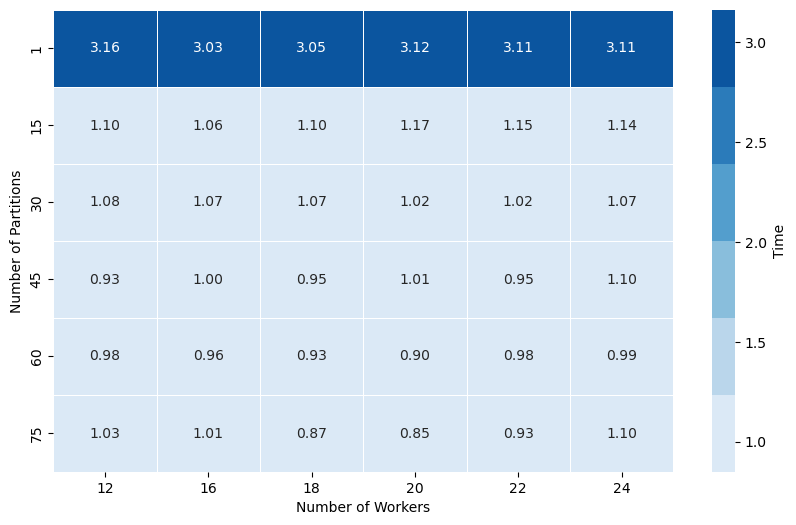

In [24]:
# Pivot the DataFrame to create a multi-layer heatmap
heatmap_data = df.pivot_table(index='Partition', columns='Worker', values='Time', aggfunc=np.mean)

# Create a color map for the heatmaps
cmap = sns.color_palette("Blues")

# Plot the multi-layer heatmaps
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap=cmap, linewidths=0.5, ax=ax, cbar_kws={'label': 'Time'})

# Set the plot title and labels
ax.set_xlabel('Number of Workers')
ax.set_ylabel('Number of Partitions')

# Add bar labels along the X and Y axes
ax.set_xticklabels(heatmap_data.columns)
ax.set_yticklabels(heatmap_data.index)

# Show the plot
plt.show()


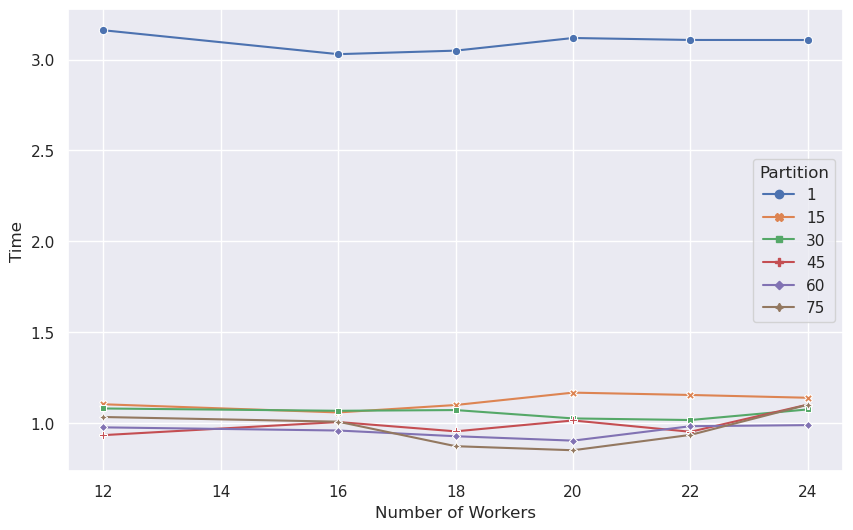

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot the DataFrame to create a multi-layer heatmap
heatmap_data = df.pivot_table(index='Worker', columns='Partition', values='Time', aggfunc=np.mean)

# Set the style for the plot
sns.set(style="darkgrid")

# Create the line plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.lineplot(data=heatmap_data, dashes=False, markers=True)

# Set the plot title and labels
ax.set_xlabel('Number of Workers')
ax.set_ylabel('Time')

# Add a legend
ax.legend(title='Partition')

# Show the plot
plt.show()


In [26]:
client.close()
cluster.close()